In [62]:
%matplotlib inline
import pandas as pd

In [1]:
from importlib import reload

In [3]:
import RunDailyEtapasHistogramBuilder

Enter the date to analyze: 2017-03-01
Enter the vehicle to analyze: BUS


In [16]:
reload(RunDailyEtapasHistogramBuilder)

Enter the date to analyze: 2017-03-01
Enter the vehicle to analyze: BUS


<module 'RunDailyEtapasHistogramBuilder' from 'C:\\Users\\Tesista\\Desktop\\Evasion\\01_analisis\\04_scripts\\TSAnalysis\\RunDailyEtapasHistogramBuilder.py'>

In [17]:
etapas_df=RunDailyEtapasHistogramBuilder.loadSimplifiedEtapas()

In [18]:
cleanEtapas_df = RunDailyEtapasHistogramBuilder.cleanDataFrame(etapas_df)

In [19]:
sorted_df = RunDailyEtapasHistogramBuilder.sortDataFrame(cleanEtapas_df)

In [20]:
sorted_df[:50]

,id,nviaje,tipo_transporte,t_subida,servicio_subida,par_subida,sitio_subida
441584,680052763,1,BUS,2017-03-01 19:03:36,F07 00R,L-34-22-18-SN,BBJZ-74
90373,51794146,3,BUS,2017-03-01 20:40:31,F07 00R,L-34-22-18-SN,BBJZ-74
1708881,3304111834,3,BUS,2017-03-01 20:40:36,F07 00R,L-34-22-18-SN,BBJZ-74
267984,231020710,2,BUS,2017-03-01 17:55:19,F07 00R,L-34-22-22-SN,BBJZ-74
2257957,4018811323,2,BUS,2017-03-01 19:06:07,F07 00R,L-34-22-22-SN,BBJZ-74
1995686,3575882174,2,BUS,2017-03-01 19:06:12,F07 00R,L-34-22-22-SN,BBJZ-74
613032,1149895092,2,BUS,2017-03-01 20:44:11,F07 00R,L-34-22-22-SN,BBJZ-74
35707,27366098,1,BUS,2017-03-01 19:52:22,F07 00I,L-34-23-10-SN,BBJZ-74
2080533,3858820371,1,BUS,2017-03-01 19:52:25,F07 00I,L-34-23-10-SN,BBJZ-74
1073043,2461932524,2,BUS,2017-03-01 17:48:45,F07 00R,L-34-23-15-NS,BBJZ-74


In [22]:
sorted_df['t_subida'] = pd.to_datetime(sorted_df.t_subida)
sorted_df['diferencia_tiempo'] = (sorted_df['t_subida']-sorted_df['t_subida'].shift()).fillna(0)

In [24]:
sorted_df.head(50)

,id,nviaje,tipo_transporte,t_subida,servicio_subida,par_subida,sitio_subida,diferencia_tiempo
441584,680052763,1,BUS,2017-03-01 19:03:36,F07 00R,L-34-22-18-SN,BBJZ-74,00:00:00
90373,51794146,3,BUS,2017-03-01 20:40:31,F07 00R,L-34-22-18-SN,BBJZ-74,01:36:55
1708881,3304111834,3,BUS,2017-03-01 20:40:36,F07 00R,L-34-22-18-SN,BBJZ-74,00:00:05
267984,231020710,2,BUS,2017-03-01 17:55:19,F07 00R,L-34-22-22-SN,BBJZ-74,-1 days +21:14:43
2257957,4018811323,2,BUS,2017-03-01 19:06:07,F07 00R,L-34-22-22-SN,BBJZ-74,01:10:48
1995686,3575882174,2,BUS,2017-03-01 19:06:12,F07 00R,L-34-22-22-SN,BBJZ-74,00:00:05
613032,1149895092,2,BUS,2017-03-01 20:44:11,F07 00R,L-34-22-22-SN,BBJZ-74,01:37:59
35707,27366098,1,BUS,2017-03-01 19:52:22,F07 00I,L-34-23-10-SN,BBJZ-74,-1 days +23:08:11
2080533,3858820371,1,BUS,2017-03-01 19:52:25,F07 00I,L-34-23-10-SN,BBJZ-74,00:00:03
1073043,2461932524,2,BUS,2017-03-01 17:48:45,F07 00R,L-34-23-15-NS,BBJZ-74,-1 days +21:56:20


In [25]:
sorted_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2210399 entries, 441584 to 1879914
Data columns (total 8 columns):
id                   int64
nviaje               int64
tipo_transporte      object
t_subida             datetime64[ns]
servicio_subida      object
par_subida           object
sitio_subida         object
diferencia_tiempo    timedelta64[ns]
dtypes: datetime64[ns](1), int64(2), object(4), timedelta64[ns](1)
memory usage: 231.8+ MB


In [26]:
sorted_df.describe()

,id,nviaje,diferencia_tiempo
count,2.210399e+06,2.210399e+06,2210399
mean,2.243174e+09,1.609886e+00,-1 days +23:59:59.984329
std,1.295933e+09,8.542486e-01,0 days 03:37:28.859989
min,5.454520e+05,1.000000e+00,-1 days +00:20:45
25%,9.353160e+08,1.000000e+00,0 days 00:00:01
50%,2.511616e+09,1.000000e+00,0 days 00:00:03
75%,3.379284e+09,2.000000e+00,0 days 00:00:31
max,4.293306e+09,1.900000e+01,0 days 23:40:04


In [27]:
sortedDataFrame = cleanEtapas_df.sort_values(['sitio_subida', 't_subida'], ascending=[True, True])

In [28]:
sortedDataFrame.head(50)

,id,nviaje,tipo_transporte,t_subida,servicio_subida,par_subida,sitio_subida
1863684,3552888222,1,BUS,2017-03-01 17:39:47,F07 00R,L-34-89-2-PO,BBJZ-74
1203472,2529602798,1,BUS,2017-03-01 17:44:11,F07 00R,L-34-53-25-PO,BBJZ-74
1598210,3169360958,1,BUS,2017-03-01 17:44:13,F07 00R,L-34-53-25-PO,BBJZ-74
930514,2140206880,2,BUS,2017-03-01 17:44:16,F07 00R,L-34-53-25-PO,BBJZ-74
1571797,3149482742,1,BUS,2017-03-01 17:46:33,F07 00R,L-34-53-40-PO,BBJZ-74
1073043,2461932524,2,BUS,2017-03-01 17:48:45,F07 00R,L-34-23-15-NS,BBJZ-74
2252041,4015889213,2,BUS,2017-03-01 17:50:01,F07 00R,L-34-23-25-NS,BBJZ-74
1075050,2462653900,2,BUS,2017-03-01 17:50:05,F07 00R,L-34-23-25-NS,BBJZ-74
137827,95205238,3,BUS,2017-03-01 17:50:12,F07 00R,L-34-23-25-NS,BBJZ-74
1207979,2531378219,2,BUS,2017-03-01 17:52:05,F07 00R,L-34-70-10-PO,BBJZ-74


In [29]:
sortedDataFrame['t_subida'] = pd.to_datetime(sortedDataFrame.t_subida)
sortedDataFrame['diferencia_tiempo'] = (sortedDataFrame['t_subida']-sortedDataFrame['t_subida'].shift()).fillna(0)

In [30]:
sortedDataFrame.describe()

,id,nviaje,diferencia_tiempo
count,2.210399e+06,2.210399e+06,2210399
mean,2.243174e+09,1.609886e+00,0 days 00:00:00.009316
std,1.295933e+09,8.542486e-01,0 days 00:53:06.415310
min,5.454520e+05,1.000000e+00,-1 days +00:02:31
25%,9.353160e+08,1.000000e+00,0 days 00:00:03
50%,2.511616e+09,1.000000e+00,0 days 00:00:06
75%,3.379284e+09,2.000000e+00,0 days 00:01:27
max,4.293306e+09,1.900000e+01,0 days 19:00:52


In [33]:
+24*60*60

86400

In [34]:
86400/60

1440.0

In [35]:
import datetime

In [37]:
sortedDataFrame['diferencia_tiempo_secs']=sortedDataFrame['diferencia_tiempo'].total_seconds()

AttributeError: 'Series' object has no attribute 'total_seconds'

In [38]:
sortedDataFrame['diferencia_tiempo']

1863684   00:00:00
1203472   00:04:24
1598210   00:00:02
930514    00:00:03
1571797   00:02:17
1073043   00:02:12
2252041   00:01:16
1075050   00:00:04
137827    00:00:07
1207979   00:01:53
267984    00:03:14
215284    00:01:08
522061    00:06:53
351163    00:00:05
1115482   00:10:42
1259341   00:00:00
1154366   00:00:24
638758    00:00:24
1968413   00:00:01
1570736   00:00:07
1170158   00:03:25
1564556   00:00:05
1564706   00:01:14
45115     00:02:36
1203919   00:01:50
499222    00:06:35
570336    00:00:04
1577740   00:00:08
1568219   00:06:08
554646    00:19:29
            ...   
1224723   00:00:01
860064    00:02:38
507279    00:00:36
1743258   00:02:04
470000    00:00:02
2276958   00:00:04
552083    00:00:05
464412    00:22:57
1892233   00:00:04
2322808   00:00:03
1262266   00:01:18
821060    00:00:08
1562903   00:00:38
1760676   00:41:50
176570    00:02:25
746454    00:02:18
58773     00:01:14
203710    00:04:16
705782    00:08:45
964428    00:32:46
885606    01:17:06
279832    00

In [42]:
sortedDataFrame['diferencia_tiempo_secs'] = sortedDataFrame['diferencia_tiempo'].dt.total_seconds()

In [43]:
sortedDataFrame.head()

,id,nviaje,tipo_transporte,t_subida,servicio_subida,par_subida,sitio_subida,diferencia_tiempo,diferencia_tiempo_secs
1863684,3552888222,1,BUS,2017-03-01 17:39:47,F07 00R,L-34-89-2-PO,BBJZ-74,00:00:00,0.0
1203472,2529602798,1,BUS,2017-03-01 17:44:11,F07 00R,L-34-53-25-PO,BBJZ-74,00:04:24,264.0
1598210,3169360958,1,BUS,2017-03-01 17:44:13,F07 00R,L-34-53-25-PO,BBJZ-74,00:00:02,2.0
930514,2140206880,2,BUS,2017-03-01 17:44:16,F07 00R,L-34-53-25-PO,BBJZ-74,00:00:03,3.0
1571797,3149482742,1,BUS,2017-03-01 17:46:33,F07 00R,L-34-53-40-PO,BBJZ-74,00:02:17,137.0


In [57]:
sortedDataFrame.plot.hist(by='diferencia_tiempo_secs',bins=1440)

In [52]:
import matplotlib.pyplot as plt

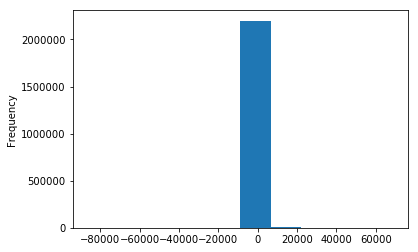

In [65]:
plt.figure()
sortedDataFrame['diferencia_tiempo_secs'].plot.hist(bins=10)

(array([  76953.,  151558.,  317533.,  291696.,  157495.,   93504.,
          57537.,   37502.,   26623.,   20021.,   15706.,   12639.,
          10334.,    8788.,    7566.,    6403.,    5612.,    5102.,
           4467.,    4195.,    3764.,    3495.,    3356.,    3256.,
           3332.,    3214.,    3433.,    3451.,    3729.,    4149.,
           4402.,    4683.,    5044.,    5438.,    5802.,    6127.,
           6296.,    6615.,    6822.,    6907.,    6886.,    6898.,
           6978.,    7002.,    6832.,    6784.,    6737.,    6757.,
           6509.,    6548.,    6419.,    6211.,    6103.,    6015.,
           5767.,    5842.,    5723.,    5571.,    5348.]),
 array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53, 54, 55, 56, 57, 58, 59]),
 <a list of 59 Patch objects>)

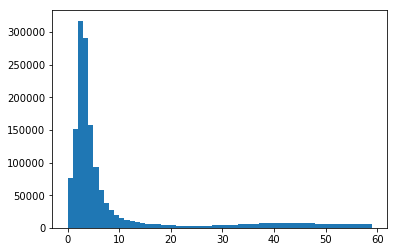

In [82]:
plt.hist(sortedDataFrame['diferencia_tiempo_secs'].values,bins=range(0,1*60,1))

In [75]:
filter(lambda x: x!=0,sortedDataFrame['diferencia_tiempo_secs'].values)

In [85]:
paraderos=sortedDataFrame['par_subida'].values

In [84]:
type(sortedDataFrame['diferencia_tiempo_secs'].values)

numpy.ndarray

In [86]:
diferencia_tiempo_secs=sortedDataFrame['diferencia_tiempo_secs'].values

In [87]:
for i in paraderos:
    print(i)

L-34-89-2-PO
L-34-53-25-PO
L-34-53-25-PO
L-34-53-25-PO
L-34-53-40-PO
L-34-23-15-NS
L-34-23-25-NS
L-34-23-25-NS
L-34-23-25-NS
L-34-70-10-PO
L-34-22-22-SN
L-34-49-130-PO
L-34-49-75-SN
L-34-49-75-SN
T-34-269-NS-20
T-34-269-NS-20
T-34-269-NS-20
T-34-269-NS-20
T-34-269-NS-20
T-34-269-NS-20
L-34-49-20-NS
L-34-49-20-NS
L-34-49-40-NS
L-34-49-80-NS
L-34-49-85-NS
L-34-70-25-OP
L-34-70-25-OP
L-34-70-25-OP
L-34-53-50-OP
L-34-53-40-PO
L-34-53-40-PO
L-34-23-15-NS
L-34-23-15-NS
L-34-23-15-NS
L-34-22-18-SN
L-34-22-22-SN
L-34-22-22-SN
L-34-49-82-SN
L-34-49-70-SN
T-34-269-NS-20
T-34-269-NS-20
T-34-269-NS-20
T-34-269-NS-20
T-34-269-NS-20
T-34-269-NS-20
T-34-269-NS-20
T-34-269-NS-20
T-34-269-NS-20
T-34-269-NS-20
T-34-269-NS-20
T-34-269-NS-20
L-34-49-95-OP
L-34-70-25-OP
L-34-23-10-SN
L-34-23-10-SN
L-34-23-15-NS
L-34-23-25-NS
L-34-23-25-NS
L-34-22-18-SN
L-34-22-18-SN
L-34-22-22-SN
L-34-49-130-PO
L-34-49-115-PO
L-34-49-70-SN
T-34-269-NS-20
T-34-269-NS-20
T-34-269-NS-20
T-34-269-NS-20
T-34-269-NS-20
T-34-269-

T-34-217-PO-20
L-34-53-40-PO
L-34-53-40-PO
L-34-32-75-SN
L-34-32-35-SN
L-34-30-10-PO
L-34-31-35-OP
L-34-31-35-OP
E-34-270-NS-70
E-34-270-NS-70
E-34-270-NS-70
E-34-270-NS-70
E-34-270-NS-70
E-34-270-NS-70
E-34-270-NS-70
E-34-270-NS-70
E-34-270-NS-70
E-34-270-NS-70
E-34-270-NS-70
E-34-270-NS-70
E-34-270-NS-70
E-34-270-NS-70
E-34-270-NS-70
E-34-270-NS-70
L-34-40-265-PO
L-34-14-60-OP
L-34-14-60-OP
L-34-14-60-OP
L-34-14-30-OP
L-34-80-5-SN
L-34-80-5-SN
L-34-80-5-SN
T-34-443-SN-5
T-34-443-SN-5
L-34-30-33-OP
L-34-30-33-OP
L-34-30-33-OP
L-34-30-33-OP
L-34-30-33-OP
L-34-30-33-OP
L-34-30-33-OP
L-34-40-110-PO
L-34-30-33-OP
L-34-30-33-OP
L-34-30-33-OP
L-34-30-33-OP
L-34-30-33-OP
L-34-5-6-PO
L-34-68-40-SN
L-34-68-40-SN
L-34-68-40-SN
L-34-68-40-SN
L-34-68-40-SN
L-34-68-40-SN
L-34-68-40-SN
L-34-68-40-SN
L-34-68-40-SN
L-34-68-40-SN
L-34-68-30-SN
L-34-68-30-SN
L-34-68-30-SN
L-34-68-30-SN
L-34-68-30-SN
L-34-68-20-SN
L-34-68-20-SN
L-34-34-50-OP
L-34-34-50-OP
L-34-34-50-OP
L-34-34-50-OP
L-34-34-50-OP
L-34-3

L-34-32-100-SN
L-34-32-100-SN
L-34-32-100-SN
L-34-32-95-SN
L-34-63-75-SN
L-34-63-75-SN
L-34-63-75-SN
L-34-63-75-SN
L-34-63-75-SN
L-34-79-30-SN
L-34-79-10-SN
L-34-79-10-SN
L-34-79-10-SN
L-34-79-10-SN
T-34-236-SN-25
T-34-236-SN-25
T-34-236-SN-25
T-34-236-SN-25
L-34-30-33-OP
L-34-30-33-OP
L-34-30-33-OP
L-34-30-33-OP
L-34-63-85-SN
L-34-19-20-SN
L-34-19-20-SN
L-34-30-32-PO
L-34-30-32-PO
L-34-30-32-PO
L-34-31-55-OP
L-34-31-55-OP
L-34-31-55-OP
L-34-31-55-OP
L-34-31-55-OP
L-34-31-55-OP
L-34-30-33-OP
L-34-22-20-SN
T-34-236-SN-3
L-34-58-155-SN
L-34-58-155-SN
L-34-30-75-OP
L-34-30-33-OP
L-34-30-33-OP
L-34-30-33-OP
L-34-30-33-OP
L-34-30-33-OP
L-34-30-33-OP
L-34-30-40-OP
L-34-30-35-OP
L-34-32-35-SN
L-34-64-5-OP
L-34-30-20-PO
L-34-30-30-PO
E-34-270-NS-70
L-34-14-60-OP
L-34-14-10-OP
L-34-40-205-OP
L-34-76-10-SN
L-34-31-40-OP
L-34-31-35-OP
L-34-14-60-OP
L-34-14-40-OP
L-34-40-245-OP
L-34-40-245-OP
L-34-40-175-OP
L-34-31-40-OP
L-34-31-40-OP
L-34-31-35-OP
L-34-31-5-OP
E-34-270-NS-70
L-34-14-60-OP
L-34-14

E-17-12-NS-25
E-17-12-NS-25
T-17-12-NS-30
T-17-12-NS-30
T-17-12-NS-35
T-17-12-NS-55
T-19-170-NS-5
T-19-170-NS-5
T-19-170-NS-5
T-19-170-NS-5
T-19-170-NS-10
T-19-170-NS-30
T-19-170-NS-30
T-32-316-OP-30
T-32-316-OP-30
L-32-15-40-PO
T-19-12-SN-15
T-17-12-SN-15
T-17-12-SN-15
E-17-12-SN-35
T-32-316-OP-5
T-32-316-OP-5
T-32-316-PO-1
T-32-316-PO-5
T-32-316-PO-5
T-32-316-PO-10
T-32-316-PO-10
T-32-170-SN-1
T-32-170-SN-1
T-32-170-SN-4
T-32-170-SN-4
T-32-170-SN-4
T-32-170-SN-7
T-32-170-SN-10
T-32-170-SN-20
T-19-170-SN-25
T-19-170-SN-25
T-19-167-OP-5
T-17-12-SN-33
T-17-12-SN-33
T-17-12-SN-33
T-17-12-SN-33
T-17-12-SN-33
T-17-12-NS-55
T-19-170-NS-5
T-19-170-NS-5
T-19-170-NS-5
T-19-170-NS-5
T-32-170-NS-45
T-32-170-NS-50
T-32-170-NS-50
T-32-170-NS-50
T-32-170-NS-50
T-32-170-NS-50
T-32-170-NS-50
T-32-170-NS-50
T-32-316-OP-5
T-32-316-OP-5
T-32-316-OP-5
T-32-316-OP-5
T-32-316-OP-5
T-32-316-OP-5
T-32-316-OP-5
T-32-316-OP-5
T-32-316-OP-10
T-32-316-OP-10
T-32-316-OP-10
T-32-316-OP-10
T-32-316-OP-10
T-32-316-O

L-18-22-25-OP
L-18-22-25-OP
L-18-22-25-OP
L-18-22-5-OP
L-18-22-5-OP
L-18-22-5-OP
E-14-170-SN-5
E-14-170-SN-5
T-14-170-SN-25
T-14-170-SN-25
T-14-170-SN-25
T-14-170-SN-15
T-14-170-SN-15
T-14-170-SN-15
T-14-170-SN-15
T-14-170-SN-15
L-14-4-25-OP
L-14-4-25-OP
L-14-4-10-OP
T-14-170-SN-10
T-14-170-SN-7
T-14-170-SN-7
T-14-170-SN-7
T-14-170-SN-7
T-14-170-SN-7
T-14-170-SN-7
T-14-170-SN-7
T-14-170-SN-7
T-14-170-SN-7
T-14-170-SN-7
T-14-170-SN-7
T-14-170-SN-7
T-14-170-SN-7
T-14-170-SN-7
T-14-170-SN-7
T-17-482-OP-5
T-17-482-OP-5
T-17-482-OP-5
T-17-482-OP-5
T-17-482-OP-5
T-17-482-OP-5
T-17-482-OP-5
T-17-482-OP-5
T-17-482-OP-5
T-17-482-OP-5
T-17-482-OP-5
T-3-12-OP-70
T-3-12-OP-70
T-3-12-OP-75
T-6-45-OP-20
T-6-45-OP-20
T-6-45-OP-20
T-6-45-OP-31
T-6-281-PO-1
T-6-41-NS-10
L-6-5-45-OP
T-6-7-PO-20
T-6-45-PO-33
T-2-7-PO-7
T-2-7-PO-7
T-2-7-PO-7
T-4-12-PO-35
T-4-12-PO-35
T-14-492-PO-5
T-14-492-PO-5
T-14-492-PO-5
T-14-492-PO-5
T-14-128-PO-40
T-14-128-PO-40
T-19-170-NS-30
T-19-170-NS-30
T-32-316-OP-30
T-32-316-

T-15-136-OP-25
T-15-136-OP-25
T-17-136-OP-5
T-17-136-OP-5
T-17-136-OP-5
T-17-136-OP-5
T-17-136-OP-15
T-17-136-OP-15
T-17-136-OP-15
L-17-10-45-NS
L-17-10-45-NS
L-17-33-7-NS
L-17-33-10-NS
L-17-33-25-NS
L-17-33-35-NS
L-17-33-35-NS
T-17-148-NS-5
E-14-170-SN-10
E-14-170-SN-10
E-14-170-SN-10
E-14-170-SN-10
T-19-116-PO-10
T-19-116-PO-10
T-19-116-PO-15
T-19-116-PO-20
T-19-116-PO-30
L-17-33-65-SN
L-17-33-65-SN
T-17-148-SN-10
L-17-33-5-SN
L-17-33-5-SN
L-17-22-5-SN
T-17-136-PO-40
T-17-136-PO-40
T-17-136-PO-40
T-17-136-PO-55
T-17-136-PO-55
T-17-136-PO-55
L-17-35-5-PO
L-17-35-20-PO
L-16-17-19-PO
L-16-17-10-PO
L-16-17-5-PO
T-16-136-OP-15
T-16-136-OP-25
T-16-136-OP-35
T-16-136-OP-35
T-16-136-OP-35
T-16-136-OP-35
T-16-136-OP-35
T-16-136-OP-35
T-15-136-OP-3
T-15-136-OP-15
T-15-136-OP-15
T-15-136-OP-25
T-15-136-OP-25
T-15-136-OP-25
T-15-136-OP-25
T-15-136-OP-25
T-15-136-OP-25
T-15-136-OP-25
T-15-136-OP-25
T-15-136-OP-25
T-15-136-OP-25
T-17-136-OP-5
T-17-136-OP-5
T-17-136-OP-5
T-17-136-OP-15
L-17-10-15-N

T-2-7-PO-7
T-2-7-PO-7
T-2-7-PO-7
T-2-7-PO-7
T-2-7-PO-7
T-2-7-PO-7
T-2-7-PO-7
T-2-7-PO-7
T-2-7-PO-7
T-2-7-PO-7
T-2-7-PO-7
T-2-7-PO-7
T-2-7-PO-10
T-2-7-PO-15
T-2-7-PO-15
T-2-7-PO-15
T-2-7-PO-15
T-2-7-PO-20
T-2-7-PO-20
T-2-7-PO-25
T-2-7-PO-25
T-2-7-PO-25
T-2-7-PO-25
T-2-7-PO-25
T-2-7-PO-25
T-2-7-PO-25
T-2-7-PO-25
T-2-7-PO-25
T-2-7-PO-25
T-2-7-PO-30
T-2-7-PO-35
T-2-7-PO-35
T-2-7-PO-35
T-2-7-PO-40
T-2-7-PO-40
T-2-7-PO-40
T-2-7-PO-40
T-2-7-PO-40
T-2-7-PO-40
T-4-12-PO-5
T-4-12-PO-5
T-4-12-PO-12
T-4-12-PO-12
T-4-12-PO-12
T-4-12-PO-12
T-4-12-PO-12
T-4-12-PO-12
T-4-12-PO-12
T-4-12-PO-15
T-4-12-PO-15
T-4-12-PO-15
T-14-492-PO-5
T-14-128-PO-40
T-14-128-PO-40
T-14-128-PO-40
L-14-5-3-NS
L-18-11-20-NS
L-18-2-10-NS
L-18-2-10-NS
L-18-2-10-NS
L-18-2-10-NS
L-18-2-15-NS
L-18-2-15-NS
L-18-2-15-NS
L-18-2-15-NS
L-32-9-5-NS
L-32-9-5-NS
L-32-9-5-NS
L-32-9-5-NS
L-32-2-5-NS
L-32-2-5-NS
L-32-2-5-NS
L-32-2-5-NS
L-32-2-5-NS
L-32-2-5-NS
L-32-2-5-NS
L-32-2-5-NS
L-32-2-5-NS
L-32-2-5-NS
L-32-2-15-NS
L-32-2-15-NS
L-32-2-

T-15-135-OP-30
T-15-135-OP-40
T-15-135-OP-40
T-15-135-OP-40
T-15-135-OP-60
T-15-135-OP-65
T-15-135-OP-65
T-15-135-OP-65
T-15-135-OP-65
T-15-135-OP-65
T-15-135-OP-75
T-15-135-OP-82
T-15-135-OP-90
T-15-135-OP-90
T-15-135-OP-90
T-15-135-OP-90
T-15-12-SN-25
T-15-12-SN-25
T-15-12-SN-25
T-15-12-SN-25
T-15-12-SN-25
T-3-12-OP-20
T-3-12-OP-25
T-3-12-OP-25
T-3-12-OP-25
T-3-12-OP-30
T-6-45-OP-25
L-6-43-20-SN
L-6-43-20-SN
L-6-43-15-SN
L-6-43-15-SN
L-6-43-15-SN
L-6-43-15-SN
L-6-43-10-SN
L-6-43-10-SN
L-6-43-10-SN
L-6-43-10-SN
L-6-36-10-PO
L-6-36-10-PO
L-6-36-10-PO
L-6-36-10-PO
L-6-36-10-PO
L-6-36-10-PO
L-6-36-15-PO
L-6-44-30-NS
T-6-45-PO-5
T-6-45-PO-7
T-6-45-PO-7
T-6-45-PO-13
T-6-45-PO-27
T-6-45-PO-33
T-6-330-NS-5
T-6-330-NS-10
T-6-330-NS-10
T-2-7-PO-7
T-2-7-PO-7
T-2-7-PO-7
T-2-7-PO-7
T-2-7-PO-15
T-2-7-PO-25
T-2-7-PO-25
T-2-7-PO-30
T-4-12-PO-12
T-4-12-PO-12
T-4-12-PO-12
T-4-12-PO-12
T-4-12-PO-12
T-4-12-PO-12
T-4-12-PO-12
T-4-12-PO-12
T-4-12-PO-12
T-4-12-PO-12
T-4-12-PO-12
T-4-12-PO-12
T-4-12-PO-12
T

E-17-12-NS-25
E-17-12-NS-25
E-17-12-NS-25
E-17-12-NS-25
E-17-12-NS-25
E-17-12-NS-25
E-17-12-NS-25
E-17-12-NS-25
E-17-12-NS-25
T-17-12-NS-30
T-17-12-NS-30
T-17-12-NS-30
T-17-12-NS-35
T-17-12-NS-40
T-17-12-NS-40
T-17-12-NS-40
T-17-12-NS-40
T-17-12-NS-45
T-17-12-NS-45
T-17-12-NS-50
T-17-12-NS-50
T-17-12-NS-50
T-17-12-NS-50
T-17-12-NS-50
T-17-12-NS-55
T-17-12-NS-55
T-17-12-NS-55
T-17-12-NS-55
T-19-170-NS-30
T-19-170-NS-30
L-32-33-15-NS
T-32-170-NS-26
L-32-2-35-OP
L-32-12-5-NS
L-32-15-35-OP
L-33-41-5-OP
L-32-33-95-SN
L-32-33-70-SN
L-32-33-70-SN
L-32-33-70-SN
L-32-33-55-SN
L-32-33-55-SN
T-32-170-SN-10
T-32-170-SN-20
L-18-22-25-OP
L-18-22-25-OP
L-18-22-25-OP
T-14-170-SN-15
T-14-170-SN-15
E-14-110-SN-75
E-14-110-SN-75
T-14-128-OP-30
T-14-128-OP-30
T-14-128-OP-30
T-14-128-OP-30
T-14-128-OP-30
T-14-128-OP-30
T-14-128-OP-30
T-14-128-OP-30
T-14-128-OP-30
T-14-128-OP-30
T-14-128-OP-30
T-14-128-OP-30
T-14-128-OP-30
T-14-128-OP-30
T-14-128-OP-30
T-14-128-OP-60
T-14-128-OP-60
T-14-128-OP-60
T-14-128-O

T-17-414-SN-5
T-17-414-SN-5
L-17-31-15-SN
L-17-10-15-NS
L-17-10-15-NS
L-17-10-25-NS
L-17-10-25-NS
L-17-33-10-NS
L-17-33-10-NS
T-17-148-NS-5
E-14-170-SN-10
E-14-170-SN-10
E-14-170-SN-10
E-14-170-SN-10
E-14-170-SN-10
E-14-170-SN-10
E-14-170-SN-10
E-14-170-SN-10
E-14-170-SN-10
L-17-33-45-SN
L-17-33-5-SN
T-17-136-PO-40
L-16-17-30-PO
L-16-17-30-PO
L-16-17-5-PO
L-16-17-5-PO
L-16-17-5-PO
T-16-136-OP-25
T-16-136-OP-30
T-16-136-OP-35
T-16-136-OP-40
T-15-136-OP-10
T-15-136-OP-20
T-15-136-OP-20
T-15-136-OP-25
T-15-136-OP-25
T-15-136-OP-25
T-15-136-OP-25
T-15-136-OP-25
T-17-136-OP-15
T-17-136-OP-15
T-17-136-OP-15
T-17-136-OP-15
T-17-136-OP-15
T-17-136-OP-15
T-17-136-OP-15
T-17-136-OP-15
L-17-10-5-NS
L-17-33-7-NS
L-17-33-7-NS
L-17-33-30-NS
L-17-33-35-NS
T-17-116-OP-30
E-14-170-SN-10
E-14-170-SN-10
E-14-170-SN-10
T-19-116-PO-20
L-17-33-65-SN
L-17-33-65-SN
L-17-33-65-SN
T-17-148-SN-10
T-17-148-SN-10
T-17-148-SN-10
L-17-10-30-SN
T-17-136-PO-40
T-17-136-PO-40
T-17-136-PO-40
T-17-136-PO-55
T-17-136-PO-5

T-15-12-NS-5
T-15-12-NS-20
T-15-12-NS-20
T-15-12-NS-20
E-17-12-NS-25
E-17-12-NS-25
T-6-41-SN-5
T-6-41-SN-5
T-6-41-SN-5
T-6-41-SN-5
T-6-41-SN-5
T-6-41-SN-10
T-6-41-SN-10
T-6-41-SN-10
T-6-41-SN-10
T-6-41-SN-10
T-6-41-SN-10
T-6-41-SN-15
T-6-41-SN-15
T-6-41-SN-15
T-6-41-SN-15
T-6-45-PO-5
T-6-45-PO-13
T-6-45-PO-27
T-6-45-PO-27
T-6-45-PO-33
T-6-45-PO-33
T-6-45-PO-33
T-6-45-PO-33
T-6-330-NS-10
T-6-330-NS-10
T-6-330-NS-10
T-6-330-NS-10
T-6-330-NS-10
T-6-330-NS-10
T-2-7-PO-40
T-4-12-PO-5
T-4-12-PO-12
T-4-12-PO-12
T-4-12-PO-12
T-4-12-PO-12
T-4-12-PO-12
T-4-12-PO-20
T-4-12-PO-20
T-3-433-PO-10
T-3-433-OP-10
L-3-2-20-OP
T-3-12-OP-40
L-2-6-40-OP
L-2-6-25-OP
L-2-6-25-OP
L-2-6-25-OP
T-6-281-OP-1
T-6-41-SN-15
T-6-41-SN-15
T-6-41-SN-15
T-6-41-SN-15
T-6-45-PO-5
T-6-45-PO-5
T-6-45-PO-5
T-6-45-PO-7
T-6-45-PO-7
T-6-45-PO-7
T-6-45-PO-7
T-6-45-PO-7
T-6-45-PO-27
T-6-330-NS-10
T-6-330-SN-3
T-6-330-SN-3
T-6-330-SN-3
T-6-330-SN-3
T-6-330-SN-3
T-6-330-SN-3
T-6-330-SN-3
T-6-330-SN-3
T-6-330-SN-3
T-6-330-SN-3
T-6-33

E-20-53-OP-70
E-20-53-OP-70
E-20-53-OP-90
E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
T-7-53-OP-15
T-7-53-OP-15
E-7-53-OP-35
E-7-53-OP-35
E-9-53-OP-10
E-9-53-OP-10
E-9-53-OP-10
L-9-7-60-OP
L-9-7-5-OP
L-9-7-5-OP
L-9-7-5-OP
L-9-7-5-OP
L-9-7-5-OP
L-9-7-5-OP
L-10-23-60-OP
T-10-310-NS-5
T-10-310-NS-5
T-10-310-NS-5
T-10-310-NS-1
T-10-310-NS-1
T-10-310-NS-1
T-10-310-NS-1
T-10-310-NS-1
T-10-310-NS-1
T-10-310-NS-3
T-10-310-NS-3
T-10-310-NS-3
T-10-310-NS-6
T-10-310-NS-7
T-10-310-NS-7
T-10-310-NS-7
T-10-310-NS-7
L-10-43-10-NS
L-10-43-10-NS
L-10-43-10-NS
L-10-43-10-NS
L-10-43-10-NS
L-10-43-10-NS
T-10-314-PO-10
L-10-23-35-PO
L-10-23-55-PO
L-10-23-55-PO
L-10-23-75-PO
L-10-23-75-PO
E-7-53-PO-20
E-20-53-PO-65
E-20-53-PO-115
T-14-128-PO-25
T-14-128-PO-25
T-14-128-PO-25
T-14-128-PO-25
T-14-128-PO-25
T-14-110-PO-4
T-14-110-PO-4
T-14-110-PO-15
T-14-110-PO-15
T-14-110-PO-23
T-14-110-PO-35
T-14-110-PO-35
T-14-110-PO-35
T-14-110-PO-35
T-14-110-PO-35
T-14-110-PO-35
T-14-110-PO-35
T-14-110-PO-35
T-14-110-PO-3

T-3-13-NS-15
T-3-13-NS-15
T-3-13-NS-15
T-3-13-NS-15
T-3-13-NS-20
T-3-13-NS-20
T-3-13-NS-20
T-3-13-NS-20
T-3-13-NS-20
T-3-13-NS-20
T-3-13-NS-20
T-3-13-NS-20
T-3-13-NS-20
T-3-13-NS-20
T-4-16-NS-5
T-4-16-NS-5
T-4-16-NS-5
L-4-18-110-OP
L-4-18-110-OP
L-4-18-110-OP
L-4-18-110-OP
L-4-18-110-OP
L-4-18-110-OP
L-4-18-110-OP
L-4-18-95-OP
L-4-18-95-OP
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
L-4-18-1

T-17-139-OP-5
T-17-139-OP-5
T-17-139-OP-7
T-17-139-OP-13
T-17-139-OP-13
T-17-139-OP-30
T-17-139-OP-30
T-17-139-OP-30
T-17-139-OP-30
T-17-139-OP-30
T-17-139-OP-30
T-17-116-OP-5
T-17-116-OP-5
T-17-116-OP-25
T-17-116-OP-30
T-17-116-OP-30
T-17-116-OP-30
T-17-116-OP-30
T-17-116-OP-30
T-17-116-OP-30
T-17-116-OP-30
T-17-116-OP-30
E-14-116-OP-3
E-14-116-OP-3
E-14-116-OP-3
E-14-116-OP-3
E-14-116-OP-3
E-14-116-OP-3
T-14-116-OP-20
T-14-116-OP-25
T-14-116-OP-30
T-14-116-OP-35
T-14-116-OP-35
T-14-116-OP-35
T-14-116-OP-35
T-14-116-OP-45
T-14-116-OP-45
T-14-116-OP-45
T-14-116-OP-45
T-14-116-OP-45
T-14-116-OP-45
T-14-116-OP-45
T-14-116-OP-50
T-14-116-OP-55
T-14-116-OP-55
T-14-116-OP-55
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-129-PO-5
T-14-129-PO-5
T-14-129-PO-5
T-14-129-PO-5
T-14-129-PO-10
T-14-129-PO-10
T-14-129-PO-10
T-14-129-PO-10
T-14-129-PO-10
T-14-129-PO-10
T-14-129-PO-15
T-14-129-PO-15
T-14-129-PO-15
T-14-129-P

L-10-48-30-PO
L-10-48-30-PO
L-10-48-30-PO
L-10-48-30-PO
L-10-48-30-PO
L-10-25-15-NS
L-10-25-45-NS
L-10-25-55-NS
T-10-79-PO-15
T-10-79-PO-15
T-10-79-PO-15
T-10-79-PO-15
T-10-79-PO-10
T-10-75-SN-3
T-10-75-SN-3
T-10-75-SN-3
L-10-28-15-PO
L-10-28-15-PO
E-7-53-PO-10
T-7-53-PO-37
T-7-53-PO-37
T-7-53-PO-37
E-7-53-PO-55
E-7-53-PO-90
E-7-53-PO-90
E-7-53-PO-90
T-20-53-PO-16
T-20-53-OP-55
T-20-53-OP-55
T-20-53-OP-55
T-20-53-OP-55
T-20-53-OP-55
T-20-53-OP-55
T-20-53-OP-55
T-20-53-OP-55
T-20-53-OP-55
T-20-53-OP-55
T-20-53-OP-55
E-20-53-OP-70
E-20-53-OP-70
E-20-53-OP-85
E-20-53-OP-85
E-20-53-OP-85
E-20-53-OP-85
E-20-53-OP-110
E-20-53-OP-110
E-20-53-OP-125
E-20-53-OP-125
E-20-53-OP-125
E-20-53-OP-125
E-20-53-OP-125
E-20-53-OP-125
E-20-53-OP-125
E-20-53-OP-125
E-20-53-OP-125
E-20-53-OP-125
T-7-53-OP-15
T-7-53-OP-15
T-7-53-OP-25
E-7-53-OP-35
E-9-53-OP-20
E-9-53-OP-20
E-9-53-OP-20
E-9-53-OP-20
E-9-53-OP-20
E-9-53-OP-20
E-9-53-OP-20
E-9-53-OP-20
T-7-54-OP-15
L-7-53-5-OP
L-10-28-10-OP
L-10-28-10-OP
L-10-2

T-20-189-OP-20
T-20-189-OP-20
T-20-189-OP-27
T-20-189-OP-27
T-20-189-OP-27
T-20-189-OP-27
T-20-189-OP-27
T-20-189-OP-35
E-20-189-OP-40
T-20-177-OP-8
T-7-48-OP-25
T-7-48-OP-55
T-7-48-OP-55
T-13-101-OP-7
T-13-54-NS-25
T-13-54-NS-25
T-13-54-NS-30
T-13-54-NS-30
T-13-54-NS-35
T-13-54-NS-35
T-13-54-NS-35
T-13-54-NS-60
T-13-54-NS-60
T-13-54-NS-65
T-13-54-NS-65
T-13-54-NS-65
T-13-54-NS-65
T-13-54-NS-70
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
T-13-54-NS-90
T-13-54-NS-90
T-13-54-NS-90
T-13-103-OP-10
L-13-24-5-PO
L-13-24-5-PO
L-13-24-5-PO
L-13-24-5-PO
L-13-24-5-PO
L-13-109-20-NS
L-13-3-80-OP
L-13-3-65-OP
L-13-3-60-OP
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
T-13-54-SN-25
T-13-54-SN-60
T-13-54-SN-60
T-7-48-PO-15
E-20-189-PO-5
E-20-189-PO-5
E-20-189-PO-5
E-20-189-PO-5
E-20-189-PO-5
E-20-189-PO-5
E-20-189-PO-5
E-20-189-PO-5
T-20-189-PO-10
T-20-189-PO-10
T-20-189-PO-25
T-20-189-PO-30
E-18-1

L-32-30-40-OP
L-32-30-40-OP
L-32-30-40-OP
L-32-30-25-OP
L-31-6-10-OP
L-31-6-10-OP
L-31-6-10-OP
L-31-6-10-OP
L-31-12-10-SN
L-31-12-10-SN
L-31-23-35-SN
L-31-23-5-SN
L-31-19-105-OP
L-31-20-35-SN
L-31-20-15-SN
L-31-20-15-SN
L-31-20-5-SN
L-31-20-5-SN
L-31-20-5-SN
L-31-20-5-SN
L-18-18-45-SN
L-18-18-35-SN
L-18-18-25-SN
L-18-18-15-SN
L-18-18-5-SN
L-18-18-5-SN
T-18-161-SN-2
T-18-161-SN-2
T-18-157-OP-20
T-18-157-OP-20
T-18-157-OP-20
T-18-157-OP-35
T-18-157-OP-35
T-18-157-OP-35
T-18-157-OP-40
T-18-157-OP-40
T-18-157-OP-43
T-18-157-OP-43
T-18-157-OP-43
T-18-157-OP-43
T-18-157-OP-43
T-18-157-OP-43
T-18-157-OP-50
T-18-157-OP-50
T-18-157-OP-50
T-18-157-OP-55
T-18-157-OP-55
T-18-157-OP-55
T-18-157-OP-60
T-18-157-OP-60
T-18-157-OP-60
T-18-157-OP-65
T-18-157-OP-65
T-18-157-OP-65
T-18-157-OP-65
T-18-157-OP-65
T-18-157-OP-70
T-18-157-OP-70
T-18-157-OP-75
T-18-130-SN-10
T-18-130-SN-10
T-18-130-SN-10
T-18-130-SN-15
T-14-130-SN-10
T-14-130-SN-10
T-14-130-SN-10
T-14-130-SN-10
T-14-130-SN-10
T-14-130-SN-25
E-2

L-11-10-5-OP
L-11-10-5-OP
L-11-10-5-OP
L-11-10-5-OP
L-11-10-5-OP
L-11-10-5-OP
L-11-10-5-OP
L-11-10-5-OP
L-11-10-5-OP
T-11-86-OP-5
T-11-85-PO-3
T-11-85-PO-3
L-11-18-15-PO
L-11-18-25-PO
L-11-18-30-OP
L-11-18-30-OP
L-11-17-10-NS
L-11-17-10-NS
L-11-17-10-NS
L-11-17-10-NS
T-11-84-NS-20
T-11-84-NS-20
T-11-75-NS-5
T-11-75-NS-7
T-11-75-NS-7
T-11-75-NS-7
T-11-75-NS-7
L-11-7-25-NS
L-9-13-30-SN
L-9-13-30-SN
L-9-13-30-SN
E-9-71-OP-32
L-11-1-5-SN
L-11-1-5-SN
L-11-5-5-PO
L-11-5-5-PO
L-11-5-5-PO
T-11-83-SN-10
T-11-83-SN-10
T-11-83-NS-15
T-11-318-PO-5
L-11-12-30-PO
L-11-12-35-PO
L-11-10-30-PO
L-11-10-35-OP
L-8-12-15-PO
L-8-12-25-PO
L-8-12-25-PO
L-8-12-25-PO
L-8-12-35-PO
L-8-12-35-PO
L-8-12-45-OP
L-8-12-55-PO
L-8-12-75-OP
T-8-64-PO-50
T-8-66-PO-20
T-20-66-PO-7
T-20-66-PO-27
T-20-188-NS-10
T-20-188-NS-10
T-20-334-OP-5
E-20-53-OP-105
E-20-53-OP-105
E-20-53-OP-105
T-20-197-SN-2
T-20-197-SN-10
T-8-59-OP-4
T-8-59-OP-4
T-8-59-OP-4
T-8-59-OP-4
T-8-59-OP-4
L-8-12-60-OP
L-8-12-60-OP
T-11-83-NS-20
L-11-12-25-PO


T-20-182-PO-25
T-20-182-PO-25
T-20-182-PO-25
T-20-182-PO-30
T-20-182-PO-30
T-20-192-PO-35
E-20-53-PO-115
E-20-53-PO-115
E-20-53-PO-115
E-20-53-PO-115
E-20-53-PO-115
E-20-53-PO-115
E-20-53-PO-115
E-20-53-PO-115
E-20-53-PO-115
T-14-128-PO-20
T-14-128-PO-20
T-14-119-NS-15
T-14-119-NS-20
T-18-119-NS-5
T-18-153-PO-10
L-18-26-5-PO
L-18-26-5-PO
T-18-153-PO-18
T-18-153-PO-27
L-18-18-40-NS
L-18-18-40-NS
L-31-20-20-NS
L-31-23-30-NS
L-31-23-30-NS
E-31-12-SN-5
E-31-12-SN-5
E-31-12-SN-5
E-31-12-SN-5
E-31-12-SN-5
E-31-12-SN-5
E-31-12-SN-5
L-32-30-100-OP
L-32-30-90-OP
L-32-30-90-OP
L-32-30-90-OP
L-32-30-80-OP
L-32-30-80-OP
L-32-30-80-OP
L-32-30-60-OP
L-32-30-60-OP
L-32-30-50-OP
L-32-30-50-OP
L-32-30-50-OP
L-32-30-40-OP
L-32-30-40-OP
L-32-30-25-OP
L-31-12-10-SN
L-31-12-10-SN
L-31-7-50-SN
L-31-7-50-SN
T-31-254-SN-40
T-31-254-SN-40
T-31-254-SN-40
T-31-254-SN-40
T-31-254-SN-45
T-31-254-SN-45
T-31-254-SN-45
T-31-254-SN-55
T-31-254-SN-55
T-31-254-SN-55
T-31-127-SN-40
T-31-127-SN-40
T-18-127-SN-5
T-18-127-S

T-10-314-PO-20
L-10-23-75-PO
L-9-7-15-PO
L-9-7-25-PO
L-9-7-35-PO
L-9-3-45-PO
L-9-3-45-PO
L-9-3-45-PO
L-9-3-45-PO
L-9-3-75-PO
L-9-3-75-PO
L-9-3-80-PO
L-9-3-80-PO
L-9-3-90-PO
L-9-3-90-PO
T-8-52-SN-5
T-8-69-PO-5
T-8-69-PO-5
T-8-69-PO-5
T-8-69-PO-5
L-8-15-10-PO
L-8-15-10-PO
L-8-15-15-PO
L-8-15-15-PO
L-8-15-15-PO
T-20-182-PO-10
T-20-182-PO-15
T-20-182-PO-15
T-20-182-PO-20
T-20-182-PO-20
T-20-182-PO-20
T-20-182-PO-20
T-20-182-PO-20
T-20-182-PO-20
T-20-182-PO-20
T-20-182-PO-20
E-20-53-PO-115
T-14-128-PO-20
T-14-128-PO-20
T-14-128-PO-20
T-14-128-PO-20
T-14-128-PO-20
L-32-30-90-OP
L-32-30-90-OP
L-32-30-80-OP
L-32-30-70-OP
L-32-30-70-OP
L-32-30-70-OP
L-32-30-70-OP
L-32-30-60-OP
L-32-30-50-OP
L-32-30-50-OP
L-32-30-50-OP
L-32-30-50-OP
L-32-40-5-SN
L-32-40-5-SN
L-32-40-2-SN
L-32-40-2-SN
L-32-40-2-SN
L-32-40-2-SN
L-32-3-80-SN
L-32-3-80-SN
L-32-3-80-SN
L-31-23-25-SN
L-31-7-35-SN
L-31-7-35-SN
L-31-7-25-SN
L-31-7-25-SN
L-31-7-25-SN
L-31-7-15-SN
L-31-7-15-SN
T-31-254-SN-50
T-31-254-SN-50
T-31-254-SN-50


T-20-189-PO-10
T-20-189-PO-10
T-20-189-PO-10
T-20-189-PO-15
T-20-189-PO-15
T-20-189-PO-15
T-20-189-PO-15
T-20-189-PO-15
T-20-189-PO-20
T-20-189-PO-20
T-20-189-PO-20
T-20-189-PO-25
T-20-189-PO-25
T-32-156-PO-37
T-32-156-PO-38
L-32-16-45-OP
T-32-156-OP-1
T-32-156-OP-75
T-32-156-OP-75
T-32-156-OP-75
T-20-189-OP-5
T-20-189-OP-5
T-20-189-OP-5
T-20-189-OP-5
T-20-189-OP-10
T-20-189-OP-15
T-20-189-OP-20
T-20-68-SN-25
T-20-68-SN-25
T-20-68-SN-25
T-20-68-SN-25
T-20-68-SN-25
T-20-68-SN-25
L-10-55-10-PO
L-10-55-5-PO
L-10-21-30-SN
T-10-81-PO-5
T-10-81-PO-15
T-8-64-PO-45
T-20-66-PO-20
T-20-182-PO-36
T-20-182-PO-45
T-20-192-PO-17
T-14-116-PO-20
T-19-116-PO-15
L-11-18-75-PO
L-11-18-75-PO
L-11-18-75-PO
L-11-18-75-PO
L-11-20-20-NS
L-11-20-20-NS
L-11-20-20-NS
L-11-20-20-NS
L-11-20-20-NS
L-11-22-15-NS
L-11-22-15-NS
L-11-22-15-NS
L-11-22-15-NS
L-11-23-5-PO
L-11-23-5-PO
L-11-23-15-PO
L-11-23-15-PO
L-11-23-15-PO
L-11-14-45-NS
L-11-14-45-NS
L-11-14-45-NS
L-11-14-45-NS
L-11-14-45-NS
L-11-14-60-NS
L-11-14-60-NS

T-14-129-PO-15
T-19-116-PO-15
E-14-116-OP-3
T-14-116-OP-10
E-20-192-OP-5
T-20-73-OP-30
T-20-73-OP-55
T-20-59-OP-25
T-8-59-OP-5
T-8-59-OP-5
T-8-59-OP-12
T-8-64-OP-10
E-8-64-OP-20
E-8-64-OP-20
T-8-64-OP-25
T-8-64-OP-25
T-8-64-OP-30
T-8-64-OP-35
T-11-64-OP-15
T-11-64-OP-25
T-11-64-OP-25
L-10-37-30-NS
L-10-37-30-NS
L-10-21-30-SN
L-10-21-30-SN
L-10-21-30-SN
L-10-21-20-SN
L-10-21-20-SN
L-10-21-20-SN
L-10-21-20-SN
L-10-21-10-SN
T-10-311-SN-5
T-10-311-SN-5
T-10-311-SN-5
T-10-311-SN-5
T-10-311-SN-5
T-10-81-PO-2
T-10-312-PO-5
T-10-312-PO-5
T-10-81-PO-10
T-10-81-PO-10
T-10-81-PO-10
T-10-81-PO-10
T-10-81-PO-30
T-10-81-PO-30
T-10-64-PO-10
T-10-64-PO-20
T-11-64-PO-5
T-11-64-PO-5
T-11-64-PO-15
T-11-64-PO-15
T-11-64-PO-15
T-11-64-PO-15
T-11-64-PO-25
T-11-64-PO-25
T-11-64-PO-25
T-11-64-PO-30
T-11-64-PO-30
T-11-64-PO-30
T-11-64-PO-40
T-11-64-PO-40
T-11-64-PO-40
T-11-64-PO-45
T-8-64-PO-5
T-8-64-PO-5
E-8-64-PO-25
T-8-64-PO-45
T-8-64-PO-45
T-8-64-PO-45
T-8-66-PO-7
T-8-66-PO-13
T-8-66-PO-13
T-8-66-PO-20
T-8

T-19-170-SN-25
T-19-167-OP-5
T-19-167-OP-5
T-19-167-OP-5
E-14-170-SN-5
E-14-170-SN-5
E-14-170-SN-5
T-14-170-SN-15
T-14-170-SN-7
T-14-170-SN-7
T-14-170-SN-7
T-14-170-SN-7
T-14-170-SN-7
T-14-170-SN-7
T-14-170-SN-7
T-14-170-SN-7
T-14-170-SN-7
T-14-170-SN-7
T-14-115-OP-5
T-3-12-OP-25
T-3-12-OP-25
T-3-12-OP-30
T-3-12-OP-30
T-3-12-OP-30
T-3-12-OP-30
T-3-12-OP-30
T-3-12-OP-30
T-3-12-OP-30
T-3-12-OP-30
T-3-12-OP-30
T-3-12-OP-60
T-3-12-OP-60
T-3-12-OP-70
T-3-12-OP-70
T-6-45-OP-20
T-6-45-OP-20
T-6-45-OP-20
T-6-45-OP-20
T-6-281-OP-1
T-6-281-OP-1
T-6-43-OP-5
T-6-43-OP-5
T-6-43-OP-5
T-6-43-OP-5
T-6-41-NS-5
T-6-41-NS-5
T-6-41-NS-5
T-6-41-NS-10
T-6-41-NS-10
T-6-41-NS-10
T-6-41-NS-10
T-6-41-NS-10
L-6-50-10-OP
L-6-50-10-OP
L-6-50-10-OP
T-6-7-OP-35
T-6-7-OP-35
L-6-5-45-OP
L-6-31-10-NS
L-6-31-10-NS
L-6-31-10-NS
L-6-5-30-PO
T-6-41-SN-5
T-6-41-SN-5
T-6-41-SN-5
T-6-41-SN-5
T-6-41-SN-10
T-6-41-SN-15
T-6-45-PO-7
T-6-45-PO-33
T-6-45-PO-45
T-6-45-PO-45
T-2-8-SN-36
T-2-8-SN-36
T-4-12-PO-20
T-32-316-OP-30
T-32-31

T-3-12-OP-70
T-3-12-OP-70
T-3-12-OP-70
T-3-12-OP-70
T-6-45-OP-20
T-6-45-OP-20
T-6-281-OP-1
T-6-281-OP-1
T-6-45-OP-40
T-6-45-OP-40
T-6-45-OP-40
L-6-43-20-SN
L-6-43-20-SN
L-6-43-15-SN
L-6-43-15-SN
T-2-7-PO-7
T-2-7-PO-15
T-15-12-NS-20
E-17-12-NS-25
T-19-170-NS-30
L-32-15-20-PO
L-32-15-20-PO
L-32-15-20-PO
L-32-15-20-PO
L-32-15-30-PO
L-32-15-30-PO
L-32-15-30-PO
L-32-15-40-PO
L-32-15-40-PO
L-32-15-40-PO
L-32-15-40-PO
L-32-12-5-SN
L-32-12-5-SN
L-32-2-40-PO
L-32-2-40-PO
L-32-2-40-PO
L-32-2-40-PO
L-32-2-50-PO
L-32-2-50-PO
T-32-170-SN-7
T-32-170-SN-7
T-32-170-SN-7
T-32-170-SN-7
T-32-170-SN-20
T-19-170-SN-25
T-19-12-SN-15
T-19-12-SN-15
T-19-12-SN-15
T-17-12-SN-10
E-17-12-SN-35
E-17-12-SN-35
T-17-12-SN-50
T-17-12-SN-50
T-15-12-SN-10
T-15-12-SN-10
T-15-12-SN-10
T-15-12-SN-10
T-15-12-SN-10
T-15-12-SN-10
T-3-12-OP-5
L-6-43-20-SN
L-6-43-20-SN
L-6-43-20-SN
L-6-43-20-SN
L-6-43-20-SN
L-6-43-15-SN
L-6-43-10-SN
L-6-43-10-SN
L-6-43-10-SN
L-6-43-10-SN
L-6-36-10-PO
L-6-36-10-PO
L-6-36-10-PO
L-6-36-15-PO
L-6-3

L-18-15-20-NS
L-18-15-20-NS
L-18-15-30-NS
L-18-15-30-NS
L-31-22-5-PO
L-31-22-25-PO
L-31-22-25-PO
L-31-22-40-PO
L-31-22-40-PO
L-31-22-40-PO
L-31-22-50-PO
E-31-293-PO-5
E-31-293-PO-5
E-31-293-PO-5
L-32-2-5-NS
L-32-2-25-NS
T-32-170-NS-50
L-32-33-50-NS
L-32-15-20-PO
L-32-15-40-PO
T-32-170-SN-20
T-19-170-SN-5
T-19-170-SN-25
T-19-12-SN-10
T-19-12-SN-15
T-19-12-SN-15
T-19-12-SN-15
T-19-12-SN-15
T-17-12-SN-15
T-17-12-SN-15
T-17-12-SN-15
T-17-12-SN-15
T-17-12-SN-15
T-17-12-SN-20
T-17-12-SN-40
T-17-12-SN-45
T-17-12-SN-50
T-17-12-SN-50
T-15-12-SN-5
T-15-12-SN-10
T-15-12-SN-10
T-15-12-SN-10
T-15-12-SN-10
T-15-12-SN-10
T-15-12-SN-10
T-15-12-SN-25
T-15-12-SN-25
T-15-12-SN-25
T-15-12-SN-25
T-3-12-OP-5
T-3-12-OP-15
T-3-12-OP-25
T-3-12-OP-25
T-3-12-OP-30
T-3-12-OP-30
T-3-12-OP-30
T-3-12-OP-30
T-3-12-OP-30
T-3-12-OP-30
T-3-12-OP-30
T-3-12-OP-30
T-3-12-OP-30
T-3-12-OP-30
T-3-12-OP-45
T-3-12-OP-60
T-3-12-OP-60
T-3-12-OP-60
T-3-12-OP-70
T-3-12-OP-70
T-3-12-OP-70
T-3-12-OP-70
T-3-12-OP-70
T-3-12-OP-70
T-3-1

L-17-22-5-SN
L-17-22-5-SN
L-17-22-5-SN
L-17-22-5-SN
L-17-22-5-SN
L-17-22-5-SN
L-17-22-5-SN
L-16-17-30-PO
L-16-17-30-PO
L-16-17-30-PO
L-16-17-30-PO
L-16-17-30-PO
L-16-17-30-PO
L-16-17-25-PO
L-16-17-25-PO
L-16-17-25-PO
L-16-17-25-PO
L-16-17-25-PO
L-16-17-20-PO
L-16-17-19-PO
L-16-17-19-PO
L-16-17-19-PO
L-16-17-19-PO
L-16-17-10-PO
L-16-17-10-PO
L-16-17-10-PO
L-16-17-5-PO
L-16-17-5-PO
L-16-17-5-PO
L-16-17-5-PO
T-16-136-OP-15
T-16-136-OP-15
T-16-136-OP-30
T-16-136-OP-35
T-16-136-OP-35
T-16-136-OP-35
T-16-136-OP-35
T-16-136-OP-37
T-15-136-OP-10
T-15-136-OP-10
T-15-136-OP-25
T-15-136-OP-25
T-15-136-OP-25
T-15-136-OP-25
T-15-136-OP-25
T-17-136-OP-5
T-17-136-OP-5
T-17-136-OP-15
T-17-136-OP-15
L-17-10-5-NS
L-17-10-15-NS
L-17-10-45-NS
L-17-33-30-NS
L-17-33-35-NS
L-17-33-35-NS
T-17-116-OP-30
T-17-116-OP-30
E-14-170-SN-10
L-17-11-80-PO
L-17-11-80-PO
L-17-11-80-PO
L-17-11-80-PO
L-17-11-80-PO
L-17-11-80-PO
L-17-11-80-PO
L-17-11-80-PO
L-17-11-80-PO
T-17-140-PO-45
T-17-140-PO-45
T-17-140-PO-50
L-17-10-4

T-3-19-NS-10
T-3-19-NS-10
T-3-19-NS-15
T-3-19-NS-15
T-3-19-NS-15
T-3-19-NS-15
T-3-19-NS-15
T-3-19-NS-15
T-3-19-NS-20
T-3-19-NS-20
T-3-19-NS-20
T-3-19-NS-20
T-3-19-NS-20
T-3-19-NS-20
T-3-19-NS-20
T-3-19-NS-20
T-3-19-NS-20
T-3-19-NS-20
T-3-19-NS-20
T-3-19-NS-20
T-3-19-NS-20
T-3-19-NS-20
T-3-19-NS-20
T-3-19-NS-30
T-3-19-NS-30
T-3-19-NS-30
T-3-19-NS-30
T-3-19-NS-30
T-3-19-NS-30
T-3-19-NS-35
T-3-19-NS-35
T-3-19-NS-35
T-3-19-NS-35
T-3-19-NS-35
T-3-19-NS-35
T-3-19-NS-35
T-3-19-NS-35
T-3-19-NS-35
T-3-19-NS-35
T-3-19-NS-35
T-3-19-NS-35
T-3-19-NS-35
T-3-19-NS-35
T-3-19-NS-40
T-4-19-NS-10
T-4-19-NS-25
T-4-19-NS-25
T-4-19-NS-25
T-4-19-NS-25
E-4-19-NS-30
E-4-19-NS-30
E-4-19-NS-30
E-4-19-NS-30
E-4-19-NS-30
E-4-19-NS-30
E-4-19-NS-30
E-4-19-NS-30
E-4-19-NS-30
T-4-19-NS-35
T-4-19-NS-35
T-4-19-NS-40
T-4-19-NS-40
T-4-19-NS-40
E-4-19-NS-45
E-4-19-NS-45
E-4-19-NS-45
E-4-19-NS-45
E-4-19-NS-45
E-4-19-NS-45
E-4-19-NS-45
E-4-19-NS-45
E-4-19-NS-45
E-4-19-NS-45
E-4-19-NS-45
E-4-19-NS-45
E-4-19-NS-45
T-4-19-NS-50

L-34-40-55-OP
L-34-40-55-OP
L-34-40-55-OP
L-34-45-10-SN
L-34-45-10-SN
L-34-45-10-SN
L-34-40-45-OP
L-34-40-45-OP
L-34-40-25-OP
T-34-205-SN-10
T-34-205-SN-10
T-34-205-SN-10
T-34-205-SN-10
T-34-205-SN-10
T-34-205-SN-15
T-34-205-SN-15
T-34-205-SN-15
T-34-205-SN-15
T-23-205-SN-25
T-23-205-SN-25
T-23-205-SN-25
T-23-205-SN-25
T-23-205-SN-25
T-23-205-SN-25
T-23-205-SN-45
T-23-205-SN-45
T-23-205-SN-45
T-23-205-SN-45
T-23-205-SN-45
T-23-205-SN-45
T-23-205-SN-55
T-23-205-SN-55
T-23-205-SN-72
T-23-205-SN-72
T-23-205-SN-72
T-23-205-SN-72
T-23-205-SN-72
T-23-205-SN-72
T-23-205-SN-72
T-23-205-SN-72
T-23-205-SN-72
T-23-205-SN-72
T-23-205-SN-82
T-22-205-SN-7
T-22-205-SN-7
T-22-205-SN-7
T-22-205-SN-7
T-22-205-SN-7
T-22-205-SN-7
T-22-205-SN-12
T-22-205-SN-50
T-21-205-SN-30
T-21-205-SN-55
T-21-205-SN-55
T-21-205-SN-55
T-21-205-SN-55
T-21-205-SN-105
T-20-205-SN-3
T-20-205-SN-3
T-3-19-NS-5
T-3-19-NS-5
T-3-19-NS-5
T-3-19-NS-5
T-3-19-NS-5
T-3-19-NS-5
T-3-19-NS-5
T-3-19-NS-5
T-3-19-NS-10
T-3-19-NS-10
T-3-19-NS

T-20-190-SN-30
T-4-19-SN-20
T-4-19-SN-50
E-4-19-SN-55
E-4-19-SN-55
E-4-19-SN-55
L-4-4-55-OP
T-3-19-NS-5
T-3-19-NS-5
T-3-19-NS-5
T-3-19-NS-5
T-3-19-NS-10
T-3-19-NS-15
T-3-19-NS-15
T-3-19-NS-15
T-3-19-NS-20
T-3-19-NS-20
T-3-19-NS-20
T-3-19-NS-30
T-3-19-NS-30
T-3-19-NS-30
T-3-19-NS-30
T-3-19-NS-35
T-3-19-NS-35
T-3-19-NS-35
T-3-19-NS-35
T-3-19-NS-35
T-3-19-NS-35
T-3-19-NS-35
T-3-19-NS-35
T-3-19-NS-35
T-3-19-NS-35
T-3-19-NS-35
T-3-19-NS-50
T-4-19-NS-10
E-4-19-NS-20
E-4-19-NS-20
T-4-19-NS-25
E-4-19-NS-30
T-4-19-NS-40
T-4-19-NS-40
T-4-19-NS-40
E-4-19-NS-45
E-4-19-NS-45
E-4-19-NS-45
E-4-19-NS-45
T-4-19-NS-50
T-4-19-NS-50
T-4-19-NS-60
T-4-19-NS-75
T-20-190-SN-20
T-20-190-SN-20
T-20-190-SN-20
T-20-190-SN-20
T-20-190-SN-20
T-4-19-SN-15
T-4-19-SN-25
T-4-19-SN-30
T-4-19-SN-40
T-4-19-SN-50
E-4-19-SN-55
E-4-19-SN-55
E-4-19-SN-55
T-4-19-SN-60
T-4-19-SN-60
L-4-4-60-OP
L-4-43-5-PO
L-4-43-5-PO
E-4-19-SN-80
E-4-19-SN-80
E-4-19-SN-80
E-4-19-SN-80
E-4-19-SN-80
E-4-19-SN-80
E-4-19-SN-80
E-4-19-SN-80
E-4-19-S

T-15-136-OP-5
T-15-136-OP-10
T-15-136-OP-10
T-15-136-OP-10
T-15-136-OP-10
T-15-136-OP-10
T-15-136-OP-10
T-15-136-OP-10
T-15-136-OP-10
T-15-136-OP-10
T-15-136-OP-10
T-17-136-OP-15
T-17-136-OP-15
T-17-136-OP-15
T-17-136-OP-15
T-17-136-OP-15
T-17-136-OP-15
T-17-136-OP-15
T-17-136-OP-15
T-17-136-OP-15
T-17-136-OP-15
T-17-136-OP-15
T-17-136-OP-20
T-17-136-OP-20
T-17-136-OP-20
T-17-136-OP-25
T-17-136-OP-25
T-17-136-OP-35
T-17-136-OP-40
T-17-136-OP-40
T-17-136-OP-40
T-17-136-OP-40
T-17-136-OP-40
T-17-136-OP-40
T-17-136-OP-40
T-17-140-OP-35
E-17-140-PO-7
E-17-140-PO-7
E-17-140-PO-7
E-17-140-PO-7
E-17-140-PO-7
T-17-140-PO-25
T-17-140-PO-29
T-17-140-PO-29
T-17-140-PO-29
T-17-140-PO-29
T-17-136-PO-40
T-17-136-PO-40
T-17-136-PO-50
L-17-35-5-PO
L-17-35-5-PO
L-17-35-5-PO
L-17-35-10-PO
L-17-35-20-PO
L-17-35-20-PO
L-16-17-25-PO
L-16-17-10-PO
L-16-17-10-PO
T-16-136-OP-15
T-16-136-OP-35
T-16-136-OP-35
T-16-136-OP-35
T-15-136-OP-3
T-15-136-OP-3
T-15-136-OP-25
T-17-136-OP-10
T-17-136-OP-15
T-17-136-OP-15


T-20-176-SN-40
T-20-176-SN-40
E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
T-20-68-SN-10
T-20-68-SN-25
T-20-68-SN-25
T-8-59-OP-5
T-8-59-OP-5
T-8-59-OP-5
T-8-59-OP-5
T-8-59-OP-15
T-8-59-OP-15
T-8-64-OP-15
E-8-64-OP-20
T-8-64-OP-50
T-8-64-OP-50
T-11-64-OP-35
T-10-310-NS-3
T-10-310-NS-3
L-10-82-5-PO
L-10-37-20-NS
T-10-310-SN-15
T-10-310-SN-15
T-10-310-SN-15
T-10-310-SN-15
T-10-455-SN-25
T-10-455-SN-5
T-10-64-PO-10
T-10-64-PO-10
T-10-64-PO-12
T-10-64-PO-20
T-8-64-PO-3
T-8-64-PO-3
T-8-64-PO-5
T-8-64-PO-5
T-8-64-PO-33
T-8-64-PO-37
T-8-64-PO-37
T-8-64-PO-45
T-8-66-PO-10
T-8-66-PO-10
T-8-66-PO-10
T-8-66-PO-15
T-8-66-PO-15
T-8-66-PO-15
T-8-66-PO-25
T-8-66-PO-25
T-8-66-PO-25
T-8-66-PO-25
T-8-68-NS-20
T-20-68-NS-5
T-20-68-NS-5
T-20-180-NS-5
T-20-180-NS-10
E-20-53-PO-5
E-20-53-PO-5
E-20-53-PO-5
T-20-53-PO-15
T-20-53-PO-15
T-20-186-NS-5
T-20-177-PO-20
T-20-177-PO-20
T-20-177-PO-20

L-10-48-30-PO
L-10-48-30-PO
L-10-26-10-PO
L-10-26-10-PO
L-8-15-10-PO
T-20-182-PO-20
T-20-334-OP-15
T-20-334-OP-15
L-9-3-70-OP
L-9-3-70-OP
L-9-3-70-OP
L-9-3-40-OP
L-9-3-40-OP
L-9-3-40-OP
L-9-3-30-OP
L-9-7-30-OP
L-10-36-5-NS
L-10-36-5-NS
L-10-36-5-NS
L-10-36-5-NS
L-10-36-5-NS
L-10-36-5-NS
L-10-36-5-NS
L-10-26-5-OP
L-10-43-15-NS
L-10-43-15-NS
L-10-43-20-NS
L-10-43-20-NS
L-10-48-10-PO
L-10-48-10-PO
L-10-48-10-PO
L-10-48-10-PO
L-10-48-10-PO
L-10-48-10-PO
L-10-48-20-PO
L-10-48-20-PO
L-10-48-20-PO
L-10-48-20-PO
L-10-48-20-PO
L-10-48-20-PO
L-10-48-20-PO
L-10-48-20-PO
L-10-48-20-PO
L-10-48-20-PO
L-10-48-30-PO
L-10-48-30-PO
L-10-48-30-PO
L-10-48-30-PO
L-10-48-30-PO
L-10-48-30-PO
L-10-48-30-PO
L-10-48-30-PO
L-10-48-30-PO
L-10-48-30-PO
L-10-48-30-PO
L-10-48-30-PO
L-10-48-35-PO
L-10-48-35-PO
L-10-48-35-PO
L-10-48-35-PO
L-10-48-35-PO
L-10-48-35-PO
L-10-48-45-PO
L-10-48-45-PO
L-10-26-10-PO
L-10-26-10-PO
L-10-26-10-PO
L-10-26-10-PO
L-10-26-10-PO
L-10-26-30-PO
L-9-7-25-PO
L-9-7-25-PO
L-9-6-10-SN
L-9-3-

T-10-64-PO-12
T-10-64-PO-12
T-10-64-PO-12
T-10-64-PO-12
T-10-64-PO-5
T-11-64-OP-49
T-11-64-OP-60
T-11-64-OP-49
T-10-64-PO-5
T-11-64-PO-5
T-11-64-PO-5
L-11-29-20-SN
L-11-29-25-NS
L-9-4-10-NS
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
E-10-71-PO-51
E-10-71-PO-51
T-10-71-OP-45
T-10-71-OP-45
T-10-71-OP-45
T-10-71-OP-65
T-10-71-OP-65
T-10-71-OP-65
T-10-71-OP-65
T-10-71-OP-65
L-10-4-10-OP
L-10-10-40-OP
L-10-10-40-OP
L-10-10-20-OP
L-10-12-20-OP
L-10-66-45-NS
L-10-66-45-NS
L-10-66-45-NS
L-10-9-6-PO
L-10-9-15-PO
L-10-7-15-NS
T-10-71-PO-3
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10

E-18-156-OP-5
E-18-156-OP-5
E-18-156-OP-5
E-18-156-OP-5
T-18-156-OP-10
T-18-156-OP-38
T-18-156-OP-38
T-18-156-OP-38
T-18-156-OP-38
T-20-409-OP-10
T-20-409-OP-10
T-20-409-OP-25
T-20-409-OP-25
T-20-409-OP-35
T-20-409-OP-35
T-20-409-OP-35
T-20-409-OP-35
T-20-409-OP-35
T-20-188-SN-5
T-20-188-SN-5
T-20-188-SN-5
T-20-188-SN-5
T-20-401-NS-5
T-20-401-NS-5
T-20-401-NS-10
L-20-13-5-OP
T-20-176-SN-10
T-20-176-SN-10
T-20-176-SN-10
T-20-176-SN-15
T-20-176-SN-15
T-20-176-SN-15
T-20-176-SN-15
T-20-176-SN-20
T-20-176-SN-25
T-20-176-SN-30
T-20-176-SN-30
T-20-176-SN-35
T-20-176-SN-40
E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
T-7-53-OP-15
T-7-53-OP-15
T-7-53-OP-25
E-7-53-OP-35
E-7-53-OP-35
E-7-53-OP-35
E-7-53-OP-35
L-9-3-85-OP
L-9-3-85-OP
E-9-299-SN-5
E-9-299-SN-5
E-9-299-SN-5
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
E-10-71-OP-21
E-10-71-OP-21
E-10-71-OP-21
L-11-18-65-PO
L-11-18-75-PO
L-11-18-85-PO
L-11-18-105-PO
L-8-18-20-PO
L-8-18-20-PO
L-8-18-4

L-32-11-45-NS
L-32-11-45-NS
L-32-11-45-NS
L-32-11-45-NS
L-32-16-55-OP
L-32-16-55-OP
L-32-16-55-OP
L-32-16-45-OP
L-32-16-45-OP
L-32-16-45-OP
L-32-16-45-OP
L-32-16-45-OP
L-32-16-45-OP
L-32-16-45-OP
L-32-16-45-OP
L-32-16-45-OP
T-32-156-OP-1
T-32-156-OP-5
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-35
T-32-156-OP-45
T-20-189-OP-15
T-20-189-OP-30
T-20-189-OP-30
T-20-189-OP-30
T-20-189-PO-15
T-20-189-PO-15
T-20-189-PO-15
T-20-189-PO-15
T-20-189-PO-15
T-20-189-PO-15
T-20-189-PO-15
T-20-189-PO-20
T-20-189-PO-20
T-20-189-PO-20
T-20-189-PO-20
T-20-189-PO-20
T-20-189-PO-20
T-20-189-PO-25
T-20-189-PO-25
T-20-189-PO-25
E-18-156-PO-5
T-18-156-PO-10
T-18-156-PO-15
T-18-156-PO-15
T-18-156-PO-15
T-18-156-PO-15
T-18-156-PO-15
T-18-156-PO-15
T-18-156-PO-15
T-18-156-PO-27
T-18-156-PO-27
T-18-156-PO-27
T-18-156-PO-27
T-18-156-PO-27
T-18-156-PO-37
T-18-156-PO-37
T-18-156-PO-37
T-18-156-PO-37
T-18-156-PO-37
T-18-156-PO-37
T-18-156-PO-37
T-18-156-PO-37
T-18-156-PO-37
T-18-156-PO-37
T-18-156-PO-37
T-18-156-PO-57

L-32-18-30-OP
L-32-18-30-OP
L-32-18-30-OP
L-32-18-20-OP
L-32-18-5-OP
L-32-22-65-OP
L-32-22-65-OP
L-32-22-55-OP
L-32-22-55-OP
L-32-22-45-OP
L-32-22-45-OP
L-32-22-45-OP
L-32-22-45-OP
L-32-22-45-OP
L-32-22-45-OP
T-32-380-NS-5
T-32-380-NS-5
T-32-380-NS-10
T-32-380-NS-10
T-32-380-NS-10
T-32-380-NS-10
T-32-156-OP-75
T-32-454-SN-5
T-32-454-SN-5
E-18-157-OP-10
E-18-157-OP-10
E-18-157-OP-10
E-18-157-OP-10
E-18-157-OP-10
E-18-157-OP-10
E-18-157-OP-10
E-18-157-OP-10
E-18-157-OP-10
T-18-157-OP-15
T-18-157-OP-15
T-18-157-OP-15
T-18-157-OP-20
T-18-157-OP-20
T-18-157-OP-25
T-18-157-OP-25
T-18-157-OP-30
T-18-157-OP-30
T-18-157-OP-35
T-18-157-OP-35
T-18-157-OP-40
T-18-157-OP-40
T-18-157-OP-40
T-18-157-OP-40
T-18-157-OP-40
T-18-157-OP-40
T-18-157-OP-43
T-18-157-OP-43
T-18-157-OP-50
T-18-157-OP-50
T-18-157-OP-50
T-18-157-OP-60
T-18-157-OP-60
T-18-157-OP-60
T-18-157-OP-60
T-18-157-OP-65
T-18-157-OP-65
T-18-157-OP-65
T-18-157-OP-65
T-18-157-OP-65
T-18-157-OP-65
T-18-157-OP-65
T-18-157-OP-65
T-18-157-OP-65


T-14-110-PO-15
T-14-110-PO-23
L-14-1-5-NS
L-14-1-10-PO
L-14-1-15-PO
L-14-1-15-PO
L-14-1-15-PO
L-14-1-15-PO
L-14-1-30-PO
L-14-1-30-PO
L-17-18-5-PO
L-17-11-20-PO
L-17-11-20-PO
L-17-11-60-SN
L-17-11-75-PO
L-17-11-80-PO
L-17-33-50-NS
L-32-11-41-SN
L-19-10-40-SN
L-19-10-5-SN
L-19-34-5-SN
L-19-28-40-OP
L-19-2-15-SN
L-19-2-5-SN
L-17-33-65-SN
T-17-148-SN-10
L-17-11-115-OP
L-17-11-115-OP
L-17-11-115-OP
L-17-11-105-OP
L-17-11-105-OP
L-17-11-105-OP
L-17-11-105-OP
L-17-11-95-OP
L-17-11-95-OP
L-17-11-85-OP
L-17-11-85-OP
L-17-11-85-OP
L-17-11-85-OP
L-17-11-70-OP
L-17-11-65-NS
L-17-11-55-OP
L-17-11-35-OP
L-17-11-35-OP
L-17-11-25-OP
L-17-11-10-OP
L-17-11-10-OP
L-17-11-10-OP
L-14-2-55-OP
L-14-2-50-OP
L-14-2-50-OP
L-14-2-50-OP
L-14-2-45-OP
L-14-2-45-OP
L-14-2-45-OP
L-14-2-40-OP
L-14-2-40-OP
L-14-2-30-OP
L-14-2-30-OP
L-14-2-30-OP
L-14-2-30-OP
L-14-2-25-OP
L-14-2-25-OP
L-14-2-25-OP
L-14-2-25-OP
L-14-2-25-OP
L-14-2-20-OP
L-14-2-20-OP
L-14-2-20-OP
L-14-2-15-OP
L-14-2-10-OP
L-14-2-10-OP
L-14-3-5-SN
T-14-128-

T-8-59-OP-5
T-8-59-OP-5
T-8-59-OP-20
E-8-64-OP-20
T-8-64-OP-35
T-8-64-OP-35
T-8-64-OP-50
T-8-64-OP-50
T-11-64-OP-15
T-11-64-OP-27
T-11-64-OP-30
T-11-64-OP-30
T-10-64-PO-5
T-20-66-PO-20
T-20-66-PO-20
T-20-71-PO-32
E-20-289-PO-5
E-20-289-PO-5
E-20-289-PO-5
T-20-199-NS-9
T-20-199-NS-9
T-20-192-PO-35
T-20-192-PO-35
E-20-53-PO-115
T-14-128-PO-5
T-14-128-PO-5
T-14-128-PO-5
T-14-128-PO-5
T-14-128-PO-12
T-14-128-PO-25
T-14-128-PO-25
T-14-128-PO-25
T-14-128-PO-25
T-14-128-PO-25
T-14-128-PO-25
T-14-128-PO-25
T-14-128-PO-25
T-14-128-PO-25
T-14-128-PO-25
T-14-128-PO-25
T-14-128-PO-33
T-14-128-PO-33
T-14-110-PO-10
T-14-110-PO-15
T-14-110-PO-15
T-14-110-PO-15
T-14-110-PO-23
T-14-110-PO-23
T-14-110-PO-23
T-14-110-PO-23
L-14-1-5-NS
L-14-1-5-NS
L-14-1-10-PO
L-14-1-10-PO
L-14-1-10-PO
L-14-1-10-PO
L-14-1-10-PO
L-14-1-15-PO
L-14-1-15-PO
L-14-1-15-PO
L-14-1-20-PO
L-14-1-20-PO
L-14-1-25-PO
L-14-1-25-PO
L-14-1-25-PO
L-14-1-25-PO
L-14-1-30-PO
L-14-1-30-PO
L-14-1-35-PO
L-17-18-5-PO
L-17-18-5-PO
L-17-18-5-PO
L-

E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
T-20-68-SN-15
T-20-68-SN-15
T-20-68-SN-23
T-20-68-SN-23
T-8-73-OP-10
T-8-73-OP-10
T-8-73-OP-15
T-8-71-OP-11
T-8-71-OP-15
T-8-71-OP-15
T-8-70-SN-3
L-8-28-5-SN
T-11-82-PO-45
L-8-25-15-NS
L-8-11-5-OP
L-8-32-5-NS
L-8-8-5-NS
L-8-8-10-NS
L-8-8-10-NS
L-8-8-15-NS
L-8-8-15-NS
T-8-70-NS-3
T-8-70-NS-3
T-8-70-NS-5
T-8-70-NS-5
T-8-70-NS-5
T-8-70-SN-2
T-8-70-SN-2
L-8-17-15-NS
T-8-71-PO-33
E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
T-20-68-SN-23
T-8-71-OP-15
T-8-71-OP-15
T-8-71-OP-15
L-8-17-110-SN
L-8-17-125-SN
T-8-70-NS-10
L-8-28-5-SN
L-8-7-15-OP
L-8-11-20-OP
T-11-82-OP-35
T-11-82-PO-5

T-14-116-OP-45
T-14-116-OP-45
T-14-116-OP-50
T-14-116-OP-50
T-14-116-OP-50
T-14-116-OP-50
T-14-116-OP-57
T-20-183-OP-5
T-20-183-OP-5
T-20-183-OP-5
T-20-53-OP-26
E-20-53-OP-35
E-20-53-OP-35
E-20-53-OP-35
E-20-53-OP-35
E-20-53-OP-35
E-20-53-OP-35
E-20-53-OP-35
E-20-53-OP-35
T-20-53-OP-55
T-20-53-OP-55
T-20-53-OP-55
T-20-53-OP-55
E-20-53-OP-65
E-20-53-OP-90
E-20-53-OP-90
E-20-53-OP-90
E-20-53-OP-90
T-20-172-SN-20
T-20-172-SN-10
T-20-172-SN-10
T-20-59-OP-15
T-8-59-OP-5
T-11-64-PO-10
T-11-64-PO-10
T-8-64-PO-5
T-8-64-PO-30
T-8-66-PO-13
T-20-66-PO-3
T-20-66-PO-20
T-20-71-PO-32
T-20-71-PO-32
T-20-71-PO-32
T-20-203-NS-20
T-20-203-NS-20
E-20-53-PO-60
E-20-53-PO-60
T-20-53-PO-80
T-20-53-PO-80
T-20-53-PO-80
T-20-53-PO-80
T-20-53-PO-80
E-20-53-PO-97
E-20-53-PO-97
E-20-53-PO-97
T-14-129-PO-5
T-14-129-PO-5
T-14-116-PO-5
T-14-116-PO-10
T-14-116-PO-10
T-14-116-PO-10
T-14-116-PO-10
T-14-116-PO-15
T-14-116-PO-20
T-14-116-PO-25
T-14-116-PO-30
T-14-116-PO-30
T-14-116-PO-30
T-14-116-PO-35
T-14-116-PO-40
T-1

T-15-135-OP-95
T-15-135-OP-100
T-15-135-OP-100
T-15-135-OP-105
T-15-135-OP-110
T-14-121-OP-10
T-14-121-OP-15
T-14-121-OP-25
T-14-121-OP-25
T-14-121-OP-25
T-14-21-OP-5
T-14-21-OP-5
T-14-21-OP-25
T-14-21-OP-25
T-14-21-OP-25
T-4-21-OP-5
T-4-21-OP-13
T-8-63-SN-3
T-8-63-SN-3
L-11-18-60-OP
L-11-18-60-OP
L-11-5-5-PO
L-11-18-35-PO
T-8-66-PO-20
E-20-291-PO-20
T-20-131-PO-30
T-15-135-PO-75
T-15-135-PO-90
T-15-135-PO-90
T-15-136-OP-30
T-15-136-OP-30
T-15-137-SN-5
T-15-135-OP-45
T-15-135-OP-45
T-15-135-OP-45
T-15-135-OP-75
T-15-135-OP-80
T-15-135-OP-95
T-15-135-OP-95
T-15-135-OP-100
T-15-135-OP-100
T-15-135-OP-110
T-14-21-OP-25
T-14-21-OP-25
T-14-21-OP-25
T-14-21-OP-25
T-14-21-OP-25
T-14-21-OP-25
E-20-290-OP-20
E-20-290-OP-20
L-11-5-5-PO
T-11-85-PO-3
T-11-85-PO-3
T-11-85-PO-3
T-11-85-PO-10
L-11-18-15-PO
L-11-18-15-PO
L-11-18-15-PO
L-11-18-15-PO
L-11-18-25-PO
L-11-18-25-PO
L-11-18-25-PO
L-11-18-25-PO
L-11-18-25-PO
L-11-18-45-PO
L-11-18-45-PO
L-11-18-45-PO
L-11-18-45-PO
L-11-18-60-PO
L-11-18-60-PO
L

T-11-83-NS-15
L-11-12-35-PO
L-11-12-35-PO
L-11-12-35-PO
L-11-10-30-PO
L-11-10-38-PO
L-11-10-70-PO
L-8-12-15-PO
L-8-12-15-PO
L-8-12-15-PO
L-8-12-15-PO
L-8-12-25-PO
L-8-12-55-PO
L-8-12-65-PO
T-8-64-PO-50
T-8-64-PO-50
T-20-66-PO-3
T-20-66-PO-15
T-20-66-PO-15
T-20-66-PO-15
T-20-66-PO-20
T-20-66-PO-27
T-20-188-NS-5
T-20-188-NS-5
T-20-188-NS-10
T-20-188-NS-10
T-20-188-NS-10
T-20-188-NS-10
T-20-334-OP-5
T-20-334-OP-5
T-20-334-OP-5
T-20-334-OP-5
T-20-334-OP-5
T-20-334-OP-5
T-20-334-OP-5
T-20-334-OP-5
T-20-178-NS-10
T-20-178-NS-15
T-20-178-NS-15
T-20-178-NS-15
E-20-53-OP-105
E-20-53-OP-105
E-20-53-OP-105
E-20-53-OP-105
E-20-53-OP-105
E-20-53-OP-105
E-20-53-OP-105
E-20-53-OP-105
E-20-53-OP-105
E-20-53-OP-105
E-20-53-OP-105
E-20-53-OP-105
E-20-53-OP-105
E-20-53-OP-105
E-20-53-OP-105
E-20-53-OP-105
E-20-53-OP-105
E-20-53-OP-105
E-20-53-OP-105
E-20-53-OP-105
E-20-53-OP-105
E-20-53-OP-105
E-20-53-OP-105
E-20-53-OP-105
E-20-53-OP-105
E-20-53-OP-105
E-20-53-OP-105
E-20-53-OP-105
E-20-53-OP-105
T-20-19

L-10-8-10-SN
L-10-67-40-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-10-29-10-NS
L-10-65-5-PO
L-10-8-10-SN
L-10-67-50-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-10-29-15-SN
L-11-5-5-PO
L-11-5-5-PO
T-11-85-PO-10
L-11-18-20-OP
L-11-18-10-OP
L-11-18-10-OP
T-11-83-NS-15
L-11-15-15-NS
T-11-318-PO-5
T-11-318-PO-5
T-11-318-PO-5
L-11-12-25-PO
L-11-12-30-PO
L-11-12-30-PO
L-11-12-30-PO
L-11-12-35-PO
L-11-12-40-PO
L-11-12-40-PO
L-11-12-40-PO
L-11-12-40-PO
L-11-12-40-PO
L-11-12-40-PO
L-11-10-10-PO
L-11-10-10-PO
L-11-10-10-PO
L-11-10-10-PO
L-11-10-10-PO
L-11-10-20-PO
L-11-10-30-PO
L-11-10-38-PO
L-11-10-45-PO
L-11-10-45-PO
L-11-10-45-PO
L-11-10-55-OP
L-11-13-0-PO
L-11-13-0-PO

T-20-73-OP-30
T-20-73-OP-30
T-20-73-OP-30
T-20-73-OP-30
T-20-73-OP-40
T-20-73-OP-40
T-20-73-OP-45
T-20-73-OP-45
T-20-198-OP-37
T-20-198-OP-37
T-8-61-OP-22
T-11-77-SN-3
T-11-77-SN-3
L-11-15-20-SN
L-11-15-10-SN
T-11-82-PO-15
T-11-82-PO-40
T-8-61-PO-18
T-8-61-PO-18
T-8-61-PO-18
T-8-61-PO-40
T-14-130-NS-5
T-14-130-NS-5
T-14-130-NS-5
T-14-130-NS-10
T-14-130-NS-10
T-14-130-NS-10
T-14-130-NS-10
T-14-130-NS-10
T-14-130-NS-25
T-18-157-PO-45
T-18-157-PO-45
T-18-157-PO-60
T-18-157-PO-65
E-18-157-PO-90
E-18-157-PO-90
E-18-157-PO-90
E-18-157-PO-90
E-18-157-PO-90
E-18-157-PO-90
E-18-157-PO-90
E-18-157-PO-90
E-18-157-PO-90
E-18-157-PO-90
E-18-157-PO-90
E-18-157-PO-90
E-18-157-PO-90
E-18-12-NS-10
E-18-12-NS-10
T-32-156-PO-10
L-32-18-40-PO
L-32-18-40-PO
L-32-18-55-OP
L-32-18-30-OP
L-32-18-30-OP
L-32-22-65-OP
T-32-380-NS-5
T-32-156-OP-85
E-18-157-OP-10
E-18-157-OP-10
E-18-157-OP-10
E-18-157-OP-10
E-18-157-OP-10
T-18-157-OP-15
T-18-157-OP-15
T-18-157-OP-20
T-18-157-OP-40
T-18-157-OP-43
T-18-157-OP-50
T-1

L-11-12-25-PO
L-11-12-25-PO
L-11-12-35-PO
L-11-12-35-PO
L-11-12-35-PO
L-11-12-35-PO
L-11-12-35-PO
L-11-12-40-PO
L-11-10-45-PO
L-11-10-70-PO
L-11-10-70-PO
L-8-12-15-PO
L-8-12-15-PO
L-8-12-15-PO
L-8-12-25-PO
L-8-12-55-PO
L-8-12-55-PO
L-8-12-55-PO
L-8-12-65-PO
L-8-12-65-PO
L-8-12-80-PO
L-8-12-80-PO
L-8-12-80-PO
L-8-12-85-PO
T-8-71-PO-33
T-8-71-PO-33
T-8-71-PO-33
T-8-71-PO-33
T-8-71-PO-33
T-8-71-PO-41
T-20-68-NS-5
T-20-68-NS-5
E-20-53-PO-115
E-20-53-PO-115
E-20-53-PO-115
E-20-53-PO-115
E-20-53-PO-115
T-14-128-PO-4
T-14-128-PO-4
T-14-128-PO-4
T-14-128-PO-4
T-14-128-PO-20
T-18-156-PO-35
T-18-156-PO-35
T-18-156-PO-35
T-18-156-PO-55
L-31-7-20-NS
L-31-6-5-PO
L-32-19-5-PO
L-32-19-30-PO
L-32-19-30-PO
L-32-30-15-OP
L-31-6-10-OP
L-31-12-20-SN
L-31-20-15-SN
L-18-18-45-SN
T-18-157-OP-20
T-18-157-OP-20
T-18-157-OP-43
T-18-157-OP-43
T-18-157-OP-50
T-18-157-OP-50
T-18-157-OP-55
T-18-157-OP-55
T-18-157-OP-60
T-18-157-OP-65
T-18-157-OP-70
T-18-130-SN-5
T-18-130-SN-10
T-18-130-SN-10
T-18-130-SN-10
T-14-130

T-31-293-PO-5
L-18-15-35-SN
L-18-15-15-SN
E-18-156-PO-80
E-18-156-PO-80
E-18-156-PO-80
E-18-156-PO-80
T-32-156-PO-10
T-32-156-PO-10
L-19-10-5-SN
L-19-34-30-SN
L-19-34-25-SN
L-19-2-5-SN
L-17-11-115-OP
L-17-11-115-OP
L-17-11-115-OP
L-17-11-115-OP
L-17-11-105-OP
L-17-11-95-OP
L-17-11-95-OP
L-17-11-95-OP
L-17-11-85-OP
L-17-11-85-OP
L-17-11-85-OP
L-17-11-70-OP
L-17-11-70-OP
L-17-11-70-OP
L-17-11-70-OP
L-17-11-55-OP
L-17-11-55-OP
L-17-11-45-OP
L-17-11-35-OP
L-17-11-10-OP
L-17-11-10-OP
L-17-11-10-OP
L-14-2-55-OP
L-14-2-50-OP
L-14-2-50-OP
L-14-2-50-OP
L-14-2-50-OP
L-14-2-50-OP
L-14-2-45-OP
L-14-2-45-OP
L-14-2-40-OP
L-14-2-35-OP
L-14-2-35-OP
L-14-2-35-OP
L-14-2-30-OP
L-14-2-25-OP
L-14-2-25-OP
L-14-2-25-OP
L-14-2-25-OP
L-14-2-25-OP
L-14-2-25-OP
L-14-2-25-OP
L-14-2-20-OP
L-14-2-10-OP
L-14-3-5-SN
T-14-128-OP-93
T-14-128-OP-93
E-20-192-OP-5
E-20-192-OP-5
E-20-192-OP-5
T-20-297-OP-5
T-20-73-OP-5
E-20-290-OP-20
E-20-290-OP-20
T-20-178-NS-5
T-8-64-OP-50
T-11-64-OP-5
T-10-64-PO-7
T-10-64-PO-7
T-10-64-P

L-10-28-15-PO
L-10-28-15-PO
L-10-28-15-PO
L-10-28-20-PO
L-10-28-20-PO
L-10-28-20-PO
T-10-102-NS-15
T-7-54-PO-15
E-20-53-OP-40
T-7-53-OP-25
E-7-53-OP-35
L-7-53-5-OP
L-10-28-20-OP
L-10-28-10-OP
L-10-25-27-SN
L-10-48-40-OP
L-10-48-25-OP
L-10-48-15-OP
L-9-7-40-OP
L-9-7-40-OP
L-9-7-40-OP
L-9-7-40-OP
L-9-7-40-OP
L-9-7-40-OP
L-9-7-40-OP
L-9-7-40-OP
L-9-7-40-OP
L-9-7-40-OP
L-9-7-40-OP
L-9-7-40-OP
L-9-7-40-OP
L-9-7-30-OP
L-9-7-30-OP
L-9-7-30-OP
L-9-7-30-OP
L-9-7-30-OP
L-9-7-30-OP
L-9-7-30-OP
L-9-7-30-OP
L-9-7-30-OP
L-9-7-20-OP
L-9-7-20-OP
L-9-7-20-OP
L-9-7-20-OP
L-9-7-20-OP
L-10-17-40-NS
L-10-17-45-SN
L-10-17-45-SN
L-10-17-45-SN
L-10-17-45-SN
L-10-17-45-SN
L-10-17-45-SN
L-10-13-10-PO
L-10-13-10-PO
L-10-13-10-PO
L-10-13-10-PO
L-10-13-10-PO
L-10-13-10-PO
L-10-13-10-PO
L-10-13-10-PO
L-10-13-10-PO
L-10-13-10-PO
L-10-13-10-PO
L-10-13-10-PO
L-10-13-10-PO
L-10-13-10-PO
L-10-13-10-PO
L-10-13-10-PO
L-10-13-10-PO
L-10-13-10-PO
L-10-13-10-PO
L-10-13-10-PO
L-10-13-10-PO
L-10-13-10-PO
L-10-13-10-PO
L-10-13-

T-15-135-OP-75
T-15-135-OP-82
T-15-135-OP-82
T-15-135-OP-105
T-15-135-OP-105
T-14-121-OP-15
T-14-121-OP-15
T-14-121-OP-25
T-14-121-OP-25
L-4-30-5-OP
L-4-30-5-OP
L-1-13-30-OP
L-1-13-30-OP
L-1-13-30-OP
L-1-13-30-OP
L-1-13-30-OP
L-1-13-30-OP
L-1-13-30-OP
L-1-13-30-OP
L-1-13-30-OP
L-1-13-30-OP
L-1-13-20-OP
L-1-13-20-OP
L-1-13-20-OP
L-1-13-5-OP
L-1-25-50-OP
T-1-4-OP-15
L-8-4-10-PO
L-8-4-10-PO
L-8-18-5-OP
T-11-82-PO-3
T-11-82-PO-3
T-11-85-PO-10
L-11-18-20-PO
L-11-18-20-PO
L-11-18-20-PO
L-11-18-45-PO
L-11-18-60-PO
L-11-18-65-PO
L-11-18-65-PO
L-11-18-75-PO
L-11-18-95-PO
L-11-18-105-PO
L-11-18-105-PO
L-11-18-105-PO
L-11-18-105-PO
L-11-18-125-PO
L-11-18-125-PO
L-11-18-135-PO
L-11-18-135-PO
L-8-18-20-PO
L-8-18-20-PO
L-8-18-20-PO
L-8-18-20-PO
L-8-18-20-PO
L-8-18-30-PO
L-8-18-40-PO
L-8-18-40-PO
L-8-18-40-PO
L-8-18-40-PO
L-8-18-40-PO
L-8-13-15-NS
L-8-13-15-NS
L-8-13-15-NS
T-8-64-PO-50
T-8-64-PO-50
T-8-64-PO-50
T-8-66-PO-7
T-20-66-PO-3
T-20-66-PO-7
T-20-66-PO-15
T-20-66-PO-27
T-20-71-PO-32
T-20-304-S

L-11-23-25-PO
L-11-14-45-NS
T-9-71-OP-20
T-9-71-OP-20
T-9-71-OP-20
T-9-71-OP-20
T-9-71-OP-20
T-9-71-OP-30
T-9-71-OP-30
T-9-71-OP-30
T-9-71-OP-30
L-9-23-5-OP
L-9-23-5-OP
L-9-23-5-OP
L-9-13-10-SN
T-11-86-OP-5
T-11-86-OP-10
L-11-18-40-OP
L-11-18-40-OP
L-11-18-30-OP
L-11-12-40-PO
L-11-12-40-PO
T-11-64-PO-10
T-11-64-PO-10
T-11-64-PO-10
T-11-64-PO-10
T-11-64-PO-10
T-11-64-PO-10
T-11-64-PO-15
T-11-64-PO-15
L-11-7-15-NS
L-11-7-15-NS
L-11-7-15-NS
L-11-1-10-SN
L-11-1-10-SN
L-11-1-10-SN
L-11-23-5-PO
L-11-23-5-PO
L-11-23-5-PO
L-11-23-5-PO
L-11-23-5-PO
L-11-23-15-PO
L-11-23-15-PO
L-11-23-15-PO
L-11-14-45-NS
L-11-14-45-NS
L-9-13-35-NS
T-9-71-PO-55
T-9-71-PO-65
T-9-71-PO-65
T-8-71-PO-10
T-8-71-PO-10
T-8-71-PO-10
T-8-70-NS-15
L-7-50-10-NS
L-7-50-20-NS
E-20-53-OP-125
E-20-53-OP-125
E-20-53-OP-125
E-20-53-OP-125
E-20-53-OP-125
E-20-53-OP-125
E-20-53-OP-125
E-20-53-OP-125
E-20-53-OP-125
T-7-53-OP-15
T-7-53-OP-15
E-7-53-OP-35
E-7-53-OP-35
T-7-53-OP-40
T-7-53-OP-40
E-9-71-OP-32
E-9-71-OP-32
E-9-71-OP-32
E-

E-18-156-OP-70
E-18-156-OP-70
E-18-156-OP-70
E-18-156-OP-70
E-18-156-OP-70
E-18-156-OP-70
T-20-189-OP-10
T-20-189-OP-10
T-20-189-OP-10
T-20-189-OP-10
T-20-189-OP-10
T-20-189-OP-10
T-20-189-OP-15
T-20-189-OP-15
T-20-189-OP-15
T-20-189-OP-20
T-20-189-OP-27
T-20-189-OP-27
T-20-189-OP-30
T-20-340-SN-5
T-20-340-SN-10
T-20-340-SN-15
T-20-340-SN-15
E-20-53-OP-100
E-20-53-OP-110
T-7-53-OP-25
E-7-53-OP-35
E-7-53-OP-35
E-9-53-OP-20
E-9-53-OP-20
E-9-53-OP-20
E-9-53-OP-20
L-9-7-60-OP
L-11-5-5-PO
T-11-85-PO-3
L-11-18-25-PO
L-11-18-25-PO
L-11-18-85-PO
L-11-18-95-PO
L-11-7-10-NS
L-11-23-15-PO
L-11-23-15-PO
L-11-23-15-PO
L-11-14-45-NS
L-9-13-15-NS
E-9-71-OP-32
E-9-71-OP-32
L-9-13-5-SN
L-11-20-5-SN
L-11-5-5-PO
L-11-5-5-PO
T-11-85-PO-3
T-11-85-PO-3
T-11-85-PO-3
T-11-85-PO-3
L-11-18-15-PO
L-11-18-15-PO
L-11-18-15-PO
L-11-18-15-PO
L-11-18-15-PO
L-11-18-15-PO
L-11-18-25-PO
L-11-18-25-PO
L-11-18-25-PO
L-11-18-25-PO
L-11-18-25-PO
L-11-18-25-PO
L-11-18-25-PO
L-11-18-25-PO
L-11-18-25-PO
L-11-18-25-PO
L-11-18-3

T-11-64-PO-45
T-8-64-PO-37
T-20-66-PO-3
T-20-66-PO-3
T-20-66-PO-7
T-20-66-PO-7
T-20-71-PO-32
T-20-71-PO-32
T-20-199-NS-3
T-20-199-NS-3
T-20-199-NS-3
T-20-192-PO-17
T-20-192-PO-35
T-14-128-PO-25
T-14-128-PO-25
T-14-110-PO-15
T-14-110-PO-15
T-14-110-PO-23
L-14-1-5-NS
L-14-1-5-NS
L-14-1-5-NS
L-14-1-10-PO
L-14-1-10-PO
L-14-1-25-PO
L-14-1-25-PO
L-14-1-30-PO
L-14-1-30-PO
L-14-1-35-PO
L-17-11-20-PO
L-17-11-60-SN
L-17-11-60-SN
L-17-11-75-PO
L-17-11-90-PO
L-17-11-90-PO
L-17-11-90-PO
L-17-11-120-PO
L-17-33-35-NS
L-32-11-35-SN
L-19-10-5-SN
L-19-10-5-SN
L-19-10-5-SN
T-19-164-OP-25
T-19-164-OP-25
L-19-34-30-SN
L-19-28-40-OP
L-19-28-40-OP
L-19-28-40-OP
L-19-2-15-SN
L-19-2-5-SN
T-17-148-SN-10
T-17-148-SN-10
L-17-33-40-SN
L-17-33-35-SN
L-17-11-105-OP
L-17-11-105-OP
L-17-11-105-OP
L-17-11-105-OP
L-17-11-105-OP
L-17-11-95-OP
L-17-11-95-OP
L-17-11-95-OP
L-17-11-85-OP
L-17-11-85-OP
L-17-11-70-OP
L-17-11-70-OP
L-17-11-70-OP
L-17-11-70-OP
L-17-11-70-OP
L-17-11-65-NS
L-17-11-65-NS
L-17-11-55-OP
L-17-11-55-OP

E-7-53-OP-35
E-7-53-OP-35
E-7-53-OP-35
E-7-53-OP-35
L-7-9-15-OP
T-8-71-OP-30
T-9-71-OP-20
T-9-71-OP-20
E-9-71-OP-32
E-9-71-OP-32
E-9-71-OP-32
L-9-13-10-SN
L-8-14-55-SN
L-11-1-5-SN
L-11-1-5-SN
L-11-1-5-SN
L-11-18-15-PO
L-11-18-15-PO
L-11-18-25-PO
L-11-18-25-PO
L-11-18-25-PO
L-11-18-35-PO
L-11-18-65-PO
L-11-18-65-PO
L-11-18-65-PO
L-11-18-75-PO
L-11-18-95-PO
L-11-10-30-PO
L-11-10-30-PO
L-11-10-30-PO
L-11-7-10-NS
L-11-22-15-NS
L-11-22-15-NS
L-11-22-15-NS
L-11-1-10-SN
L-11-23-15-PO
L-11-23-15-PO
L-11-23-25-PO
L-11-23-25-PO
L-11-14-60-NS
L-11-14-60-NS
T-9-71-PO-35
T-8-70-NS-15
L-7-50-20-NS
E-20-53-OP-125
E-20-53-OP-125
E-20-53-OP-125
E-20-53-OP-125
E-20-53-OP-125
E-20-53-OP-125
E-20-53-OP-125
E-20-53-OP-125
E-20-53-OP-125
E-20-53-OP-125
E-20-53-OP-125
E-20-53-OP-125
E-20-53-OP-125
E-20-53-OP-125
E-20-53-OP-125
E-20-53-OP-125
E-20-53-OP-125
T-7-53-OP-15
T-7-53-OP-15
T-7-53-OP-15
T-7-53-OP-25
T-7-53-OP-25
E-7-53-OP-35
E-7-53-OP-35
E-7-53-OP-35
E-7-53-OP-35
E-7-53-OP-35
E-7-53-OP-35
E-7-53-OP-3

L-10-66-30-NS
L-10-66-30-NS
L-10-66-45-NS
L-10-9-6-PO
L-10-9-10-PO
L-10-9-10-PO
L-10-9-10-PO
L-10-9-10-PO
L-10-9-10-PO
L-10-9-15-PO
L-10-9-15-PO
L-10-9-15-PO
L-10-9-20-PO
L-10-9-20-PO
L-10-7-60-NS
L-10-7-60-NS
L-10-67-50-OP
T-10-71-PO-33
T-10-64-PO-6
T-10-64-PO-1
T-10-64-PO-1
T-10-64-PO-1
T-10-64-PO-3
T-11-64-OP-49
T-10-64-PO-5
T-10-64-PO-5
T-10-64-PO-5
T-10-64-PO-10
T-10-64-PO-10
T-10-64-PO-12
T-10-64-PO-20
T-10-64-PO-20
T-10-64-PO-20
T-10-64-PO-20
T-11-64-PO-5
T-11-64-PO-5
L-11-29-15-NS
L-11-29-15-NS
L-9-4-5-NS
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-

T-7-49-PO-5
T-7-49-PO-5
T-20-177-PO-10
T-20-177-PO-10
T-20-177-PO-10
T-20-177-PO-10
T-20-177-PO-10
T-20-177-PO-20
T-20-189-PO-15
T-20-189-PO-15
T-20-189-PO-15
T-20-189-PO-25
T-20-189-PO-25
T-20-189-PO-25
T-32-156-PO-38
L-32-16-55-OP
L-32-16-55-OP
T-32-156-OP-1
T-32-156-OP-1
T-32-156-OP-5
T-32-156-OP-5
T-32-156-OP-5
T-32-156-OP-5
T-32-156-OP-5
T-32-156-OP-20
T-32-156-OP-20
T-32-156-OP-20
T-32-156-OP-20
T-32-156-OP-20
L-32-2-45-OP
L-32-15-25-OP
L-32-15-25-OP
L-20-23-10-OP
T-7-48-OP-55
T-7-48-OP-55
T-7-48-OP-55
T-7-48-OP-55
T-7-48-OP-55
T-7-48-OP-55
T-7-48-OP-55
T-13-101-OP-5
T-13-54-NS-30
T-13-54-NS-65
E-13-54-NS-85
L-13-25-20-NS
L-13-69-10-PO
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
T-13-54-SN-60
T-13-54-SN-60
T-13-54-SN-60
T-13-54-SN-60
T-13-54-SN-60
T-13-54-SN-60
T-13-54-SN-60
T-13-54-SN-60
T-13-54-SN-60
T-13-54-SN-60
T-13-54-SN-60
T-13-54-SN-60
T-13-54-SN-60
T-13-54-SN-60
T-13-54-SN-60
T-13-54-SN-60
T-13-54-S

T-14-131-PO-30
T-14-131-PO-30
T-15-135-PO-10
T-15-135-PO-15
T-15-135-PO-25
T-15-135-PO-25
T-15-135-PO-35
T-15-135-PO-35
T-15-135-PO-35
T-15-135-PO-35
T-15-135-PO-40
T-15-135-PO-55
L-16-14-140-NS
T-16-136-OP-40
T-15-136-OP-3
T-15-137-SN-5
T-15-137-SN-5
T-15-135-OP-45
T-15-135-OP-60
T-15-135-OP-65
T-15-135-OP-65
T-15-135-OP-65
T-15-135-OP-65
T-15-135-OP-65
T-15-135-OP-65
T-15-135-OP-90
T-15-135-OP-95
T-15-135-OP-95
T-15-135-OP-95
T-15-135-OP-105
T-15-135-OP-110
T-14-121-OP-20
T-14-121-OP-20
T-14-121-OP-25
T-14-121-OP-25
T-14-121-OP-25
T-14-121-OP-25
T-14-121-OP-25
T-14-121-OP-25
T-14-21-OP-5
T-4-19-NS-100
T-4-19-NS-100
T-8-63-SN-3
T-11-85-PO-5
T-11-85-PO-5
L-11-18-20-PO
L-11-18-35-PO
L-11-18-45-PO
L-11-18-65-PO
L-11-18-65-PO
L-11-18-65-PO
L-11-18-65-PO
L-11-18-95-PO
L-11-18-115-PO
L-11-18-125-PO
T-8-66-PO-20
T-20-66-PO-3
T-20-66-PO-3
T-20-66-PO-7
T-20-66-PO-7
T-20-66-PO-15
E-20-289-PO-5
E-20-289-PO-5
E-20-291-PO-20
T-15-135-PO-25
T-15-135-PO-25
T-15-135-PO-30
T-15-135-PO-30
T-15-135-PO-5

E-20-53-OP-130
E-20-53-OP-130
T-20-68-SN-15
T-20-68-SN-15
T-20-68-SN-25
T-8-63-SN-3
L-11-5-5-PO
T-11-82-PO-40
T-11-82-PO-45
T-11-61-PO-10
T-8-61-PO-5
T-8-61-PO-10
T-8-61-PO-30
T-8-61-PO-30
T-8-61-PO-30
T-8-61-PO-33
T-8-63-NS-12
T-8-71-PO-45
T-8-71-PO-45
T-8-71-PO-45
T-20-182-PO-5
T-20-182-PO-10
T-20-182-PO-15
T-20-182-PO-20
T-20-182-PO-25
T-20-182-PO-30
T-14-130-NS-5
T-14-130-NS-10
T-14-130-NS-10
T-14-130-NS-10
T-18-157-PO-45
T-18-157-PO-50
E-18-157-PO-55
E-18-157-PO-55
E-18-157-PO-55
E-18-157-PO-55
T-18-157-PO-60
T-18-157-PO-60
T-18-157-PO-65
T-18-157-PO-75
T-18-157-PO-75
T-18-157-PO-80
T-18-157-PO-80
T-18-157-PO-80
T-18-157-PO-85
T-18-157-PO-85
E-18-157-PO-90
L-32-22-70-PO
L-32-20-10-PO
L-32-20-25-OP
L-32-20-15-OP
L-32-18-45-OP
T-32-380-NS-10
E-18-157-OP-10
E-18-157-OP-10
E-18-157-OP-10
E-18-157-OP-10
T-18-157-OP-20
T-18-157-OP-20
T-18-157-OP-25
T-18-157-OP-35
T-18-157-OP-35
T-18-157-OP-35
T-18-157-OP-40
T-18-157-OP-43
T-18-157-OP-43
T-18-157-OP-43
T-18-157-OP-43
T-18-157-OP-43
T-18-

T-13-97-SN-15
T-13-97-SN-25
L-13-65-115-PO
L-13-71-100-SN
L-13-71-35-SN
L-13-71-30-SN
L-13-71-20-SN
L-13-71-10-SN
L-13-49-5-SN
L-13-75-5-SN
T-13-108-PO-5
T-13-108-PO-10
T-7-48-PO-5
T-7-48-PO-35
T-7-48-PO-55
T-20-177-PO-15
T-20-177-PO-20
T-20-305-SN-0
T-20-305-SN-2
T-20-305-SN-2
T-20-305-SN-2
T-20-305-SN-3
T-20-304-SN-1
T-20-304-SN-1
T-20-304-SN-5
T-20-203-NS-5
T-20-203-NS-20
T-20-203-NS-20
T-20-203-NS-20
T-20-203-NS-25
T-20-203-NS-25
E-20-202-NS-2
T-20-202-NS-15
T-7-49-OP-10
T-7-48-OP-25
T-7-48-OP-55
L-13-71-15-NS
L-13-71-40-NS
L-13-71-40-NS
L-13-71-40-NS
L-13-71-40-NS
L-13-71-105-NS
L-13-71-105-NS
L-13-65-110-OP
T-13-97-NS-30
T-13-369-PO-5
T-13-369-PO-5
T-13-369-PO-5
T-13-369-PO-5
T-13-369-PO-5
T-13-369-PO-5
T-13-369-PO-5
T-13-369-PO-5
L-13-69-10-PO
L-13-69-10-PO
L-13-69-10-PO
L-13-69-10-PO
L-13-69-10-PO
L-13-69-15-PO
L-13-69-15-PO
L-13-69-15-PO
L-13-69-15-PO
L-13-69-15-PO
L-13-69-15-PO
L-13-69-15-PO
L-13-69-15-PO
L-13-69-15-PO
L-13-69-20-PO
L-13-69-20-PO
L-13-69-20-PO
L-13-69-20-PO
L

E-31-293-PO-5
E-31-293-PO-5
E-31-293-PO-5
L-32-16-5-PO
L-32-16-5-PO
L-32-16-5-PO
T-32-156-PO-10
L-32-16-40-PO
L-32-16-40-PO
T-32-156-OP-1
T-32-156-OP-1
T-32-156-OP-1
T-32-156-OP-1
T-32-156-OP-1
T-32-156-OP-1
T-32-156-OP-1
T-32-156-OP-1
T-32-156-OP-1
T-32-156-OP-5
T-32-156-OP-5
T-32-156-OP-5
T-32-156-OP-5
T-32-156-OP-5
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-35
T-32-156-OP-35
T-32-156-OP-35
T-32-156-OP-35
T-32-156-OP-35
T-32-156-OP-45
T-32-156-OP-45
T-32-156-OP-45
T-32-156-OP-45
T-32-156-OP-45
T-32-156-OP-45
T-32-156-OP-45
T-32-156-OP-45
T-32-156-OP-50
T-32-156-OP-50
T-32-156-OP-75
T-32-156-OP-75
T-32-156-OP-75
T-32-156-OP-75
T-32-156-OP-75
T-32-156-OP-85
T-18-156-OP-15
T-18-156-OP-15
T-18-156-OP-15
T-18-156-OP-15
T-18-156-OP-15
T-18-156-OP-30
T-18-156-OP-30
T-18-156-OP-30
T-18-156-OP-40
T-18-156-OP-40
T-18-156-OP-40
T-18-156-OP-40
T-18-

L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-55-PO
L-9-7-55-PO
L-9-7-55-PO
L-9-7-63-PO
L-9-7-5-OP
L-9-7-5-OP
L-9-7-5-OP
L-9-7-5-OP
T-10-314-PO-20
T-10-314-PO-20
T-10-314-PO-20
L-10-23-45-PO
L-10-23-45-PO
L-10-23-45-PO
L-10-23-45-PO
L-10-23-45-PO
L-10-23-45-PO
L-10-23-55-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-30-OP
L-9-7-20-OP
L-9-7-5-OP
L-9-7-5-OP
L-10-58-5-SN
L-10-58-5-SN
L-10-58-5-SN
L-10-58-5-SN
L-10-58-5-SN
L-10-58-5-SN
L-10-58-5-SN
L-10-58-5-SN
T-10-314-PO-10
L-10-23-45-PO
L-9-7-63-PO
L-9-7-5-OP
L-10-23-50-OP
T-10-71-OP-70
L-10-58-5-SN
L-10-58-5-SN
L-10-58-5-SN
L-10-58-5-SN
L-10-43-10-NS
L-9-7-5-OP
L-9-7-5-OP
L-9-7-5-OP
L-9-7-5-OP
L-9-7-5-OP
L-10-58-5-SN
L-10-58-5-SN
L-10-58-5-SN
L-10-58-5-SN
L-10-58-5-SN
L-10-58-5-SN
T-10-71-PO-3
T-10-314-PO-20
L-10-23-75-PO
L-10-65-20-PO
L-10-65-20-PO
L-10-65-20-PO
L-10-65-20-PO
L-10-29-15-SN
L-10-29-15-SN
L-10-29-15-SN
L-10-29-15-SN
L-10-29-15-SN
L-10-29-15-SN
L-10-29-15-SN
L-10-29-15-SN
L-10-29-15-SN
L-10-29-15-SN
L-10-29-15-SN


L-9-19-20-PO
L-9-19-20-PO
T-9-71-OP-35
T-9-71-OP-35
T-9-71-OP-35
T-9-71-OP-45
T-9-71-OP-45
T-9-71-OP-45
T-9-71-OP-45
L-9-10-5-OP
L-9-10-5-OP
L-9-10-5-OP
L-9-10-5-OP
L-9-18-5-OP
L-9-18-5-OP
L-10-42-70-OP
L-10-42-70-OP
L-10-42-50-OP
L-10-42-50-OP
L-10-42-40-OP
L-10-42-40-OP
L-10-42-30-OP
L-10-42-30-OP
L-10-42-15-OP
L-10-42-15-OP
L-10-53-10-OP
L-10-56-10-NS
L-10-56-5-NS
L-10-54-5-NS
T-10-81-PO-5
T-10-81-PO-15
T-10-81-PO-20
L-10-42-65-PO
L-10-42-75-PO
L-9-19-5-PO
L-9-19-20-PO
L-9-29-5-PO
L-9-29-5-PO
L-9-29-5-PO
L-9-29-5-PO
L-9-29-5-PO
L-9-29-5-PO
L-9-29-5-PO
L-9-29-5-PO
L-9-29-5-PO
L-9-29-5-PO
L-9-29-5-PO
L-9-29-5-PO
L-9-29-5-PO
L-9-29-5-PO
L-11-19-5-OP
L-11-19-5-OP
L-10-56-10-NS
L-10-56-10-NS
L-10-56-10-NS
T-10-81-PO-5
T-10-81-PO-5
T-10-81-PO-15
T-10-81-PO-20
T-10-81-PO-25
T-10-77-NS-5
T-10-77-NS-10
T-10-77-NS-10
T-10-77-NS-10
T-10-77-NS-10
L-10-42-55-PO
L-10-42-65-PO
L-10-42-65-PO
L-10-42-65-PO
L-10-42-65-PO
L-10-42-65-PO
L-10-42-85-PO
L-10-42-85-PO
L-10-42-85-PO
L-10-42-85-PO
L-9-19-5-P

L-31-6-10-OP
L-31-6-10-OP
L-31-6-10-OP
L-31-7-75-SN
L-31-7-50-SN
L-31-7-5-SN
L-31-14-10-SN
T-18-378-SN-3
T-18-378-SN-3
T-18-378-SN-3
T-18-378-SN-3
T-18-378-SN-3
T-18-378-SN-10
T-18-378-SN-10
T-18-378-SN-10
T-18-156-OP-25
T-18-156-OP-25
T-18-156-OP-38
T-18-156-OP-38
T-18-156-OP-50
T-18-156-OP-50
T-18-156-OP-50
T-18-156-OP-55
T-18-156-OP-55
T-18-156-OP-55
T-18-156-OP-60
T-18-130-SN-1
T-18-130-SN-2
T-18-130-SN-10
T-18-130-SN-15
T-14-130-SN-15
T-14-130-SN-15
T-14-130-SN-15
T-14-130-SN-20
E-20-192-OP-5
E-20-192-OP-5
E-20-192-OP-5
T-20-73-OP-10
T-20-73-OP-10
T-20-73-OP-10
T-20-73-OP-20
T-20-73-OP-30
T-20-73-OP-40
T-20-73-OP-40
T-20-73-OP-40
T-20-73-OP-55
T-20-73-OP-55
T-20-334-OP-15
T-8-59-OP-4
T-8-59-OP-17
T-10-310-SN-15
T-10-310-SN-15
T-10-310-SN-15
T-10-310-SN-15
T-10-310-SN-15
T-10-310-SN-15
T-10-455-SN-15
T-10-455-SN-15
T-10-455-SN-5
T-10-455-SN-5
T-10-64-PO-1
T-10-64-PO-3
T-10-64-PO-20
T-10-64-PO-20
T-11-64-PO-5
T-11-64-PO-10
T-11-64-PO-10
T-11-64-PO-10
T-11-64-PO-45
T-8-64-PO-30
T-8-6

T-7-53-PO-37
T-7-53-PO-37
E-7-53-PO-50
E-7-53-PO-50
T-7-53-PO-75
T-7-53-PO-75
T-7-53-PO-75
T-7-53-PO-75
T-20-53-PO-12
T-20-53-PO-12
T-20-53-PO-12
T-20-53-PO-12
T-20-53-PO-12
T-20-53-PO-12
T-20-53-PO-12
T-20-197-SN-2
T-20-197-SN-2
T-20-197-SN-2
T-20-197-SN-2
T-20-197-SN-2
T-20-197-SN-2
T-20-197-SN-2
T-20-197-SN-10
T-20-197-SN-15
T-20-197-SN-15
T-20-197-SN-15
T-20-197-SN-15
T-20-197-SN-15
T-20-197-SN-15
T-20-197-SN-15
L-20-37-5-OP
L-20-37-5-OP
L-20-37-5-OP
L-20-37-5-OP
L-20-37-5-OP
L-20-37-5-OP
L-20-37-5-OP
L-20-37-5-OP
L-20-1-10-NS
L-20-1-10-NS
L-20-1-15-NS
T-20-66-PO-15
T-20-66-PO-15
T-20-66-PO-20
T-20-66-PO-20
T-20-197-NS-15
T-20-197-NS-15
T-20-197-NS-22
T-20-197-NS-22
T-20-197-NS-22
T-20-197-NS-30
E-20-53-OP-125
E-20-53-OP-125
E-20-53-OP-125
E-20-53-OP-125
E-20-53-OP-125
T-7-53-OP-10
T-7-53-OP-20
T-7-53-OP-20
E-7-53-OP-35
E-7-53-OP-35
E-7-53-OP-35
E-7-53-OP-35
E-7-53-OP-35
E-7-53-OP-35
E-7-53-OP-35
L-8-16-5-OP
L-9-3-27-OP
L-9-2-5-OP
L-9-2-5-OP
L-10-14-20-OP
E-10-71-OP-22
T-10-81-PO-1

L-9-3-27-OP
L-9-3-27-OP
E-10-71-OP-22
T-10-71-OP-30
T-10-71-OP-30
L-10-43-10-NS
L-10-43-10-NS
L-10-43-10-NS
L-10-43-10-NS
T-10-314-PO-15
T-10-314-PO-15
T-10-314-PO-20
T-10-314-PO-20
T-10-314-PO-20
L-10-23-35-PO
L-10-23-35-PO
L-10-23-75-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-63-PO
L-9-7-5-OP
L-9-7-5-OP
L-9-7-5-OP
L-9-7-5-OP
L-9-7-5-OP
L-9-7-5-OP
L-9-7-5-OP
L-9-7-5-OP
L-9-7-5-OP
L-10-23-40-OP
L-10-23-40-OP
L-10-23-40-OP
L-10-23-40-OP
L-10-35-100-PO
T-10-71-PO-3
T-10-71-PO-10
L-10-43-5-NS
L-10-43-5-NS
T-10-314-PO-5
T-10-314-PO-5
T-10-314-PO-10
T-10-314-PO-10
T-10-314-PO-10
T-10-314-PO-20
T-10-314-PO-20
T-10-314-PO-20
T-10-314-PO-20
T-10-314-PO-20
T-10-314-PO-20
T-10-314-PO-20
T-10-314-PO-20
T-10-314-PO-20
T-10-314-PO-20
L-10-23-35-PO
L-10-23-55-PO
L-10-23-65-PO
L-10-23-6

L-29-30-25-SN
L-29-24-25-SN
L-29-24-25-SN
L-29-24-25-SN
L-29-24-10-SN
L-29-24-5-SN
L-28-8-125-SN
L-28-8-105-SN
L-28-8-95-SN
L-28-8-85-SN
L-28-8-75-SN
L-28-8-35-SN
L-28-8-35-SN
L-28-8-35-SN
L-28-8-20-SN
L-28-8-20-SN
L-28-8-20-SN
L-28-8-20-SN
L-28-3-35-PO
L-28-3-50-PO
L-28-3-50-PO
L-28-3-60-PO
T-20-200-SN-5
T-20-189-PO-20
T-20-201-NS-35
T-20-200-NS-5
T-20-200-NS-5
L-25-9-5-NS
L-28-8-40-NS
L-28-8-60-NS
L-28-8-90-NS
L-28-11-20-OP
T-29-238-SN-10
T-29-238-SN-10
T-29-238-SN-10
T-29-238-SN-10
T-29-238-SN-10
T-29-238-SN-10
L-29-29-5-PO
L-29-12-4-PO
L-29-12-4-PO
L-29-12-4-PO
L-29-12-4-PO
L-29-12-4-PO
L-29-30-25-SN
L-29-24-25-SN
L-29-24-25-SN
L-29-24-25-SN
L-29-22-25-PO
L-29-22-25-PO
L-29-22-25-PO
L-28-11-20-OP
L-28-8-130-NS
L-28-8-130-NS
L-28-8-130-NS
L-28-8-130-NS
L-28-8-115-NS
L-28-8-115-NS
L-28-8-100-NS
L-28-8-100-NS
L-28-8-100-NS
L-28-8-100-NS
L-28-8-90-NS
L-28-8-90-NS
L-28-8-90-NS
L-28-8-90-NS
L-28-8-80-NS
L-25-37-5-NS
T-20-200-NS-5
T-20-409-OP-35
T-20-409-OP-35
T-20-200-NS-5
T-20-200-NS-5


L-34-2-30-OP
L-34-13-45-SN
T-34-269-SN-10
T-34-269-SN-10
L-34-41-55-OP
L-34-41-5-OP
L-34-41-5-OP
L-34-41-5-OP
L-34-41-5-OP
L-34-41-120-PO
L-34-41-120-PO
L-34-41-120-PO
L-34-13-40-NS
L-34-116-15-OP
L-34-52-20-PO
L-34-41-120-PO
L-34-41-120-PO
L-34-41-120-PO
L-34-46-16-SN
L-34-39-15-OP
L-34-39-5-OP
L-34-39-5-OP
L-34-39-5-OP
L-34-27-2-OP
L-34-83-4-SN
L-34-83-5-SN
L-34-83-5-SN
L-34-26-10-PO
L-34-26-10-PO
L-34-26-10-PO
L-34-26-10-PO
L-34-26-10-PO
L-34-26-10-PO
L-34-26-10-PO
L-34-26-10-PO
L-34-26-10-PO
L-34-26-20-PO
L-34-26-20-PO
L-34-26-20-PO
L-34-47-35-PO
L-34-47-35-PO
L-34-47-35-PO
L-34-47-35-PO
L-34-47-35-PO
L-34-40-90-PO
L-34-40-90-PO
L-34-44-6-PO
T-34-270-SN-20
T-34-270-SN-20
L-34-52-5-PO
L-34-52-5-PO
L-34-52-5-PO
L-34-52-5-PO
L-34-52-5-PO
L-34-52-5-PO
L-34-52-5-PO
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-52-55-OP
L-34-52-55-OP
L-34-52-55-OP
L-34-52-55-OP
L-34-52-55-OP
L-34-52-45-OP
L-34-52-45-OP
L-34-52-45-OP
L-34-52-4

L-34-40-30-PO
L-34-40-40-PO
L-34-40-100-PO
L-34-40-100-PO
L-34-40-100-PO
L-34-40-100-PO
L-34-40-100-PO
L-34-74-60-PO
L-34-74-60-PO
L-34-74-60-PO
L-34-74-60-PO
L-34-74-75-PO
L-34-46-16-SN
L-34-36-10-NS
L-34-36-10-NS
L-34-67-25-SN
L-34-67-25-SN
L-34-67-25-SN
L-34-26-7-OP
L-34-26-5-OP
L-34-26-5-OP
L-34-16-15-SN
L-34-16-10-SN
L-34-16-10-SN
L-34-16-10-SN
L-34-83-26-SN
L-34-40-15-PO
L-34-40-15-PO
L-34-40-15-PO
L-34-40-30-PO
L-34-40-30-PO
L-34-40-30-PO
L-34-40-30-PO
L-34-40-30-PO
L-34-40-40-PO
L-34-40-40-PO
L-34-40-40-PO
L-34-40-75-PO
L-34-6-10-PO
L-34-32-70-NS
L-34-32-70-NS
L-34-32-70-NS
L-34-32-70-NS
L-34-32-70-NS
L-34-32-70-NS
L-34-26-7-OP
L-34-26-7-OP
L-34-26-7-OP
L-34-16-10-SN
L-34-16-10-SN
L-34-16-10-SN
L-34-16-10-SN
L-34-16-10-SN
L-34-40-15-PO
L-34-40-15-PO
L-34-32-70-NS
L-34-32-70-NS
L-34-32-70-NS
L-34-74-20-OP
L-34-74-20-OP
L-34-74-20-OP
L-34-32-60-SN
L-34-32-60-SN
L-34-32-60-SN
L-34-32-60-SN
L-34-32-60-SN
L-34-32-60-SN
L-34-32-60-SN
L-34-32-60-SN
L-34-32-60-SN
L-34-32-60-SN
L-34-32-

L-32-30-25-OP
L-32-30-5-OP
L-31-6-10-OP
L-31-6-10-OP
L-31-12-20-SN
L-31-23-25-SN
L-31-23-5-SN
L-31-23-5-SN
L-31-20-35-SN
L-31-20-15-SN
L-31-20-15-SN
L-31-20-5-SN
L-18-18-55-SN
L-18-18-55-SN
L-18-18-35-SN
L-18-18-35-SN
L-18-18-35-SN
L-18-18-35-SN
L-18-18-35-SN
L-18-18-35-SN
L-18-18-25-SN
L-18-18-15-SN
T-18-161-SN-2
T-18-157-OP-30
T-18-157-OP-35
T-18-157-OP-35
T-18-157-OP-40
T-18-157-OP-40
T-18-157-OP-40
T-18-157-OP-40
T-18-157-OP-43
T-18-157-OP-43
T-18-157-OP-43
T-18-157-OP-50
T-18-157-OP-50
T-18-157-OP-50
T-18-157-OP-50
T-18-157-OP-55
T-18-157-OP-60
T-18-157-OP-60
T-18-157-OP-60
T-18-157-OP-60
T-18-157-OP-65
T-18-157-OP-65
T-18-157-OP-65
T-18-157-OP-70
T-18-157-OP-70
T-14-130-SN-5
T-14-130-SN-10
T-14-130-SN-10
T-14-130-SN-15
T-14-130-SN-15
T-14-130-SN-15
T-14-130-SN-20
T-14-130-SN-20
T-14-130-SN-20
T-14-130-SN-25
T-14-130-SN-25
E-20-53-OP-5
T-20-315-SN-4
T-20-315-SN-4
T-20-73-OP-10
T-20-73-OP-40
T-20-73-OP-40
T-20-73-OP-40
T-20-73-OP-40
T-20-73-OP-55
T-20-73-OP-55
T-20-334-OP-15
T-20-3

T-18-157-OP-70
T-18-130-SN-10
E-20-192-OP-5
T-20-73-OP-10
T-20-73-OP-10
T-20-73-OP-20
T-20-73-OP-45
T-20-73-OP-45
T-20-73-OP-45
T-20-73-OP-45
T-20-73-OP-55
T-20-198-OP-17
T-20-198-OP-20
T-20-198-OP-37
T-20-198-OP-37
T-8-59-OP-5
T-8-63-SN-3
T-8-308-SN-5
T-8-61-OP-10
T-8-61-OP-10
T-8-61-OP-20
T-8-61-OP-20
T-8-61-OP-20
T-8-61-OP-20
T-11-82-OP-5
T-11-82-OP-15
T-11-82-OP-20
T-11-82-OP-35
L-11-15-20-SN
L-11-15-20-SN
L-11-15-10-SN
L-11-18-5-PO
L-11-5-5-PO
T-11-85-PO-5
T-11-85-PO-5
T-11-82-PO-10
T-11-82-PO-20
T-11-82-PO-45
T-11-61-PO-10
T-8-61-PO-5
T-8-61-PO-10
T-8-61-PO-15
T-8-61-PO-20
T-8-61-PO-20
T-8-61-PO-40
T-8-62-NS-7
T-8-71-PO-33
T-8-71-PO-33
T-8-71-PO-33
T-8-71-PO-33
T-20-68-NS-5
T-20-68-NS-5
T-20-68-NS-5
T-20-68-NS-5
T-20-182-PO-5
T-20-182-PO-5
T-20-182-PO-5
T-20-182-PO-5
T-20-182-PO-5
T-20-182-PO-10
T-20-182-PO-10
T-20-182-PO-10
T-20-182-PO-10
T-20-182-PO-10
T-20-182-PO-10
T-20-182-PO-10
T-20-182-PO-10
T-20-182-PO-10
T-20-182-PO-25
T-20-182-PO-25
T-20-182-PO-25
T-20-182-PO-25
T-20-18

L-8-18-30-PO
L-8-18-40-PO
L-8-18-50-PO
L-8-18-60-PO
L-8-18-60-PO
L-8-18-60-PO
L-8-18-60-PO
T-8-66-PO-10
T-20-66-PO-3
T-20-66-PO-7
T-20-66-PO-20
T-20-304-SN-15
E-20-289-PO-5
E-20-289-PO-5
E-20-289-PO-5
E-20-289-PO-5
E-20-289-PO-5
E-20-289-PO-5
T-20-131-PO-25
T-20-131-PO-30
T-20-131-PO-30
T-20-131-PO-30
T-20-131-PO-30
T-20-131-PO-30
T-20-131-PO-30
T-14-131-PO-15
T-15-135-PO-20
T-15-135-PO-25
T-15-135-PO-55
T-15-135-PO-60
T-15-136-OP-30
T-15-135-OP-15
T-15-135-OP-15
T-15-135-OP-20
T-15-135-OP-35
T-15-135-OP-35
T-15-135-OP-35
T-15-135-OP-35
T-15-135-OP-40
T-15-135-OP-56
T-15-135-OP-60
T-15-135-OP-65
T-15-135-OP-65
T-15-135-OP-82
T-15-135-OP-95
T-15-135-OP-100
T-15-135-OP-110
T-15-135-OP-110
T-15-135-OP-110
T-15-135-OP-110
T-4-19-NS-100
T-4-19-NS-100
T-4-19-NS-100
T-4-19-NS-100
T-4-19-NS-100
T-4-19-NS-100
T-4-19-NS-100
E-20-290-OP-20
E-20-290-OP-20
E-20-290-OP-20
E-20-290-OP-20
E-20-290-OP-20
E-20-290-OP-20
E-20-290-OP-20
E-20-290-OP-20
E-20-290-OP-20
E-20-290-OP-20
E-20-290-OP-20
E-20-290-

T-32-156-OP-75
T-32-156-OP-75
E-18-156-OP-5
E-18-156-OP-5
E-18-156-OP-5
T-18-156-OP-15
T-18-156-OP-15
T-18-156-OP-30
T-18-156-OP-40
T-18-156-OP-40
T-18-156-OP-40
T-18-156-OP-40
T-18-156-OP-40
T-18-156-OP-40
T-18-156-OP-40
T-18-156-OP-48
T-20-407-OP-10
T-20-407-OP-10
T-20-305-SN-105
T-20-181-NS-20
T-20-181-NS-20
T-20-181-NS-20
T-20-176-SN-15
L-7-16-3-OP
L-7-16-3-OP
L-7-16-3-OP
L-7-16-3-OP
L-7-16-3-OP
L-7-16-3-OP
T-7-48-OP-35
T-7-48-OP-35
T-7-48-OP-35
T-7-48-OP-50
T-7-48-OP-55
T-13-58-OP-10
T-13-58-OP-10
T-13-58-OP-10
T-13-58-OP-10
T-13-58-OP-10
T-13-101-OP-5
T-13-101-OP-5
T-13-101-OP-5
T-13-101-OP-5
T-13-101-OP-5
T-13-101-OP-5
T-13-101-OP-15
T-13-101-OP-15
T-13-101-OP-25
T-13-54-NS-25
T-13-54-NS-30
T-13-54-NS-30
T-13-54-NS-35
T-13-54-NS-35
T-13-54-NS-55
T-13-54-NS-60
T-13-54-NS-60
T-13-54-NS-60
T-13-54-NS-60
T-13-54-NS-65
T-13-54-NS-65
T-13-54-NS-65
T-13-54-NS-65
T-13-54-NS-65
T-13-54-NS-65
T-13-54-NS-70
T-13-54-NS-70
T-13-54-NS-70
T-13-54-NS-70
T-13-54-NS-70
T-13-54-NS-70
T-13-54-NS-75

T-10-64-PO-1
T-11-64-PO-5
T-11-64-PO-5
L-11-29-15-NS
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
E-10-71-PO-51
E-10-71-PO-51
L-10-4-10-OP
L-10-4-10-OP
L-10-66-5-NS
L-10-7-10-NS
L-10-68-15-PO
T-10-71-PO-3
T-10-71-PO-3
T-10-71-PO-3
T-10-71-PO-33
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-11-64-OP-35
T-11-64-OP-37
T-10-64-PO-20
L-11-29-25-NS
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-OP-10
E-10-71-PO-51
E-10-71-PO-51
E-10-71-PO-51
L-10-21-50-SN
L-10-21-35-SN
T-5-7-SN-13
L-10-10-40-OP
L-10-10-40-OP
L-10-10-20-OP
L-10-12-25-OP
L-10-12-20-OP
L-10-44-5-NS
L-10-44-5-NS
L-10-44-5-NS
L-10-44-5-NS
L-10-44-5-NS
L-10-9-6-PO
L-10-9-15-PO
L-10-7-15-NS
L-10-7-50-NS
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
L-32-10-10-OP
L-32-10-10-OP
L-32-19-80-OP
L-32-19-80-OP
L-32-19-80-OP


T-20-53-OP-55
T-20-53-OP-55
T-20-53-OP-55
T-20-53-OP-55
T-20-53-OP-55
T-20-53-OP-55
T-20-53-OP-55
T-20-53-OP-55
E-20-53-OP-65
E-20-53-OP-65
E-20-53-OP-65
E-20-53-OP-90
E-20-53-OP-90
T-20-172-SN-20
T-20-59-OP-40
T-10-64-PO-10
T-11-64-PO-10
T-11-64-PO-10
T-11-64-PO-10
T-11-64-PO-30
T-8-64-PO-33
T-8-66-PO-20
T-20-203-NS-20
T-14-129-PO-5
T-14-129-PO-15
T-14-129-PO-15
T-14-116-PO-10
T-14-116-PO-20
T-14-116-PO-25
T-14-116-PO-40
T-14-116-PO-40
T-14-116-PO-45
T-14-116-PO-45
T-14-116-PO-45
T-14-116-PO-45
T-14-116-PO-45
E-14-116-PO-60
E-14-116-PO-60
E-14-116-PO-60
E-14-116-PO-60
E-14-116-PO-60
E-14-116-PO-60
E-14-116-PO-60
E-14-116-PO-60
E-14-116-PO-60
E-14-116-PO-60
E-14-116-PO-60
E-14-116-PO-60
E-14-116-PO-60
L-17-36-15-OP
L-17-36-15-OP
L-17-36-15-OP
L-17-36-15-OP
L-17-36-15-OP
L-17-36-15-OP
L-17-36-15-OP
L-17-36-15-OP
L-17-36-15-OP
L-17-36-10-OP
L-17-36-10-OP
T-17-116-OP-5
T-17-116-OP-15
T-17-116-OP-15
T-17-116-OP-20
T-17-116-OP-20
T-17-116-OP-25
T-17-116-OP-30
T-17-116-OP-30
T-17-116-OP-30
T

T-20-409-OP-5
T-20-409-OP-5
T-20-409-OP-5
T-20-409-OP-5
T-20-409-OP-10
T-20-409-OP-10
T-20-409-OP-15
T-20-409-OP-15
T-20-409-OP-15
T-20-409-OP-15
T-20-409-OP-15
T-20-409-OP-15
T-20-409-OP-15
T-20-409-OP-15
T-20-409-OP-20
T-20-409-OP-20
L-21-19-3-OP
L-21-19-3-OP
L-21-19-3-OP
L-21-19-3-OP
L-21-19-3-OP
L-25-4-5-OP
L-25-4-5-OP
L-25-4-5-OP
L-25-4-5-OP
L-12-13-35-OP
L-12-13-30-OP
L-12-13-25-OP
L-12-13-25-OP
L-12-13-25-OP
L-12-13-25-OP
L-13-2-20-OP
T-13-97-SN-10
T-13-97-SN-10
T-13-97-SN-10
T-13-97-SN-15
T-13-97-SN-15
T-13-97-SN-15
T-13-97-SN-15
L-13-66-5-SN
L-13-66-5-SN
L-13-66-5-SN
L-13-66-5-SN
L-13-66-5-SN
L-13-66-5-SN
L-13-71-5-SN
L-13-71-5-SN
L-13-71-5-SN
L-13-71-2-SN
T-13-58-PO-5
T-7-48-PO-5
T-7-48-PO-5
T-7-48-PO-5
T-7-48-PO-5
T-7-48-PO-20
T-7-48-PO-20
T-7-48-PO-35
T-7-48-PO-35
T-7-48-PO-40
T-7-48-PO-40
T-7-49-PO-5
T-20-177-PO-25
T-20-177-PO-25
E-20-189-PO-5
E-20-189-PO-5
T-20-189-PO-15
T-20-189-PO-15
T-18-156-PO-63
T-18-156-PO-63
E-18-156-PO-80
E-18-156-PO-80
T-32-156-PO-48
T-32-156-PO-

L-19-14-60-OP
L-19-14-60-OP
L-19-14-60-OP
L-19-14-55-OP
L-19-14-55-OP
L-19-14-55-OP
L-19-14-50-OP
L-19-14-50-OP
L-19-14-50-OP
L-19-14-50-OP
L-19-14-50-OP
L-19-14-50-OP
L-19-14-50-OP
L-19-14-35-OP
L-19-14-35-OP
L-19-14-35-OP
L-19-14-30-OP
L-19-14-30-OP
L-19-14-30-OP
L-19-14-15-OP
L-19-14-15-OP
L-19-14-5-OP
E-18-157-OP-10
E-18-157-OP-10
E-18-157-OP-10
E-18-157-OP-10
E-18-157-OP-10
T-18-157-OP-15
T-18-157-OP-15
T-18-157-OP-25
T-18-157-OP-25
T-18-157-OP-25
T-18-157-OP-30
T-18-157-OP-35
T-18-157-OP-40
T-18-157-OP-43
T-18-157-OP-43
T-18-157-OP-43
T-18-157-OP-43
T-18-157-OP-43
T-18-157-OP-43
T-18-157-OP-50
T-18-157-OP-50
T-18-157-OP-50
T-18-157-OP-50
T-18-157-OP-50
T-18-157-OP-55
T-18-157-OP-55
T-18-157-OP-70
T-18-157-OP-70
T-18-157-OP-70
T-18-157-OP-75
T-18-157-OP-75
T-18-157-OP-90
E-14-134-SN-35
E-20-53-OP-35
E-20-53-OP-105
E-20-53-OP-105
E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
T-20-68-SN-10
T-20-68-SN-10
T-20-68-SN-15
T-20-68

T-18-157-OP-40
T-18-157-OP-43
T-18-157-OP-50
T-18-157-OP-50
T-18-157-OP-50
T-14-130-SN-25
T-14-130-SN-25
T-20-73-OP-40
T-20-73-OP-40
T-20-73-OP-45
T-20-334-OP-15
T-20-68-NS-10
T-20-56-OP-15
L-8-15-8-OP
L-9-3-70-OP
L-9-3-27-OP
L-9-3-27-OP
L-9-3-27-OP
L-9-7-5-OP
L-9-7-5-OP
L-9-7-5-OP
L-9-7-5-OP
L-9-7-5-OP
T-10-71-OP-65
L-10-21-30-SN
L-10-21-30-SN
L-10-31-30-PO
L-10-31-30-PO
L-10-31-30-PO
L-10-31-30-PO
L-10-31-30-PO
L-10-31-30-PO
L-10-55-5-PO
L-10-54-5-NS
L-10-54-5-NS
L-10-54-5-NS
L-10-54-5-NS
L-10-54-5-NS
L-10-37-10-SN
L-10-38-15-PO
L-10-38-15-PO
L-10-38-15-PO
L-10-38-15-PO
L-10-21-15-NS
L-10-21-15-NS
L-10-21-25-NS
L-10-21-25-NS
L-10-21-25-NS
L-10-21-70-NS
L-10-43-10-NS
L-10-43-10-NS
L-10-43-10-NS
L-10-43-10-NS
L-10-43-10-NS
T-10-314-PO-10
T-10-314-PO-10
T-10-314-PO-10
T-10-314-PO-15
T-10-314-PO-20
L-10-23-35-PO
L-10-23-35-PO
L-9-7-15-PO
L-9-7-15-PO
L-9-13-70-SN
L-9-13-70-SN
L-9-13-70-SN
L-9-3-65-PO
L-9-3-65-PO
L-9-3-65-PO
T-8-52-SN-5
T-8-69-PO-5
L-8-15-5-PO
L-8-15-5-PO
L-8-15-5-PO
L-8-1

E-18-156-OP-5
E-18-156-OP-5
E-18-156-OP-5
E-18-156-OP-5
E-18-156-OP-5
E-18-156-OP-5
E-18-156-OP-5
E-18-156-OP-5
E-18-156-OP-5
E-18-156-OP-5
E-18-156-OP-5
E-18-156-OP-5
E-18-156-OP-5
E-18-156-OP-5
T-18-156-OP-10
T-18-156-OP-25
T-18-156-OP-50
L-18-15-5-NS
L-18-15-10-NS
L-18-10-10-OP
L-18-10-10-OP
L-21-45-OP-5
L-21-45-OP-5
T-20-409-OP-10
T-20-409-OP-10
T-20-409-OP-10
T-20-409-OP-10
T-20-409-OP-10
T-20-409-OP-25
T-20-409-OP-25
T-20-409-OP-35
T-20-409-OP-35
T-20-402-OP-10
T-20-176-SN-10
T-20-176-SN-10
T-20-176-SN-15
T-20-176-SN-15
T-20-176-SN-15
T-20-176-SN-15
T-20-176-SN-30
E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
E-20-53-OP-130
T-7-53-OP-15
T-7-53-OP-15
T-7-53-OP-15
T-7-53-OP-15
T-7-53-OP-15
E-7-53-OP-35
E-7-53-OP-35
E-7-53-OP-35
E-7-53-OP-35
E-7-53-OP-35
L-7-57-1-OP
L-9-3-70-OP
L-9-3-70-OP
L-9-3-60-OP
L-9-3-60-OP
L-9-3-60-OP
E-9-299-SN-5
E-9-299-SN-5
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4

T-11-64-PO-30
T-11-64-PO-30
T-11-64-PO-30
T-11-64-PO-30
T-11-64-PO-40
T-11-64-PO-45
T-8-64-PO-3
T-8-64-PO-5
T-8-64-PO-15
T-8-64-PO-18
T-8-64-PO-30
T-8-64-PO-30
T-8-64-PO-30
T-8-64-PO-45
T-8-64-PO-45
T-8-66-PO-7
T-8-66-PO-13
T-8-66-PO-13
T-8-66-PO-13
T-20-66-PO-3
L-4-22-10-PO
T-14-131-PO-25
T-14-110-PO-45
E-14-170-NS-5
L-17-11-80-PO
L-14-2-5-OP
L-14-2-5-OP
T-14-128-OP-80
T-14-128-OP-80
T-14-128-OP-80
T-14-128-OP-80
T-14-128-OP-80
T-14-128-OP-80
T-14-128-OP-80
T-14-128-OP-80
T-14-128-OP-80
T-14-128-OP-80
T-14-128-OP-80
T-14-128-OP-80
T-4-21-OP-5
E-20-290-OP-20
E-20-290-OP-20
E-20-290-OP-20
E-20-290-OP-20
E-20-290-OP-20
E-20-290-OP-20
E-20-290-OP-20
T-20-194-OP-5
T-20-194-OP-5
T-20-194-OP-5
T-20-59-OP-15
T-20-68-SN-15
T-20-68-SN-23
T-20-68-SN-23
T-20-68-SN-23
T-20-68-SN-23
T-8-73-OP-5
T-8-73-OP-15
T-8-73-OP-15
T-8-62-SN-5
T-8-62-SN-5
T-8-62-SN-5
L-8-4-5-OP
L-8-4-5-OP
L-8-7-15-OP
L-8-7-15-OP
L-8-11-17-OP
L-11-14-5-NS
L-11-14-5-NS
L-11-14-5-NS
L-11-14-15-NS
L-11-14-15-NS
L-11-14-15-NS
L-11-

L-11-18-95-PO
L-11-18-95-PO
L-11-18-95-PO
L-11-18-95-PO
L-11-18-95-PO
L-11-18-95-PO
L-11-18-95-PO
L-11-18-95-PO
L-11-18-105-PO
L-11-18-105-PO
L-11-18-115-PO
L-11-18-115-PO
L-11-18-115-PO
L-11-18-115-PO
L-11-18-115-PO
L-11-18-115-PO
L-11-18-115-PO
L-11-18-115-PO
L-11-18-145-PO
L-11-18-145-PO
L-11-18-145-PO
L-11-18-145-PO
L-11-18-145-PO
L-11-18-145-PO
L-11-18-145-PO
L-11-18-145-PO
L-11-18-145-PO
L-8-18-10-PO
L-8-18-10-PO
L-8-18-30-PO
L-8-18-30-PO
L-8-18-30-PO
L-8-18-40-PO
L-8-18-40-PO
L-8-18-60-PO
L-8-18-60-PO
L-8-18-60-PO
L-8-18-85-PO
L-8-18-85-PO
L-8-18-85-PO
L-8-13-10-NS
L-8-13-15-NS
L-8-13-15-NS
T-8-64-PO-50
T-8-64-PO-50
T-8-64-PO-50
T-8-64-PO-50
T-8-64-PO-50
T-8-66-PO-7
T-8-66-PO-7
T-8-66-PO-7
T-8-66-PO-13
T-20-66-PO-20
T-20-66-PO-20
T-20-71-PO-32
E-20-291-PO-20
E-20-291-PO-20
E-20-291-PO-20
E-20-291-PO-20
E-20-291-PO-20
E-20-291-PO-20
E-20-291-PO-20
E-20-291-PO-20
E-20-291-PO-20
T-20-131-PO-20
T-20-131-PO-20
T-20-131-PO-20
T-20-131-PO-20
T-20-131-PO-20
T-20-131-PO-20
T-20-131-PO-20

T-18-157-PO-25
T-18-157-PO-25
T-18-157-PO-30
T-18-157-PO-30
T-18-157-PO-40
T-18-157-PO-40
T-18-157-PO-40
T-18-157-PO-45
T-18-157-PO-45
T-18-157-PO-45
T-18-157-PO-45
T-18-157-PO-45
T-18-157-PO-45
T-18-157-PO-45
T-18-157-PO-45
T-18-157-PO-45
T-18-157-PO-45
T-18-157-PO-45
T-18-157-PO-45
T-18-157-PO-45
T-18-157-PO-45
T-18-157-PO-50
T-18-157-PO-50
T-18-157-PO-50
T-18-157-PO-50
T-18-157-PO-50
T-18-157-PO-50
T-18-157-PO-50
T-18-157-PO-50
T-18-157-PO-50
E-18-157-PO-55
E-18-157-PO-55
E-18-157-PO-55
E-18-157-PO-55
T-18-157-PO-60
T-18-157-PO-60
T-18-157-PO-60
T-18-157-PO-60
T-18-157-PO-60
T-18-157-PO-60
T-18-157-PO-60
T-18-157-PO-60
T-18-157-PO-60
T-18-157-PO-60
T-18-157-PO-60
T-18-157-PO-60
T-18-157-PO-60
T-18-157-PO-60
T-18-157-PO-65
T-18-157-PO-65
T-18-157-PO-65
T-18-157-PO-65
T-18-157-PO-65
T-18-157-PO-70
T-18-157-PO-70
T-18-157-PO-70
T-18-157-PO-70
T-18-157-PO-70
T-18-157-PO-75
T-18-157-PO-75
T-18-157-PO-75
T-18-157-PO-75
T-18-157-PO-75
T-18-157-PO-80
T-18-157-PO-85
E-18-157-PO-90
E-18-157-P

E-20-53-PO-97
E-20-53-PO-97
T-20-53-PO-103
E-20-53-PO-110
E-20-53-PO-110
T-20-134-NS-5
T-18-157-PO-5
T-18-157-PO-5
T-18-157-PO-5
T-18-157-PO-10
T-18-157-PO-10
T-18-157-PO-10
T-18-157-PO-10
T-18-157-PO-10
T-18-157-PO-10
T-18-157-PO-10
T-18-157-PO-10
T-18-157-PO-10
T-18-157-PO-10
T-18-157-PO-10
T-18-157-PO-10
T-18-157-PO-10
T-18-157-PO-10
T-18-157-PO-10
T-18-157-PO-10
T-18-157-PO-10
T-18-157-PO-10
T-18-157-PO-10
T-18-157-PO-10
T-18-157-PO-10
T-18-157-PO-10
T-18-157-PO-10
T-18-157-PO-20
T-18-157-PO-25
T-18-157-PO-25
T-18-157-PO-45
T-18-157-PO-45
T-18-157-PO-45
T-18-157-PO-45
T-18-157-PO-45
T-18-157-PO-45
T-18-157-PO-45
T-18-157-PO-45
T-18-157-PO-50
T-18-157-PO-50
T-18-157-PO-50
T-18-157-PO-50
T-18-157-PO-50
T-18-157-PO-50
E-18-157-PO-55
E-18-157-PO-55
E-18-157-PO-55
E-18-157-PO-55
T-18-157-PO-60
T-18-157-PO-60
T-18-157-PO-60
T-18-157-PO-65
T-18-157-PO-65
T-18-157-PO-75
T-18-157-PO-75
T-18-157-PO-75
T-18-157-PO-75
T-18-157-PO-75
T-18-157-PO-75
T-18-157-PO-75
T-18-157-PO-75
T-18-157-PO-80
T

T-7-48-OP-55
T-13-58-OP-10
T-13-58-OP-10
T-13-101-OP-7
T-13-101-OP-7
T-13-101-OP-10
T-13-101-OP-25
T-13-54-NS-25
T-13-54-NS-25
T-13-54-NS-25
T-13-54-NS-25
T-13-54-NS-25
T-13-54-NS-35
T-13-54-NS-35
T-13-54-NS-35
T-13-54-NS-35
T-13-54-NS-35
T-13-54-NS-45
T-13-54-NS-60
T-13-54-NS-60
T-13-54-NS-65
T-13-54-NS-65
T-13-54-NS-75
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-

L-11-14-5-NS
L-11-14-10-NS
L-11-14-15-NS
L-11-14-15-NS
L-11-14-15-NS
L-11-14-15-NS
L-11-14-20-NS
L-11-14-20-NS
L-11-14-20-NS
L-11-14-20-NS
L-11-14-20-NS
L-11-14-20-NS
L-11-14-20-NS
L-11-14-20-NS
L-11-14-20-NS
L-11-14-20-NS
L-11-14-20-NS
L-11-14-20-NS
L-11-14-33-NS
L-11-14-33-NS
L-11-14-33-NS
L-11-14-33-NS
L-11-14-33-NS
L-11-14-33-NS
L-11-14-25-NS
L-11-14-25-NS
L-11-14-30-NS
L-11-14-30-NS
L-11-14-30-NS
L-11-14-35-NS
L-11-14-35-NS
L-11-14-40-NS
E-9-299-NS-5
E-9-299-NS-5
E-9-299-NS-5
E-9-299-NS-5
E-9-299-NS-5
E-9-299-NS-5
E-9-299-NS-5
E-9-299-NS-5
E-9-299-NS-5
E-9-299-NS-5
E-9-299-NS-5
E-9-299-NS-5
E-9-299-NS-5
E-9-299-NS-5
E-9-299-NS-5
E-9-299-NS-5
E-9-299-NS-5
E-9-299-NS-5
E-9-299-NS-5
E-9-299-NS-5
E-9-299-NS-5
E-9-299-NS-5
E-9-299-NS-5
E-9-299-NS-5
E-9-299-NS-5
E-9-299-NS-5
E-9-299-NS-5
E-9-299-NS-5
L-9-21-5-OP
L-10-26-25-OP
L-10-26-15-OP
T-10-71-OP-75
T-10-71-OP-85
L-10-35-5-OP
L-10-35-5-OP
L-10-35-5-OP
L-10-35-5-OP
L-10-35-5-OP
L-10-35-5-OP
L-10-35-5-OP
L-10-43-13-NS
L-10-43-13-NS
L-

T-14-135-OP-10
T-14-135-OP-10
T-14-128-OP-20
T-14-128-OP-20
T-14-128-OP-20
T-14-128-OP-20
T-14-128-OP-30
T-14-128-OP-30
T-14-128-OP-30
T-14-128-OP-30
T-14-128-OP-30
T-14-128-OP-45
T-14-128-OP-45
T-14-128-OP-45
T-14-128-OP-45
T-14-128-OP-45
T-14-128-OP-45
T-14-128-OP-45
T-14-128-OP-55
T-14-128-OP-55
T-14-128-OP-55
T-14-128-OP-68
T-14-128-OP-68
T-14-128-OP-68
T-14-128-OP-80
T-14-128-OP-80
T-14-128-OP-80
T-14-128-OP-80
T-4-21-OP-2
T-4-21-OP-2
T-4-21-OP-2
T-4-21-OP-10
T-4-21-OP-13
T-4-19-NS-100
T-4-19-NS-100
T-4-19-NS-100
E-20-290-OP-20
T-20-59-OP-15
T-20-59-OP-15
T-20-59-OP-30
T-20-59-OP-30
T-8-59-OP-5
T-8-59-OP-12
T-8-59-OP-12
T-8-59-OP-15
E-8-64-OP-20
T-8-64-OP-50
T-8-64-OP-50
T-8-64-OP-50
T-8-64-OP-50
T-11-64-OP-5
T-11-64-OP-5
T-11-64-OP-15
T-11-64-OP-25
T-11-64-OP-27
T-11-64-OP-27
T-11-64-OP-35
T-11-64-OP-35
T-11-64-OP-37
T-10-81-OP-10
T-10-77-NS-10
T-10-77-NS-10
T-10-77-NS-15
E-10-77-NS-16
E-10-77-SN-4
T-10-77-SN-10
T-10-64-PO-12
T-11-64-PO-25
T-11-64-PO-25
T-11-64-PO-30
T-11-64-PO-4

T-18-151-SN-10
T-18-151-SN-10
T-18-157-OP-60
T-18-157-OP-70
T-18-157-OP-70
T-18-157-OP-70
T-18-157-OP-70
T-18-157-OP-70
T-18-157-OP-70
T-18-157-OP-70
T-18-157-OP-70
T-18-157-OP-70
T-18-157-OP-70
T-18-157-OP-70
T-18-157-OP-80
T-18-157-OP-80
T-18-132-SN-10
T-18-132-SN-10
T-18-132-SN-10
T-14-132-SN-10
T-14-132-SN-10
T-14-132-SN-15
T-14-132-SN-15
T-14-132-SN-15
T-14-132-SN-15
T-14-132-SN-25
T-20-73-OP-10
T-20-73-OP-10
T-20-73-OP-10
T-20-73-OP-10
T-20-73-OP-10
T-20-73-OP-40
T-20-73-OP-40
T-20-73-OP-40
T-20-73-OP-55
T-20-73-OP-55
T-20-73-OP-55
T-20-73-OP-55
T-20-334-OP-15
T-20-68-SN-25
T-20-68-SN-25
T-20-68-SN-25
T-20-68-SN-25
T-20-68-SN-25
T-20-68-SN-25
T-20-68-SN-25
T-8-59-OP-4
T-8-59-OP-4
T-8-59-OP-17
L-8-12-60-OP
L-11-10-60-OP
T-11-86-OP-10
T-11-64-OP-49
T-10-64-PO-1
L-11-12-40-PO
L-11-12-40-PO
L-11-10-10-PO
L-8-12-15-PO
L-8-12-25-PO
T-8-71-PO-33
T-20-182-PO-15
T-20-182-PO-15
T-20-182-PO-30
T-20-182-PO-45
T-20-182-PO-45
T-20-192-PO-17
E-20-53-PO-115
T-18-156-PO-35
T-18-156-PO-35
T-18-156

L-11-14-33-NS
L-11-14-33-NS
L-11-14-25-NS
L-11-14-25-NS
L-11-14-25-NS
L-11-14-25-NS
L-11-14-30-NS
L-11-14-40-NS
L-11-14-40-NS
E-9-299-NS-5
E-9-299-NS-5
L-9-9-45-NS
L-10-28-10-PO
L-10-28-10-PO
L-10-28-10-PO
T-10-102-NS-25
T-10-102-NS-25
T-10-102-NS-25
L-10-33-5-OP
T-13-12-SN-55
L-13-12-15-PO
L-10-25-40-SN
L-10-25-35-SN
L-10-25-27-SN
L-10-25-27-SN
L-10-26-10-PO
L-10-26-10-PO
L-10-26-20-PO
L-10-26-20-PO
L-10-26-20-PO
T-10-75-SN-15
E-9-75-SN-12
E-9-75-SN-12
E-9-75-SN-12
E-9-75-SN-12
E-9-75-SN-12
E-9-75-SN-12
E-9-75-SN-12
E-9-75-SN-12
E-9-75-SN-12
E-9-75-SN-12
E-9-75-SN-12
E-9-75-SN-12
E-9-75-SN-12
T-11-64-PO-5
T-11-64-PO-5
L-11-29-5-NS
L-11-29-15-NS
L-11-29-15-NS
L-11-29-25-NS
L-11-29-25-NS
L-9-4-5-NS
L-9-4-10-NS
E-10-75-NS-21
E-10-75-NS-21
E-10-75-NS-21
E-10-75-NS-21
T-13-12-SN-55
T-13-12-SN-55
L-13-12-10-PO
L-13-12-10-PO
L-13-12-15-PO
L-13-12-15-PO
L-10-25-50-SN
L-10-25-20-SN
L-10-25-10-SN
L-10-25-10-SN
L-10-25-10-SN
L-10-25-10-SN
T-10-75-SN-15
T-10-75-SN-15
T-9-75-SN-5
T-9-75-SN-5
E-9-7

L-32-19-5-PO
L-32-19-5-PO
L-32-19-5-PO
L-32-19-5-PO
L-32-19-5-PO
L-32-19-5-PO
L-32-19-5-PO
L-32-19-5-PO
L-32-19-5-PO
L-32-19-5-PO
L-10-37-5-NS
L-10-42-5-PO
L-10-42-5-PO
L-10-42-5-PO
L-10-42-5-PO
L-10-42-5-PO
L-10-42-15-OP
L-10-42-20-PO
L-10-42-25-PO
L-10-42-65-PO
L-10-42-75-PO
L-10-42-75-PO
L-10-42-85-PO
L-9-19-5-PO
L-9-19-5-PO
L-9-19-25-PO
L-8-21-25-PO
E-8-74-SN-15
T-8-64-PO-30
T-8-66-PO-15
T-8-68-NS-20
T-20-68-NS-5
T-20-68-NS-5
T-20-182-PO-10
T-20-182-PO-10
T-20-68-SN-15
T-20-68-SN-15
T-20-68-SN-23
T-20-68-SN-23
T-20-68-SN-23
T-20-68-SN-23
T-8-59-OP-5
T-8-59-OP-5
T-8-59-OP-5
T-8-59-OP-15
L-11-19-35-OP
L-11-19-5-OP
L-10-42-70-OP
L-10-37-15-NS
T-10-81-PO-10
T-10-81-PO-10
T-10-81-PO-15
T-10-81-PO-15
T-10-81-PO-15
T-10-81-PO-15
T-10-81-PO-25
T-10-81-PO-30
T-10-81-PO-30
L-10-42-75-PO
L-10-42-75-PO
L-10-42-85-PO
L-10-42-85-PO
L-10-42-85-PO
L-9-19-5-PO
L-9-19-5-PO
L-11-19-20-OP
L-11-14-45-NS
L-11-14-45-NS
L-11-14-45-NS
L-8-21-20-OP
L-8-21-20-OP
L-8-21-20-OP
L-8-21-20-OP
L-8-21-25-PO
L-8-21-

T-11-82-PO-5
T-11-82-PO-10
T-11-82-PO-25
T-11-82-PO-45
T-11-82-PO-45
T-11-82-PO-45
T-11-61-PO-10
T-11-61-PO-10
T-8-61-PO-5
T-8-61-PO-5
T-8-61-PO-5
T-8-61-PO-5
T-8-61-PO-20
T-8-61-PO-20
T-8-61-PO-35
T-8-61-PO-40
T-8-63-NS-15
T-8-71-PO-45
E-20-53-PO-50
T-20-53-PO-80
E-20-53-PO-97
T-20-53-PO-103
E-20-53-PO-110
E-20-53-PO-110
E-20-53-PO-110
E-20-53-PO-110
T-18-117-NS-5
T-18-117-NS-5
T-18-117-NS-5
T-18-117-NS-5
T-18-153-PO-27
T-18-157-PO-75
T-18-157-PO-80
E-18-157-PO-90
E-18-157-OP-5
L-32-17-35-PO
L-32-17-40-PO
L-32-17-40-PO
L-32-17-75-PO
L-19-14-65-OP
L-19-14-65-OP
L-19-14-65-OP
L-19-14-65-OP
L-19-14-65-OP
L-19-14-55-OP
L-19-14-40-OP
L-19-14-30-OP
L-32-17-15-PO
L-32-17-15-PO
L-19-14-15-OP
E-18-157-OP-10
E-18-157-OP-10
E-18-157-OP-10
E-18-157-OP-10
E-18-157-OP-10
E-18-157-OP-10
E-18-157-OP-10
E-18-157-OP-10
E-18-157-OP-10
E-18-157-OP-10
E-18-157-OP-10
T-18-157-OP-15
T-18-157-OP-15
T-18-157-OP-20
T-18-157-OP-20
T-18-157-OP-25
T-18-157-OP-30
T-18-157-OP-30
T-18-157-OP-30
T-18-157-OP-35
T-18-1

L-32-2-45-OP
L-32-2-45-OP
L-32-15-35-OP
T-20-409-OP-5
T-20-407-OP-20
T-20-407-OP-20
L-20-23-10-OP
T-20-341-SN-15
T-20-176-SN-17
T-20-176-SN-17
T-20-176-SN-20
T-20-176-SN-20
E-20-53-OP-130
E-20-53-OP-130
T-7-53-OP-15
L-11-23-4-OP
L-11-23-4-OP
L-11-23-4-OP
L-11-23-4-OP
T-11-64-OP-27
T-11-64-OP-27
T-11-64-OP-27
T-11-64-OP-27
T-11-64-OP-27
T-11-64-OP-27
T-11-64-OP-27
T-11-64-OP-27
T-11-64-OP-30
T-11-82-PO-3
T-11-82-PO-3
T-11-82-PO-3
L-11-5-5-PO
L-11-5-5-PO
T-11-85-PO-3
T-11-85-PO-5
T-11-85-PO-10
T-11-77-NS-5
T-11-77-NS-5
T-11-77-NS-5
T-11-77-NS-10
T-11-77-NS-10
T-11-77-NS-10
T-11-77-NS-10
T-11-77-NS-15
T-11-77-NS-15
T-11-77-NS-25
L-10-25-5-NS
T-10-77-NS-5
T-10-77-NS-5
T-10-77-NS-10
T-10-77-NS-10
T-10-77-NS-10
T-10-77-NS-10
T-10-77-NS-15
E-10-77-NS-16
E-10-77-NS-16
T-10-71-PO-55
T-10-71-PO-73
T-9-71-PO-5
T-9-71-PO-20
T-8-52-SN-5
T-8-69-PO-5
T-8-70-NS-15
L-7-50-10-NS
L-7-50-10-NS
L-7-50-10-NS
T-7-53-PO-75
T-20-342-NS-10
T-20-400-PO-1
T-20-411-PO-10
T-20-411-PO-25
T-31-293-PO-5
L-18-15-35-SN


T-18-157-OP-60
T-18-157-OP-60
T-18-157-OP-60
T-18-157-OP-65
T-18-157-OP-75
T-18-157-OP-75
T-18-157-OP-75
T-18-130-SN-5
T-18-130-SN-15
T-14-130-SN-10
T-14-130-SN-25
E-20-192-OP-5
E-20-192-OP-5
E-20-192-OP-5
E-20-192-OP-5
T-20-73-OP-20
T-20-73-OP-20
T-20-73-OP-20
T-20-73-OP-20
T-20-73-OP-20
T-20-73-OP-20
T-20-73-OP-20
T-20-73-OP-20
T-20-73-OP-20
T-20-73-OP-20
T-20-73-OP-30
T-20-73-OP-30
T-20-73-OP-30
T-20-73-OP-30
T-20-73-OP-30
T-20-73-OP-30
T-20-73-OP-30
T-20-73-OP-30
T-20-73-OP-30
T-20-73-OP-30
T-20-73-OP-30
T-20-73-OP-40
T-20-73-OP-40
T-20-73-OP-40
T-20-73-OP-40
T-20-73-OP-40
T-20-198-OP-37
T-20-198-OP-37
T-8-59-OP-10
T-8-61-OP-15
T-8-61-OP-15
T-8-61-OP-15
T-8-61-OP-20
T-8-61-OP-20
T-8-61-OP-20
T-8-61-OP-30
T-8-61-OP-30
T-8-61-OP-37
T-8-61-OP-40
T-11-82-OP-10
T-11-82-OP-10
T-11-82-PO-10
T-11-82-PO-35
T-11-82-PO-45
T-11-82-PO-45
T-11-61-PO-10
T-11-61-PO-10
T-11-61-PO-10
T-8-61-PO-33
T-8-63-NS-15
T-8-71-PO-45
T-8-71-PO-45
T-20-182-PO-15
T-20-182-PO-15
T-20-182-PO-25
T-20-182-PO-25
T-20-

L-13-69-20-PO
L-13-69-20-PO
L-13-69-20-PO
L-13-69-20-PO
T-13-93-PO-15
L-13-56-10-SN
T-13-54-SN-7
T-13-54-SN-7
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
T-13-54-SN-15
T-13-54-SN-60
T-13-54-SN-60
T-13-54-SN-60
T-13-54-SN-60
T-13-54-SN-60
T-13-109-PO-15
T-7-48-PO-25
T-7-48-PO-30
T-7-48-PO-35
T-20-177-PO-20
T-20-177-PO-20
E-20-189-PO-5
E-20-189-PO-5
E-20-189-PO-5
E-20-189-PO-5
E-20-189-PO-5
E-20-189-PO-5
E-20-189-PO-5
E-20-189-PO-5
E-20-189-PO-5
E-20-189-PO-5
E-20-189-PO-5
E-20-189-PO-5
E-20-189-PO-5
T-20-189-PO-15
T-20-189-PO-15
T-20-189-PO-20
T-20-189-PO-25
T-20-189-PO-30
T-20-189-PO-35
T-20-189-PO-35
E-18-156-PO-5
E-18-156-PO-5
T-18-156-PO-27
T-32-156-PO-37
T-32-156-PO-55
T-11-77-SN-3
T-11-77-SN-10
T-11-82-PO-5
T-11-82-PO-5
T-11-82-PO-15
T-11-82-PO-15
T-11-82-PO-20
T-11-82-PO-25
T-11-82-PO-30
T-11-82-PO-30
T-11-82-PO-33
T-11-82-PO-35
T-11-82-PO-35
T-11-82-PO-35
T-11-82-PO-40
T-11-82-PO-40
T-11-82-PO-45
T-11-82-PO-45
T-11-82-PO-45
T-11-61-PO-5
T-11-61-PO-10
T-11-61-PO-10
T-11-6

T-15-135-PO-60
T-15-135-PO-60
T-15-135-PO-75
T-15-135-PO-75
T-15-135-PO-85
T-15-135-PO-85
T-15-135-PO-90
T-15-135-PO-90
T-15-135-PO-90
T-15-135-PO-90
T-17-136-PO-55
T-17-136-PO-70
L-17-35-5-PO
L-16-14-140-NS
L-16-14-140-NS
L-16-14-140-NS
L-16-14-140-NS
L-16-14-140-NS
L-16-14-140-NS
L-16-14-140-NS
L-16-14-140-NS
L-16-14-140-NS
L-16-14-140-NS
L-16-14-140-NS
T-16-136-OP-40
T-16-136-OP-40
T-15-136-OP-3
T-15-136-OP-3
T-15-136-OP-5
T-15-136-OP-5
T-15-136-OP-5
T-15-136-OP-5
T-15-136-OP-10
T-15-136-OP-10
T-15-136-OP-10
T-15-136-OP-10
T-15-136-OP-10
T-15-136-OP-15
T-15-136-OP-15
T-15-136-OP-20
T-15-136-OP-30
T-15-136-OP-30
T-15-136-OP-30
T-15-136-OP-30
T-15-136-OP-30
T-15-136-OP-30
T-15-135-OP-5
T-15-135-OP-10
T-15-135-OP-15
T-15-135-OP-15
T-15-135-OP-15
T-15-135-OP-20
T-15-135-OP-20
T-15-135-OP-20
T-15-135-OP-20
T-15-135-OP-25
T-15-135-OP-25
T-15-135-OP-25
T-15-135-OP-35
T-15-135-OP-35
T-15-135-OP-35
T-15-135-OP-35
T-15-135-OP-35
T-15-135-OP-40
T-15-135-OP-40
T-15-135-OP-40
T-15-135-OP-40
T-15

T-14-116-OP-60
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-17-116-OP-15
T-17-116-OP-15
T-17-116-OP-15
T-17-116-OP-15
T-17-116-OP-20
T-17-116-OP-25
T-17-116-OP-25
T-17-116-OP-25
L-18-22-25-OP
L-18-22-25-OP
L-18-22-25-OP
L-18-22-5-OP
T-14-116-OP-5
T-14-116-OP-5
T-14-116-OP-5
T-14-116-OP-5
T-14-116-OP-5
T-14-116-OP-5
T-14-116-OP-10
T-14-116-OP-10
T-14-116-OP-10
T-14-116-OP-10
T-14-116-OP-10
T-14-116-OP-10
T-14-116-OP-10
T-14-116-OP-10
T-14-116-OP-10
T-14-116-OP-15
T-14-116-OP-15
T-14-1

L-32-19-85-OP
L-32-19-85-OP
L-32-19-80-OP
L-32-19-80-OP
L-32-19-65-OP
L-32-19-65-OP
L-32-19-65-OP
L-32-19-65-OP
L-32-19-60-OP
L-32-19-60-OP
L-32-19-60-OP
L-32-19-60-OP
L-32-19-40-OP
L-32-19-40-OP
L-32-19-40-OP
L-32-19-40-OP
L-32-19-40-OP
L-32-19-35-OP
L-32-19-35-OP
L-32-19-35-OP
L-32-19-35-OP
L-32-19-35-OP
L-32-19-35-OP
L-32-19-35-OP
L-32-19-35-OP
L-32-19-35-OP
L-32-19-25-OP
L-32-19-25-OP
L-32-19-25-OP
L-32-19-25-OP
L-32-19-25-OP
L-32-19-10-OP
L-31-6-10-OP
L-31-7-75-SN
L-31-7-75-SN
L-31-7-65-SN
L-31-7-15-SN
L-31-7-15-SN
L-31-7-5-SN
L-31-7-5-SN
L-31-7-5-SN
L-31-14-10-SN
L-31-14-10-SN
L-31-14-10-SN
L-31-14-10-SN
T-18-378-SN-3
T-18-378-SN-10
T-18-378-SN-10
T-18-378-SN-10
T-18-156-OP-25
T-18-156-OP-25
T-18-156-OP-25
T-18-156-OP-38
T-18-156-OP-38
T-18-156-OP-45
T-18-156-OP-45
T-18-156-OP-45
T-18-156-OP-50
T-18-130-SN-1
T-18-130-SN-1
T-18-130-SN-1
T-18-130-SN-1
T-18-130-SN-5
T-18-130-SN-10
T-18-130-SN-10
T-18-130-SN-10
T-18-130-SN-10
T-18-130-SN-10
T-14-130-SN-5
E-20-192-OP-5
T-20-73-OP-10
T

T-11-64-PO-5
T-11-64-PO-5
T-11-64-PO-5
T-11-64-PO-10
T-11-64-PO-10
T-11-64-PO-10
T-11-64-PO-15
T-11-64-PO-45
T-8-64-PO-5
T-8-64-PO-5
T-8-64-PO-37
T-8-66-PO-7
T-20-203-NS-20
T-20-203-NS-20
T-20-203-NS-25
T-20-203-NS-25
T-20-203-NS-25
E-20-53-PO-60
E-20-53-PO-60
T-20-53-PO-80
T-20-53-PO-80
T-20-53-PO-80
T-20-53-PO-80
T-20-53-PO-80
E-20-53-PO-97
E-20-53-PO-97
E-20-53-PO-97
E-20-53-PO-97
T-20-184-PO-7
T-20-184-PO-15
T-14-116-PO-20
T-14-116-PO-20
E-14-116-PO-60
L-17-21-15-OP
L-17-21-15-OP
L-17-21-15-OP
L-17-36-15-OP
L-17-36-15-OP
L-17-36-15-OP
L-17-36-15-OP
T-17-116-OP-5
T-17-116-OP-5
T-17-116-OP-5
T-17-116-OP-5
T-17-116-OP-5
T-17-116-OP-5
T-17-116-OP-10
T-17-116-OP-20
T-17-116-OP-20
T-17-116-OP-20
T-17-116-OP-25
T-17-116-OP-30
E-14-116-OP-3
E-14-116-OP-3
E-14-116-OP-3
E-14-116-OP-3
E-14-116-OP-3
T-14-116-OP-10
T-14-116-OP-10
T-14-116-OP-15
T-14-116-OP-15
T-14-116-OP-20
T-14-116-OP-20
T-14-116-OP-20
T-14-116-OP-20
T-14-116-OP-25
T-14-116-OP-25
T-14-116-OP-25
T-14-116-OP-25
T-14-116-OP-25
T-

E-20-53-OP-130
T-20-68-SN-25
T-20-68-SN-25
T-20-68-SN-25
T-20-68-SN-25
T-20-68-SN-25
T-20-68-SN-25
T-20-68-SN-25
T-20-68-SN-28
T-20-68-SN-28
T-8-59-OP-5
T-8-59-OP-5
T-8-59-OP-5
T-8-59-OP-10
T-8-59-OP-10
T-8-59-OP-13
T-8-63-SN-3
T-8-308-SN-5
T-8-61-OP-10
T-8-61-OP-10
T-8-61-OP-10
T-8-61-OP-10
T-8-61-OP-20
T-8-61-OP-20
T-8-61-OP-25
T-8-61-OP-35
T-11-82-OP-10
T-11-77-SN-3
T-11-82-PO-15
T-11-82-PO-15
T-11-82-PO-20
T-11-82-PO-20
T-11-82-PO-40
T-11-82-PO-45
T-11-61-PO-10
T-8-61-PO-18
T-8-61-PO-20
T-8-61-PO-30
T-8-61-PO-35
T-8-61-PO-35
T-8-61-PO-35
T-8-63-NS-15
T-8-71-PO-41
T-8-71-PO-45
T-8-71-PO-45
T-20-68-NS-5
T-20-180-NS-10
E-20-53-PO-5
E-20-53-PO-5
E-20-53-PO-5
E-20-53-PO-5
E-20-53-PO-5
E-20-53-PO-5
T-20-53-PO-15
T-20-53-PO-15
E-20-53-PO-30
E-20-53-PO-30
E-20-53-PO-30
E-20-53-PO-30
T-20-53-PO-80
T-20-53-PO-80
T-20-53-PO-80
T-20-53-PO-80
T-20-53-PO-80
E-20-53-PO-97
E-20-53-PO-97
E-20-53-PO-97
E-20-53-PO-97
E-20-53-PO-97
E-20-53-PO-97
E-20-53-PO-97
T-20-53-PO-103
E-20-53-PO-110
E-20-53-PO-1

E-20-53-PO-115
T-14-130-NS-5
T-14-130-NS-5
T-14-130-NS-5
T-14-130-NS-5
T-14-130-NS-10
T-14-130-NS-10
T-14-130-NS-10
T-14-130-NS-10
T-14-130-NS-20
T-18-157-PO-40
T-18-157-PO-40
T-18-157-PO-40
T-18-157-PO-45
T-18-157-PO-50
T-18-157-PO-50
T-18-157-PO-50
E-18-157-PO-55
E-18-157-PO-55
T-18-157-PO-70
T-18-157-PO-75
L-32-18-20-OP
L-32-18-20-OP
L-32-18-5-OP
L-32-18-5-OP
L-32-18-5-OP
L-32-18-5-OP
T-32-454-SN-10
E-18-157-OP-10
E-18-157-OP-10
E-18-157-OP-10
E-18-157-OP-10
E-18-157-OP-10
E-18-157-OP-10
E-18-157-OP-10
E-18-157-OP-10
E-18-157-OP-10
E-18-157-OP-10
E-18-157-OP-10
T-18-157-OP-30
T-18-157-OP-30
T-18-157-OP-43
T-18-157-OP-70
T-14-130-SN-25
T-14-130-SN-25
E-20-192-OP-5
T-8-63-SN-3
T-11-82-OP-23
T-11-82-OP-35
T-11-82-OP-40
L-11-15-15-NS
T-11-82-PO-15
T-11-82-PO-15
T-11-82-PO-15
T-11-82-PO-15
T-11-82-PO-20
T-11-82-PO-25
T-11-82-PO-25
T-11-82-PO-25
T-11-82-PO-25
T-11-82-PO-33
T-11-82-PO-33
T-11-82-PO-35
T-11-82-PO-35
T-11-82-PO-40
T-11-82-PO-45
T-11-82-PO-45
T-11-61-PO-5
T-11-61-PO-10
T-8-61

T-14-116-OP-65
T-14-116-OP-65
T-14-116-OP-65
T-14-116-OP-65
T-14-134-SN-20
T-14-134-SN-20
T-20-53-OP-25
E-20-53-OP-35
E-20-53-OP-35
E-20-53-OP-35
T-20-53-OP-60
T-20-53-OP-60
T-20-53-OP-60
T-20-53-OP-60
T-20-53-OP-60
T-20-53-OP-60
T-20-53-OP-60
T-20-53-OP-60
E-20-53-OP-75
E-20-53-OP-75
E-20-53-OP-75
E-20-53-OP-95
E-20-53-OP-95
E-20-53-OP-95
E-20-53-OP-95
E-20-53-OP-95
E-20-53-OP-95
E-20-53-OP-105
E-20-53-OP-105
E-20-53-OP-130
E-20-53-OP-130
T-20-68-SN-28
T-11-77-SN-3
T-11-77-SN-10
T-11-82-PO-25
T-11-82-PO-33
T-11-61-PO-5
T-11-61-PO-5
T-8-61-PO-5
T-8-61-PO-5
T-8-61-PO-5
T-8-61-PO-10
T-8-61-PO-15
T-8-61-PO-33
T-8-63-NS-15
T-8-63-NS-15
T-8-71-PO-45
T-8-71-PO-45
T-8-71-PO-45
T-8-71-PO-45
T-20-68-NS-5
T-20-68-NS-10
E-20-53-PO-5
E-20-53-PO-5
E-20-53-PO-5
E-20-53-PO-5
E-20-53-PO-5
E-20-53-PO-5
E-20-53-PO-5
E-20-53-PO-30
E-20-53-PO-30
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
T-20-53-PO-80
T-20-53-PO-80
T-20-53-PO-80
T-20-53-PO-80
E-20-53-PO-97
E-20-53-

L-32-11-15-SN
L-19-14-65-OP
L-19-14-65-OP
L-19-14-65-OP
L-19-14-60-OP
L-19-14-55-OP
L-19-14-35-OP
L-19-14-30-OP
L-19-14-20-OP
L-19-14-20-OP
L-19-14-20-OP
L-19-14-15-OP
E-18-157-OP-10
E-18-157-OP-10
T-18-157-OP-20
T-18-157-OP-20
T-18-157-OP-20
T-18-157-OP-20
T-18-157-OP-20
T-18-157-OP-20
T-18-157-OP-30
T-18-157-OP-30
T-18-157-OP-30
T-18-157-OP-30
T-18-157-OP-35
T-18-157-OP-35
T-18-157-OP-35
T-18-157-OP-40
T-18-157-OP-40
T-18-157-OP-40
T-18-157-OP-43
T-18-157-OP-43
T-18-157-OP-43
T-18-157-OP-43
T-18-157-OP-43
T-18-157-OP-50
T-18-157-OP-50
T-18-157-OP-60
T-18-157-OP-60
T-18-157-OP-60
T-18-157-OP-65
T-18-157-OP-65
T-18-157-OP-65
T-18-157-OP-65
T-18-157-OP-75
T-18-157-OP-85
T-18-157-OP-85
T-18-157-OP-85
T-11-82-OP-35
T-11-77-SN-2
T-11-77-SN-15
T-11-77-SN-15
T-11-77-SN-15
T-11-82-PO-5
T-11-82-PO-5
T-11-82-PO-5
T-11-82-PO-30
T-11-82-PO-33
T-11-82-PO-35
T-11-82-PO-35
T-11-82-PO-45
T-11-61-PO-5
T-11-61-PO-10
T-11-61-PO-10
T-8-61-PO-5
T-8-61-PO-5
T-8-61-PO-5
T-8-61-PO-5
T-8-61-PO-5
T-8-61-PO-5
T

T-14-128-PO-4
T-14-130-NS-5
T-14-130-NS-5
T-14-130-NS-5
T-14-130-NS-5
T-14-130-NS-5
T-14-130-NS-5
T-14-130-NS-5
T-14-130-NS-15
T-14-130-NS-15
T-14-130-NS-20
T-18-130-NS-5
T-18-130-NS-5
T-18-130-NS-5
T-18-157-PO-30
T-18-157-PO-30
T-18-157-PO-30
T-18-157-PO-30
T-18-157-PO-30
T-18-157-PO-30
T-18-157-PO-30
T-18-157-PO-40
T-18-157-PO-40
T-18-157-PO-40
T-18-157-PO-40
T-18-157-PO-45
T-18-157-PO-45
T-18-157-PO-45
T-18-157-PO-45
T-18-157-PO-45
T-18-157-PO-45
T-18-157-PO-45
T-18-157-PO-45
T-18-157-PO-45
T-18-157-PO-45
T-18-157-PO-50
E-18-157-PO-55
T-18-157-PO-60
T-18-157-PO-60
T-18-157-PO-60
T-18-157-PO-60
T-18-157-PO-60
T-18-157-PO-60
T-18-157-PO-60
T-18-157-PO-65
T-18-157-PO-65
T-18-157-PO-65
T-18-157-PO-65
T-18-157-PO-65
T-18-157-PO-65
T-18-157-PO-65
T-18-157-PO-65
T-18-157-PO-70
T-18-157-PO-70
T-18-157-PO-70
T-18-157-PO-70
T-18-157-PO-70
T-18-157-PO-70
T-18-157-PO-75
T-18-157-PO-75
T-18-157-PO-75
T-18-157-PO-80
E-18-157-PO-90
E-18-157-PO-90
L-18-2-15-NS
T-32-380-SN-5
L-32-22-70-PO
L-32-22-70

T-11-82-PO-15
T-11-82-PO-15
T-11-82-PO-15
T-11-82-PO-20
T-11-82-PO-20
T-11-82-PO-25
T-11-82-PO-25
T-11-82-PO-27
T-11-82-PO-33
T-11-82-PO-33
T-11-82-PO-33
T-11-82-PO-33
T-11-82-PO-33
T-11-82-PO-35
T-11-82-PO-40
T-11-82-PO-40
T-11-82-PO-40
T-11-82-PO-40
T-11-82-PO-40
T-11-82-PO-45
T-11-82-PO-45
T-11-82-PO-45
T-11-82-PO-45
T-11-82-PO-45
T-11-82-PO-45
T-11-82-PO-45
T-11-82-PO-45
T-11-61-PO-5
T-11-61-PO-5
T-11-61-PO-10
T-11-61-PO-10
T-11-61-PO-10
T-11-61-PO-10
T-8-61-PO-5
T-8-61-PO-5
T-8-61-PO-5
T-8-61-PO-5
T-8-61-PO-5
T-8-61-PO-5
T-8-61-PO-10
T-8-61-PO-10
T-8-61-PO-10
T-8-61-PO-15
T-8-61-PO-20
T-8-61-PO-20
T-8-61-PO-30
T-8-61-PO-30
T-8-61-PO-33
T-8-61-PO-40
T-8-61-PO-40
T-8-61-PO-40
T-8-63-NS-12
T-8-62-NS-7
T-8-62-NS-7
T-8-62-NS-12
T-8-71-PO-33
T-8-71-PO-33
T-8-71-PO-33
T-8-71-PO-41
T-8-71-PO-41
T-8-71-PO-45
T-8-71-PO-45
T-20-68-NS-5
T-20-68-NS-5
T-20-68-NS-5
T-20-68-NS-5
T-20-68-NS-5
T-20-68-NS-5
T-20-182-PO-5
T-20-182-PO-5
T-20-182-PO-5
T-20-182-PO-5
T-20-182-PO-10
T-20-182-PO-10
T-20-18

T-32-156-OP-75
T-32-156-OP-75
T-32-156-OP-75
T-32-156-OP-75
T-32-156-OP-75
T-32-156-OP-75
T-32-156-OP-75
T-32-156-OP-75
T-32-156-OP-85
T-32-156-OP-85
T-32-156-OP-85
T-32-156-OP-85
T-32-156-OP-85
T-32-156-OP-85
T-32-156-OP-85
T-18-156-OP-15
T-18-156-OP-15
T-18-156-OP-30
T-18-156-OP-30
T-18-156-OP-30
T-18-156-OP-30
T-18-156-OP-30
T-18-156-OP-53
T-18-156-OP-53
T-18-156-OP-53
T-18-156-OP-53
T-18-156-OP-53
E-18-156-OP-70
E-18-156-OP-70
T-20-189-OP-10
T-20-189-OP-15
T-20-189-OP-15
T-20-189-OP-15
T-20-189-OP-20
T-20-189-OP-20
T-20-189-OP-20
T-20-189-OP-20
T-20-189-OP-20
T-20-189-OP-20
T-20-189-OP-20
T-20-189-OP-20
T-20-189-OP-20
T-20-189-OP-27
T-20-189-OP-30
T-20-189-OP-30
T-20-189-OP-30
T-20-189-OP-30
T-20-189-OP-30
T-20-189-OP-30
T-20-189-OP-30
T-20-189-OP-35
E-20-189-OP-40
E-20-189-OP-40
E-20-189-OP-40
E-20-189-OP-40
E-20-189-OP-40
T-20-177-OP-8
T-20-177-OP-15
T-20-177-OP-20
T-20-177-OP-20
T-7-48-OP-5
T-7-48-OP-15
T-7-48-OP-20
T-7-48-OP-25
T-7-48-OP-45
T-7-48-OP-45
T-7-48-OP-55
T-7-48-OP-5

T-15-135-OP-5
T-15-135-OP-25
T-15-135-OP-35
T-15-135-OP-40
T-15-135-OP-40
T-15-135-OP-60
T-15-135-OP-65
T-15-135-OP-75
T-15-135-OP-75
T-15-135-OP-90
T-15-135-OP-90
T-15-135-OP-90
T-15-135-OP-90
T-15-135-OP-95
L-4-19-20-OP
L-4-19-20-OP
L-4-31-15-OP
L-4-31-15-OP
L-1-8-57-OP
L-1-8-50-OP
L-1-8-50-OP
L-1-8-50-OP
L-1-8-50-OP
L-1-8-50-OP
L-1-8-45-OP
L-1-8-45-OP
L-1-8-25-OP
T-8-61-OP-10
L-8-18-5-OP
L-11-18-25-PO
L-11-18-25-PO
L-11-18-25-PO
L-11-18-25-PO
L-11-18-25-PO
L-11-18-25-PO
L-11-18-25-PO
L-11-18-35-PO
L-11-18-45-PO
L-11-18-45-PO
L-11-18-45-PO
L-11-18-45-PO
L-11-18-45-PO
L-11-18-45-PO
L-11-18-65-PO
L-11-18-85-PO
L-11-18-95-PO
L-11-18-95-PO
L-11-18-105-PO
L-11-18-105-PO
L-11-18-105-PO
L-11-18-115-PO
L-11-18-115-PO
L-11-18-115-PO
L-11-18-115-PO
L-11-18-115-PO
L-11-18-115-PO
L-11-18-125-PO
L-11-18-125-PO
L-11-18-125-PO
L-11-18-125-PO
L-11-18-125-PO
L-11-18-125-PO
L-11-18-135-PO
L-11-18-145-PO
L-11-18-145-PO
L-11-18-145-PO
L-11-18-145-PO
L-8-18-10-PO
L-8-18-10-PO
L-8-18-10-PO
L-8-18-10-PO
L-

T-8-65-NS-10
T-8-65-NS-10
T-8-65-NS-10
T-8-65-NS-15
T-8-65-NS-20
T-8-61-PO-20
T-8-61-PO-20
T-8-61-PO-20
T-8-61-PO-20
T-8-70-NS-5
T-8-70-NS-5
T-8-70-NS-5
T-8-70-NS-5
T-8-70-NS-5
T-8-70-NS-5
T-8-70-NS-10
T-8-70-NS-10
T-8-74-NS-5
T-8-74-NS-5
T-8-74-NS-5
T-8-74-NS-5
T-8-74-NS-5
E-8-74-NS-10
E-8-74-NS-10
E-8-74-NS-10
E-8-74-NS-10
T-8-74-NS-15
T-8-74-NS-15
T-9-74-NS-10
T-9-74-NS-10
T-9-74-NS-10
T-9-74-NS-10
T-9-74-NS-10
T-9-74-NS-10
T-9-74-NS-10
T-9-52-NS-15
T-7-52-NS-10
T-7-52-NS-15
T-7-52-NS-20
T-7-52-NS-20
T-7-52-NS-20
T-7-52-NS-20
T-7-52-NS-25
T-7-52-NS-25
T-7-52-NS-25
T-12-90-PO-5
T-12-90-PO-5
T-12-89-PO-3
T-12-89-PO-3
T-12-89-PO-3
T-12-89-PO-3
T-12-89-PO-3
T-12-89-PO-3
T-12-89-PO-3
T-12-89-PO-3
T-12-89-PO-3
T-12-89-PO-5
T-28-89-PO-10
T-28-89-PO-10
L-28-27-5-PO
L-28-27-5-PO
L-28-27-5-PO
L-28-27-5-PO
L-28-27-5-PO
L-28-27-5-PO
L-28-27-5-PO
L-28-25-10-PO
L-28-25-10-PO
L-28-25-10-PO
L-28-25-10-PO
L-28-25-10-PO
L-28-25-10-PO
L-28-20-5-PO
L-28-20-5-PO
L-28-20-5-PO
L-28-20-5-PO
L-28-20-5-PO
L-

T-10-75-NS-50
T-10-78-OP-5
T-10-78-OP-15
T-10-78-OP-25
T-10-78-OP-25
T-10-78-OP-25
T-10-78-OP-25
T-10-78-OP-25
T-13-364-NS-25
L-13-73-10-OP
T-13-54-NS-70
T-13-54-NS-70
T-13-54-NS-70
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
L-13-14-35-OP
L-13-63-35-PO
L-13-61-25-OP
L-13-61-25-OP
L-13-61-25-OP
L-13-61-25-OP
L-13-61-20-OP
L-13-61-20-OP
L-13-61-20-OP
L-13-61-15-SN
L-13-61-15-SN
L-13-61-15-SN
L-13-61-15-SN
L-13-61-10-OP
L-13-61-10-OP
L-13-61-10-OP
L-13-61-10-OP
L-13-61-5-OP
L-13-14-20-PO
L-13-14-20-PO
L-13-14-20-PO
L-13-14-25-PO
L-13-14-25-PO
L-13-14-45-PO
L-13-14-45-PO
L-13-14-60-PO
L-13-14-60-PO
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
T-13-54-SN-20
T-13-54-SN-30
T-13-5

T-14-128-OP-80
T-14-128-OP-80
T-14-128-OP-80
T-14-128-OP-80
T-14-128-OP-80
T-4-21-OP-2
T-4-21-OP-2
T-4-21-OP-2
T-4-21-OP-2
T-4-21-OP-2
T-4-21-OP-2
T-4-21-OP-2
T-5-33-OP-5
T-5-33-OP-10
T-5-33-OP-25
T-5-34-PO-23
T-5-34-PO-23
E-5-30-PO-7
T-14-128-OP-35
T-14-128-OP-96
T-14-128-OP-96
T-14-128-OP-96
T-14-128-OP-96
T-5-30-OP-5
T-5-33-OP-10
E-5-30-PO-7
E-5-30-PO-7
E-5-30-PO-7
T-14-131-PO-25
T-14-131-PO-25
T-14-128-OP-96
T-14-128-OP-96
T-4-21-OP-2
T-4-21-OP-2
T-4-21-OP-2
T-4-21-OP-2
T-4-21-OP-2
T-4-21-OP-2
T-4-21-OP-2
T-4-21-OP-2
T-4-21-OP-2
T-4-21-OP-2
T-4-21-OP-2
T-4-21-OP-2
E-5-30-OP-20
E-5-30-OP-20
E-5-30-OP-20
T-5-33-OP-20
T-34-269-SN-5
T-34-269-SN-7
T-34-269-SN-10
T-34-269-SN-20
T-34-269-SN-35
T-34-269-SN-35
T-34-269-SN-65
T-34-269-SN-65
T-33-264-SN-40
E-32-254-SN-5
T-31-254-SN-35
T-31-254-SN-50
T-31-254-SN-50
T-31-254-SN-50
T-14-123-SN-5
T-34-269-SN-10
T-34-269-SN-40
T-34-269-SN-40
T-34-269-SN-40
T-34-269-SN-40
T-34-269-SN-40
T-34-269-SN-40
T-34-269-SN-40
T-34-269-SN-40
T-34-269-SN-40
T-

E-5-38-SN-5
T-5-38-PO-10
T-5-38-PO-20
T-5-38-PO-20
T-5-38-PO-20
E-5-38-PO-30
E-5-38-PO-30
E-5-38-PO-30
E-5-38-PO-30
T-1-1-PO-5
T-1-1-PO-5
T-1-1-PO-5
T-1-1-PO-15
T-1-1-PO-15
T-2-9-PO-10
T-2-9-PO-10
T-2-9-PO-10
T-2-9-PO-10
T-2-9-PO-10
T-2-9-PO-10
T-2-9-PO-10
T-2-9-PO-20
T-2-9-PO-25
T-2-9-PO-25
T-2-9-PO-25
T-4-9-PO-10
T-4-9-PO-20
T-4-9-PO-20
T-4-9-PO-20
T-4-16-SN-10
T-3-14-SN-15
T-3-14-SN-15
T-3-14-SN-15
T-3-14-SN-15
T-3-13-NS-5
T-3-13-NS-5
T-3-13-NS-5
T-3-13-NS-5
T-3-13-NS-5
T-3-13-NS-5
T-3-13-NS-5
T-3-13-NS-5
T-3-13-NS-5
T-3-13-NS-5
T-3-13-NS-5
T-3-13-NS-5
T-3-13-NS-5
T-3-13-NS-5
T-3-13-NS-5
T-3-13-NS-5
T-3-13-NS-5
T-3-13-NS-10
T-3-13-NS-15
T-3-13-NS-15
T-3-13-NS-15
T-3-13-NS-15
T-3-13-NS-15
T-3-13-NS-20
T-3-13-NS-20
T-3-13-NS-20
T-3-13-NS-20
T-3-13-NS-20
T-3-433-OP-85
T-3-433-OP-85
T-3-433-OP-85
T-3-433-OP-85
T-3-433-OP-85
T-3-433-OP-85
T-4-9-OP-20
T-5-38-OP-25
E-5-38-SN-5
E-5-38-SN-5
E-5-38-SN-5
E-5-38-SN-5
E-5-38-SN-5
E-5-38-SN-5
E-5-38-SN-5
E-5-38-SN-5
E-5-38-SN-5
E-5-38-SN-5
E-5-38

T-7-51-NS-30
T-7-51-NS-30
T-7-51-NS-35
T-7-51-NS-35
L-28-30-5-NS
L-28-30-5-NS
L-28-30-5-NS
T-28-233-NS-10
T-28-233-NS-10
T-28-233-NS-35
T-29-238-NS-10
T-29-238-NS-10
T-29-238-NS-10
T-29-238-NS-20
T-29-12-PO-15
T-26-12-OP-20
T-26-12-OP-20
T-26-12-OP-20
T-26-12-OP-20
T-26-12-OP-20
T-26-12-OP-20
T-26-12-OP-20
T-26-12-OP-20
T-26-12-OP-20
T-26-12-OP-20
T-26-12-OP-20
T-29-237-OP-5
T-29-233-SN-5
T-29-233-SN-5
T-29-233-SN-5
T-29-233-SN-5
T-29-233-SN-5
T-28-233-SN-10
T-28-233-SN-15
T-28-234-SN-5
T-7-51-SN-5
E-7-51-SN-30
E-7-51-SN-30
E-7-51-SN-30
E-7-51-SN-30
E-20-290-OP-15
T-14-128-OP-35
T-14-128-OP-35
T-14-128-OP-35
T-14-128-OP-35
T-14-128-OP-35
T-14-128-OP-35
T-14-128-OP-35
T-14-128-OP-35
T-14-128-OP-35
T-14-128-OP-35
T-14-128-OP-35
T-14-128-OP-35
T-14-128-OP-55
T-14-128-OP-55
T-14-128-OP-80
T-5-30-OP-10
E-5-30-OP-20
T-5-27-PO-10
T-14-131-PO-30
T-14-128-OP-35
T-14-128-OP-35
T-14-128-OP-35
T-14-128-OP-35
T-14-128-OP-35
T-14-128-OP-35
T-14-128-OP-35
T-14-128-OP-35
T-14-128-OP-35
T-14-128-OP-35


T-10-78-PO-10
T-10-78-PO-15
T-10-78-PO-15
T-10-78-PO-15
T-10-78-PO-15
T-10-78-PO-15
T-10-78-PO-15
T-10-78-PO-15
T-10-78-PO-15
T-10-78-PO-15
T-10-78-PO-20
T-10-78-PO-20
T-10-78-PO-25
T-10-78-PO-25
T-10-78-PO-25
T-10-78-PO-25
T-10-78-PO-25
T-10-78-PO-30
T-10-78-PO-30
T-10-78-PO-30
T-10-78-PO-30
T-10-78-PO-35
T-10-78-PO-35
L-13-58-30-SN
L-13-58-30-SN
L-13-58-30-SN
L-13-58-30-SN
L-13-58-30-SN
L-13-71-20-SN
L-13-71-10-SN
L-13-71-10-SN
L-13-71-10-SN
L-13-71-10-SN
L-13-71-10-SN
L-13-71-10-SN
L-13-71-10-SN
L-13-71-10-SN
L-13-71-10-SN
L-13-71-10-SN
L-13-71-10-SN
L-13-71-10-SN
L-13-71-10-SN
L-13-71-10-SN
L-13-71-10-SN
L-13-71-10-SN
L-13-71-10-SN
T-13-54-SN-50
T-13-12-SN-35
L-13-73-15-PO
T-13-12-SN-55
L-9-7-65-PO
L-9-7-65-PO
L-9-7-65-PO
L-9-7-65-PO
L-9-7-65-PO
L-9-7-65-PO
L-9-7-65-PO
L-10-36-5-NS
L-10-36-5-NS
L-10-36-5-NS
L-10-36-5-NS
L-10-36-5-NS
L-10-36-5-NS
L-10-36-5-NS
T-10-75-NS-40
T-10-75-NS-40
T-10-75-NS-40
T-10-75-NS-40
T-10-75-NS-40
T-10-75-NS-50
T-10-75-NS-50
T-10-75-NS-50
T-10-75-NS-50

T-5-27-PO-5
T-14-128-OP-35
T-14-128-OP-35
T-14-128-OP-35
T-14-128-OP-35
T-14-128-OP-35
T-14-128-OP-35
T-14-128-OP-35
T-14-128-OP-35
T-14-128-OP-35
T-14-128-OP-80
T-5-26-SN-5
T-5-26-SN-5
E-5-30-OP-20
E-5-30-OP-20
E-5-30-OP-20
T-5-33-OP-5
T-5-33-OP-10
T-5-33-OP-20
T-5-33-OP-20
T-5-31-SN-5
T-5-34-PO-25
T-5-27-PO-10
T-5-33-PO-20
E-5-30-PO-7
E-5-30-PO-7
E-5-30-PO-7
E-5-30-PO-7
E-5-30-PO-7
E-5-30-PO-7
E-5-30-PO-7
E-5-30-PO-7
E-5-30-PO-7
E-5-30-PO-7
T-14-131-PO-25
T-14-128-OP-35
T-14-128-OP-35
T-14-128-OP-35
T-14-128-OP-35
T-14-128-OP-35
T-14-128-OP-35
T-14-128-OP-35
T-14-128-OP-35
T-14-128-OP-35
T-14-128-OP-35
T-14-128-OP-35
T-14-128-OP-35
T-14-128-OP-35
T-14-128-OP-35
T-14-128-OP-35
T-14-128-OP-35
T-14-128-OP-35
T-14-128-OP-35
T-14-128-OP-35
T-14-128-OP-35
T-14-128-OP-35
T-14-128-OP-35
T-14-128-OP-35
T-14-128-OP-55
T-14-128-OP-55
T-14-128-OP-55
T-14-128-OP-68
T-14-128-OP-80
T-14-128-OP-80
T-14-128-OP-80
T-14-128-OP-80
T-14-128-OP-96
T-4-21-OP-2
T-4-21-OP-2
T-4-21-OP-2
T-4-21-OP-2
T-4-21-OP-

T-8-59-OP-15
T-8-331-SN-5
T-8-64-OP-10
T-8-64-OP-10
T-8-64-OP-15
E-8-64-OP-20
E-8-64-OP-20
E-8-64-OP-20
T-8-64-OP-50
T-8-64-OP-50
T-8-64-OP-50
T-8-64-OP-50
T-8-64-OP-50
T-8-64-OP-50
T-11-64-OP-5
T-11-64-OP-5
T-11-64-OP-15
T-11-64-OP-30
T-11-64-OP-30
T-11-64-OP-35
T-11-64-OP-40
T-11-64-OP-40
L-10-55-5-PO
L-10-55-5-PO
L-10-55-5-PO
L-10-37-30-NS
L-10-37-30-NS
L-10-37-30-NS
L-10-21-45-NS
L-10-21-60-NS
L-10-21-60-NS
T-10-310-SN-15
T-10-310-SN-15
T-10-64-PO-5
T-10-64-PO-10
T-10-64-PO-20
T-10-64-PO-20
T-10-64-PO-20
T-11-64-PO-5
T-11-64-PO-5
T-11-64-PO-15
T-8-64-PO-30
T-8-64-PO-33
T-8-64-PO-37
T-8-64-PO-37
T-8-64-PO-37
T-8-66-PO-10
T-20-68-NS-5
T-20-68-NS-5
T-20-68-NS-5
T-20-68-NS-5
T-20-180-NS-5
T-20-180-NS-10
T-20-180-NS-10
E-20-53-PO-5
E-20-53-PO-5
E-20-53-PO-5
E-20-53-PO-5
E-20-53-PO-5
E-20-53-PO-5
E-20-53-PO-5
E-20-53-PO-5
E-20-53-PO-5
E-20-53-PO-5
E-20-53-PO-5
E-20-53-PO-5
E-20-53-PO-5
E-20-53-PO-5
T-20-186-NS-10
T-20-186-NS-10
T-20-186-NS-10
T-20-186-NS-20
E-20-189-PO-5
E-20-189-PO-5
T-

T-14-132-SN-15
T-14-132-SN-15
T-14-132-SN-25
T-20-73-OP-10
T-20-73-OP-10
T-20-73-OP-10
T-20-73-OP-10
T-20-73-OP-10
T-20-73-OP-10
T-20-73-OP-40
T-20-73-OP-40
T-20-73-OP-40
T-20-73-OP-40
T-20-73-OP-40
T-20-73-OP-45
T-20-73-OP-45
T-20-73-OP-45
T-20-73-OP-55
T-20-73-OP-55
T-20-73-OP-55
T-20-73-OP-55
T-20-172-SN-5
T-20-59-OP-40
T-11-64-OP-15
T-11-64-OP-27
T-11-64-OP-35
T-11-64-OP-35
T-11-64-OP-35
T-11-64-OP-35
T-11-64-OP-35
T-11-64-OP-35
T-10-81-OP-35
T-10-81-OP-40
L-10-55-10-PO
L-10-55-10-PO
L-10-55-10-PO
L-10-55-10-PO
L-10-55-10-PO
L-10-54-20-SN
L-10-37-20-NS
L-10-21-30-SN
T-10-312-PO-5
T-10-312-PO-5
T-10-81-PO-10
T-10-81-PO-15
T-10-81-PO-15
T-10-81-PO-25
T-10-64-PO-20
T-11-64-PO-25
T-8-64-PO-5
T-8-64-PO-15
T-8-64-PO-15
E-8-64-PO-25
T-8-64-PO-30
T-8-64-PO-30
T-8-66-PO-7
T-8-66-PO-13
T-8-66-PO-20
T-8-66-PO-20
T-20-66-PO-7
T-20-66-PO-7
T-20-66-PO-7
T-20-66-PO-15
T-20-66-PO-20
T-20-66-PO-20
T-20-66-PO-27
T-20-182-PO-36
T-20-182-PO-36
T-20-182-PO-45
T-20-182-PO-45
T-20-182-PO-45
T-20-192-PO-1

E-20-192-OP-5
E-20-192-OP-5
E-20-192-OP-5
E-20-192-OP-5
E-20-192-OP-5
E-20-192-OP-5
E-20-192-OP-5
T-20-73-OP-10
T-20-73-OP-10
T-20-73-OP-10
T-20-73-OP-20
T-20-73-OP-20
T-20-73-OP-40
T-20-73-OP-40
T-20-73-OP-40
T-20-73-OP-45
T-20-73-OP-45
T-20-73-OP-45
T-20-73-OP-45
T-20-73-OP-55
T-20-59-OP-15
T-20-59-OP-20
T-8-59-OP-5
T-8-59-OP-15
T-11-64-OP-40
T-10-81-OP-35
L-10-55-10-PO
L-10-37-30-NS
L-10-21-10-SN
L-10-21-10-SN
L-10-21-10-SN
T-10-81-PO-5
T-10-81-PO-5
T-10-81-PO-10
T-10-81-PO-15
T-10-81-PO-15
T-10-81-PO-15
T-10-81-PO-15
T-10-81-PO-30
T-10-64-PO-10
T-10-64-PO-10
T-10-64-PO-10
T-10-64-PO-10
T-10-64-PO-20
T-10-64-PO-20
T-11-64-PO-5
T-11-64-PO-10
T-11-64-PO-10
T-11-64-PO-10
T-11-64-PO-10
T-11-64-PO-15
T-11-64-PO-25
T-11-64-PO-45
T-8-64-PO-33
T-8-64-PO-33
T-8-64-PO-45
T-8-64-PO-45
T-8-66-PO-7
T-8-66-PO-13
T-8-66-PO-13
T-8-66-PO-20
T-20-66-PO-3
T-20-66-PO-3
T-20-66-PO-7
T-20-66-PO-15
T-20-66-PO-15
T-20-66-PO-15
T-20-66-PO-20
T-20-66-PO-20
T-20-66-PO-35
T-20-188-NS-10
E-14-128-PO-2
T-14-114-

T-17-147-NS-15
T-17-139-OP-13
T-17-139-OP-20
T-17-139-OP-20
T-17-139-OP-20
T-17-139-OP-20
T-17-139-OP-30
T-17-116-OP-5
T-17-116-OP-5
T-17-116-OP-5
T-17-116-OP-10
T-17-116-OP-15
T-17-116-OP-20
T-17-116-OP-20
T-17-116-OP-20
T-17-116-OP-25
T-17-116-OP-30
T-17-116-OP-30
T-17-116-OP-35
T-14-116-OP-5
T-14-116-OP-5
T-14-116-OP-5
T-14-116-OP-20
T-14-116-OP-25
T-14-116-OP-25
T-14-116-OP-25
T-14-116-OP-25
T-14-116-OP-25
T-14-116-OP-30
T-14-116-OP-30
T-14-116-OP-30
T-14-116-OP-35
T-14-116-OP-35
T-14-116-OP-35
T-14-116-OP-45
T-14-116-OP-45
T-14-116-OP-45
T-14-116-OP-45
T-14-116-OP-50
T-14-116-OP-50
T-14-116-OP-50
T-14-116-OP-55
T-14-116-OP-57
T-14-116-OP-65
E-20-192-OP-5
E-20-192-OP-5
E-20-192-OP-5
E-20-192-OP-5
E-20-192-OP-5
T-20-73-OP-20
T-20-73-OP-30
T-20-73-OP-30
T-20-73-OP-30
T-20-73-OP-40
T-20-73-OP-40
T-20-73-OP-45
T-20-73-OP-55
T-20-73-OP-55
T-20-73-OP-55
T-20-172-SN-5
T-20-59-OP-15
T-20-59-OP-30
L-10-55-10-PO
L-10-55-10-PO
L-10-55-10-PO
L-10-21-30-SN
L-10-21-20-SN
L-10-21-10-SN
L-10-21-10

E-14-116-OP-3
T-14-116-OP-10
T-14-116-OP-35
T-14-116-OP-40
T-14-116-OP-40
T-14-116-OP-50
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-129-PO-5
T-14-129-PO-5
T-14-129-PO-5
T-14-129-PO-5
T-14-129-PO-10
T-14-129-PO-10
T-14-129-PO-10
T-14-129-PO-15
T-14-129-PO-15
T-14-129-PO-15
T-14-116-PO-5
T-14-116-PO-5
T-14-116-PO-5
T-14-116-PO-10
T-14-116-PO-15
T-14-116-PO-20
T-14-116-PO-20
T-14-116-PO-20
T-14-116-PO-20
T-14-116-PO-20
T-14-116-PO-20
T-14-116-PO-20
T-14-116-PO-20
T-14-116-PO-20
T-14-116-PO-20
T-14-116-PO-20
T-14-116-PO-20
T-14-116-PO-20
T-14-116-PO-20
T-14-116-PO-25
T-14-116-PO-25
T-14-116-PO-25
T-14-116-PO-30
T-14-116-PO-30
T-14-116-PO-30
T-14-116-PO-30
T-14-116-PO-30
T-14-116-PO-30
T-14-116-PO-30
T-14-116-PO-35
T-14-116-PO-35
T-14-116-PO-40
T-14-116-PO-40
T-14-116-PO-40
T-14-116-PO-40
T-14-116-PO-45
E-14-116-PO-60
E-14-116-PO-60
E-14-116-PO-60
E-1

T-14-116-OP-25
T-14-116-OP-25
T-14-116-OP-30
T-14-116-OP-30
T-14-116-OP-30
T-14-116-OP-35
T-14-116-OP-35
T-14-116-OP-35
T-14-116-OP-35
T-14-116-OP-35
T-14-116-OP-35
T-14-116-OP-35
T-14-116-OP-35
T-14-116-OP-35
T-14-116-OP-35
T-14-116-OP-35
T-14-116-OP-35
T-14-116-OP-35
T-14-116-OP-35
T-14-116-OP-45
T-14-116-OP-50
T-14-116-OP-55
T-14-116-OP-55
T-14-116-OP-55
T-14-116-OP-60
T-14-116-OP-60
E-20-53-OP-35
T-20-53-OP-55
T-20-53-OP-55
E-20-53-OP-65
T-20-59-OP-5
T-20-59-OP-5
T-20-59-OP-25
T-20-59-OP-40
T-11-64-OP-35
T-10-64-PO-10
T-10-64-PO-10
T-10-64-PO-10
T-10-64-PO-20
T-10-64-PO-20
T-11-64-PO-5
T-11-64-PO-25
T-11-64-PO-25
T-11-64-PO-30
T-11-64-PO-30
T-11-64-PO-40
T-11-64-PO-45
T-11-64-PO-45
T-11-64-PO-45
T-8-64-PO-3
T-8-64-PO-3
T-8-64-PO-15
T-8-64-PO-15
T-8-64-PO-15
T-8-64-PO-18
E-8-64-PO-25
T-8-64-PO-30
T-8-64-PO-33
T-8-64-PO-37
T-8-64-PO-37
T-8-64-PO-45
T-8-64-PO-45
T-8-66-PO-7
T-8-66-PO-7
T-20-66-PO-3
T-20-66-PO-7
T-20-66-PO-15
T-20-66-PO-15
T-20-203-NS-25
E-20-53-PO-60
T-14-129-PO-5
T-1

T-13-104-PO-35
E-13-54-SN-5
E-13-54-SN-5
T-13-54-SN-20
T-13-54-SN-20
T-13-54-SN-30
T-13-54-SN-30
T-13-54-SN-30
T-13-54-SN-60
T-13-109-PO-10
T-7-48-PO-15
T-7-48-PO-35
T-7-48-PO-35
T-7-48-PO-40
T-7-48-PO-45
T-7-49-PO-5
T-20-189-PO-15
T-20-189-PO-15
T-20-189-PO-25
T-20-189-PO-25
T-18-156-PO-37
T-18-156-PO-37
T-18-156-PO-37
T-18-156-PO-37
T-18-156-PO-37
T-18-156-PO-37
T-18-156-PO-37
T-18-156-PO-57
T-18-156-PO-57
T-18-156-PO-57
T-18-156-PO-57
T-18-156-PO-57
T-18-156-PO-57
T-18-156-PO-57
T-18-156-PO-57
T-18-156-PO-57
T-18-156-PO-63
T-18-156-PO-63
T-18-156-PO-63
T-18-156-PO-63
T-18-156-PO-63
T-32-156-PO-37
T-32-156-PO-37
T-32-156-PO-37
T-32-156-PO-38
T-32-156-PO-45
T-32-156-PO-45
T-32-156-PO-55
L-32-16-55-OP
L-32-16-55-OP
L-32-16-55-OP
L-32-16-55-OP
L-32-16-55-OP
T-32-156-OP-1
T-32-156-OP-1
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-20
T-32-156-O

T-17-139-OP-10
T-17-139-OP-10
T-17-139-OP-15
T-17-139-OP-15
T-17-139-OP-20
T-17-139-OP-20
T-17-139-OP-20
T-17-139-OP-25
T-17-139-OP-30
T-17-139-OP-30
T-17-139-OP-30
T-17-139-OP-30
T-17-139-OP-30
L-17-33-60-NS
T-17-148-NS-5
T-17-148-NS-5
T-17-148-NS-5
T-17-116-OP-5
T-17-116-OP-5
T-17-116-OP-5
T-17-116-OP-5
T-17-116-OP-5
T-17-116-OP-10
T-17-116-OP-10
T-17-116-OP-10
T-17-116-OP-10
T-17-116-OP-10
T-17-116-OP-10
T-17-116-OP-15
T-17-116-OP-15
T-17-116-OP-15
T-17-116-OP-15
T-17-116-OP-15
T-17-116-OP-15
T-17-116-OP-15
T-17-116-OP-15
T-17-116-OP-15
T-17-116-OP-15
T-17-116-OP-15
T-17-116-OP-15
T-17-116-OP-15
T-17-116-OP-15
T-17-116-OP-15
T-17-116-OP-15
T-17-116-OP-20
T-17-116-OP-20
T-17-116-OP-20
T-17-116-OP-20
T-17-116-OP-25
T-17-116-OP-25
T-17-116-OP-25
T-17-116-OP-30
T-17-116-OP-30
T-17-116-OP-30
T-17-116-OP-30
E-14-116-OP-3
E-14-116-OP-3
E-14-116-OP-3
E-14-116-OP-3
E-14-116-OP-3
E-14-116-OP-3
E-14-116-OP-3
E-14-116-OP-3
T-14-116-OP-10
T-14-116-OP-10
T-14-116-OP-10
T-14-116-OP-10
T-14-116-OP-

E-18-12-NS-10
E-18-12-NS-10
T-32-380-SN-3
T-32-380-SN-10
L-32-22-50-PO
L-32-22-70-PO
L-32-22-70-PO
L-32-22-70-PO
L-32-22-70-PO
L-32-22-70-PO
L-32-22-70-PO
L-32-22-70-PO
L-32-22-70-PO
L-32-22-70-PO
L-32-22-70-PO
L-32-22-70-PO
L-32-22-70-PO
L-32-22-70-PO
L-32-22-70-PO
L-32-22-70-PO
L-32-22-70-PO
L-32-22-70-PO
L-32-22-70-PO
L-32-18-10-PO
L-32-18-10-PO
L-32-18-50-PO
L-32-18-50-PO
L-32-20-25-OP
L-32-20-15-OP
L-32-20-5-OP
L-32-20-5-OP
L-32-20-5-OP
L-32-20-5-OP
L-32-18-65-OP
L-32-18-65-OP
L-32-18-55-OP
L-32-18-55-OP
L-32-18-55-OP
L-32-18-55-OP
L-32-18-45-OP
L-32-18-20-OP
L-32-22-55-OP
L-32-22-55-OP
T-32-380-NS-5
T-32-380-NS-5
T-32-380-NS-10
E-18-157-OP-10
E-18-157-OP-10
E-18-157-OP-10
E-18-157-OP-10
T-18-157-OP-20
T-18-157-OP-25
T-18-157-OP-43
T-18-157-OP-43
T-18-157-OP-50
T-18-157-OP-50
T-18-157-OP-55
T-14-130-SN-15
T-14-130-SN-15
E-20-192-OP-5
E-20-192-OP-5
E-20-192-OP-5
E-20-192-OP-5
E-20-192-OP-5
E-20-192-OP-5
E-20-192-OP-5
T-20-73-OP-20
T-20-73-OP-20
T-20-73-OP-20
T-20-73-OP-20
T-20-73-O

L-17-11-115-OP
L-17-11-95-OP
L-17-11-95-OP
L-17-11-95-OP
L-17-11-85-OP
L-17-11-85-OP
L-17-11-85-OP
L-17-11-85-OP
L-17-11-70-OP
L-17-11-70-OP
L-17-11-70-OP
L-17-11-65-NS
L-17-11-35-OP
E-14-110-SN-75
E-14-110-SN-75
E-14-110-SN-75
E-14-110-SN-75
T-14-135-OP-10
T-14-135-OP-10
T-14-135-OP-10
T-14-135-OP-10
T-14-135-OP-10
T-14-135-OP-10
T-14-128-OP-20
T-14-128-OP-68
T-14-128-OP-68
T-14-128-OP-68
T-4-21-OP-2
T-4-19-NS-100
T-4-19-NS-100
T-4-19-NS-100
T-4-19-NS-100
T-20-178-NS-5
T-20-59-OP-40
T-10-77-NS-15
E-10-77-SN-4
E-10-77-SN-4
T-10-77-SN-5
T-11-64-PO-45
E-8-64-PO-25
T-8-64-PO-37
T-8-64-PO-37
T-8-66-PO-7
T-8-66-PO-7
T-8-66-PO-20
T-8-66-PO-20
T-8-66-PO-20
T-8-66-PO-20
T-20-66-PO-3
T-20-66-PO-15
T-20-66-PO-15
T-20-66-PO-15
T-20-66-PO-15
T-20-66-PO-20
T-20-66-PO-20
T-20-304-SN-15
T-20-304-SN-15
E-20-289-PO-5
E-20-289-PO-5
E-20-289-PO-5
E-20-289-PO-5
E-20-289-PO-5
E-20-289-PO-5
E-20-291-PO-20
E-20-291-PO-20
E-20-291-PO-20
E-20-291-PO-20
T-20-131-PO-20
T-20-131-PO-25
T-20-131-PO-25
E-20-53-PO-11

T-10-77-SN-20
L-10-52-10-SN
L-10-52-10-SN
T-11-82-PO-3
T-11-82-PO-3
T-11-82-PO-3
L-11-5-5-PO
T-11-85-PO-10
T-11-77-NS-5
T-11-77-NS-10
T-11-77-NS-15
T-11-77-NS-25
T-11-77-NS-25
T-11-77-NS-25
T-11-77-NS-25
T-11-77-NS-25
T-10-77-NS-5
T-10-77-NS-5
T-10-77-NS-5
T-10-77-NS-10
T-10-77-NS-10
T-10-71-PO-55
T-10-71-PO-73
T-10-71-PO-73
T-9-71-PO-20
E-9-71-PO-33
E-9-71-PO-33
L-9-3-90-PO
L-7-50-20-NS
L-7-50-20-NS
T-7-53-PO-35
E-7-53-PO-50
E-7-53-PO-50
E-7-53-PO-50
E-7-53-PO-50
T-7-53-PO-60
T-7-53-PO-60
E-7-50-NS-3
E-7-50-NS-3
E-7-50-NS-3
E-7-50-NS-3
E-7-50-NS-3
E-7-50-NS-3
E-7-50-NS-3
T-20-342-NS-5
T-20-342-NS-10
T-20-342-NS-25
T-20-400-PO-35
T-20-400-PO-35
T-20-200-SN-10
L-18-15-35-SN
L-18-15-25-SN
T-18-156-PO-20
E-18-156-PO-80
E-18-156-OP-5
E-18-156-OP-5
E-18-156-OP-5
E-18-156-OP-5
E-18-156-OP-5
E-18-156-OP-5
E-18-156-OP-5
T-18-156-OP-10
T-18-156-OP-38
T-18-156-OP-38
T-18-156-OP-50
L-18-15-5-NS
T-20-188-SN-5
T-20-188-SN-5
T-20-176-SN-15
T-20-176-SN-15
E-20-53-OP-130
E-7-53-OP-35
T-7-53-OP-40
L-9-

E-17-12-SN-35
E-17-12-SN-35
E-17-12-SN-35
E-17-12-SN-35
E-17-12-SN-35
E-17-12-SN-35
E-17-12-SN-35
E-17-12-SN-35
E-17-12-SN-35
E-17-12-SN-35
E-17-12-SN-35
E-17-12-SN-35
E-17-12-SN-35
E-17-12-SN-35
E-17-12-SN-35
E-17-12-SN-35
E-17-12-SN-35
T-3-13-NS-5
T-3-13-NS-5
T-3-13-NS-5
T-3-13-NS-5
T-3-13-NS-15
T-3-13-NS-15
T-3-13-NS-15
T-3-13-NS-15
T-15-12-NS-5
T-15-12-NS-5
T-15-12-NS-5
T-15-12-NS-5
T-15-12-NS-5
T-17-12-NS-55
L-34-40-45-OP
L-34-105-5-SN
L-34-108-5-PO
L-34-107-10-PO
L-34-107-10-PO
L-34-107-10-PO
L-34-107-10-PO
L-34-107-10-PO
T-23-205-SN-5
T-23-205-SN-10
T-23-205-SN-15
T-23-205-SN-15
T-23-205-SN-20
T-23-205-SN-20
T-23-205-SN-20
T-23-205-SN-20
T-23-205-SN-25
T-23-205-SN-25
T-23-205-SN-30
T-23-205-SN-30
T-23-205-SN-30
T-23-205-SN-30
T-23-205-SN-45
T-23-205-SN-45
T-23-205-SN-45
T-23-205-SN-72
E-22-205-SN-32
T-24-205-NS-45
T-24-205-NS-45
T-24-205-NS-45
E-24-205-NS-66
E-24-205-NS-66
E-24-205-NS-66
E-24-205-NS-66
E-24-205-NS-66
T-24-205-NS-92
T-24-205-NS-92
T-24-205-NS-92
T-23-205-NS-20
T-

E-20-185-NS-5
E-20-185-NS-5
E-20-185-NS-5
E-20-185-NS-5
E-20-185-NS-5
E-20-185-NS-5
E-20-185-NS-5
T-20-175-PO-5
T-20-134-NS-5
T-20-134-NS-25
T-20-134-NS-25
T-20-134-NS-25
T-20-134-NS-25
E-20-134-NS-30
E-20-134-NS-30
E-20-134-NS-30
E-20-134-NS-30
T-20-134-NS-35
T-20-134-NS-40
T-20-134-NS-45
T-21-134-NS-15
T-21-134-NS-20
T-21-134-NS-35
T-21-134-NS-45
T-21-134-NS-50
E-21-134-NS-60
E-21-134-NS-60
E-21-134-NS-60
E-21-134-NS-60
E-21-134-NS-60
T-33-134-NS-5
T-33-134-NS-5
T-33-134-NS-10
E-33-134-NS-25
E-33-134-NS-25
E-33-134-NS-25
E-33-134-NS-25
E-33-134-NS-25
T-33-134-NS-26
T-33-134-NS-26
T-33-134-NS-26
T-33-134-NS-26
T-33-134-NS-40
T-33-134-NS-45
T-33-134-NS-45
T-33-134-NS-50
T-34-270-NS-3
T-34-236-SN-4
T-34-270-SN-15
T-34-270-SN-15
T-34-270-SN-15
T-34-270-SN-30
T-34-270-SN-47
T-34-270-SN-50
T-33-134-SN-65
T-33-134-SN-90
T-31-134-SN-35
T-31-134-SN-35
T-31-134-SN-45
T-31-134-SN-55
T-18-134-SN-10
T-18-134-SN-10
T-18-134-SN-10
T-18-134-SN-10
T-18-134-SN-15
T-20-53-OP-25
E-20-53-PO-70
E-20-185-N

L-33-37-0-SN
L-33-37-0-SN
L-33-37-0-SN
T-33-267-SN-4
T-33-267-SN-4
T-33-267-SN-4
T-33-267-SN-4
T-33-267-SN-10
T-33-267-SN-10
L-22-11-15-SN
L-22-11-15-SN
L-22-11-5-SN
L-22-11-5-SN
L-22-11-5-SN
L-22-11-5-SN
L-22-17-5-SN
L-22-17-5-SN
L-21-5-5-SN
T-21-205-SN-30
E-21-205-SN-40
T-21-205-SN-85
T-20-201-NS-57
T-20-201-NS-65
T-20-201-NS-65
T-24-205-NS-53
T-24-205-NS-53
T-24-205-NS-53
T-24-205-NS-53
L-22-16-3-NS
T-34-236-SN-5
T-34-236-SN-25
T-34-270-SN-10
T-34-270-SN-10
T-34-270-SN-10
T-34-313-SN-25
T-34-313-SN-25
T-34-313-SN-25
L-33-77-40-SN
L-33-73-10-SN
L-33-51-9-SN
L-33-51-9-SN
L-33-51-9-SN
L-33-51-9-SN
L-33-51-8-SN
L-33-51-8-SN
L-33-51-8-SN
L-22-11-20-SN
L-22-11-20-SN
L-22-11-15-SN
L-22-11-5-SN
L-22-17-57-SN
T-22-211-SN-10
T-21-205-SN-60
T-21-205-SN-75
T-20-205-SN-5
T-20-205-SN-5
T-20-205-SN-40
T-20-205-SN-40
T-20-205-SN-44
E-20-205-SN-55
E-20-205-SN-55
E-20-205-SN-55
T-20-201-NS-25
T-25-205-NS-25
T-25-205-NS-25
T-25-205-NS-75
E-25-205-NS-77
E-25-205-NS-77
T-25-205-NS-100
T-24-205-NS-45
T-2

T-34-217-OP-30
T-23-217-OP-10
T-22-205-SN-7
T-22-205-SN-7
T-20-205-SN-40
E-20-190-SN-5
E-20-199-NS-25
E-20-199-NS-25
E-20-199-NS-25
T-23-205-SN-45
T-22-205-SN-17
T-21-205-SN-65
E-20-190-SN-5
E-20-190-SN-5
E-20-199-NS-25
E-20-199-NS-25
E-20-199-NS-25
T-20-201-NS-30
T-20-201-NS-30
T-24-205-NS-5
T-23-205-NS-10
T-23-205-NS-10
T-23-205-NS-10
T-23-205-NS-70
L-30-86-5-NS
L-30-86-5-NS
L-30-86-5-NS
L-30-86-5-NS
L-23-60-5-OP
L-23-39-60-SN
L-27-13-55-OP
L-27-13-55-OP
L-23-16-6-PO
L-23-16-11-PO
L-23-45-30-PO
L-23-45-30-PO
L-23-45-40-PO
L-23-45-40-PO
E-22-205-SN-33
E-22-205-SN-33
E-22-205-SN-33
T-21-205-SN-110
T-20-205-SN-8
T-20-205-SN-8
T-20-205-SN-14
T-20-205-SN-14
T-20-205-SN-14
T-20-205-SN-27
T-20-205-SN-27
T-20-205-SN-27
T-20-205-SN-27
T-20-205-SN-45
T-20-187-SN-20
T-20-315-SN-10
L-4-17-10-SN
L-4-17-10-SN
L-4-17-10-SN
L-4-17-10-SN
L-4-17-10-SN
L-4-17-10-SN
L-4-23-55-SN
T-4-19-SN-40
E-4-19-SN-55
T-3-19-NS-10
T-3-19-NS-10
T-3-19-NS-10
T-3-19-NS-15
T-3-19-NS-15
T-3-19-NS-20
T-3-19-NS-20
T-3-19-NS

T-20-193-NS-5
T-20-193-NS-5
T-20-193-NS-15
T-20-193-NS-20
T-20-193-NS-20
T-20-193-NS-30
T-20-193-NS-30
T-20-193-NS-30
T-20-193-NS-35
T-20-193-NS-37
T-20-193-NS-37
T-20-200-NS-5
T-25-228-NS-5
T-25-228-NS-5
T-25-228-NS-5
T-25-228-NS-5
T-25-228-NS-5
T-25-228-NS-10
T-25-228-NS-10
T-25-228-NS-10
T-25-228-NS-10
T-25-228-NS-40
E-25-228-NS-41
E-25-228-NS-41
E-25-228-NS-41
E-25-228-NS-41
E-25-228-NS-41
E-25-228-NS-41
T-25-228-NS-50
T-25-228-NS-55
T-25-228-NS-55
T-26-12-PO-22
T-26-12-PO-22
T-26-12-PO-22
L-24-9-3-NS
L-23-39-60-SN
L-23-39-15-SN
L-23-39-15-SN
L-24-1-11-SN
L-24-1-11-SN
T-26-12-OP-5
T-26-228-SN-50
T-26-228-SN-50
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
T-20-193-NS-15
T-20-193-NS-15
T-20-193-NS-35
T-25-228-NS-15
T-25-228-NS-50
T-26-228-NS-5
T-26-228-NS-5
T-26-12-PO-22
T-26-12-PO-22
L-24-9-3-NS
L-24-9-5-NS
L-24-9-5-NS
L-24-9-15-NS
L-24-9-35-NS
T-26-228-SN-30
T-26-228-SN-30
T-26-228-SN-65
T-25-228-SN-20

L-10-23-55-PO
L-10-23-55-PO
L-9-7-25-PO
L-9-3-35-PO
L-9-3-45-PO
L-9-3-65-PO
L-9-3-65-PO
L-9-3-75-PO
L-9-3-75-PO
L-9-3-75-PO
L-9-3-80-PO
L-9-3-80-PO
T-8-69-PO-5
L-8-15-5-PO
L-8-15-5-PO
L-8-15-5-PO
L-8-15-10-PO
L-8-15-10-PO
L-8-15-10-PO
L-8-15-15-PO
T-7-56-PO-10
T-7-56-PO-10
T-7-56-PO-20
T-20-182-PO-5
T-20-182-PO-5
T-20-182-PO-10
T-20-182-PO-10
T-20-182-PO-15
T-20-182-PO-15
T-20-182-PO-15
T-20-182-PO-15
T-20-182-PO-15
T-20-182-PO-15
T-20-182-PO-15
T-20-182-PO-15
T-20-182-PO-15
T-20-182-PO-15
T-20-182-PO-15
T-20-182-PO-15
T-20-182-PO-20
T-20-182-PO-20
T-20-182-PO-20
T-20-182-PO-20
T-20-182-PO-20
T-20-182-PO-20
T-20-182-PO-25
T-20-182-PO-36
T-20-182-PO-36
T-20-182-PO-36
T-20-182-PO-36
T-20-182-PO-36
T-20-182-PO-36
T-20-182-PO-36
T-20-182-PO-36
T-20-182-PO-36
T-20-182-PO-36
T-20-182-PO-45
T-20-182-PO-45
T-20-182-PO-45
T-20-182-PO-45
T-20-182-PO-45
T-20-182-PO-45
T-20-192-PO-35
E-20-53-PO-115
T-14-130-NS-5
T-14-130-NS-5
T-14-130-NS-5
T-14-130-NS-5
T-14-130-NS-5
T-14-130-NS-5
T-14-130-NS-5
T-

T-13-97-SN-10
L-13-2-15-PO
L-13-71-10-SN
L-13-72-50-PO
T-7-48-PO-5
T-7-48-PO-35
T-7-48-PO-35
T-7-48-PO-40
T-7-48-PO-40
T-7-48-PO-55
T-7-49-PO-5
T-7-49-PO-5
T-7-49-PO-5
T-7-49-PO-10
T-7-49-PO-10
T-7-49-PO-10
T-7-49-PO-10
T-20-177-PO-10
T-20-177-PO-15
T-20-177-PO-15
T-20-177-PO-20
T-20-177-PO-25
T-20-177-PO-25
T-20-189-PO-6
T-20-189-PO-6
T-20-189-PO-6
T-20-305-SN-0
T-20-305-SN-1
T-20-305-SN-2
T-20-305-SN-2
T-20-305-SN-3
T-20-304-SN-1
T-20-304-SN-1
T-20-304-SN-1
T-20-304-SN-1
T-20-304-SN-1
T-20-304-SN-1
T-20-203-NS-5
T-20-203-NS-10
T-20-203-NS-10
T-20-203-NS-20
T-20-203-NS-20
T-20-203-NS-25
T-20-203-NS-25
E-20-202-NS-2
E-20-202-NS-2
E-20-202-NS-2
E-20-202-NS-2
E-20-202-NS-2
T-20-202-NS-15
T-20-202-NS-15
T-20-202-NS-15
T-20-202-NS-15
T-20-202-NS-25
T-20-202-NS-25
T-20-202-NS-25
T-20-177-OP-5
T-20-177-OP-5
T-20-177-OP-8
T-20-177-OP-15
T-20-177-OP-15
T-7-49-OP-5
T-7-48-OP-5
T-7-48-OP-55
T-7-48-OP-55
T-7-48-OP-55
T-7-48-OP-55
L-13-72-45-OP
L-13-50-15-NS
L-13-71-5-NS
T-13-12-NS-45
L-13-65-100-

L-10-56-10-SN
L-10-38-5-PO
L-10-38-5-PO
L-10-38-5-PO
L-10-38-5-PO
T-10-64-PO-6
T-10-64-PO-0
L-11-12-35-PO
L-11-12-35-PO
L-11-12-35-PO
L-11-10-30-PO
L-11-10-30-PO
L-8-12-80-PO
T-8-71-PO-41
T-8-71-PO-41
T-8-71-PO-41
T-20-182-PO-25
E-20-53-PO-115
E-20-53-PO-115
T-14-130-NS-5
T-14-130-NS-5
T-14-130-NS-5
T-14-130-NS-10
T-14-130-NS-15
T-14-130-NS-20
T-18-156-PO-35
T-18-156-PO-55
L-31-6-5-PO
L-32-19-5-PO
L-32-19-5-PO
L-32-19-5-PO
L-32-19-20-PO
L-32-19-20-PO
L-32-19-85-OP
L-32-19-85-OP
L-32-19-60-OP
L-32-19-40-OP
L-32-19-35-OP
L-32-19-25-OP
L-32-19-25-OP
L-32-19-10-OP
L-31-14-10-SN
T-18-378-SN-3
T-18-378-SN-3
T-18-378-SN-3
T-18-378-SN-10
T-18-156-OP-25
T-18-156-OP-25
T-18-157-OP-60
T-18-157-OP-60
T-18-157-OP-60
T-18-157-OP-65
T-18-157-OP-65
T-18-157-OP-65
T-18-157-OP-70
T-18-157-OP-70
T-18-157-OP-70
T-18-157-OP-70
T-18-130-SN-5
T-18-130-SN-5
T-14-132-SN-5
T-14-132-SN-5
T-14-132-SN-5
T-14-132-SN-5
T-14-128-OP-95
E-20-192-OP-5
E-20-192-OP-5
E-20-192-OP-5
E-20-192-OP-5
E-20-192-OP-5
E-20-192-OP-5

T-20-177-OP-10
T-20-177-OP-17
L-10-21-30-SN
L-10-21-20-SN
T-10-311-SN-5
T-10-81-PO-2
T-10-81-PO-5
T-10-81-PO-10
T-10-81-PO-15
T-10-81-PO-15
T-10-81-PO-15
T-10-81-PO-20
T-10-81-PO-20
T-10-64-PO-10
T-10-64-PO-12
T-10-64-PO-20
T-10-64-PO-20
T-11-64-PO-15
T-11-64-PO-15
T-11-64-PO-15
L-11-23-5-PO
L-11-23-5-PO
T-11-64-PO-45
T-11-64-PO-45
T-8-64-PO-5
T-8-64-PO-5
T-20-131-PO-15
T-20-131-PO-15
T-20-131-PO-20
T-20-131-PO-20
T-20-131-PO-20
T-20-131-PO-20
T-20-131-PO-20
T-20-131-PO-20
T-20-131-PO-30
T-14-128-PO-12
T-14-116-PO-10
T-14-116-PO-10
T-14-116-PO-20
T-14-116-PO-25
T-14-116-PO-25
T-14-116-PO-30
T-14-116-PO-30
T-14-116-PO-30
T-14-116-PO-45
T-14-116-PO-50
E-14-116-PO-60
E-14-116-PO-60
E-14-116-PO-60
E-14-116-PO-60
E-14-116-PO-60
E-14-116-PO-60
E-14-116-PO-60
E-14-116-PO-60
E-14-116-PO-60
E-14-116-PO-60
T-19-116-PO-35
T-19-116-PO-35
T-17-148-SN-10
T-17-149-SN-10
T-17-149-SN-10
T-17-147-NS-13
T-17-147-NS-13
T-17-468-NS-10
T-17-468-NS-10
T-17-468-NS-10
T-17-468-NS-10
T-17-468-NS-10
T-17-139-OP-

T-20-189-PO-30
T-20-189-PO-35
T-20-189-PO-35
T-20-189-PO-40
T-20-189-PO-40
T-20-189-PO-40
T-20-189-PO-40
E-18-156-PO-5
E-18-156-PO-5
E-18-156-PO-5
E-18-156-PO-5
T-18-156-PO-10
T-18-156-PO-10
T-18-156-PO-10
E-18-156-PO-80
E-18-156-PO-80
E-18-156-PO-80
E-18-156-PO-80
E-18-156-PO-80
E-18-156-PO-80
E-18-156-PO-80
L-32-11-45-NS
L-32-11-45-NS
L-32-16-55-OP
T-32-156-OP-1
T-32-156-OP-1
T-32-156-OP-5
T-32-156-OP-5
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-45
T-32-156-OP-45
T-32-156-OP-45
T-32-156-OP-45
T-32-156-OP-45
T-32-156-OP-45
T-32-156-OP-45
T-32-156-OP-45
T-32-156-OP-45
T-32-156-OP-45
T-32-156-OP-85
E-18-156-OP-5
E-18-156-OP-5
E-18-156-OP-5
T-18-156-OP-40
T-18-156-OP-40
T-18-156-OP-40
T-18-156-OP-40
T-18-156-OP-53
T-18-156-OP-53
T-18-156-OP-65
T-18-156-OP-65
E-18-156-OP-70
E-18-156-OP-70
E-18-156-OP-70
E-18-156-OP-70
T-20-189-OP-5
T-20-189-OP-5
T-20-189-OP-5
T-20-189-OP-10
T-20-189-OP-10
T-20-189-OP-10
T-20-189-OP-

T-8-62-NS-7
T-8-62-NS-12
T-8-71-PO-33
T-8-71-PO-33
T-8-71-PO-33
T-8-71-PO-33
T-8-71-PO-33
T-8-71-PO-33
T-8-71-PO-33
T-8-71-PO-41
T-8-71-PO-41
T-20-182-PO-10
T-20-182-PO-20
T-20-182-PO-20
T-20-182-PO-30
T-20-182-PO-30
E-20-53-PO-115
E-20-53-PO-115
E-20-53-PO-115
E-20-53-PO-115
T-14-130-NS-5
T-14-130-NS-5
T-14-130-NS-5
T-14-130-NS-5
T-14-130-NS-5
T-14-130-NS-5
T-14-130-NS-5
T-14-130-NS-5
T-14-130-NS-5
T-14-130-NS-5
T-14-130-NS-5
T-14-130-NS-15
T-14-130-NS-20
T-14-130-NS-25
T-14-130-NS-25
T-14-130-NS-25
T-14-130-NS-25
T-14-130-NS-30
T-14-130-NS-30
T-18-156-PO-13
T-18-156-PO-13
T-18-156-PO-13
T-18-156-PO-13
T-18-156-PO-13
T-18-156-PO-30
T-18-156-PO-30
T-18-156-PO-35
T-18-156-PO-35
T-18-156-PO-35
T-18-156-PO-35
T-18-156-PO-35
T-18-156-PO-35
T-18-156-PO-35
T-18-156-PO-35
T-18-156-PO-35
T-18-156-PO-35
T-18-156-PO-35
T-18-156-PO-35
T-18-156-PO-35
T-18-156-PO-35
T-18-156-PO-35
T-18-156-PO-35
T-18-156-PO-35
T-18-156-PO-35
T-18-156-PO-55
T-18-156-PO-55
T-18-156-PO-55
T-18-378-NS-15
L-31-22-40-PO


T-33-12-NS-35
T-33-12-NS-35
L-33-40-10-NS
L-33-40-10-NS
T-33-267-NS-35
T-34-313-NS-3
T-34-313-NS-25
T-34-313-NS-25
T-34-313-NS-25
T-34-313-SN-20
L-33-51-40-SN
L-22-11-40-SN
L-22-11-30-SN
L-22-11-20-SN
L-22-11-20-SN
L-22-11-20-SN
T-22-211-SN-15
T-21-211-SN-40
T-21-206-SN-5
T-21-206-SN-5
T-20-206-SN-30
T-20-187-SN-10
T-20-187-SN-20
T-20-187-SN-20
T-20-179-NS-10
T-20-179-NS-20
T-20-179-NS-20
T-21-211-NS-35
T-21-211-NS-35
E-21-211-NS-45
E-21-211-NS-45
E-21-211-NS-45
T-33-267-NS-5
T-33-267-NS-5
T-33-267-NS-5
T-33-267-NS-5
T-33-267-NS-25
T-34-313-NS-45
T-34-313-SN-35
T-34-313-SN-35
T-34-313-SN-35
T-34-313-SN-40
T-34-313-SN-5
T-34-313-SN-5
T-34-313-SN-5
T-34-313-SN-5
T-34-313-SN-15
T-33-267-SN-3
T-33-267-SN-20
E-31-12-SN-5
T-31-254-SN-50
T-31-254-SN-50
T-31-254-SN-55
T-18-159-SN-20
T-18-159-SN-20
T-18-133-NS-10
T-18-133-NS-10
E-18-159-NS-5
T-18-159-NS-20
T-18-159-NS-30
T-18-159-NS-35
T-18-159-NS-35
T-18-159-NS-40
T-31-254-NS-5
T-31-254-NS-5
T-31-254-NS-15
T-31-254-NS-30
T-31-254-NS-50
E-31-12

T-20-199-NS-8
T-20-199-NS-15
T-20-201-NS-30
T-20-201-NS-65
T-20-201-NS-65
T-25-205-NS-75
T-25-205-NS-90
T-21-205-SN-20
T-21-205-SN-10
T-22-205-SN-80
T-22-205-SN-70
E-22-205-SN-32
E-22-205-SN-32
T-23-205-SN-30
T-23-205-SN-25
T-23-205-SN-25
T-23-205-SN-25
T-23-205-SN-25
T-23-205-SN-25
T-23-205-SN-25
T-23-205-SN-20
T-23-205-SN-15
T-23-205-SN-15
T-23-205-SN-10
T-23-205-SN-5
T-23-205-SN-20
T-23-205-SN-20
T-23-205-SN-25
T-23-205-SN-30
T-23-205-SN-55
T-23-205-SN-72
T-23-205-SN-72
T-23-205-SN-72
T-22-205-SN-12
T-22-205-SN-12
T-22-205-SN-12
T-22-205-SN-12
T-22-205-SN-12
T-22-205-SN-50
T-22-205-SN-50
T-22-205-SN-50
T-22-205-SN-50
T-22-205-SN-50
T-22-205-SN-50
T-22-205-SN-80
T-22-205-SN-80
T-22-205-SN-80
T-22-205-SN-80
T-21-205-SN-20
T-21-205-SN-30
T-21-205-SN-30
E-21-205-SN-35
E-21-205-SN-35
E-21-205-SN-35
T-21-205-SN-55
T-21-205-SN-55
T-21-205-SN-55
T-21-205-SN-55
T-21-205-SN-55
T-21-205-SN-65
T-21-205-SN-75
T-21-205-SN-75
T-21-205-SN-75
T-21-205-SN-95
T-20-205-SN-5
T-20-205-SN-7
T-20-205-SN-7


L-31-22-25-PO
L-31-22-25-PO
L-31-22-25-PO
L-31-22-25-PO
L-31-22-25-PO
L-31-22-30-PO
L-31-22-30-PO
L-31-22-30-PO
L-31-22-35-PO
L-31-22-45-PO
L-31-22-45-PO
L-31-22-50-PO
E-31-293-PO-5
E-31-293-PO-5
E-31-293-PO-5
E-31-293-PO-5
E-31-293-PO-5
E-31-293-PO-5
L-32-2-50-PO
T-32-170-NS-50
T-32-170-NS-50
L-32-33-60-NS
L-32-10-20-OP
L-32-33-95-SN
L-32-33-60-SN
L-32-33-60-SN
L-32-33-60-SN
T-32-170-SN-0
T-32-170-SN-0
L-32-2-35-OP
L-32-2-30-SN
L-32-2-30-SN
L-32-2-20-SN
L-32-2-10-SN
E-32-156-OP-90
L-18-19-60-OP
L-18-19-60-OP
L-18-19-60-OP
L-18-19-60-OP
L-18-19-60-OP
L-18-19-55-OP
L-18-19-55-OP
L-18-19-40-OP
L-18-19-35-OP
L-18-19-30-OP
L-18-19-30-OP
L-18-19-25-OP
L-18-19-25-OP
L-18-19-20-OP
L-18-9-10-SN
T-18-134-SN-10
T-18-134-SN-10
T-18-134-SN-10
T-20-409-OP-20
L-33-41-5-OP
L-33-41-5-OP
T-33-170-SN-5
T-33-170-SN-10
L-32-33-55-SN
L-32-25-15-SN
L-32-25-15-SN
L-32-25-15-SN
L-32-25-5-SN
L-32-25-5-SN
L-32-25-5-SN
L-32-25-2-SN
T-32-170-SN-10
T-32-170-SN-20
T-19-170-SN-15
T-19-170-SN-40
T-19-170-SN-40
T-19-1

L-32-10-15-OP
L-32-33-90-SN
T-32-170-SN-0
L-32-2-20-SN
L-32-2-20-SN
L-18-19-60-OP
L-18-19-60-OP
L-18-19-40-OP
L-18-19-40-OP
L-18-19-40-OP
L-18-19-30-OP
L-18-19-30-OP
L-18-19-30-OP
L-18-19-30-OP
L-18-19-30-OP
L-18-19-20-OP
L-18-19-15-OP
L-18-19-10-OP
L-18-19-5-OP
L-18-9-5-SN
L-18-10-5-OP
L-18-10-5-OP
T-18-134-SN-10
T-18-134-SN-10
T-20-200-SN-10
T-20-200-SN-10
T-20-200-SN-10
T-20-411-PO-10
T-20-411-PO-10
T-20-411-PO-10
T-20-411-PO-10
T-20-411-PO-15
T-20-411-PO-20
L-20-27-5-SN
L-20-24-20-PO
L-20-24-20-PO
L-18-4-5-PO
L-18-4-5-PO
L-18-4-5-PO
L-18-4-5-PO
L-18-4-5-PO
L-18-4-5-PO
L-31-22-10-PO
L-31-22-20-PO
L-31-22-35-PO
L-31-22-45-PO
E-31-293-PO-5
L-33-83-10-PO
L-33-83-10-PO
L-33-83-10-PO
L-32-33-55-SN
T-32-170-SN-0
T-32-170-SN-0
E-32-156-OP-90
L-18-19-25-OP
L-18-19-25-OP
L-18-19-15-OP
L-18-9-5-SN
L-18-9-5-SN
L-18-10-10-OP
T-20-200-SN-10
T-20-200-SN-10
T-20-200-SN-10
T-20-200-SN-10
T-20-200-SN-10
T-20-411-PO-5
T-20-411-PO-5
L-20-24-15-PO
L-20-24-15-PO
L-20-24-20-PO
L-20-24-20-PO
L-18-4-5-PO
L

T-26-12-PO-15
T-26-12-PO-15
T-26-12-PO-15
T-26-12-PO-15
T-26-12-PO-15
T-26-12-PO-15
T-26-12-PO-15
T-26-12-PO-15
T-26-12-PO-15
T-26-12-PO-20
T-26-12-PO-20
T-26-231-OP-10
T-26-231-OP-20
T-29-12-OP-10
T-29-12-OP-15
T-29-12-OP-15
T-29-12-OP-15
T-29-12-OP-15
T-29-12-OP-15
T-29-12-OP-15
T-29-12-OP-15
T-29-12-OP-18
T-29-12-OP-20
T-12-12-OP-10
T-12-12-OP-10
T-12-12-OP-18
T-12-12-OP-20
T-12-12-OP-20
L-12-10-20-SN
L-13-106-10-SN
L-13-106-10-SN
T-13-54-SN-55
T-13-54-SN-55
T-13-54-SN-55
T-13-54-SN-55
T-13-12-SN-55
T-10-71-OP-80
T-10-71-OP-80
T-10-71-OP-80
T-10-71-OP-80
T-10-7-SN-55
L-10-4-5-PO
L-10-4-5-PO
T-5-7-SN-10
T-10-7-NS-2
T-10-7-NS-2
T-10-7-NS-2
T-10-7-NS-2
T-13-12-NS-3
T-13-12-NS-3
T-13-12-NS-3
T-13-12-NS-3
T-13-12-NS-3
L-13-9-35-PO
L-13-9-35-PO
L-13-9-30-PO
L-13-9-10-PO
L-13-9-10-PO
L-13-9-10-PO
L-13-9-10-PO
L-13-104-10-PO
L-13-104-10-PO
L-12-28-6-PO
L-12-28-6-PO
L-12-28-15-PO
L-12-27-3-PO
L-12-27-3-PO
L-12-25-80-PO
L-12-25-80-PO
L-12-2-5-SN
L-12-15-5-PO
L-29-26-5-PO
L-29-26-5-PO
L-29-26-

T-6-41-SN-10
T-6-41-SN-10
T-6-41-SN-15
T-6-41-SN-15
T-6-41-SN-15
T-6-41-SN-15
T-6-41-SN-15
T-6-41-SN-15
T-6-41-SN-15
T-6-41-SN-15
T-6-41-SN-15
T-6-41-SN-15
T-6-41-SN-15
T-6-41-SN-15
T-6-41-SN-15
T-6-45-PO-5
T-6-45-PO-5
T-6-45-PO-7
T-6-45-PO-7
T-6-45-PO-7
T-6-45-PO-7
T-6-45-PO-13
T-6-45-PO-17
T-6-45-PO-17
T-6-45-PO-27
T-6-45-PO-27
T-6-45-PO-27
T-6-45-PO-27
T-6-45-PO-27
T-6-45-PO-27
T-6-45-PO-27
T-6-45-PO-27
T-6-45-PO-27
T-6-45-PO-27
T-6-45-PO-27
T-6-45-PO-27
T-6-45-PO-27
T-6-45-PO-33
T-6-45-PO-33
T-6-45-PO-33
T-6-45-PO-33
T-6-45-PO-37
T-6-45-PO-45
T-6-45-PO-50
T-2-8-SN-36
T-2-8-SN-36
T-2-8-SN-36
T-2-7-PO-7
T-2-7-PO-7
T-2-7-PO-7
T-2-7-PO-7
T-2-7-PO-7
T-2-7-PO-7
T-2-7-PO-7
T-2-7-PO-7
T-2-7-PO-7
T-2-7-PO-7
T-2-7-PO-7
T-2-7-PO-7
T-2-7-PO-15
T-4-12-PO-12
T-4-12-PO-12
T-4-12-PO-12
L-32-6-20-SN
L-32-2-50-PO
T-32-170-SN-3
T-32-170-SN-10
T-19-167-OP-5
T-19-167-OP-5
T-19-167-OP-5
T-19-167-OP-5
T-19-12-SN-15
T-19-12-SN-15
T-19-12-SN-15
T-19-12-SN-15
T-17-12-SN-5
T-17-12-SN-5
T-17-12-SN-5
T-17-12-S

L-1-12-30-SN
L-1-12-30-SN
L-1-12-30-SN
L-1-12-30-SN
L-1-12-20-SN
L-1-12-20-SN
L-2-19-18-SN
L-2-23-30-SN
L-2-23-30-SN
L-2-23-20-SN
L-2-23-20-SN
L-5-13-30-NS
L-5-13-40-NS
L-5-13-40-NS
L-5-13-5-NS
L-5-13-5-NS
L-5-13-5-NS
L-5-13-5-NS
L-5-13-5-NS
L-5-13-5-NS
L-5-13-5-NS
T-5-38-PO-20
E-5-38-PO-30
E-5-38-PO-30
E-5-38-PO-30
E-5-38-PO-30
E-5-38-PO-30
E-5-38-PO-30
L-1-2-20-NS
L-1-19-15-NS
L-1-19-25-NS
L-1-8-10-PO
L-1-8-10-PO
L-1-8-30-PO
L-1-8-40-PO
L-1-4-5-PO
L-1-4-15-PO
L-1-4-15-PO
L-4-11-5-SN
L-4-11-5-SN
L-4-11-5-SN
L-4-11-5-SN
L-4-11-5-SN
L-4-11-5-SN
L-4-11-5-SN
L-4-11-5-SN
L-4-31-35-OP
L-4-31-35-OP
L-4-31-35-OP
L-4-31-35-OP
L-4-31-35-OP
L-4-31-25-OP
L-4-31-25-OP
L-4-31-25-OP
L-4-31-25-OP
L-4-31-25-OP
L-4-31-25-OP
L-4-31-25-OP
L-4-31-20-OP
L-4-31-20-OP
L-4-31-20-OP
L-4-31-20-OP
L-4-31-5-OP
L-4-28-10-NS
L-4-28-10-NS
L-4-28-10-NS
L-4-28-10-NS
L-4-28-10-NS
L-4-28-10-NS
L-4-28-10-NS
L-4-28-10-NS
L-4-28-10-NS
L-4-28-10-NS
L-4-28-10-NS
L-4-28-10-NS
L-4-28-10-NS
L-4-28-10-NS
L-4-28-10-NS
L-4-28-10-N

L-33-4-10-NS
L-33-4-10-NS
L-33-29-10-NS
L-33-52-120-OP
L-33-52-110-OP
L-33-52-95-OP
L-33-52-80-OP
L-33-52-55-OP
L-33-52-45-OP
L-33-52-30-OP
L-33-52-20-OP
L-33-49-25-PO
L-33-49-25-PO
L-33-49-25-PO
L-33-49-25-PO
L-33-49-25-PO
L-33-43-30-NS
L-33-43-35-SN
L-33-43-35-SN
T-33-264-SN-30
T-33-264-SN-30
T-33-264-SN-30
T-33-264-SN-30
T-33-264-SN-30
T-33-264-SN-30
T-33-264-SN-30
T-33-264-SN-25
T-33-264-SN-25
T-33-264-SN-25
T-33-264-SN-25
T-33-264-SN-25
T-33-264-SN-25
T-33-264-SN-25
L-33-4-10-NS
L-33-19-0-OP
L-33-3-5-SN
L-33-52-30-OP
L-33-80-10-PO
L-33-80-10-PO
T-33-134-NS-27
L-33-52-140-OP
L-33-52-131-OP
L-33-26-45-SN
L-33-26-45-SN
L-33-26-45-SN
L-33-26-45-SN
L-33-26-45-SN
L-33-26-45-SN
L-33-26-45-SN
L-33-26-35-SN
L-33-26-25-SN
L-33-26-15-SN
L-33-26-15-SN
L-33-71-125-OP
L-33-71-125-OP
L-33-71-70-OP
L-33-71-70-OP
L-33-71-70-OP
L-33-71-35-OP
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
L-33-23-5-OP
L-22-21-60-OP
L-22-21-60-OP
L-22-21-60-OP
L-22-21-60-OP
L-22-2

L-31-24-5-SN
L-31-24-5-SN
T-21-134-NS-35
T-21-134-NS-35
T-21-134-NS-35
T-21-134-NS-35
L-21-6-5-OP
L-21-24-25-OP
L-21-24-25-OP
L-21-24-25-OP
L-21-24-25-OP
L-21-24-25-OP
L-21-24-25-OP
L-21-24-25-OP
L-21-24-15-OP
L-21-24-15-OP
L-21-24-15-OP
L-21-24-10-OP
L-21-24-10-OP
L-21-24-5-OP
L-25-12-10-OP
L-25-12-5-OP
L-28-2-5-SN
L-28-2-5-SN
L-28-2-5-SN
L-28-2-5-SN
L-28-2-5-SN
L-28-2-5-SN
L-28-19-10-NS
L-28-2-6-NS
L-28-2-6-NS
L-28-2-6-NS
L-28-2-6-NS
L-28-2-6-NS
L-28-2-6-NS
L-29-22-35-PO
L-29-22-35-PO
L-29-22-35-PO
L-29-22-40-PO
L-25-6-10-SN
T-25-390-SN-5
L-25-5-5-PO
E-25-228-SN-16
E-25-228-SN-16
E-25-228-SN-16
E-25-228-SN-16
E-25-228-SN-16
T-25-228-SN-20
T-25-228-SN-20
T-25-228-SN-20
L-21-24-10-PO
L-21-24-10-PO
L-21-24-10-PO
L-21-24-15-PO
L-21-24-15-PO
L-21-24-15-PO
L-21-24-15-PO
L-21-24-15-PO
L-21-24-18-PO
L-21-24-18-PO
L-21-24-18-PO
L-21-24-18-PO
L-21-24-16-PO
L-21-24-16-PO
L-21-24-20-PO
L-21-24-20-PO
L-21-24-20-PO
L-21-24-20-PO
L-21-24-20-PO
L-21-24-20-PO
L-21-24-20-PO
L-21-24-30-PO
L-21-24-30-PO

L-3-13-20-PO
L-3-13-20-PO
L-3-20-5-SN
T-3-19-NS-30
T-3-19-NS-50
T-3-19-NS-50
T-3-19-NS-50
T-3-19-NS-50
T-3-19-NS-50
L-4-28-5-NS
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
L-4-18-25-OP
L-4-24-30-OP
L-4-24-30-OP
L-4-24-30-OP
L-4-24-30-OP
L-4-24-30-OP
L-4-24-30-OP
L-4-24-30-OP
L-4-24-30-OP
L-4-24-30-OP
L-4-24-30-OP
L-4-24-5-OP
L-2-13-10-SN
L-2-15-65-PO
L-2-15-65-PO
L-2-5-10-PO
L-2-5-10-PO
L-4-24-10-PO
T-17-140-PO-29
T-17-140-PO-29
T-17-136-PO-10
L-16-17-19-PO
L-16-17-19-PO
T-16-136-OP-10
T-16-136-OP-25
T-16-136-OP-35
T-16-136-OP-35
T-15-136-OP-3
T-15-136-OP-3
T-15-136-OP-3
T-15-136-OP-10
T-17-136-OP-15
T-17-136-OP-15
T-17-140-OP-40
T-17-140-OP-45
T-17-136-PO-20
T-17-136-PO-35
L-31-24-5-SN
T-21-134-NS-35
L-21-24-35-OP
L-21-24-15-OP
L-21-24-15-OP
L-21-24-5-OP
L-21-24-5-OP
L-21-24-5-OP
T-25-228-NS-40
T-25-228-NS-43
L-28-11-30-OP
L-28-2-5-SN
L-28-19-10-NS
L-28-2-6-NS
L-29-22-35-PO


E-25-89-OP-21
E-25-89-OP-21
E-25-89-OP-21
E-25-89-OP-21
E-25-89-OP-21
E-25-89-OP-21
E-25-89-OP-21
E-25-89-OP-21
T-28-235-SN-7
E-25-89-OP-21
E-25-89-OP-21
E-25-89-OP-21
E-25-89-OP-21
E-25-89-OP-21
E-25-89-OP-21
E-25-89-OP-21
E-25-89-OP-21
E-25-89-OP-21
E-25-89-OP-21
E-25-89-OP-21
T-25-89-OP-30
T-25-89-OP-30
T-25-89-OP-30
T-25-89-OP-30
L-28-4-5-PO
L-28-4-15-PO
L-28-8-95-SN
E-25-89-OP-21
E-25-89-OP-21
E-25-89-OP-21
E-25-89-OP-21
E-25-89-OP-21
E-25-89-OP-21
E-25-89-OP-21
E-25-89-OP-21
E-25-89-OP-21
E-25-89-OP-21
E-25-89-OP-21
E-25-89-OP-21
E-25-89-OP-21
E-25-89-OP-21
E-25-89-OP-21
T-28-89-OP-5
L-28-8-90-NS
L-28-8-90-NS
E-25-89-OP-21
T-29-239-SN-10
T-29-238-SN-10
T-29-238-SN-10
T-29-238-SN-10
T-29-238-SN-10
T-29-238-SN-17
T-29-238-SN-23
T-29-238-SN-23
T-29-238-SN-23
T-29-238-SN-27
T-29-238-SN-30
T-29-238-SN-30
T-29-238-SN-30
T-29-238-SN-30
T-29-238-SN-35
T-29-238-SN-35
T-29-238-SN-35
T-29-237-OP-5
T-29-237-OP-5
T-29-233-SN-5
T-29-233-SN-5
T-29-233-SN-5
T-29-233-SN-5
T-29-233-SN-5
T-29-233-S

T-33-267-SN-10
T-33-267-SN-10
T-33-134-NS-26
T-33-134-NS-26
T-33-134-NS-26
T-33-134-NS-26
T-33-134-NS-26
T-33-134-NS-26
T-33-134-NS-26
T-33-134-NS-26
T-33-134-NS-26
T-33-134-NS-26
T-33-134-NS-26
T-33-134-NS-26
T-33-134-NS-26
T-33-134-NS-26
T-33-134-NS-26
T-33-267-NS-45
T-34-313-SN-35
T-34-313-SN-35
T-34-313-SN-35
T-33-134-NS-26
T-33-134-NS-26
T-33-134-NS-26
T-33-134-NS-26
T-33-134-NS-26
T-33-134-NS-26
T-33-134-NS-26
T-33-265-OP-2
T-34-313-NS-25
T-33-134-NS-5
T-34-313-NS-25
T-34-313-NS-25
T-34-313-SN-40
E-21-134-NS-60
T-20-408-PO-5
T-18-157-PO-5
T-18-157-PO-5
T-18-157-PO-5
T-18-157-PO-5
T-18-157-PO-20
T-18-157-PO-20
E-18-157-PO-90
T-18-157-OP-70
T-20-407-OP-15
L-25-11-30-OP
T-28-457-PO-5
T-28-457-PO-5
T-28-457-PO-5
T-28-457-PO-5
L-28-8-145-NS
L-29-22-30-PO
L-29-22-30-PO
L-29-22-35-PO
L-29-22-40-PO
T-26-212-PO-5
T-26-212-PO-5
T-26-212-PO-5
L-26-19-5-PO
L-26-19-5-PO
L-26-19-5-PO
L-26-19-5-PO
L-26-19-15-PO
L-26-19-15-PO
L-26-19-15-PO
L-26-19-15-PO
L-26-19-15-PO
L-26-19-35-PO
L-26-19-45-PO


E-18-134-SN-30
T-18-134-SN-35
T-18-134-SN-35
T-14-134-SN-10
T-14-134-SN-10
T-14-134-SN-10
T-14-134-SN-10
T-14-134-SN-10
E-14-134-SN-35
L-29-25-7-OP
L-29-15-3-SN
L-29-15-3-SN
L-29-15-3-SN
T-29-350-PO-5
T-26-212-PO-5
L-25-6-10-SN
L-25-6-10-SN
L-25-6-10-SN
T-25-390-SN-5
T-25-391-PO-10
T-25-461-SN-35
E-25-228-SN-16
T-25-228-SN-25
T-25-228-SN-25
T-25-228-SN-25
T-25-228-SN-30
T-25-228-SN-30
T-25-228-SN-30
T-25-228-SN-35
T-25-228-SN-35
T-25-228-SN-35
T-25-228-SN-35
T-25-228-SN-35
T-25-228-SN-40
T-25-228-SN-40
T-25-228-SN-40
T-25-228-SN-40
T-25-228-SN-40
T-25-228-SN-40
T-25-228-SN-45
T-25-228-SN-45
T-25-228-SN-45
T-25-228-SN-50
T-25-228-SN-50
T-25-228-SN-50
T-25-228-SN-50
T-25-228-SN-55
T-20-200-SN-5
T-20-200-SN-5
T-20-200-SN-10
T-20-200-SN-10
T-20-200-SN-10
T-20-200-SN-10
T-20-200-SN-10
T-20-200-SN-25
T-20-200-SN-25
T-20-200-SN-25
T-20-200-SN-25
T-20-200-SN-25
T-20-200-SN-30
T-20-200-SN-30
T-20-200-SN-30
T-20-200-SN-30
T-20-200-SN-30
T-20-200-SN-30
T-20-200-SN-30
T-20-200-SN-40
T-20-200-SN-40

T-20-200-SN-25
T-20-200-SN-50
E-4-19-NS-30
E-4-19-NS-30
E-4-19-NS-30
E-4-19-NS-30
E-4-19-NS-30
E-4-19-NS-30
E-4-19-NS-30
T-4-19-NS-60
T-4-19-NS-60
T-4-19-NS-60
T-4-19-NS-75
T-4-19-NS-75
T-4-19-NS-80
T-4-19-NS-80
T-4-19-NS-80
T-4-19-NS-85
T-4-19-NS-85
T-4-19-NS-90
T-4-19-NS-90
T-4-19-NS-95
T-4-19-NS-95
T-25-205-NS-5
T-25-205-NS-5
T-25-205-NS-20
T-25-205-NS-20
T-24-205-NS-30
T-23-224-SN-10
T-23-224-SN-10
L-27-18-20-SN
L-27-18-20-SN
L-23-39-20-SN
L-23-39-15-SN
L-23-39-15-SN
L-23-16-6-PO
L-23-16-11-PO
L-23-1-5-SN
L-23-1-5-SN
L-23-45-30-PO
L-23-45-30-PO
L-23-45-35-PO
L-23-45-35-PO
L-23-45-40-PO
T-23-226-PO-5
T-23-226-PO-5
T-22-205-SN-15
T-22-205-SN-15
T-22-205-SN-20
T-22-205-SN-20
T-22-205-SN-20
T-21-205-SN-60
T-21-205-SN-115
T-20-205-SN-4
T-20-205-SN-8
T-20-205-SN-14
T-20-205-SN-14
T-20-205-SN-14
T-20-205-SN-14
T-20-205-SN-14
T-20-205-SN-14
T-20-205-SN-20
T-20-205-SN-20
T-20-205-SN-20
T-20-205-SN-20
T-20-205-SN-20
T-20-205-SN-27
T-20-205-SN-41
T-20-205-SN-41
T-20-205-SN-41
T-20-205-SN-50
T

E-20-190-SN-5
E-20-190-SN-5
E-20-190-SN-5
T-20-190-SN-15
T-20-190-SN-15
T-20-73-OP-15
L-1-13-30-OP
L-1-12-30-SN
L-1-12-30-SN
L-1-12-5-SN
T-2-3-SN-18
T-2-3-SN-25
T-2-3-SN-31
T-2-3-SN-31
T-2-3-SN-31
T-2-3-SN-31
T-2-3-SN-35
T-2-3-SN-40
L-2-20-25-SN
L-28-8-15-NS
L-28-8-15-NS
L-28-8-15-NS
L-28-8-30-NS
L-28-8-30-NS
L-28-8-30-NS
L-28-8-30-NS
L-28-8-40-NS
T-28-227-NS-30
T-28-227-NS-30
T-28-227-NS-40
T-25-89-PO-10
T-25-89-PO-10
E-25-228-SN-16
T-25-228-SN-20
T-25-228-SN-20
T-25-228-SN-30
T-25-228-SN-35
T-25-228-SN-35
T-25-228-SN-35
T-25-228-SN-35
T-25-228-SN-35
T-25-228-SN-35
T-25-228-SN-40
T-25-228-SN-45
T-25-228-SN-45
T-25-228-SN-50
T-25-228-SN-50
T-20-200-SN-5
T-20-200-SN-10
T-20-200-SN-30
T-20-200-SN-40
T-20-200-SN-40
T-20-200-SN-54
T-20-200-SN-54
T-20-190-SN-15
T-20-190-SN-15
T-20-190-SN-15
T-20-190-SN-20
L-1-13-35-OP
L-1-13-35-OP
L-1-13-35-OP
L-1-13-35-OP
L-1-13-35-OP
L-1-13-35-OP
L-1-13-35-OP
L-1-13-20-OP
L-1-12-57-SN
L-1-12-57-SN
L-1-12-57-SN
L-1-17-10-OP
L-1-16-5-SN
L-2-4-50-SN
L-2-4-50

T-34-270-SN-20
T-34-270-SN-25
T-34-270-SN-25
T-34-270-SN-30
T-34-217-OP-5
T-34-217-OP-5
T-34-217-OP-5
T-34-217-OP-15
T-34-217-OP-25
T-34-217-OP-25
T-34-217-OP-25
T-34-217-OP-25
T-34-217-OP-35
T-34-217-OP-35
T-34-217-OP-35
T-34-217-OP-35
T-34-217-OP-37
T-34-217-OP-37
T-23-205-SN-82
T-22-205-SN-40
T-22-205-SN-40
T-22-205-SN-40
T-22-205-SN-50
T-22-205-SN-50
T-22-205-SN-50
T-22-205-SN-50
T-22-205-SN-50
T-22-205-SN-60
T-22-205-SN-70
T-22-205-SN-80
T-22-205-SN-80
T-22-205-SN-80
T-22-205-SN-80
T-22-205-SN-80
T-22-205-SN-80
T-21-205-SN-20
T-21-205-SN-20
E-21-205-SN-35
E-21-205-SN-35
E-21-205-SN-35
E-21-205-SN-35
E-21-205-SN-35
E-21-205-SN-35
T-21-205-SN-55
T-21-205-SN-55
T-21-205-SN-55
T-21-205-SN-65
T-20-205-SN-3
T-20-205-SN-3
T-20-205-SN-5
T-20-205-SN-5
T-20-205-SN-11
T-20-205-SN-25
T-20-205-SN-25
E-20-205-SN-55
E-20-205-SN-55
E-20-205-SN-55
E-20-205-SN-55
T-20-179-NS-5
T-20-201-NS-17
T-20-201-NS-17
T-20-201-NS-17
T-20-201-NS-25
T-20-201-NS-30
T-25-205-NS-35
T-25-205-NS-35
T-25-205-NS-65
T-2

T-34-445-OP-5
T-34-445-OP-5
T-34-445-OP-5
T-34-445-OP-5
L-34-71-10-SN
L-21-12-40-SN
L-21-4-10-SN
L-21-17-20-SN
L-21-17-20-SN
T-21-205-SN-80
T-21-205-SN-85
T-20-200-SN-10
T-20-200-SN-10
T-20-200-SN-25
T-20-200-SN-25
T-20-200-SN-30
T-20-200-SN-30
T-20-200-SN-40
T-20-200-SN-45
T-20-200-SN-45
T-20-200-SN-45
T-20-200-SN-45
T-20-200-SN-50
T-20-200-SN-50
T-20-200-SN-50
T-20-193-NS-35
T-20-193-NS-35
L-20-21-5-NS
T-20-193-NS-37
T-20-193-NS-37
T-20-193-NS-45
T-20-193-NS-45
T-25-228-NS-15
T-25-228-NS-40
T-25-228-NS-55
L-22-17-35-NS
L-22-17-50-NS
L-22-3-15-NS
L-22-3-15-NS
L-22-3-20-NS
L-22-3-20-NS
L-22-3-20-NS
L-22-3-20-NS
L-22-3-20-NS
L-22-3-20-NS
L-33-57-25-PO
L-33-57-25-PO
L-33-57-35-PO
L-33-57-40-PO
L-33-57-50-PO
L-33-57-50-PO
L-33-57-50-PO
L-34-31-45-OP
L-34-58-105-SN
L-34-58-95-SN
L-34-58-95-SN
L-34-58-95-SN
L-34-58-75-SN
L-34-58-75-SN
L-34-58-75-SN
L-34-58-75-SN
T-34-445-OP-5
L-34-22-54-SN
L-33-6-10-SN
L-21-16-5-OP
L-21-16-5-OP
L-25-11-45-OP
L-25-11-35-OP
T-25-228-SN-5
T-25-228-SN-5
E-25-22

L-26-10-30-PO
L-26-10-30-PO
L-26-10-30-PO
L-26-10-30-PO
L-26-10-30-PO
L-26-10-30-PO
L-26-10-30-PO
L-26-10-30-PO
L-26-10-30-PO
L-26-10-30-PO
L-26-10-30-PO
T-24-205-NS-45
T-24-205-NS-45
T-24-205-NS-45
L-24-19-15-OP
L-26-18-10-OP
T-26-228-NS-40
T-26-228-NS-40
T-26-228-NS-40
T-26-228-NS-40
T-26-228-NS-40
L-24-22-5-NS
L-24-22-5-NS
L-33-58-5-OP
L-33-58-5-OP
L-23-17-15-SN
L-26-35-5-OP
T-26-228-SN-27
T-26-228-SN-27
T-26-228-SN-27
T-26-228-SN-27
L-30-4-6-SN
L-30-4-6-SN
L-30-4-6-SN
L-27-22-10-SN
L-27-22-15-SN
L-27-22-29-SN
L-27-22-29-SN
L-27-22-35-SN
L-27-5-2-PO
L-27-7-5-PO
L-27-7-5-PO
L-27-7-10-PO
T-27-228-SN-65
T-27-228-NS-10
T-27-228-NS-10
T-27-228-NS-10
L-27-27-15-OP
L-27-10-6-NS
L-27-10-6-NS
L-27-10-15-NS
L-27-10-15-NS
L-27-5-11-OP
L-30-44-30-NS
L-30-44-30-NS
L-30-4-5-NS
L-30-4-7-NS
L-30-82-15-SN
L-30-82-15-SN
L-30-82-15-SN
L-30-69-30-SN
T-30-245-OP-10
L-30-4-30-SN
L-30-4-10-SN
L-30-4-10-SN
L-30-4-10-SN
L-30-4-6-SN
L-27-22-20-SN
L-27-22-20-SN
L-27-22-20-SN
L-27-22-20-SN
L-27-22-20-SN
L-27-2

T-13-54-NS-90
L-13-2-15-PO
L-13-65-125-PO
L-13-71-45-SN
L-13-71-30-SN
L-13-71-20-SN
L-13-67-5-PO
L-13-49-15-SN
L-13-49-10-SN
L-13-75-5-SN
L-13-72-40-PO
T-13-108-PO-5
T-13-108-PO-10
T-13-108-PO-10
L-7-21-0-PO
L-7-22-120-PO
L-7-22-120-PO
L-7-22-120-PO
L-7-33-30-PO
L-7-33-30-PO
L-7-28-15-PO
L-7-28-15-PO
L-7-28-15-PO
L-7-16-4-PO
L-7-16-10-PO
L-7-29-25-NS
T-20-343-PO-5
T-20-343-PO-5
T-20-177-PO-10
T-20-177-PO-15
T-20-177-PO-15
T-20-305-SN-0
T-20-305-SN-0
T-20-305-SN-0
T-20-305-SN-1
T-20-305-SN-1
T-20-305-SN-1
T-20-202-NS-5
T-20-202-NS-5
T-20-202-NS-10
T-7-49-OP-5
L-7-37-5-OP
L-7-37-5-OP
L-7-37-5-OP
L-7-37-5-OP
L-7-37-5-OP
L-7-37-5-OP
L-7-37-5-OP
L-7-37-5-OP
L-7-37-5-OP
L-7-37-5-OP
T-7-48-OP-5
T-7-48-OP-10
T-7-48-OP-10
L-13-72-15-OP
L-13-72-15-OP
L-13-72-15-OP
L-13-72-15-OP
L-13-50-5-OP
L-13-69-20-PO
T-13-97-SN-20
L-13-65-95-PO
L-13-65-95-PO
L-13-71-65-SN
L-13-71-45-SN
L-13-71-45-SN
L-13-71-30-SN
L-13-49-10-SN
L-13-49-5-SN
T-13-108-PO-5
T-7-48-PO-5
T-7-48-PO-25
T-7-49-PO-5
T-7-49-PO-5
T-7-49

L-13-69-10-PO
L-13-69-15-PO
L-13-69-15-PO
L-13-69-15-PO
L-13-69-15-PO
L-13-69-15-PO
L-13-69-20-PO
L-13-69-20-PO
T-13-367-SN-5
T-13-367-SN-5
T-13-367-SN-5
T-13-367-SN-5
T-13-93-PO-15
T-13-93-PO-20
T-13-104-PO-35
T-13-104-PO-35
T-13-54-SN-7
T-13-54-SN-7
T-13-54-SN-11
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
T-13-54-SN-15
T-13-54-SN-15
T-13-54-SN-15
T-13-54-SN-15
T-13-54-SN-15
T-13-54-SN-30
T-13-54-SN-30
T-13-54-SN-30
T-13-54-SN-30
T-13-54-SN-30
T-13-54-SN-50
T-7-48-PO-35
T-7-48-PO-35
T-7-48-PO-40
T-7-48-PO-45
T-20-177-PO-10
E-20-189-PO-5
E-20-189-PO-5
T-18-156-PO-33
T-18-156-PO-37
T-18-156-PO-37
T-18-156-PO-57
E-18-156-PO-80
T-32-156-PO-45
L-32-11-45-NS
L-32-11-45-NS
L-32-16-50-PO
L-32-16-45-OP
T-32-156-OP-1
T-32-156-OP-1
T-32-156-OP-5
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-20
T-32-156-OP-35
T-32-156-OP-35
T-32-156-OP-35
T-32-156-OP-35
T-32-156-OP-45
T-32-156-OP-45
T-32-156-OP-45
T-32-156-OP-85
T-32-156-OP-85
E-18-156-OP-5
E-18-156-OP-5
E-18-156-

T-32-156-OP-35
T-32-156-OP-45
T-32-156-OP-50
T-32-156-OP-85
T-18-156-OP-15
T-18-156-OP-40
T-18-156-OP-40
T-18-156-OP-65
E-18-156-OP-70
E-18-156-OP-70
E-18-156-OP-70
T-20-189-OP-5
T-20-189-OP-10
T-20-189-OP-10
T-20-189-OP-20
T-20-189-OP-20
T-20-189-OP-20
T-20-189-OP-20
T-20-189-OP-20
T-20-189-OP-20
T-20-189-OP-20
T-20-189-OP-20
T-20-189-OP-20
T-20-189-OP-20
T-20-189-OP-20
T-20-189-OP-27
T-20-189-OP-30
T-20-189-OP-30
E-20-189-OP-40
E-20-189-OP-40
T-20-177-OP-8
T-20-177-OP-8
T-20-177-OP-8
T-7-48-OP-45
T-7-48-OP-55
T-7-48-OP-55
T-13-58-OP-10
T-13-101-OP-7
T-13-101-OP-15
T-13-101-OP-20
T-13-54-NS-25
T-13-54-NS-30
T-13-54-NS-35
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
T-13-107-NS-5
L-13-69-10-PO
L-13-69-10-PO
L-13-69-20-PO
T-13-367-SN-5
T-13-93-PO-15
L-13-56-5-SN
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
T-13-54-SN-15
T-13-54-SN-15
T-13-54-SN-20
T-13-54-SN-40
T-

L-19-14-25-OP
L-19-14-20-OP
L-19-14-20-OP
L-19-14-20-OP
L-19-14-15-OP
E-18-157-OP-10
E-18-157-OP-10
E-18-157-OP-10
E-18-157-OP-10
E-18-157-OP-10
E-18-157-OP-10
E-18-157-OP-10
E-18-157-OP-10
E-18-157-OP-10
E-18-157-OP-10
E-18-157-OP-10
E-18-157-OP-10
T-18-157-OP-15
T-18-157-OP-15
T-18-157-OP-20
T-18-157-OP-20
T-18-157-OP-20
T-18-157-OP-20
T-18-157-OP-25
T-18-157-OP-25
T-18-157-OP-25
T-18-157-OP-25
T-18-157-OP-30
T-18-157-OP-30
T-18-157-OP-40
T-18-157-OP-40
T-18-157-OP-40
T-18-157-OP-43
T-18-157-OP-43
T-18-157-OP-43
T-18-157-OP-43
T-18-157-OP-43
T-18-157-OP-43
T-18-157-OP-43
T-18-157-OP-43
T-18-157-OP-50
T-18-157-OP-50
T-18-157-OP-50
T-18-157-OP-55
T-18-157-OP-60
T-18-157-OP-60
T-18-157-OP-65
T-18-157-OP-65
T-18-157-OP-70
T-18-157-OP-70
T-18-157-OP-70
T-18-157-OP-70
T-18-157-OP-75
T-18-157-OP-75
T-18-157-OP-75
T-18-157-OP-75
T-18-157-OP-80
T-14-134-SN-10
T-14-134-SN-10
T-14-134-SN-10
T-14-134-SN-10
E-14-134-SN-35
E-20-53-OP-35
E-20-53-OP-35
E-20-53-OP-35
E-20-53-OP-35
T-20-53-OP-60
E-20-

T-32-156-OP-50
T-32-156-OP-75
T-32-156-OP-75
T-32-156-OP-75
T-32-156-OP-75
T-32-156-OP-85
T-32-156-OP-85
E-18-156-OP-5
E-18-156-OP-5
E-18-156-OP-5
E-18-156-OP-5
E-18-156-OP-5
E-18-156-OP-5
E-18-156-OP-5
E-18-156-OP-5
E-18-156-OP-5
T-18-156-OP-15
T-18-156-OP-15
T-18-156-OP-30
T-18-156-OP-30
T-18-156-OP-30
T-18-156-OP-30
T-18-156-OP-62
E-18-156-OP-70
E-18-156-OP-70
E-18-156-OP-70
T-20-189-OP-27
T-20-177-OP-8
T-7-48-OP-35
T-7-48-OP-35
T-7-48-OP-55
T-13-58-OP-10
T-13-101-OP-5
T-13-101-OP-5
T-13-101-OP-7
T-13-101-OP-7
T-13-101-OP-7
T-13-101-OP-15
T-13-101-OP-15
T-13-54-NS-65
T-13-54-NS-65
T-13-54-NS-65
T-13-54-NS-65
T-13-54-NS-65
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
T-13-369-PO-5
T-13-369-PO-5
L-13-69-5-PO
L-13-69-5-PO
L-13-69-10-PO
L-13-69-10-PO
L-13-69-10-PO
L-13-69-20-PO
L-13-69-20-PO
L-13-69-20-PO
L-13-69-20-PO
L-13-69-20-PO
T-13-367-SN-5
T-13-

T-13-101-PO-5
T-13-109-PO-5
T-7-48-PO-5
T-7-48-PO-5
T-7-48-PO-15
T-7-48-PO-15
T-7-48-PO-37
T-7-48-PO-45
T-7-48-PO-45
T-7-49-PO-10
T-7-49-PO-10
T-7-49-PO-10
T-7-49-PO-10
T-7-49-PO-10
T-20-177-PO-15
T-20-177-PO-15
T-20-177-PO-25
T-20-177-PO-25
T-20-177-PO-25
T-20-189-PO-10
T-20-189-PO-15
T-20-189-PO-15
T-20-189-PO-20
T-20-189-PO-20
T-20-189-PO-20
T-20-189-PO-25
T-18-156-PO-20
T-18-156-PO-37
T-18-156-PO-63
E-18-156-PO-80
T-32-156-PO-10
T-32-156-PO-10
T-32-156-PO-10
L-32-11-45-NS
T-32-156-OP-5
T-32-156-OP-5
T-32-156-OP-5
T-32-156-OP-5
T-32-156-OP-5
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-20
T-32-156-OP-20
T-32-156-OP-20
T-32-156-OP-20
T-32-156-OP-20
T-32-156-OP-45
T-32-156-OP-45
T-32-156-OP-45
T-32-156-OP-45
T-32-156-OP-50
T-32-156-OP-50
T-32-156-OP-50
T-32-156-OP-50
T-32-156-OP-75
T-32-156-OP-85
T-18-156-OP-62
T-18-156-OP-65
T-18-156-OP-65
T-20-189-OP-20
T-20-189-OP-20
T-20-189-OP-20
T-20-189-OP-20

E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
T-13-54-SN-20
T-13-54-SN-30
T-13-54-SN-30
T-13-101-PO-10
T-13-109-PO-5
T-13-109-PO-5
T-13-109-PO-5
T-13-58-PO-5
T-13-58-PO-5
T-7-48-PO-5
T-7-48-PO-5
T-7-48-PO-5
T-7-48-PO-5
T-7-48-PO-5
T-7-48-PO-5
T-7-48-PO-5
T-7-48-PO-5
T-7-48-PO-5
T-7-48-PO-5
T-7-48-PO-5
T-7-48-PO-5
T-7-48-PO-5
T-7-48-PO-5
T-7-48-PO-15
T-7-48-PO-25
T-7-48-PO-25
T-7-48-PO-25
T-7-48-PO-25
T-7-48-PO-35
T-7-48-PO-35
T-7-48-PO-40
T-7-48-PO-40
T-7-48-PO-45
T-7-48-PO-45
T-7-48-PO-45
T-7-49-PO-5
T-7-49-PO-5
T-7-49-PO-5
T-7-49-PO-5
T-7-49-PO-5
T-7-49-PO-5
T-7-49-PO-5
T-7-49-PO-10
T-7-49-PO-10
T-7-49-PO-10
T-7-49-PO-10
T-7-49-PO-10
T-7-49-PO-10
T-20-177-PO-10
T-20-177-PO-10
T-20-177-PO-10
T-20-177-PO-10
T-20-177-PO-10
T-20-177-PO-15
T-20-177-PO-15
T-20-177-PO-20
T-20-177-PO-20
T-20-177-PO-20
T-20-177-PO-25
T-20-177-PO-25
T-20-177-PO-25
T-20-189-PO-15
T-20-189-PO-15
T-32-156-PO-10
T-32-156-PO-10
T-32-156-PO-10
T-32-156-PO-25
T-32-156-PO-2

E-20-53-OP-40
E-20-53-OP-40
E-20-53-OP-40
E-20-53-OP-40
E-20-53-OP-40
E-20-53-OP-40
E-20-53-OP-40
E-20-53-OP-40
E-20-53-OP-40
E-20-53-OP-40
E-20-53-OP-40
T-20-53-OP-50
T-20-53-OP-50
T-20-53-OP-50
T-20-53-OP-50
T-20-53-OP-50
T-20-53-OP-50
T-20-53-OP-50
T-8-59-OP-13
T-8-59-OP-13
T-8-59-OP-13
T-8-63-SN-3
T-8-63-SN-3
T-8-63-SN-3
T-8-63-SN-3
T-8-63-SN-7
T-8-61-OP-10
T-8-61-OP-10
T-11-82-OP-5
L-11-11-0-OP
L-11-5-5-PO
T-11-85-PO-3
T-11-82-PO-30
T-11-82-PO-33
T-11-82-PO-40
T-11-82-PO-40
T-11-82-PO-45
T-11-61-PO-5
T-8-61-PO-5
T-8-61-PO-5
T-8-61-PO-5
T-8-61-PO-5
T-8-61-PO-5
T-8-61-PO-5
T-8-61-PO-10
T-8-61-PO-10
T-8-61-PO-10
T-8-61-PO-10
T-8-61-PO-20
T-8-61-PO-33
T-8-61-PO-35
T-8-63-NS-15
T-8-63-NS-15
T-8-71-PO-33
T-8-71-PO-45
T-8-71-PO-45
T-20-68-NS-5
T-20-68-NS-5
T-20-68-NS-5
T-20-182-PO-5
T-20-182-PO-5
T-20-182-PO-10
T-20-182-PO-10
T-20-182-PO-20
T-20-182-PO-20
T-20-182-PO-20
T-20-182-PO-30
T-20-182-PO-30
T-20-182-PO-36
T-20-182-PO-36
T-20-182-PO-36
T-20-182-PO-45
T-20-182-PO-45
T-20-182-PO-45

L-13-109-15-NS
L-13-109-15-NS
L-13-109-15-NS
L-13-109-15-NS
L-13-109-15-NS
L-13-109-15-NS
L-13-109-15-NS
L-13-109-15-NS
L-13-109-15-NS
L-13-109-10-NS
L-13-109-10-NS
L-13-109-10-NS
L-13-109-10-NS
L-13-109-10-NS
L-13-109-10-NS
L-13-41-45-PO
L-13-41-45-PO
L-13-41-45-PO
L-13-41-45-PO
L-13-41-45-PO
L-13-41-45-PO
L-13-41-45-PO
L-13-41-40-OP
L-13-41-40-OP
L-13-41-40-OP
L-13-41-40-OP
L-13-41-40-OP
L-13-41-40-OP
L-13-41-40-OP
L-13-14-90-PO
L-13-74-5-PO
L-13-14-100-PO
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
L-13-68-5-PO
L-13-68-7-PO
L-13-58-25-NS
L-12-12-10-PO
L-12-25-55-PO
L-12-25-55-PO
L-28-17-5-OP
T-32-316-PO-1
T-32-316-PO-1
T-32-316-PO-1
T-32-316-PO-1
T-32-316-PO-1
T-32-316-PO-1
T-32-316-PO-1
T-32-316-PO-1
T-32-316-PO-1
T-32-316-PO-1
T-32-316-PO-1
T-32-316-PO-1
T-32-316-PO-1
T-32-316-PO-2
T-32-316-PO-2
T-32-316-PO-3
T-32-316-PO-3
L-32-2-50-PO
L-32-16-50-PO
L-32-16-50-PO
T-32-156-OP-45
T-32-156-OP-45
T-32-156-OP-45
T-32-156-OP-45
T-32-156-OP-45
T-32-156-OP-45
T-32-156-OP-45
T-32-1

L-17-19-5-PO
L-17-19-5-PO
L-17-19-5-PO
L-17-19-5-PO
L-17-19-5-PO
L-17-19-5-PO
L-17-19-5-PO
L-17-19-5-PO
L-17-19-5-PO
L-17-19-5-PO
L-17-19-5-PO
L-17-19-5-PO
L-17-19-5-PO
L-17-19-5-PO
L-17-19-5-PO
L-17-19-5-PO
L-17-19-5-PO
L-17-19-5-PO
L-17-19-5-PO
L-17-19-5-PO
L-17-19-5-PO
L-17-19-5-PO
L-17-19-5-PO
L-17-19-5-PO
L-17-19-15-PO
L-17-19-20-PO
L-17-19-20-PO
L-17-19-20-PO
L-17-19-20-PO
L-17-19-25-PO
L-17-19-35-PO
L-17-19-35-PO
L-17-19-45-PO
L-17-19-45-PO
L-17-19-45-PO
L-17-19-45-PO
L-17-11-110-PO
T-17-149-SN-5
T-17-149-SN-5
T-17-149-SN-5
T-17-149-SN-5
T-17-149-SN-8
L-17-15-5-OP
L-17-15-5-OP
L-17-11-190-OP
L-17-11-180-OP
L-17-11-180-OP
L-17-11-155-OP
L-17-11-155-OP
L-17-11-145-OP
L-17-11-125-OP
L-17-11-125-OP
L-17-11-115-OP
L-17-11-115-OP
L-17-11-115-OP
L-17-11-115-OP
L-17-11-115-OP
L-17-11-115-OP
L-17-11-115-OP
L-17-11-115-OP
L-17-11-115-OP
L-17-11-115-OP
L-17-11-105-OP
L-17-11-105-OP
L-17-11-105-OP
L-17-11-95-OP
L-17-11-95-OP
L-17-11-70-OP
L-17-11-70-OP
L-17-11-70-OP
L-17-11-70-OP
L-17-11-70

L-13-69-15-PO
L-13-69-15-PO
L-13-69-20-PO
L-13-69-20-PO
L-13-69-20-PO
L-13-69-25-PO
L-13-69-25-PO
T-13-367-SN-5
T-13-367-SN-5
T-13-367-SN-5
T-13-367-SN-5
T-13-367-SN-5
T-13-367-SN-5
T-13-367-SN-5
T-13-367-SN-5
T-13-93-PO-15
T-13-93-PO-15
T-13-93-PO-15
T-13-93-PO-15
T-13-97-SN-10
L-13-23-50-SN
L-13-23-45-SN
L-13-25-5-SN
L-13-25-5-SN
T-13-54-SN-15
T-13-54-SN-15
T-13-54-SN-15
T-13-54-SN-15
T-13-54-SN-15
T-13-54-SN-15
L-32-16-55-OP
L-32-16-55-OP
L-32-16-45-OP
L-32-16-45-OP
L-32-16-45-OP
L-32-16-45-OP
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-35
T-32-156-OP-35
T-32-156-OP-35
T-32-156-OP-35
T-32-156-OP-35
T-32-156-OP-45
T-32-156-OP-45
T-32-156-OP-75
T-32-156-OP-75
T-32-156-OP-75
T-32-156-OP-75
T-32-156-OP-75
T-32-156-OP-75
T-32-156-OP-75
T-32-156-OP-75
T-32-156-OP-75
T-32-156-OP-75
T-32-156-OP-75
T-32-156-OP-75
T-32-156-OP-75
T-32-156-OP-75
T-32-156-OP-75
T-32-156-OP-75
T-32-156-OP-75
T-32-156-OP-75
T-32-156-OP-85
T-32-156-OP-85
T-32-156-OP-85
E-1

T-14-132-SN-15
T-14-132-SN-15
T-20-73-OP-40
T-20-172-SN-5
T-8-59-OP-20
T-8-64-OP-10
T-8-64-OP-50
T-11-64-OP-10
T-11-64-OP-35
T-11-64-OP-37
T-11-64-OP-40
T-10-81-OP-10
T-10-81-OP-10
L-10-55-10-PO
L-10-55-10-PO
L-10-55-5-PO
L-10-55-5-PO
L-10-54-20-SN
L-10-37-30-NS
L-10-21-10-SN
L-10-21-10-SN
L-10-21-10-SN
L-10-21-10-SN
T-10-311-SN-5
T-10-311-SN-5
T-10-311-SN-5
T-10-311-SN-5
T-10-311-SN-5
T-10-81-PO-5
T-10-81-PO-5
T-10-81-PO-15
T-10-81-PO-20
T-10-81-PO-20
T-10-64-PO-12
T-11-64-PO-10
T-11-64-PO-15
T-11-64-PO-15
T-11-64-PO-30
E-8-64-PO-25
E-8-64-PO-25
T-8-64-PO-37
T-8-64-PO-37
T-8-64-PO-37
T-8-64-PO-45
T-8-66-PO-7
T-8-66-PO-20
T-20-184-PO-7
T-14-129-PO-5
T-14-116-PO-10
T-14-116-PO-20
T-14-116-PO-20
T-14-116-PO-20
T-14-116-PO-30
T-14-116-PO-35
T-14-116-PO-45
T-14-116-PO-45
T-14-116-PO-45
T-14-116-PO-45
T-14-116-PO-50
T-14-116-PO-50
T-14-116-PO-50
E-14-116-PO-60
E-14-116-PO-60
E-14-116-PO-60
E-14-116-PO-60
E-14-116-PO-60
E-14-116-PO-60
T-19-116-PO-15
T-19-116-PO-20
T-19-116-PO-20
T-17-148-SN-

L-33-57-40-PO
L-33-57-40-PO
L-33-57-40-PO
L-33-57-40-PO
L-33-57-50-PO
L-33-134-75-NS
T-34-446-PO-5
T-34-446-PO-5
T-34-236-SN-25
T-34-217-OP-5
T-34-217-OP-30
T-34-217-OP-37
T-34-217-OP-37
T-21-205-SN-55
E-20-205-SN-55
E-20-205-SN-55
E-20-205-SN-55
E-20-205-SN-55
E-20-205-SN-55
T-25-205-NS-15
E-24-205-NS-66
L-34-83-1-SN
L-34-83-1-SN
L-34-83-1-SN
L-34-83-1-SN
L-34-83-1-SN
L-34-83-1-SN
L-34-83-1-SN
L-34-83-1-SN
L-34-83-1-SN
L-34-83-1-SN
L-34-83-1-SN
L-34-83-5-SN
L-34-83-10-SN
L-34-83-10-SN
L-34-16-15-SN
T-34-205-SN-4
T-23-205-SN-20
T-23-205-SN-20
T-23-205-SN-20
T-23-205-SN-25
T-22-205-SN-7
T-22-205-SN-7
T-22-205-SN-7
T-22-205-SN-80
T-22-205-SN-80
T-20-205-SN-5
T-20-205-SN-5
T-20-205-SN-5
T-20-205-SN-18
T-20-205-SN-18
T-20-205-SN-25
T-20-205-SN-44
E-20-190-SN-5
E-20-190-SN-5
E-20-291-PO-5
E-20-291-PO-5
E-20-291-PO-5
E-20-291-PO-5
E-20-291-PO-5
E-20-291-PO-5
T-20-201-NS-17
T-20-201-NS-17
T-20-201-NS-30
E-25-205-NS-77
E-25-205-NS-77
T-23-205-NS-10
L-34-83-4-SN
L-34-83-4-SN
L-34-83-4-SN
L-34-8

L-26-19-15-PO
L-26-19-15-PO
L-26-19-15-PO
L-26-19-15-PO
L-26-19-15-PO
L-26-19-15-PO
L-26-19-15-PO
L-26-19-15-PO
L-26-19-15-PO
L-26-19-15-PO
L-26-19-40-PO
L-24-11-10-PO
L-24-11-10-PO
T-21-205-SN-10
T-21-205-SN-20
T-21-205-SN-20
T-21-205-SN-20
T-21-205-SN-20
T-21-205-SN-85
T-21-205-SN-85
T-20-205-SN-5
T-20-205-SN-7
T-20-205-SN-7
T-20-205-SN-7
T-20-205-SN-7
T-20-205-SN-11
T-20-408-PO-5
T-20-408-PO-20
T-18-153-PO-7
T-18-153-PO-7
T-18-153-PO-10
T-18-153-PO-15
T-18-153-PO-18
T-18-153-PO-18
T-18-153-PO-18
T-18-153-PO-18
T-18-153-PO-18
T-18-153-PO-18
T-18-153-PO-30
T-18-153-PO-30
T-18-153-PO-32
T-18-153-PO-32
T-18-153-PO-40
T-19-12-SN-5
T-19-12-SN-5
T-19-12-SN-5
T-19-12-SN-5
T-19-12-SN-5
T-19-423-SN-5
T-19-423-SN-5
L-19-32-10-PO
L-19-32-15-PO
L-19-32-15-PO
L-19-10-30-SN
L-19-10-5-SN
L-19-10-5-SN
L-19-10-5-SN
L-19-10-5-SN
T-19-164-OP-20
T-19-164-OP-25
T-19-164-OP-25
T-19-164-OP-25
T-19-164-OP-25
T-19-164-OP-25
T-19-164-OP-25
T-19-164-OP-25
T-19-164-OP-27
T-19-164-OP-27
T-19-164-OP-35
T-19-164-O

T-25-228-SN-40
T-25-228-SN-40
T-25-228-SN-45
T-25-228-SN-45
T-20-200-SN-5
T-20-200-SN-20
T-20-200-SN-25
T-20-200-SN-25
T-20-200-SN-40
T-20-200-SN-40
E-20-53-PO-70
T-20-193-NS-5
T-20-193-NS-5
T-20-193-NS-10
T-20-193-NS-20
T-20-193-NS-22
T-25-228-NS-10
T-25-228-NS-10
T-25-228-NS-10
T-25-228-NS-10
T-25-228-NS-15
T-25-228-NS-20
T-25-228-NS-20
T-25-228-NS-20
T-25-228-NS-20
T-25-228-NS-30
T-26-228-NS-5
T-26-228-NS-10
T-26-228-NS-10
T-26-228-NS-20
T-26-228-NS-20
L-27-11-60-NS
L-27-11-65-SN
L-27-11-65-SN
L-27-11-65-SN
L-27-11-65-SN
L-27-11-65-SN
L-27-11-50-SN
L-27-11-30-SN
L-27-6-10-SN
L-27-6-5-SN
T-25-227-SN-45
T-25-227-SN-50
T-25-227-SN-55
T-25-227-SN-55
T-20-401-SN-10
T-20-401-SN-10
T-20-401-SN-10
T-20-401-SN-10
T-20-401-SN-10
T-20-188-SN-25
E-20-205-SN-55
E-20-205-SN-55
E-20-205-SN-55
E-20-205-SN-55
E-20-205-SN-55
E-20-205-SN-55
E-20-205-SN-55
E-20-205-SN-55
T-20-201-NS-25
T-20-201-NS-30
T-20-201-NS-30
T-20-201-NS-30
T-20-201-NS-30
T-20-201-NS-30
T-20-201-NS-30
T-20-201-NS-30
T-20-201-NS-3

L-29-25-7-OP
T-26-227-SN-20
T-26-227-SN-35
T-26-212-PO-5
T-26-212-PO-5
L-25-6-10-SN
T-25-390-SN-5
T-20-200-SN-40
T-20-200-SN-50
T-20-205-SN-50
T-20-73-OP-25
T-20-73-OP-25
L-1-26-5-OP
L-1-13-35-OP
L-1-13-35-OP
L-1-13-35-OP
L-1-13-20-OP
L-1-12-57-SN
L-1-12-57-SN
L-2-4-90-SN
L-2-18-5-OP
L-2-18-5-OP
L-2-4-10-NS
L-2-4-10-NS
L-2-4-10-NS
L-2-4-10-NS
L-2-4-65-NS
L-2-4-75-NS
L-2-4-105-NS
L-2-4-105-NS
L-1-3-10-NS
L-1-3-10-NS
L-1-4-5-PO
L-1-4-5-PO
T-20-131-PO-5
T-20-131-PO-5
T-25-228-NS-10
T-25-228-NS-40
T-25-228-NS-40
T-25-228-NS-40
E-25-228-NS-41
E-25-228-NS-41
T-28-457-PO-5
L-28-8-145-NS
L-28-8-145-NS
L-29-22-30-PO
L-29-22-30-PO
L-29-22-35-PO
T-26-212-PO-5
L-26-19-5-PO
L-26-19-10-PO
L-26-19-15-PO
L-26-19-15-PO
L-26-19-15-PO
L-26-19-15-PO
L-26-19-15-PO
L-26-19-35-PO
L-26-19-35-PO
L-26-19-40-PO
L-26-19-40-PO
L-26-19-45-PO
L-24-11-15-PO
T-21-205-SN-10
T-21-205-SN-10
E-21-205-SN-35
E-21-205-SN-35
T-21-205-SN-55
T-21-205-SN-55
T-21-205-SN-65
T-21-205-SN-65
T-21-205-SN-65
T-21-205-SN-75
T-21-205-SN-

L-30-64-25-PO
L-30-64-25-PO
L-30-64-25-PO
L-30-64-25-PO
L-30-64-25-PO
L-30-64-35-PO
L-30-64-35-PO
L-30-64-35-PO
L-30-64-35-PO
L-30-64-35-PO
L-23-39-65-SN
L-23-39-60-SN
L-23-39-60-SN
T-23-224-SN-3
T-23-224-SN-3
T-23-224-SN-3
T-23-224-SN-3
T-23-224-SN-3
T-23-224-SN-3
T-23-224-SN-5
T-23-224-SN-10
T-23-224-SN-20
L-23-39-45-SN
L-23-39-45-SN
L-23-39-15-SN
L-23-39-15-SN
L-23-39-15-SN
L-23-39-15-SN
L-27-1-51-OP
L-27-1-51-OP
L-27-1-51-OP
L-27-1-51-OP
L-27-1-51-OP
L-30-82-15-SN
T-30-247-OP-10
T-30-247-OP-10
T-30-247-OP-10
T-30-247-OP-10
L-30-16-65-OP
L-30-16-65-OP
L-30-16-65-OP
L-30-16-65-OP
L-30-16-65-OP
L-30-16-65-OP
L-30-16-50-OP
L-30-16-50-OP
L-30-16-50-OP
L-30-16-50-OP
L-30-16-50-OP
L-30-32-10-OP
L-30-32-10-OP
L-30-32-10-OP
L-30-32-10-OP
L-30-32-10-OP
L-30-32-10-OP
L-30-32-10-OP
L-30-32-10-OP
L-30-32-10-OP
T-30-252-NS-15
T-30-252-NS-15
T-30-252-NS-15
T-30-252-NS-15
T-30-252-NS-15
T-30-252-NS-20
L-30-14-20-PO
L-30-14-20-PO
L-30-38-5-SN
L-30-38-5-SN
L-30-52-5-SN
L-30-52-5-SN
L-30-25-40-OP
L-3

L-19-14-35-OP
L-19-14-35-OP
L-19-14-35-OP
L-19-14-25-OP
L-18-1-30-OP
L-18-1-30-OP
L-18-1-30-OP
L-18-1-30-OP
L-18-1-30-OP
L-18-1-30-OP
L-18-1-30-OP
T-18-157-OP-20
T-18-157-OP-30
T-18-157-OP-30
T-18-157-OP-30
T-18-157-OP-35
T-18-157-OP-35
T-18-157-OP-35
T-18-157-OP-35
T-18-157-OP-35
T-18-157-OP-35
T-18-157-OP-35
T-18-157-OP-35
T-18-157-OP-40
T-18-157-OP-43
T-18-157-OP-43
T-18-157-OP-43
T-18-157-OP-43
T-18-157-OP-43
T-18-157-OP-50
T-18-157-OP-50
T-18-157-OP-50
T-18-157-OP-50
T-18-157-OP-50
T-18-157-OP-50
T-18-157-OP-55
T-18-157-OP-55
T-18-157-OP-55
T-18-157-OP-55
T-18-157-OP-55
T-18-157-OP-55
T-18-157-OP-55
T-18-157-OP-60
T-18-157-OP-60
T-18-157-OP-60
T-18-157-OP-70
T-18-157-OP-70
T-18-157-OP-75
T-14-134-SN-10
T-14-134-SN-10
T-14-134-SN-20
T-14-134-SN-20
T-14-134-SN-20
E-14-134-SN-35
E-20-53-OP-15
E-20-53-OP-15
E-20-53-OP-35
E-20-53-OP-35
T-20-53-OP-60
T-20-53-OP-60
T-20-53-OP-60
T-20-53-OP-60
T-20-53-OP-60
T-20-53-OP-60
T-20-53-OP-60
T-20-53-OP-60
T-20-53-OP-60
E-20-53-OP-75
E-20-53-OP-7

L-17-11-70-OP
L-17-11-70-OP
L-17-11-65-NS
L-17-11-65-NS
L-17-11-35-OP
L-17-11-35-OP
L-17-11-35-OP
L-17-11-25-OP
L-14-4-25-OP
E-14-110-SN-75
E-14-110-SN-75
E-14-110-SN-75
E-14-110-SN-75
E-14-110-SN-75
E-14-110-SN-75
E-14-110-SN-75
T-14-135-OP-10
T-14-135-OP-10
T-14-135-OP-10
T-14-135-OP-10
T-14-135-OP-10
T-14-135-OP-10
T-14-135-OP-10
T-14-128-OP-20
T-14-128-OP-20
T-14-128-OP-20
T-14-128-OP-20
T-14-128-OP-20
T-14-128-OP-20
T-14-128-OP-20
T-14-128-OP-20
T-14-128-OP-30
T-14-128-OP-30
T-14-128-OP-30
T-14-128-OP-30
T-14-128-OP-30
T-14-128-OP-45
T-14-128-OP-45
T-14-128-OP-45
T-14-128-OP-80
T-14-128-OP-80
T-14-128-OP-93
T-4-21-OP-2
T-4-21-OP-2
T-4-19-NS-100
T-20-59-OP-15
T-20-59-OP-25
T-8-59-OP-15
T-11-64-OP-10
T-13-369-PO-5
T-13-369-PO-5
T-13-369-PO-5
L-13-69-5-PO
L-13-69-10-PO
L-13-69-10-PO
L-13-69-10-PO
L-13-69-15-PO
T-13-367-SN-5
T-13-367-SN-5
T-13-93-PO-15
L-13-56-10-SN
T-13-104-PO-35
T-13-104-PO-35
T-13-104-PO-35
T-13-54-SN-7
T-13-54-SN-7
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN

T-32-156-OP-10
T-32-156-OP-35
T-32-156-OP-35
T-32-156-OP-35
T-18-156-OP-53
T-18-156-OP-53
T-18-156-OP-53
T-20-189-OP-5
T-20-189-OP-5
T-20-189-OP-20
T-20-189-OP-20
T-20-189-OP-20
T-20-189-OP-20
T-20-189-OP-27
T-20-189-OP-27
T-20-177-OP-8
T-7-48-OP-55
T-7-48-OP-55
T-7-48-OP-55
T-13-101-OP-5
T-13-101-OP-7
T-13-54-NS-25
T-13-54-NS-35
T-13-54-NS-35
T-13-54-NS-75
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
E-13-54-NS-80
T-13-369-PO-5
T-13-369-PO-5
T-13-369-PO-5
T-13-369-PO-5
T-13-369-PO-5
T-13-369-PO-5
L-13-69-5-PO
L-13-69-5-PO
L-13-69-5-PO
L-13-69-10-PO
L-13-69-10-PO
L-13-69-10-PO
T-13-367-SN-5
T-13-93-PO-15
T-13-93-PO-15
T-13-93-PO-20
T-13-93-PO-20
T-13-387-NS-5
T-13-104-PO-35
T-13-104-PO-40
T-13-104-PO-40
T-13-54-SN-3
T-13-54-SN-3
T-13-54-SN-3
T-13-54-SN-3
T-13-54-SN-7
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
T-13-54-SN-15
T-13-54-SN-30
T-13-54-SN-30
T-13-54-SN-30
T-13-54-SN-30
T-13-54-SN-30
T-13-54-

E-7-53-PO-90
E-7-53-PO-90
E-7-53-PO-90
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
E-20-134-NS-30
T-21-134-NS-35
T-21-134-NS-45
E-21-134-NS-60
T-33-134-NS-30
T-33-134-NS-40
T-33-134-NS-50
T-33-134-NS-50
T-33-134-NS-75
L-33-14-40-PO
L-34-54-37-NS
L-34-54-115-SN
L-34-54-105-SN
L-34-54-60-SN
L-34-54-60-SN
L-34-54-60-SN
L-34-54-35-SN
L-34-54-35-SN
L-34-54-10-SN
L-34-58-5-SN
L-34-58-5-SN
L-34-58-4-SN
L-33-14-45-OP
L-33-14-45-OP
L-33-14-45-OP
L-33-14-45-OP
L-33-14-45-OP
L-33-60-10-SN
L-33-60-10-SN
L-33-60-10-SN
L-33-60-5-SN
L-33-60-5-SN
L-33-60-5-SN
L-33-60-5-SN
L-33-60-5-SN
L-33-60-5-SN
L-33-60-5-SN
L-33-60-5-SN
L-33-9-80-SN
L-33-9-80-SN
L-33-9-70-SN
L-33-9-70-SN
L-33-9-70-SN
L-33-50-60-SN
L-33-50-60-SN
L-33-50-50-SN
L-33-50-50-SN
L-33-50-40-SN
L-33-50-40-SN
L-33-50-40-SN
L-33-50-30-SN
T-33-12-SN-45
T-18-134-SN-10
T-14-134-SN-10
T-14-134-SN-10
T-14-134-SN-10
T-14-134-SN-20
T-14-134-SN-20
E-20-53-OP-35
E-20-53-OP-35
T-20-53-OP-55
T-20-53-OP-55
E-20-53-PO-70
E-20-53-

T-34-236-SN-25
T-34-236-SN-25
T-34-236-SN-25
T-34-270-SN-30
T-34-217-OP-5
T-34-217-OP-5
T-34-217-OP-5
T-34-217-OP-5
T-34-217-OP-20
T-34-217-OP-20
T-34-217-OP-25
T-34-217-OP-35
T-34-217-OP-35
T-23-217-OP-10
T-23-205-SN-45
T-23-205-SN-45
T-23-205-SN-65
T-23-205-SN-65
T-23-205-SN-82
T-20-205-SN-44
T-20-201-NS-17
T-20-201-NS-17
T-20-201-NS-17
T-20-201-NS-17
T-20-201-NS-37
T-20-201-NS-37
T-20-201-NS-37
T-20-201-NS-65
T-20-201-NS-65
T-20-201-NS-65
T-20-201-NS-65
T-20-201-NS-65
T-20-201-NS-65
T-20-201-NS-65
T-20-201-NS-65
E-25-205-NS-77
T-24-205-NS-45
T-24-205-NS-45
T-24-205-NS-45
T-34-217-OP-5
T-34-217-OP-5
T-34-217-OP-5
T-34-217-OP-5
T-34-217-OP-5
T-34-217-OP-5
T-34-217-OP-5
T-34-217-OP-5
T-34-217-OP-5
T-34-217-OP-5
T-34-217-OP-5
T-34-217-OP-5
T-34-217-OP-25
T-34-217-OP-25
T-34-217-OP-35
T-34-217-OP-35
T-23-205-SN-82
T-20-205-SN-18
T-34-270-SN-47
T-34-270-SN-47
T-34-270-SN-47
T-34-270-SN-47
T-34-270-SN-47
T-34-270-SN-47
T-34-270-SN-47
T-34-270-SN-47
T-34-270-SN-47
T-34-270-SN-47
T-34-270-SN

T-25-228-SN-5
T-25-228-SN-5
T-25-228-SN-5
T-25-228-SN-10
T-25-228-SN-10
T-25-228-SN-10
E-25-228-SN-16
T-25-228-SN-20
T-25-228-SN-20
T-25-228-SN-20
T-25-228-SN-20
T-25-228-SN-20
T-25-228-SN-20
T-25-228-SN-25
T-25-228-SN-25
T-25-228-SN-25
T-25-228-SN-30
T-25-228-SN-30
T-25-228-SN-35
T-25-228-SN-35
T-25-228-SN-35
T-25-228-SN-35
T-25-228-SN-45
T-25-228-SN-45
T-25-228-SN-50
T-25-228-SN-50
T-20-200-SN-20
T-20-200-SN-45
T-20-200-SN-45
T-20-200-SN-45
T-20-200-SN-45
T-20-205-SN-45
T-20-205-SN-45
T-20-205-SN-45
T-20-205-SN-45
T-20-205-SN-45
T-20-205-SN-45
T-20-205-SN-45
T-20-205-SN-45
T-20-205-SN-45
T-20-205-SN-45
E-20-190-SN-5
E-20-190-SN-5
T-20-199-NS-8
T-20-201-NS-27
T-20-201-NS-37
T-20-201-NS-70
L-21-44-10-NS
L-21-44-10-NS
L-21-17-16-NS
L-21-17-16-NS
L-21-4-25-NS
L-21-4-25-NS
T-21-211-NS-55
L-22-22-8-PO
L-22-3-5-NS
L-33-51-25-NS
L-33-57-15-PO
L-33-57-15-PO
L-33-57-25-PO
L-33-57-25-PO
L-33-57-25-PO
L-33-57-25-PO
L-33-57-35-PO
L-33-57-35-PO
L-33-57-35-PO
L-33-57-35-PO
L-33-57-40-PO
L-33-57-40-

L-34-22-8-NS
L-34-58-110-NS
L-34-58-110-NS
L-34-58-110-NS
L-34-58-120-NS
L-34-31-45-OP
L-34-31-45-OP
L-34-58-155-SN
L-34-58-145-SN
L-34-58-145-SN
L-34-58-135-SN
L-34-58-135-SN
L-34-58-115-SN
L-34-58-105-SN
L-34-58-85-SN
T-34-445-OP-5
T-34-445-OP-5
T-34-445-OP-5
T-34-445-OP-10
T-34-445-OP-15
T-34-445-OP-15
T-34-445-OP-20
L-34-22-37-SN
L-34-22-47-SN
L-34-22-54-SN
L-34-22-60-SN
L-34-22-60-SN
L-34-22-60-SN
L-33-57-90-OP
L-33-57-90-OP
L-33-57-90-OP
L-33-57-90-OP
L-33-57-90-OP
L-33-57-90-OP
L-33-57-90-OP
L-33-57-90-OP
L-33-57-90-OP
L-33-57-90-OP
L-33-57-90-OP
L-33-57-90-OP
L-33-57-90-OP
L-33-57-90-OP
L-33-57-90-OP
L-33-57-90-OP
L-33-57-85-OP
L-33-57-85-OP
L-33-57-55-OP
L-33-57-5-OP
L-33-57-5-OP
L-33-57-5-OP
L-33-6-20-SN
L-33-6-10-SN
L-22-29-30-OP
L-22-29-25-OP
L-22-17-60-SN
L-22-17-45-SN
L-22-17-35-SN
L-22-17-35-SN
L-21-16-15-OP
L-25-11-45-OP
L-25-11-40-OP
L-25-11-40-OP
L-25-11-35-OP
T-25-228-SN-45
T-25-228-SN-45
T-20-200-SN-25
T-20-200-SN-25
T-20-200-SN-25
T-20-200-SN-25
T-20-200-SN-25
T-20

T-31-254-NS-5
T-31-254-NS-5
T-31-254-NS-15
T-31-254-NS-25
T-31-254-NS-30
T-31-254-NS-35
T-31-89-OP-10
T-33-134-NS-26
L-33-72-5-NS
T-33-265-OP-2
T-33-265-OP-2
L-33-72-10-NS
T-33-267-NS-30
T-33-267-NS-35
T-33-267-NS-35
T-33-267-NS-50
T-34-313-NS-15
T-34-313-SN-25
T-34-313-SN-25
T-34-313-SN-25
T-33-267-SN-2
T-33-267-SN-2
T-33-267-SN-2
T-33-267-SN-4
T-33-267-SN-5
T-33-267-SN-5
T-33-267-SN-5
T-33-267-SN-5
T-33-267-SN-10
T-33-267-SN-10
T-33-267-SN-10
T-33-267-SN-10
T-33-267-SN-10
T-33-267-SN-10
T-33-267-SN-15
T-33-267-SN-20
T-33-267-SN-20
T-33-267-SN-25
T-33-267-SN-30
T-33-267-SN-30
T-33-267-SN-30
T-33-267-SN-30
T-33-267-SN-35
T-33-267-SN-35
T-33-12-SN-15
T-33-12-SN-15
T-33-12-SN-15
T-33-12-SN-15
T-33-12-SN-15
T-33-134-SN-64
T-33-134-SN-64
T-33-134-SN-65
T-33-134-SN-65
T-33-134-SN-65
T-33-134-SN-65
T-33-134-SN-65
L-33-22-2-SN
L-31-10-15-SN
T-31-254-NS-5
T-31-254-NS-5
T-31-254-NS-5
T-31-254-NS-5
T-18-159-NS-40
T-31-254-NS-10
T-31-254-NS-20
T-31-254-NS-20
T-31-254-NS-40
T-31-254-NS-45
E-31-12-

T-18-134-SN-10
T-18-134-SN-15
T-18-134-SN-20
T-18-134-SN-20
T-18-134-SN-25
T-18-134-SN-25
T-18-134-SN-25
E-18-134-SN-30
E-18-134-SN-30
E-18-134-SN-30
E-18-134-SN-30
E-18-134-SN-30
E-18-134-SN-30
E-18-134-SN-30
T-18-134-SN-35
T-14-134-SN-10
T-14-134-SN-10
T-14-134-SN-10
T-14-134-SN-20
T-14-134-SN-20
T-14-134-SN-20
T-14-134-SN-20
T-14-134-SN-20
T-14-134-SN-20
E-14-134-SN-35
E-14-134-SN-35
E-14-134-SN-35
T-20-53-OP-25
E-20-53-OP-35
E-20-53-OP-35
T-20-53-OP-55
T-20-53-OP-55
T-20-53-OP-55
T-20-53-OP-55
E-20-53-OP-90
T-7-53-PO-70
T-7-53-PO-70
T-7-53-PO-70
T-7-53-PO-75
T-20-53-PO-16
E-20-53-PO-97
E-20-53-PO-97
T-20-53-PO-103
E-20-185-NS-5
E-20-185-NS-5
E-20-185-NS-5
E-20-185-NS-5
E-20-185-NS-5
E-20-185-NS-5
E-20-185-NS-5
E-20-185-NS-5
E-20-185-NS-5
E-20-185-NS-5
E-20-185-NS-5
E-20-185-NS-5
E-20-185-NS-5
T-20-134-NS-15
E-20-134-NS-30
E-20-134-NS-30
E-20-134-NS-30
T-20-134-NS-50
T-20-134-NS-50
T-21-134-NS-5
T-21-134-NS-25
T-33-134-NS-22
T-33-134-NS-22
T-33-134-NS-85
T-34-270-NS-5
E-19-12-SN-7
T

T-22-205-SN-60
T-22-205-SN-80
T-22-205-SN-80
T-22-205-SN-80
T-22-205-SN-80
T-22-205-SN-80
T-20-205-SN-40
T-20-205-SN-40
T-20-205-SN-40
T-20-179-NS-5
T-20-179-NS-5
T-20-201-NS-30
T-20-201-NS-30
T-20-201-NS-30
T-20-201-NS-30
T-20-201-NS-30
T-20-201-NS-47
T-20-201-NS-47
T-20-201-NS-65
T-20-201-NS-65
T-20-201-NS-65
T-20-201-NS-65
T-20-201-NS-65
T-20-201-NS-65
T-20-201-NS-65
T-20-201-NS-65
T-25-205-NS-15
T-25-205-NS-15
T-25-205-NS-15
T-25-205-NS-45
T-25-205-NS-55
T-25-205-NS-65
T-25-205-NS-75
T-24-205-NS-35
T-24-205-NS-35
T-24-205-NS-35
T-24-205-NS-87
T-23-205-NS-5
T-23-205-NS-5
T-23-205-NS-5
T-23-205-NS-5
T-23-205-NS-27
T-23-205-NS-65
T-23-217-PO-5
T-23-217-PO-15
T-23-217-PO-15
T-23-217-PO-25
T-23-217-PO-25
T-34-217-PO-10
T-34-217-PO-10
T-34-217-PO-10
T-34-217-PO-15
T-34-217-PO-15
T-34-217-PO-32
T-34-270-NS-40
T-34-270-NS-40
T-34-236-SN-5
T-34-236-SN-5
T-34-236-SN-5
T-34-236-SN-5
T-34-236-SN-5
T-34-236-SN-5
T-34-236-SN-5
T-34-236-SN-5
T-34-236-SN-5
T-34-236-SN-5
T-34-236-SN-25
T-34-236-SN-

L-23-5-25-PO
L-23-5-25-PO
L-23-5-25-PO
L-23-5-25-PO
L-23-5-25-PO
L-23-5-25-PO
L-23-5-25-PO
L-23-5-25-PO
L-23-5-50-PO
L-23-5-50-PO
L-23-5-50-PO
L-23-5-50-PO
L-23-5-50-PO
L-23-18-10-PO
L-23-18-10-PO
L-23-18-10-PO
L-23-18-10-PO
L-23-18-10-PO
L-23-18-10-PO
T-23-220-PO-35
T-23-220-PO-35
T-23-220-PO-35
T-23-220-PO-35
T-23-220-PO-35
T-23-220-PO-40
T-23-220-PO-40
E-22-205-SN-33
T-22-205-SN-55
T-20-205-SN-6
T-20-205-SN-6
T-20-205-SN-6
T-20-205-SN-6
T-20-205-SN-6
T-20-205-SN-27
T-20-205-SN-27
T-20-205-SN-27
T-20-205-SN-27
T-20-205-SN-27
T-20-205-SN-45
T-20-205-SN-45
E-20-199-NS-2
E-20-199-NS-2
T-20-201-NS-15
L-23-36-5-SN
L-23-5-20-OP
L-23-60-5-OP
L-23-60-5-OP
L-23-60-5-OP
L-23-60-5-OP
L-23-39-60-SN
L-23-39-60-SN
L-23-22-20-SN
L-23-22-20-SN
L-23-22-20-SN
L-23-22-20-SN
L-23-22-20-SN
L-23-22-20-SN
L-23-22-20-SN
L-23-22-20-SN
L-23-22-20-SN
L-23-5-25-PO
L-23-5-25-PO
L-23-5-25-PO
L-23-5-25-PO
L-23-5-25-PO
L-23-5-25-PO
L-23-5-25-PO
L-23-5-50-PO
L-23-5-50-PO
L-23-5-50-PO
L-23-5-50-PO
L-23-5-50-PO
L-23-5

T-26-228-SN-60
T-26-228-SN-60
T-26-228-SN-60
T-26-228-SN-60
T-25-228-SN-30
T-25-228-SN-40
T-25-228-SN-45
T-20-200-SN-40
T-20-200-SN-40
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
T-20-193-NS-5
T-20-193-NS-35
T-20-193-NS-35
T-20-202-NS-50
T-20-202-NS-50
T-25-228-NS-25
L-25-38-5-NS
L-25-38-5-NS
L-25-38-5-NS
L-25-35-3-NS
L-25-26-7-NS
L-24-8-30-NS
L-24-9-3-NS
L-24-9-10-NS
L-24-9-10-NS
L-24-9-40-NS
L-23-39-15-SN
L-27-11-5-SN
T-25-227-SN-55
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
T-25-228-NS-5
T-25-228-NS-5
T-25-228-NS-5
T-25-228-NS-50
T-26-12-PO-22
T-26-12-PO-22
T-26-12-PO-22
L-23-16-15-OP
L-23-16-21-PO
L-23-16-21-PO
L-24-1-6-SN
L-24-1-6-SN
T-24-441-SN-5
T-24-441-SN-5
L-24-1-20-SN
L-24-1-20-SN
L-24-1-20-SN
L-24-1-10-SN
L-24-1-10-SN
L-24-1-5-SN
L-24-2-15-OP
T-26-228-SN-30
T-26-228-SN-35
T-26-228-SN-60
T-26-228-SN-60
T-20-200-SN-45
T-20-200-SN-45
E-20-53-PO-70
E-20-53-PO-70
E-20-53-

L-29-22-40-PO
L-29-22-40-PO
T-21-205-SN-113
T-20-408-PO-10
T-20-408-PO-10
T-18-157-PO-5
T-18-157-PO-5
T-18-157-PO-5
T-18-157-PO-5
T-18-157-PO-10
T-18-157-PO-10
T-18-157-PO-10
T-18-157-PO-45
T-18-157-PO-45
T-18-157-PO-45
T-18-157-PO-45
E-18-157-PO-55
E-18-157-PO-55
T-18-157-PO-65
T-18-157-PO-65
T-18-157-PO-75
T-18-157-PO-75
T-18-157-PO-75
L-19-32-15-PO
L-19-32-15-PO
L-19-32-15-PO
L-19-10-30-SN
T-19-164-OP-25
T-19-164-OP-25
T-19-164-OP-25
T-19-164-OP-25
T-19-164-OP-25
T-19-164-OP-25
T-19-164-OP-35
T-19-164-OP-35
T-19-164-OP-40
T-18-157-OP-15
T-18-157-OP-15
T-18-157-OP-15
T-18-157-OP-20
T-18-157-OP-25
T-18-157-OP-25
T-18-157-OP-30
T-18-157-OP-30
T-18-157-OP-35
T-18-157-OP-35
T-18-157-OP-35
T-18-157-OP-35
T-18-157-OP-40
T-18-157-OP-40
T-18-157-OP-40
T-18-157-OP-40
T-18-157-OP-40
T-18-157-OP-40
T-18-157-OP-43
T-18-157-OP-43
T-18-157-OP-43
T-18-157-OP-43
T-18-157-OP-43
T-18-157-OP-50
T-18-157-OP-50
T-18-157-OP-50
T-18-157-OP-55
T-18-157-OP-55
T-18-157-OP-60
T-18-157-OP-60
T-18-157-OP-60
T-18

T-22-205-SN-55
T-22-205-SN-75
T-22-205-SN-75
T-22-205-SN-75
T-21-205-SN-50
T-21-205-SN-50
T-21-205-SN-60
T-21-205-SN-60
T-21-205-SN-90
T-21-205-SN-115
T-20-205-SN-6
T-20-205-SN-14
T-20-205-SN-14
T-20-205-SN-20
T-20-205-SN-20
T-20-205-SN-27
T-20-205-SN-27
T-20-205-SN-27
T-20-205-SN-27
T-20-205-SN-27
T-20-201-NS-60
T-25-205-NS-50
E-25-205-NS-76
T-25-205-NS-105
T-23-205-NS-17
L-23-36-5-SN
L-23-5-70-OP
L-23-39-60-SN
L-23-39-60-SN
L-23-22-20-SN
L-23-22-20-SN
L-23-5-10-PO
L-23-5-25-PO
L-23-5-40-PO
L-23-5-50-PO
L-23-5-60-PO
L-23-18-10-PO
L-23-18-10-PO
L-23-18-10-PO
T-23-220-PO-35
T-23-220-PO-35
T-23-220-PO-35
T-23-220-PO-35
T-23-220-PO-35
T-22-205-SN-55
T-22-205-SN-55
T-22-205-SN-55
T-21-205-SN-15
T-21-205-SN-15
E-21-205-SN-40
T-21-205-SN-60
T-21-205-SN-60
T-21-205-SN-60
T-20-205-SN-8
T-20-205-SN-8
T-20-205-SN-14
T-20-205-SN-14
T-20-205-SN-14
T-20-205-SN-27
T-20-205-SN-27
T-20-205-SN-27
T-20-205-SN-27
T-20-205-SN-27
T-20-205-SN-27
T-20-205-SN-27
T-20-205-SN-27
T-20-205-SN-41
T-20-205-SN-41
E-

T-20-179-NS-15
T-20-179-NS-30
T-20-179-NS-50
T-20-179-NS-55
T-21-179-NS-5
T-21-179-NS-5
T-21-211-NS-55
T-21-211-NS-55
T-33-267-NS-25
T-34-313-SN-5
T-34-313-SN-5
T-34-313-SN-5
T-34-313-SN-10
T-34-313-SN-15
T-33-267-SN-3
T-33-267-SN-3
T-33-267-SN-3
T-33-267-SN-4
T-33-267-SN-10
T-33-267-SN-10
T-33-267-SN-10
T-33-267-SN-10
T-33-267-SN-15
T-33-267-SN-35
T-33-12-SN-15
T-33-134-SN-65
T-33-134-SN-65
T-33-134-SN-65
T-33-134-SN-65
T-33-134-SN-65
T-33-134-SN-65
T-33-134-SN-65
T-33-134-SN-85
E-31-12-SN-5
E-18-152-SN-5
T-18-133-NS-10
T-18-133-NS-10
T-18-133-NS-10
E-18-159-NS-5
E-18-159-NS-5
T-31-254-NS-10
T-31-254-NS-10
T-31-254-NS-10
E-21-134-NS-60
T-33-134-NS-10
E-33-134-NS-25
E-33-134-NS-25
E-33-134-NS-25
E-33-134-NS-25
E-33-134-NS-25
E-33-134-NS-25
T-33-134-NS-26
T-33-134-NS-26
T-33-134-NS-26
T-33-134-NS-26
T-33-134-NS-26
T-33-134-NS-26
T-33-134-NS-26
T-33-134-NS-26
T-33-134-NS-26
T-33-134-NS-26
T-33-134-NS-26
T-33-134-NS-26
T-33-134-NS-26
T-33-134-NS-26
T-33-267-NS-20
T-33-267-NS-30
T-33-267-N

T-30-458-NS-5
L-30-12-15-OP
L-30-12-15-OP
L-30-12-15-OP
L-30-12-15-OP
L-30-12-15-OP
L-30-12-15-OP
L-30-12-15-OP
L-30-12-15-OP
L-30-12-15-OP
L-30-12-22-OP
L-30-12-22-OP
L-30-12-22-OP
T-30-243-SN-23
T-30-243-SN-23
T-30-243-SN-30
T-30-243-SN-30
T-30-243-SN-30
T-30-243-SN-30
T-30-243-SN-30
T-30-243-SN-30
T-30-243-SN-30
T-30-243-SN-30
T-30-243-SN-30
T-30-243-SN-30
T-25-227-SN-35
T-25-227-SN-35
T-28-457-PO-5
T-28-457-PO-5
T-28-457-PO-5
T-28-457-PO-5
T-28-457-PO-5
T-28-457-PO-5
T-28-457-PO-5
T-28-457-PO-5
L-28-8-145-NS
L-28-8-145-NS
L-28-8-145-NS
L-29-22-30-PO
L-29-22-30-PO
L-28-13-10-PO
L-28-13-10-PO
L-28-13-10-PO
L-28-13-10-PO
T-28-89-PO-30
T-28-89-PO-30
T-28-89-PO-30
T-28-89-PO-30
T-25-89-PO-5
T-25-89-PO-5
T-25-89-PO-5
T-25-89-PO-5
L-25-29-5-PO
L-25-29-10-PO
L-25-29-10-PO
L-25-29-10-PO
L-25-29-10-PO
L-25-3-10-PO
L-25-3-10-PO
L-25-3-10-PO
L-25-3-15-PO
L-25-2-10-OP
T-21-205-SN-95
L-21-7-3-PO
L-21-7-5-PO
L-21-7-5-PO
L-21-7-5-PO
L-21-7-5-PO
L-21-7-5-PO
T-31-293-PO-3
T-31-293-PO-3
T-31-293-PO-5

L-34-58-85-SN
L-34-58-85-SN
L-34-58-85-SN
L-34-58-85-SN
L-34-58-75-SN
L-34-58-75-SN
L-34-58-75-SN
L-34-58-75-SN
L-34-58-75-SN
L-34-58-75-SN
L-34-58-75-SN
L-34-58-75-SN
L-34-58-75-SN
L-34-58-75-SN
L-34-58-75-SN
L-34-58-75-SN
T-34-445-OP-5
T-34-445-OP-10
T-34-445-OP-10
T-34-445-OP-10
L-34-22-37-SN
L-34-22-47-SN
L-34-22-47-SN
L-34-22-60-SN
L-34-22-60-SN
L-34-22-60-SN
L-34-22-60-SN
L-33-57-90-OP
L-33-57-90-OP
L-33-57-90-OP
L-33-57-90-OP
L-33-57-75-OP
L-33-57-75-OP
L-33-57-60-OP
L-33-57-60-OP
L-33-57-45-OP
L-33-57-45-OP
L-33-57-45-OP
L-33-57-30-OP
L-33-57-30-OP
L-33-57-30-OP
L-33-57-20-OP
L-33-57-20-OP
L-33-57-10-OP
L-33-57-10-OP
L-33-57-5-OP
L-33-57-5-OP
L-33-57-5-OP
L-33-57-5-OP
L-33-57-5-OP
L-33-57-5-OP
L-33-57-5-OP
L-33-57-5-OP
L-33-57-5-OP
L-33-6-20-SN
L-33-6-20-SN
L-33-6-20-SN
L-33-6-20-SN
L-33-6-20-SN
L-33-6-20-SN
L-33-6-20-SN
L-33-6-15-SN
L-33-6-15-SN
L-33-6-15-SN
L-33-6-10-SN
L-22-11-40-SN
L-22-11-40-SN
L-22-11-40-SN
L-22-11-40-SN
L-22-11-30-SN
L-22-11-30-SN
L-22-11-30-SN
L-22-29-2

L-19-10-30-SN
L-19-10-20-SN
L-19-10-5-SN
T-19-164-OP-20
T-19-164-OP-20
T-19-164-OP-20
T-19-164-OP-20
T-19-164-OP-20
T-19-164-OP-25
T-19-164-OP-27
T-19-164-OP-27
T-19-164-OP-35
T-19-164-OP-35
T-19-164-OP-40
T-19-164-OP-40
T-19-164-OP-40
T-19-164-OP-45
E-18-157-OP-5
E-18-157-OP-5
E-18-157-OP-5
E-18-157-OP-5
E-18-157-OP-5
E-18-157-OP-5
E-18-157-OP-5
E-18-157-OP-5
E-18-157-OP-5
E-18-157-OP-5
E-18-157-OP-5
E-18-157-OP-5
E-18-157-OP-5
E-18-157-OP-5
E-18-157-OP-5
E-18-157-OP-5
E-18-157-OP-5
E-18-157-OP-5
E-18-157-OP-5
E-18-157-OP-5
E-18-157-OP-5
E-18-157-OP-5
E-18-157-OP-5
E-18-157-OP-5
T-18-157-OP-15
T-18-157-OP-15
T-18-157-OP-15
T-18-157-OP-20
T-18-157-OP-20
T-18-157-OP-25
T-18-157-OP-30
T-18-157-OP-30
T-18-157-OP-30
T-18-157-OP-35
T-18-157-OP-35
T-18-157-OP-35
T-18-157-OP-35
T-18-157-OP-40
T-18-157-OP-43
T-18-157-OP-43
T-18-157-OP-43
T-18-157-OP-43
T-18-157-OP-43
T-18-157-OP-43
T-18-157-OP-43
T-18-157-OP-50
T-18-157-OP-50
T-18-157-OP-50
T-18-157-OP-50
T-18-157-OP-50
T-18-157-OP-50
T-18-157

T-18-157-PO-50
T-18-157-PO-50
T-18-157-PO-50
T-18-157-PO-50
T-18-157-PO-50
T-18-157-PO-50
T-18-157-PO-50
T-18-157-PO-50
T-18-157-PO-50
T-18-157-PO-50
E-18-157-PO-55
E-18-157-PO-55
E-18-157-PO-55
E-18-157-PO-55
E-18-157-PO-55
E-18-157-PO-55
E-18-157-PO-55
E-18-157-PO-55
T-18-157-PO-60
T-18-157-PO-60
T-18-157-PO-60
T-18-157-PO-60
T-18-157-PO-60
T-18-157-PO-60
T-18-157-PO-60
T-18-157-PO-60
T-18-157-PO-60
T-18-157-PO-65
T-18-157-PO-65
T-18-157-PO-65
T-18-157-PO-65
T-18-157-PO-65
E-18-157-PO-90
E-18-157-PO-90
E-18-157-PO-90
T-19-164-PO-10
T-19-164-PO-15
T-19-164-PO-15
T-19-164-PO-15
T-19-164-PO-25
L-19-10-10-NS
L-19-10-10-NS
L-19-10-10-NS
L-19-10-10-NS
E-18-157-OP-5
E-18-157-OP-5
E-18-157-OP-5
E-18-157-OP-5
E-18-157-OP-5
E-18-157-OP-5
E-18-157-OP-5
E-18-157-OP-5
E-18-157-OP-5
E-18-157-OP-5
E-18-157-OP-5
E-18-157-OP-5
E-18-157-OP-5
E-18-157-OP-5
E-18-157-OP-5
E-18-157-OP-5
E-18-157-OP-5
E-18-157-OP-5
E-18-157-OP-5
E-18-157-OP-5
T-18-157-OP-15
T-18-157-OP-15
T-18-157-OP-15
T-18-157-OP-15
T-18

L-27-13-55-OP
L-23-16-11-PO
L-23-16-11-PO
L-23-16-16-PO
L-23-16-16-PO
L-23-16-16-PO
L-23-16-21-PO
L-23-16-21-PO
L-23-16-21-PO
L-23-16-21-PO
L-23-16-21-PO
L-23-1-15-SN
L-23-1-15-SN
L-23-1-15-SN
L-23-1-15-SN
L-23-1-15-SN
L-23-45-25-PO
L-23-45-25-PO
L-23-45-30-PO
L-23-45-30-PO
L-23-45-30-PO
T-23-226-PO-5
T-23-226-PO-5
T-22-205-SN-35
T-22-205-SN-55
T-22-205-SN-55
T-22-205-SN-55
T-22-205-SN-65
T-22-205-SN-65
T-22-205-SN-75
T-22-205-SN-75
T-22-205-SN-75
T-21-205-SN-5
T-21-205-SN-5
T-21-205-SN-5
T-21-205-SN-5
E-21-205-SN-40
E-21-205-SN-40
E-21-205-SN-40
T-21-205-SN-100
T-21-205-SN-100
T-21-205-SN-110
T-21-205-SN-115
T-21-205-SN-115
T-20-205-SN-6
T-20-205-SN-6
T-20-205-SN-6
T-20-205-SN-6
T-20-205-SN-6
T-20-205-SN-6
T-20-205-SN-8
T-20-205-SN-8
T-20-205-SN-8
T-20-205-SN-14
T-20-205-SN-14
T-20-205-SN-14
T-20-205-SN-14
T-20-205-SN-20
T-20-205-SN-20
T-20-205-SN-20
T-20-205-SN-27
T-20-205-SN-27
T-20-205-SN-50
T-20-205-SN-50
E-20-205-SN-60
E-20-205-SN-60
E-20-205-SN-60
E-20-205-SN-60
E-20-205-SN-60
E

T-25-205-NS-25
T-25-205-NS-25
T-25-205-NS-25
T-25-205-NS-15
T-25-205-NS-15
T-25-205-NS-15
T-25-205-NS-65
T-25-205-NS-65
T-25-205-NS-75
T-25-205-NS-75
T-24-205-NS-45
T-24-205-NS-45
T-24-205-NS-45
T-24-205-NS-45
T-24-205-NS-45
E-24-205-NS-66
T-24-205-NS-90
L-23-17-10-NS
L-23-17-10-NS
L-23-17-10-NS
L-23-15-15-PO
L-34-3-5-NS
L-34-3-5-NS
L-34-3-5-NS
L-34-3-5-NS
L-34-3-5-NS
T-34-217-PO-10
T-34-217-PO-17
T-34-217-PO-17
T-34-217-PO-17
T-34-217-PO-17
T-34-217-PO-17
T-34-217-PO-25
T-34-217-PO-32
T-34-217-PO-32
T-34-217-PO-35
T-34-217-PO-35
T-34-217-PO-35
T-34-217-PO-35
T-34-270-NS-25
L-22-16-25-SN
L-22-16-25-SN
L-22-16-25-SN
L-22-16-25-SN
L-22-16-25-SN
T-22-205-SN-15
T-22-205-SN-80
T-25-205-NS-55
T-25-205-NS-45
T-20-201-NS-65
T-20-201-NS-57
T-20-201-NS-47
T-20-201-NS-47
T-20-201-NS-47
T-20-201-NS-47
T-20-201-NS-37
T-20-201-NS-37
T-20-201-NS-25
T-20-201-NS-25
T-20-201-NS-25
T-20-201-NS-25
T-20-201-NS-30
T-20-201-NS-30
T-20-201-NS-30
T-20-201-NS-37
T-20-201-NS-65
T-24-205-NS-5
T-24-205-NS-15
T-24-

T-25-228-SN-5
T-25-228-SN-10
E-25-228-SN-16
E-25-228-SN-16
E-25-228-SN-16
E-25-228-SN-16
T-25-228-SN-25
T-25-228-SN-30
T-25-228-SN-35
T-25-228-SN-35
T-25-228-SN-45
T-25-228-SN-45
T-25-228-SN-50
T-25-228-SN-50
T-25-228-SN-50
T-25-228-SN-50
T-25-228-SN-55
T-25-228-SN-55
T-25-228-SN-55
T-25-228-SN-55
T-25-228-SN-55
T-20-200-SN-5
T-20-200-SN-5
T-20-200-SN-5
T-20-200-SN-10
T-20-200-SN-10
T-20-200-SN-10
T-20-200-SN-20
T-20-200-SN-25
T-20-200-SN-25
T-20-200-SN-25
T-20-200-SN-25
T-20-200-SN-25
T-20-189-PO-26
T-20-189-PO-26
T-20-189-PO-26
T-20-189-PO-35
T-20-189-PO-35
T-20-189-PO-35
T-20-189-PO-35
T-20-189-PO-35
T-20-189-PO-35
T-20-189-PO-35
T-20-189-PO-40
T-20-189-PO-40
T-20-189-PO-40
T-20-189-PO-40
T-20-189-PO-40
T-20-189-PO-43
T-18-157-PO-5
T-18-157-PO-5
T-18-157-PO-5
T-18-157-PO-5
T-18-157-PO-5
T-18-157-PO-5
T-18-157-PO-5
T-18-157-PO-5
T-18-157-PO-10
T-18-157-PO-10
T-18-157-PO-10
T-18-157-PO-10
T-18-157-PO-10
T-18-157-PO-10
T-18-157-PO-10
T-18-157-PO-10
T-18-157-PO-10
T-18-157-PO-10
T-18-15

L-22-17-55-SN
L-22-17-15-SN
L-21-16-15-OP
L-21-16-15-OP
L-21-16-15-OP
L-21-16-15-OP
L-21-16-5-OP
L-25-11-40-OP
L-25-11-40-OP
L-25-11-40-OP
L-25-11-35-OP
T-25-228-SN-5
T-25-228-SN-5
T-25-228-SN-5
T-25-228-SN-5
T-25-228-SN-5
T-25-228-SN-10
T-25-228-SN-20
T-25-228-SN-25
T-25-228-SN-50
T-25-228-SN-55
T-20-200-SN-5
T-20-200-SN-10
T-20-200-SN-10
T-20-200-SN-10
T-20-200-SN-10
T-20-200-SN-25
T-20-200-SN-25
T-20-200-SN-25
T-20-200-SN-25
T-20-200-SN-25
T-20-200-SN-25
T-20-200-SN-45
T-20-200-SN-50
T-20-200-SN-50
T-20-200-SN-50
T-20-200-SN-50
T-20-200-SN-50
T-20-200-SN-54
T-20-205-SN-45
T-20-205-SN-50
T-20-205-SN-50
T-20-193-NS-5
T-20-193-NS-5
T-20-193-NS-5
T-20-193-NS-10
T-20-193-NS-10
T-20-193-NS-10
T-20-193-NS-10
T-20-193-NS-15
T-20-193-NS-20
T-20-193-NS-20
T-20-193-NS-20
T-20-193-NS-20
T-20-193-NS-20
T-20-193-NS-20
T-20-193-NS-20
T-20-193-NS-22
T-20-193-NS-30
T-20-193-NS-35
T-20-193-NS-35
T-20-193-NS-37
T-20-193-NS-37
T-20-193-NS-37
T-20-193-NS-37
T-20-193-NS-45
T-20-193-NS-50
T-20-193-NS-50
T

T-20-193-NS-20
T-20-193-NS-22
T-20-193-NS-22
T-20-193-NS-22
T-20-193-NS-30
T-20-193-NS-30
T-20-193-NS-30
T-25-228-NS-10
T-25-228-NS-10
T-25-228-NS-10
T-25-228-NS-10
T-25-228-NS-10
T-25-228-NS-15
T-25-228-NS-15
T-25-228-NS-20
T-25-228-NS-25
T-25-228-NS-35
T-25-228-NS-35
L-26-19-15-PO
L-26-19-15-PO
L-26-19-20-PO
L-26-19-25-PO
L-22-17-10-NS
L-22-17-40-NS
L-22-17-40-NS
L-22-17-65-NS
L-22-11-35-NS
L-22-11-35-NS
L-22-11-35-NS
L-22-11-35-NS
L-22-11-45-NS
L-22-3-20-NS
L-33-57-15-PO
L-33-57-15-PO
L-33-57-25-PO
L-33-57-25-PO
L-33-57-25-PO
L-33-57-25-PO
L-33-57-25-PO
L-33-57-25-PO
L-33-57-35-PO
L-33-57-35-PO
L-33-57-35-PO
L-33-57-40-PO
L-33-57-40-PO
L-33-57-50-PO
L-33-57-50-PO
L-33-57-50-PO
L-33-57-50-PO
L-33-57-65-PO
L-33-57-65-PO
L-33-57-65-PO
L-33-57-90-PO
L-33-134-75-NS
L-33-134-75-NS
L-33-134-95-NS
L-33-134-95-NS
L-33-134-95-NS
L-34-22-8-NS
T-34-446-PO-5
L-34-54-105-SN
L-34-54-60-SN
L-34-54-45-SN
L-34-54-25-SN
L-34-54-25-SN
L-34-54-25-SN
L-34-54-25-SN
L-34-54-5-SN
L-34-52-50-PO
L-34-94-12-SN

T-18-157-OP-60
T-18-157-OP-60
T-18-157-OP-65
T-18-157-OP-65
T-18-157-OP-65
T-18-157-OP-65
T-18-157-OP-65
T-18-157-OP-65
T-18-157-OP-80
T-18-157-OP-90
T-20-195-NS-15
T-20-407-OP-10
T-20-407-OP-10
T-20-201-NS-65
T-20-201-NS-65
T-20-201-NS-65
T-20-201-NS-65
T-20-201-NS-65
T-25-205-NS-25
T-25-205-NS-25
T-25-205-NS-65
T-25-205-NS-65
E-25-205-NS-77
L-25-11-35-OP
L-25-11-20-OP
L-29-22-30-PO
L-29-22-40-PO
L-26-19-5-PO
L-26-19-5-PO
L-26-19-5-PO
L-26-19-15-PO
L-26-19-15-PO
L-26-19-35-PO
L-24-11-15-PO
T-21-205-SN-65
T-21-205-SN-75
T-21-205-SN-85
T-21-205-SN-105
T-21-205-SN-105
T-20-205-SN-5
T-20-205-SN-5
T-20-205-SN-5
T-20-205-SN-11
T-20-408-PO-10
T-20-408-PO-10
T-20-408-PO-10
T-20-408-PO-15
T-20-408-PO-20
T-20-408-PO-20
T-20-408-PO-20
T-20-408-PO-20
T-18-157-PO-5
T-18-157-PO-10
T-18-157-PO-10
T-18-157-PO-10
T-18-157-PO-10
T-18-157-PO-10
T-18-157-PO-10
T-18-157-PO-10
T-18-157-PO-10
T-18-157-PO-10
T-18-157-PO-10
T-18-157-PO-15
T-18-157-PO-20
T-18-157-PO-25
T-18-157-PO-50
T-18-157-PO-50
T-18-157-PO

L-17-46-5-NS
L-17-46-5-NS
L-17-46-5-NS
L-17-46-5-NS
L-17-46-5-NS
L-17-46-5-NS
L-17-46-5-NS
L-17-46-5-NS
L-17-46-5-NS
L-17-46-5-NS
L-17-46-5-NS
L-17-46-5-NS
L-17-46-5-NS
L-17-46-5-NS
L-17-46-5-NS
L-17-46-5-NS
L-17-46-5-NS
L-17-46-5-NS
L-17-24-10-NS
L-17-24-10-NS
L-17-24-10-NS
L-17-24-10-NS
L-17-24-15-NS
L-17-24-15-NS
L-17-24-25-NS
L-17-24-25-NS
L-17-24-25-NS
L-17-11-155-OP
L-17-11-155-OP
L-17-11-155-OP
L-17-11-125-OP
L-17-33-35-NS
L-17-33-35-NS
L-17-33-35-NS
L-17-33-35-NS
L-17-33-35-NS
L-17-33-35-NS
L-17-33-60-NS
T-17-148-NS-5
T-17-148-NS-5
T-17-148-NS-5
L-19-2-5-NS
L-19-30-15-NS
L-19-28-45-PO
L-19-28-45-PO
L-19-34-20-NS
L-19-10-10-NS
L-19-10-10-NS
L-19-10-10-NS
L-19-10-10-NS
L-19-10-10-NS
L-19-10-25-NS
T-19-423-NS-2
L-19-14-40-OP
L-18-2-15-NS
E-31-12-NS-55
E-31-12-NS-55
E-31-12-NS-55
E-31-12-NS-55
E-31-12-NS-55
E-31-12-NS-55
T-33-12-NS-25
T-33-12-NS-25
T-33-12-NS-25
T-33-12-NS-25
T-33-12-NS-25
T-33-12-NS-25
E-33-12-NS-30
E-33-12-NS-30
E-33-12-NS-30
E-33-12-NS-30
T-33-134-NS-26
T-33-134

T-20-205-SN-45
E-20-291-PO-10
E-20-291-PO-10
E-20-291-PO-10
E-20-291-PO-10
E-20-291-PO-10
E-20-291-PO-10
E-20-291-PO-10
E-20-291-PO-10
E-20-291-PO-10
L-2-20-15-SN
L-2-20-10-NS
L-2-20-20-NS
L-2-4-10-NS
L-2-4-35-NS
L-2-4-35-NS
L-2-4-35-NS
L-2-4-45-NS
L-2-4-45-NS
L-2-4-55-NS
L-2-4-55-NS
L-2-4-65-NS
L-2-4-65-NS
L-2-4-75-NS
L-2-4-85-NS
L-2-4-95-PO
L-2-4-95-PO
L-2-4-95-PO
L-2-4-115-NS
L-1-3-10-NS
L-1-3-10-NS
L-1-3-10-NS
L-1-3-10-NS
L-1-16-10-NS
L-1-16-10-NS
L-1-27-5-PO
L-1-27-5-PO
L-1-27-5-PO
L-1-12-15-NS
L-1-12-25-NS
L-1-12-35-NS
L-1-12-45-NS
L-1-4-5-PO
L-1-4-5-PO
L-1-4-5-PO
L-1-4-5-PO
L-1-4-5-PO
L-1-4-5-PO
L-1-4-10-PO
L-1-4-10-PO
T-1-3-NS-60
T-20-131-PO-5
T-20-131-PO-5
T-20-201-NS-6
T-20-193-NS-20
T-20-193-NS-20
T-20-193-NS-20
T-20-193-NS-22
T-20-193-NS-25
L-29-25-7-OP
L-29-25-7-OP
L-29-25-7-OP
L-29-25-7-OP
L-29-25-7-OP
L-29-25-7-OP
L-29-15-3-SN
L-29-15-3-SN
L-29-15-3-SN
T-29-350-PO-5
T-29-350-PO-5
T-26-227-SN-30
T-26-227-SN-30
T-26-227-SN-30
T-26-227-SN-35
T-26-227-SN-35
T-26-227-SN-35
T-

L-33-45-3-OP
L-21-25-30-OP
L-21-211-57-NS
L-21-211-57-NS
L-25-25-15-NS
L-25-36-5-OP
E-25-228-SN-16
T-20-390-SN-7
T-20-390-SN-7
T-20-390-SN-7
T-25-228-NS-5
T-25-228-NS-20
T-25-228-NS-20
T-25-228-NS-25
T-25-228-NS-25
T-25-228-NS-25
T-25-228-NS-25
T-25-228-NS-30
T-25-228-NS-43
T-25-228-NS-43
T-25-228-NS-43
L-25-17-5-PO
L-25-17-5-PO
L-25-17-10-PO
L-25-35-3-NS
L-25-35-3-NS
L-25-35-3-NS
L-21-25-15-PO
L-21-25-25-PO
L-21-37-30-SN
L-33-95-10-SN
L-33-95-10-SN
L-33-45-3-OP
L-33-45-3-OP
L-33-45-3-OP
L-21-40-5-NS
L-21-14-5-OP
L-21-14-5-OP
L-25-25-15-NS
L-25-25-15-NS
L-25-25-15-NS
L-25-35-10-SN
L-25-18-10-OP
L-25-18-10-OP
E-25-228-SN-16
E-25-228-SN-16
E-25-228-SN-16
T-25-228-SN-30
T-25-228-SN-40
T-25-228-SN-40
T-25-228-SN-40
T-25-228-SN-45
T-20-390-SN-7
T-25-228-NS-20
T-25-228-NS-35
T-25-228-NS-40
T-25-228-NS-40
T-25-228-NS-45
L-25-17-5-PO
L-25-17-5-PO
L-25-17-5-PO
L-25-17-10-PO
L-25-17-15-PO
L-25-17-15-PO
L-25-30-15-PO
L-21-25-15-PO
L-21-25-15-PO
L-21-25-15-PO
L-21-25-15-PO
L-21-25-25-PO
L-33-95-10

L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-21-19-10-OP
L-21-19-10-OP
L-21-7-5-OP
L-25-9-5-NS
L-25-9-5-NS
L-25-9-5-NS
L-28-1-5-OP
L-28-1-5-OP
L-28-21-5-SN
L-28-3-35-PO
L-28-3-50-PO
L-28-3-50-PO
L-28-3-50-PO
L-28-3-50-PO
L-25-1-20-PO
L-25-1-20-PO
L-25-1-30-PO
L-25-1-30-PO
L-21-1-5-PO
L-21-1-5-PO
L-21-1-5-PO
L-21-1-5-PO
L-21-1-10-PO
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-21-13-10-OP
L-21-19-10-OP
L-21-7-5-OP
L-25-9-5-NS
L-28-3-40-OP
L-28-3-40-OP
L-28-3-13-PO
L-28-3-13-PO
L-28-3-13-PO
L-28-3-13-PO
L-28-3-20-PO
L-28-3-20-PO
L-28-3-

T-30-244-SN-10
T-30-244-SN-10
T-30-244-SN-10
T-30-244-SN-16
T-30-244-SN-16
T-30-244-SN-16
T-30-244-SN-16
T-30-244-SN-25
T-30-244-SN-25
T-30-244-SN-25
T-30-244-SN-25
T-26-228-SN-27
T-26-228-SN-27
T-26-228-SN-65
T-26-228-SN-65
T-26-228-SN-65
T-26-228-SN-65
T-26-228-SN-65
T-25-228-SN-30
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
T-20-193-NS-5
T-20-193-NS-30
T-20-193-NS-30
T-20-193-NS-30
T-20-193-NS-45
T-20-200-NS-5
T-20-200-NS-5
T-20-200-NS-5
T-20-200-NS-5
T-25-228-NS-5
T-25-228-NS-15
T-25-228-NS-15
T-25-228-NS-30
T-25-228-NS-43
T-25-228-NS-43
T-25-228-NS-43
T-25-228-NS-43
T-25-228-NS-60
T-25-228-NS-60
T-26-228-NS-20
T-26-228-NS-38
T-26-228-NS-38
T-26-228-NS-38
T-26-228-NS-38
T-26-228-NS-38
T-26-228-NS-38
T-26-228-NS-38
T-26-228-NS-38
T-26-228-NS-38
T-26-228-NS-38
T-30-246-SN-5
T-30-246-SN-5
T-30-246-SN-5
T-30-246-SN-10
T-30-272-PO-5
T-30-272-PO-5
T-30-272-PO-5
T-30-244-SN-10
T-30-244-SN-10
T-30-244-SN-16
T

T-1-3-SN-12
T-1-3-SN-12
T-1-3-SN-30
T-1-3-SN-30
T-1-3-SN-38
T-1-3-SN-38
T-1-3-SN-50
T-2-3-SN-5
T-2-3-SN-5
T-2-3-SN-5
T-2-3-SN-5
T-2-3-SN-5
T-2-3-SN-5
T-2-3-SN-10
T-2-3-SN-10
T-2-3-SN-10
T-2-3-SN-18
T-2-3-SN-31
T-2-3-SN-31
T-2-3-SN-31
T-2-3-SN-43
T-2-3-SN-65
L-6-22-30-SN
L-6-35-35-OP
L-6-35-35-OP
T-6-43-OP-2
T-6-45-OP-43
T-6-45-OP-43
T-6-45-OP-43
T-6-45-OP-50
T-2-8-SN-20
T-5-8-NS-45
T-5-8-NS-45
T-5-8-NS-45
E-14-134-SN-30
E-14-134-SN-30
E-14-134-SN-30
E-14-134-SN-30
E-14-134-SN-30
E-14-134-SN-30
E-14-134-SN-30
T-20-73-OP-5
T-20-73-OP-5
T-20-73-OP-5
T-20-73-OP-5
T-20-73-OP-5
T-20-73-OP-5
T-20-199-NS-9
T-20-199-NS-9
T-20-199-NS-9
T-20-199-NS-9
T-20-199-NS-9
T-20-199-NS-9
T-20-199-NS-9
T-20-199-NS-9
T-20-199-NS-9
T-20-199-NS-9
T-20-199-NS-9
T-20-73-OP-35
T-20-73-OP-35
T-20-73-OP-35
T-20-73-OP-42
T-20-73-OP-50
T-20-73-OP-50
T-20-73-OP-50
T-20-73-OP-50
T-20-188-SN-75
T-20-188-SN-75
T-20-188-SN-75
T-20-188-SN-75
T-20-188-SN-75
T-5-8-NS-46
T-1-4-SN-30
T-2-8-SN-36
T-2-8-SN-36
T-6-45-OP-23
L-6-21

L-6-36-35-PO
L-6-44-15-SN
L-6-44-15-SN
L-6-44-15-SN
L-6-44-15-SN
L-6-44-15-SN
L-6-19-3-PO
L-6-19-3-PO
L-6-19-3-PO
L-6-19-0-PO
L-6-19-0-PO
L-6-19-0-PO
L-6-21-35-SN
L-6-21-35-SN
L-6-21-35-SN
L-6-21-35-SN
L-6-21-35-SN
L-6-21-35-SN
L-6-21-25-SN
L-6-21-25-SN
L-6-21-25-SN
L-6-21-25-SN
L-6-21-25-SN
L-6-21-25-SN
L-6-21-25-SN
L-6-2-10-PO
L-6-2-10-PO
L-6-2-20-PO
L-6-2-20-PO
L-6-2-20-PO
L-6-23-25-NS
L-6-23-25-NS
L-6-23-25-NS
L-6-23-25-NS
L-6-23-25-NS
L-6-23-25-NS
L-6-23-25-NS
L-6-23-25-NS
L-6-23-25-NS
L-6-23-35-NS
L-6-23-35-NS
L-6-23-35-NS
T-6-329-NS-5
T-6-45-PO-27
T-6-45-PO-27
T-6-45-PO-27
T-6-45-PO-27
T-6-45-PO-30
T-6-45-PO-30
T-6-45-PO-35
T-6-45-PO-35
T-6-45-PO-35
T-6-45-PO-35
T-6-330-NS-10
T-6-330-NS-10
T-6-330-NS-10
T-6-330-NS-10
T-20-182-PO-36
T-20-182-PO-45
T-20-182-PO-45
T-20-182-PO-45
T-20-182-PO-45
T-20-182-PO-45
T-20-182-PO-45
T-20-182-PO-45
T-20-182-PO-45
T-20-182-PO-45
T-20-73-OP-50
T-20-73-OP-50
T-20-188-SN-67
T-20-188-SN-67
T-20-188-SN-75
T-20-188-SN-75
T-6-45-OP-8
T-6-45-OP-8
T-6-

L-6-2-20-PO
L-6-2-20-PO
L-6-23-35-NS
T-6-45-PO-30
T-6-45-PO-30
T-6-45-PO-50
T-6-45-PO-50
T-6-45-PO-50
T-6-45-PO-50
T-6-45-PO-50
T-5-8-NS-13
T-5-8-NS-13
E-5-8-NS-27
T-5-8-NS-45
T-5-8-NS-45
T-5-8-NS-45
T-5-8-NS-45
T-20-199-NS-9
T-20-199-NS-9
T-20-199-NS-9
T-20-199-NS-9
T-20-199-NS-9
T-20-199-NS-9
T-20-199-NS-9
T-20-199-NS-9
T-20-73-OP-35
T-20-73-OP-35
T-20-73-OP-35
T-20-73-OP-35
T-20-73-OP-50
T-20-188-SN-75
T-20-188-SN-75
T-20-188-SN-75
T-20-188-SN-75
E-1-4-SN-50
L-6-23-30-SN
L-6-2-5-OP
L-6-21-30-NS
L-6-21-30-NS
L-6-21-30-NS
T-6-327-OP-25
T-6-327-PO-20
T-6-327-PO-25
T-6-327-PO-25
L-6-21-35-SN
L-6-21-35-SN
L-6-2-20-PO
L-6-2-20-PO
T-6-45-PO-30
T-6-45-PO-50
T-6-45-PO-50
T-6-45-PO-50
T-6-8-NS-10
T-5-8-NS-5
E-5-8-NS-27
E-5-8-NS-27
T-5-8-NS-45
T-5-8-NS-45
T-5-8-NS-55
T-5-8-NS-60
T-5-8-NS-60
T-5-8-NS-60
T-20-297-OP-5
T-20-297-OP-5
T-20-297-OP-5
T-20-199-NS-9
T-20-73-OP-35
T-20-73-OP-35
T-20-73-OP-50
T-20-73-OP-50
T-1-4-OP-10
E-1-4-SN-50
E-1-4-SN-50
E-1-4-SN-50
E-1-4-SN-50
T-6-45-OP-23
L-6-24-5-

T-18-157-OP-60
T-18-157-OP-60
T-18-157-OP-65
T-18-130-SN-5
T-18-130-SN-15
T-14-130-SN-5
T-14-130-SN-5
T-14-130-SN-10
T-14-130-SN-10
T-14-130-SN-10
T-14-130-SN-15
T-14-130-SN-15
T-14-130-SN-20
T-14-130-SN-20
T-14-130-SN-20
E-20-192-OP-5
E-20-192-OP-5
T-20-297-OP-10
T-20-73-OP-20
T-20-73-OP-20
T-20-73-OP-20
T-20-73-OP-20
E-20-290-OP-15
E-20-290-OP-15
E-20-290-OP-15
E-20-290-OP-15
E-20-290-OP-15
E-20-290-OP-15
E-20-290-OP-15
E-20-290-OP-15
E-20-290-OP-15
E-20-290-OP-15
E-20-290-OP-15
E-20-290-OP-15
E-20-290-OP-15
E-20-290-OP-15
E-20-290-OP-20
T-20-194-OP-3
T-20-194-OP-3
T-20-194-OP-3
T-20-194-OP-3
T-20-194-OP-5
T-20-194-OP-5
T-20-194-OP-20
T-20-194-OP-20
T-20-194-OP-20
T-20-194-OP-20
T-20-194-OP-20
L-20-39-5-OP
L-20-37-5-OP
T-8-61-OP-10
T-8-61-OP-20
T-11-82-PO-15
T-11-82-PO-15
T-11-82-PO-15
T-11-82-PO-25
T-8-61-PO-5
T-8-61-PO-5
T-8-61-PO-5
T-20-182-PO-45
T-20-192-PO-17
T-20-192-PO-17
E-20-53-PO-115
T-14-130-NS-15
T-14-130-NS-15
T-14-130-NS-15
E-18-157-PO-55
E-18-157-PO-55
T-18-157-PO-60
T

L-11-19-10-OP
L-11-19-10-OP
L-11-19-15-OP
L-11-19-15-OP
L-11-19-15-OP
L-11-19-15-OP
L-11-19-15-OP
L-11-19-15-OP
L-11-19-20-OP
L-11-19-20-OP
L-9-10-20-PO
L-9-10-20-PO
L-9-10-20-PO
L-9-10-45-PO
L-9-10-45-PO
L-9-10-45-PO
L-9-10-45-PO
L-9-10-45-PO
L-9-10-45-PO
L-9-10-45-PO
L-9-10-45-PO
L-9-10-45-PO
L-9-10-45-PO
L-9-10-45-PO
L-9-10-45-PO
L-9-10-45-PO
L-9-10-45-PO
L-9-10-45-PO
L-9-10-45-PO
L-9-13-20-SN
L-11-19-25-OP
L-10-42-50-OP
T-10-77-SN-20
T-10-81-OP-30
L-10-55-5-PO
T-10-81-PO-10
T-10-81-PO-10
T-10-81-PO-10
T-10-81-PO-10
T-10-81-PO-15
T-10-81-PO-15
T-10-81-PO-15
T-10-81-PO-20
T-10-77-NS-10
L-10-42-55-PO
L-10-42-55-PO
L-10-42-55-PO
L-10-42-55-PO
L-10-42-55-PO
L-9-19-10-PO
L-9-19-15-PO
L-9-19-30-PO
L-9-29-5-PO
L-9-29-5-PO
L-9-29-5-PO
L-9-29-5-PO
L-9-29-5-PO
L-9-29-5-PO
T-10-77-SN-20
T-10-77-SN-20
L-10-56-10-NS
T-10-310-SN-105
T-10-310-SN-105
T-10-81-PO-10
T-10-81-PO-10
T-10-81-PO-10
T-10-81-PO-10
T-10-81-PO-10
T-10-81-PO-10
T-10-81-PO-15
T-10-81-PO-20
L-10-42-55-PO
L-10-42-55-PO
L-10-42-55

T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-PO-5
T-14-116-PO-15
T-14-116-PO-20
T-14-116-PO-25
T-14-116-PO-40
T-19-116-PO-20
T-19-116-PO-20
T-17-139-PO-5
T-17-139-OP-15
T-17-139-OP-15
T-17-139-OP-30
T-17-139-OP-30
T-17-116-OP-15
T-14-116-OP-30
T-14-116-OP-30
T-14-116-OP-35
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-

T-13-12-SN-55
T-13-12-SN-55
T-13-12-SN-55
T-13-12-SN-55
T-13-12-SN-55
T-13-12-SN-55
L-13-12-10-PO
L-13-12-15-PO
L-13-12-15-PO
L-13-12-15-PO
L-13-12-15-PO
L-10-25-50-SN
L-10-25-40-SN
L-10-25-40-SN
L-10-25-40-SN
L-10-25-40-SN
L-10-25-40-SN
L-10-25-40-SN
L-10-25-35-SN
L-10-25-35-SN
L-10-25-35-SN
L-10-25-27-SN
L-10-25-27-SN
L-10-25-27-SN
L-10-25-27-SN
L-10-25-20-SN
L-10-25-20-SN
L-10-25-10-SN
L-10-25-10-SN
L-10-25-10-SN
L-10-26-20-PO
L-9-7-10-PO
E-7-53-PO-25
T-7-53-PO-35
T-7-53-PO-35
T-7-53-PO-40
T-7-53-PO-40
E-7-53-PO-50
T-7-53-PO-60
T-7-53-PO-60
T-7-53-PO-60
T-7-53-PO-60
T-7-53-PO-60
T-7-53-PO-60
T-7-53-PO-75
E-7-53-PO-90
E-7-53-PO-90
E-7-53-PO-90
E-7-53-PO-90
E-7-53-PO-90
T-20-53-PO-15
E-20-53-PO-30
E-20-53-PO-45
E-20-53-PO-45
E-20-53-PO-45
T-20-53-PO-73
T-20-53-PO-73
T-20-53-PO-73
T-20-53-PO-85
T-20-53-PO-85
T-20-53-PO-85
T-20-53-PO-85
T-20-53-PO-85
T-20-53-PO-85
T-20-53-PO-85
T-20-53-PO-85
T-20-53-PO-85
T-20-53-PO-85
T-20-53-PO-85
E-20-53-PO-97
E-20-53-PO-97
E-20-53-PO-97
E-20-53-PO-9

T-11-64-PO-10
T-11-64-PO-10
T-11-64-PO-10
T-11-64-PO-10
T-11-64-PO-15
L-11-23-5-PO
L-11-23-25-PO
L-8-21-35-PO
T-8-71-PO-15
T-8-71-PO-15
T-8-71-PO-15
T-8-71-PO-35
T-8-71-PO-35
T-8-71-PO-35
T-20-182-PO-5
T-20-182-PO-5
T-20-182-PO-5
T-20-182-PO-5
T-20-182-PO-5
T-20-53-PO-80
T-20-184-PO-15
T-14-129-PO-5
T-14-129-PO-5
T-14-129-PO-15
T-14-116-PO-10
T-14-116-PO-10
T-14-116-PO-10
T-14-116-PO-20
T-14-116-PO-30
T-14-116-PO-30
T-14-116-PO-40
T-14-116-PO-45
T-19-116-PO-5
T-19-116-PO-5
T-19-116-PO-5
T-19-116-PO-5
T-19-116-PO-5
T-19-116-PO-5
T-19-116-PO-5
T-19-116-PO-5
T-19-116-PO-5
T-19-116-PO-5
T-19-116-PO-5
T-19-116-PO-10
T-19-116-PO-15
T-19-116-PO-25
T-19-116-PO-25
T-19-116-PO-35
T-19-116-PO-35
T-17-139-PO-15
L-18-13-5-OP
T-14-116-OP-5
T-14-116-OP-5
T-14-116-OP-10
T-14-116-OP-25
T-14-116-OP-25
T-14-116-OP-25
T-14-116-OP-25
T-14-116-OP-30
T-14-116-OP-35
T-14-116-OP-35
T-14-116-OP-35
T-14-116-OP-35
T-14-116-OP-35
T-14-116-OP-40
T-14-116-OP-45
T-14-116-OP-45
T-14-116-OP-45
T-14-116-OP-50
T-10-64-PO

E-7-302-NS-5
E-7-302-NS-5
E-7-302-NS-5
E-7-302-NS-5
E-7-302-NS-5
E-7-302-NS-5
E-7-302-NS-5
T-7-53-OP-48
T-7-53-OP-48
T-7-53-OP-48
T-7-53-OP-48
T-7-53-OP-48
T-7-53-OP-48
T-7-53-OP-48
T-7-54-OP-15
T-7-54-OP-20
T-7-54-OP-20
T-7-54-OP-20
T-13-54-NS-10
T-13-54-NS-10
L-13-101-2-NS
L-13-101-2-NS
L-13-101-2-NS
L-13-101-2-NS
L-13-101-2-NS
L-13-101-2-NS
L-13-101-2-NS
T-13-54-NS-20
T-13-54-NS-25
T-13-54-NS-25
T-13-54-NS-25
T-13-54-NS-30
T-13-54-NS-30
T-13-54-NS-35
I-13-54-NS-51
I-13-54-NS-51
I-13-54-NS-51
I-13-54-NS-51
I-13-54-NS-51
I-13-54-NS-51
I-13-54-NS-51
I-13-54-NS-51
I-13-54-NS-51
I-13-54-NS-51
I-13-54-NS-51
I-13-54-NS-51
I-13-54-NS-51
I-13-54-NS-51
I-13-54-NS-51
I-13-54-NS-51
I-13-54-NS-51
I-13-54-NS-51
I-13-54-NS-51
I-13-54-NS-51
I-13-54-NS-51
I-13-54-NS-51
I-13-54-NS-51
I-13-54-NS-51
I-13-54-NS-51
L-13-43-10-OP
L-13-43-10-OP
L-13-46-10-OP
L-13-31-25-PO
L-13-31-45-PO
L-13-31-50-PO
L-13-31-50-PO
T-13-12-NS-20
T-13-12-NS-20
T-13-12-NS-20
T-13-12-NS-20
T-13-12-NS-20
T-13-12-NS-20
T-13-12-NS

L-17-11-85-OP
L-17-11-85-OP
L-17-11-85-OP
L-17-11-70-OP
L-17-11-70-OP
L-17-11-70-OP
L-17-11-70-OP
L-17-11-70-OP
L-17-11-70-OP
L-17-11-70-OP
L-17-11-70-OP
L-17-11-70-OP
L-17-11-70-OP
L-17-11-70-OP
L-17-11-65-NS
L-17-11-65-NS
L-17-11-65-NS
L-17-11-65-NS
L-17-11-65-NS
L-17-11-65-NS
L-17-11-65-NS
L-17-11-65-NS
L-17-11-55-OP
L-17-11-55-OP
L-17-11-25-OP
L-17-11-25-OP
L-17-11-25-OP
L-17-11-25-OP
L-17-11-25-OP
L-17-11-10-OP
L-17-11-10-OP
L-17-11-10-OP
L-14-4-10-OP
E-14-110-SN-75
E-14-110-SN-75
E-14-110-SN-75
E-14-110-SN-75
E-14-110-SN-75
T-14-135-OP-10
T-14-135-OP-10
T-14-135-OP-10
T-14-135-OP-10
T-14-135-OP-10
T-14-135-OP-10
T-14-135-OP-10
T-14-135-OP-10
T-14-135-OP-10
T-14-135-OP-10
T-14-135-OP-10
T-14-128-OP-20
T-14-128-OP-20
T-14-128-OP-20
T-14-128-OP-20
T-14-128-OP-20
T-14-128-OP-30
T-14-128-OP-30
T-14-128-OP-45
T-14-128-OP-45
T-14-128-OP-55
T-14-128-OP-55
T-14-128-OP-55
T-14-128-OP-55
T-14-128-OP-80
T-14-128-OP-80
T-14-128-OP-80
T-4-21-OP-2
T-4-21-OP-2
T-4-21-OP-2
T-4-21-OP-2
T-4-21-OP-2

T-11-61-PO-10
T-8-61-PO-10
T-8-61-PO-20
T-8-61-PO-20
T-8-61-PO-20
T-8-61-PO-20
T-8-61-PO-30
T-8-61-PO-40
T-8-62-NS-7
T-8-62-NS-12
T-8-71-PO-33
T-8-71-PO-33
T-8-71-PO-33
T-8-71-PO-33
T-20-182-PO-5
T-20-182-PO-10
T-20-182-PO-20
T-20-182-PO-20
T-20-182-PO-20
T-14-130-NS-5
T-14-130-NS-5
T-14-130-NS-5
T-14-130-NS-10
T-14-130-NS-25
T-18-157-PO-30
T-18-157-PO-30
T-18-157-PO-40
T-18-157-PO-45
T-18-157-PO-50
T-18-157-PO-50
T-18-157-PO-50
E-18-157-PO-55
E-18-157-PO-55
E-18-157-PO-55
E-18-157-PO-55
E-18-157-PO-55
T-18-157-PO-60
T-18-157-PO-60
T-18-157-PO-85
T-18-157-PO-85
E-18-157-PO-90
E-18-157-PO-90
E-18-157-PO-90
E-18-157-PO-90
E-18-157-PO-90
E-18-157-PO-90
L-18-2-15-NS
E-18-12-NS-10
L-32-18-25-PO
L-32-18-25-PO
L-32-18-25-PO
L-32-18-25-PO
L-32-18-60-PO
L-32-18-70-PO
L-32-18-70-PO
T-32-156-OP-75
E-18-157-OP-10
E-18-157-OP-10
E-18-157-OP-10
T-14-130-SN-5
T-14-130-SN-5
T-14-130-SN-25
E-20-192-OP-5
E-20-192-OP-5
E-20-192-OP-5
E-20-192-OP-5
T-20-73-OP-10
T-20-73-OP-20
T-20-73-OP-20
T-20-73-OP-40
T-

T-11-85-PO-3
T-11-85-PO-3
T-11-82-PO-10
T-11-82-PO-12
T-11-82-PO-15
T-11-82-PO-15
T-11-82-PO-15
T-11-82-PO-15
T-11-82-PO-15
T-11-82-PO-15
T-11-82-PO-20
T-11-82-PO-25
T-11-82-PO-25
T-11-82-PO-25
T-11-82-PO-25
T-11-82-PO-25
T-11-82-PO-27
T-11-82-PO-27
T-11-82-PO-27
T-11-82-PO-27
T-11-82-PO-30
T-11-82-PO-30
T-11-82-PO-33
T-11-82-PO-35
T-11-82-PO-35
T-11-82-PO-35
T-11-82-PO-40
T-11-82-PO-40
T-11-82-PO-40
T-11-82-PO-45
T-11-82-PO-45
T-11-61-PO-5
T-11-61-PO-5
T-8-61-PO-10
T-8-61-PO-10
T-8-61-PO-10
T-8-61-PO-10
T-8-61-PO-10
T-8-61-PO-10
T-8-61-PO-10
T-8-61-PO-10
T-8-61-PO-10
T-8-61-PO-33
T-8-63-NS-12
T-8-63-NS-12
T-8-63-NS-15
T-8-63-NS-15
T-8-62-NS-7
T-8-71-PO-33
T-20-68-NS-5
T-20-68-NS-5
T-20-182-PO-5
T-20-182-PO-10
T-20-182-PO-10
T-20-182-PO-15
T-20-182-PO-15
T-20-182-PO-20
T-20-182-PO-20
T-20-182-PO-25
T-20-182-PO-36
E-20-53-PO-115
E-20-53-PO-115
E-20-53-PO-115
E-20-53-PO-115
E-20-53-PO-115
E-20-53-PO-115
E-20-53-PO-115
E-20-53-PO-115
T-14-129-PO-5
T-14-129-PO-5
T-14-129-PO-5
T-14-129-PO-5

L-22-30-10-PO
L-22-30-20-PO
L-22-30-20-PO
L-22-30-25-PO
L-22-30-25-PO
L-22-30-30-PO
L-22-30-30-PO
L-22-30-30-PO
L-22-30-30-PO
L-22-30-30-PO
L-22-30-30-PO
L-22-30-30-PO
L-22-30-30-PO
L-22-30-30-PO
L-22-30-30-PO
L-33-6-15-SN
L-33-6-15-SN
L-33-6-10-SN
L-33-6-10-SN
L-33-6-10-SN
L-33-6-10-SN
L-33-6-10-SN
L-33-6-10-SN
L-22-11-30-SN
L-22-17-60-SN
L-22-17-57-SN
L-22-17-57-SN
L-22-17-57-SN
L-22-17-55-SN
L-22-17-55-SN
L-22-17-45-SN
L-22-17-45-SN
L-22-21-35-PO
L-22-21-35-PO
L-22-21-35-PO
L-22-21-35-PO
L-22-21-45-PO
L-22-21-45-PO
L-22-21-55-PO
L-22-21-55-PO
L-22-21-55-PO
L-22-21-55-PO
L-22-21-65-PO
L-33-23-10-PO
L-33-23-10-PO
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
L-22-17-56-NS
L-22-3-5-NS
L-22-3-15-NS
L-22-30-25-OP
L-22-30-20-OP
L-22-30-15-OP
L-22-30-15-OP
L-24-6-10-PO
L-24-6-15-PO
L-24-6-15-PO
L-22-4-10-PO
L-22-16-30-NS
L-22-16-30-NS
L-22-30-10-PO
L-22-30-10-PO
L-22-30-10-PO
L-22-30-10-PO
L-22-30-20-PO
L-22

I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
L-33-80-10-PO
L-33-80-10-PO
L-33-80-10-PO
L-33-80-10-PO
L-33-80-10-PO
L-33-80-10-PO
L-33-80-10-PO
L-33-80-10-PO
L-33-80-10-PO
E-33-298-OP-5
L-33-34-10-OP
L-33-34-10-OP
L-33-21-5-NS
L-22-17-56-NS
L-22-11-25-NS
L-22-11-35-NS
L-22-11-35-NS
L-22-11-35-NS
L-22-11-35-NS
L-22-11-35-NS
L-22-11-35-NS
L-22-11-35-NS
L-22-11-35-NS
L-22-11-35-NS
L-22-11-35-NS
L-22-11-35-NS
L-22-11-35-NS
L-22-11-35-NS
L-22-11-35-NS
L-22-30-15-OP
L-24-6-30-PO
L-24-6-30-PO
L-33-6-20-SN
L-33-6-10-SN
L-33-6-10-SN
L-33-6-10-SN
L-22-11-20-SN
L-22-21-35-PO
L-22-21-35-PO
L-22-21-45-PO
L-22-21-55-PO
L-33-23-10-PO
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67

E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
L-22-16-5-NS
L-23-3-15-NS
L-33-42-20-PO
L-33-10-15-NS
L-33-10-15-NS
L-33-54-10-PO
L-34-88-10-PO
L-34-12-10-PO
L-34-59-5-PO
L-34-59-5-PO
L-34-59-10-PO
T-34-217-PO-25
L-34-22-47-SN
L-33-18-10-OP
L-33-18-10-OP
L-33-42-25-OP
L-33-42-25-OP
L-33-6-45-SN
L-22-30-5-OP
L-22-30-5-OP
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
L-22-16-3-NS
L-22-30-30-PO
T-34-270-NS-10
T-34-270-NS-10
T-34-270-NS-10
T-34-270-NS-10
T-34-270-NS-10
T-34-270-NS-10
T-34-270-NS-10
T-34-270-NS-10
T-34-270-NS-10
T-34-270-NS-10
T-34-270-NS-10
T-34-270-NS-10
T-34-270-

L-33-15-55-PO
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-34-476-SN-5
L-34-9-15-SN
L-34-9-15-SN
L-34-9-15-SN
L-34-9-15-SN
L-34-9-10-SN
L-34-9-10-SN
L-34-9-10-SN
L-34-9-10-SN
L-34-9-10-SN
L-34-9-5-SN
L-33-6-75-SN
L-33-6-75-SN
L-33-6-75-SN
L-33-6-75-SN
L-33-6-65-SN
L-33-6-65-SN
L-33-6-65-SN
L-33-6-65-SN
L-33-6-65-SN
L-33-6-55-SN
L-33-6-55-SN
L-33-6-55-SN
L-33-24-20-PO
L-33-24-20-PO
L-33-24-20-PO
L-33-24-20-PO
L-33-24-20-PO
L-33-24-20-PO
L-33-77-20-SN
L-33-77-20-SN
L-33-77-20-SN
L-33-77-20-SN
L-33-77-20-SN
L-33-77-20-SN
L-33-77-20-SN
L-33-77-20-SN
L-33-77-20-SN
L-33-77-30-SN
L-33-77-40-SN
L-33-77-40-SN
L-33-73-10-SN
L-33-28-4-PO
L-33-28-4-PO
T-33-267-SN-20
T-33-267-SN-20
T-33-267-SN-25
T-33-267-SN-25
T-33-267-SN-25
T-33-267-SN-25
T-33-267-SN-25
L-33-6-65-SN
L-33-6-55-SN
L-33-6-55-SN
L-33-6-55-SN
L-33-6-55-SN
L-33-24-20-PO
L-33-77-20-SN
L-33-77-20-SN
L-33-77-20-SN
L-33-77-20-SN
L-33-77-20-SN
L-33-77-20-SN
L-33-73-20-SN
L-33-73-20-SN
L-33-28-4

L-33-6-35-SN
L-33-6-35-SN
L-33-6-35-SN
L-33-6-35-SN
L-33-51-40-SN
L-33-51-8-SN
T-33-12-SN-5
T-33-12-SN-5
T-33-12-SN-5
T-33-12-SN-5
T-33-267-SN-35
T-33-267-SN-35
T-33-267-SN-40
L-33-62-10-SN
I-33-134-SN-67
L-33-80-10-PO
L-33-80-10-PO
L-33-80-10-PO
L-33-80-10-PO
T-33-134-NS-27
T-33-134-NS-27
T-33-267-NS-10
T-33-267-NS-15
L-33-15-5-OP
L-33-15-5-OP
L-33-15-5-OP
L-22-15-5-NS
L-22-15-5-NS
L-23-3-5-NS
L-33-6-75-SN
L-33-6-55-SN
L-33-6-55-SN
L-33-77-20-SN
L-33-77-20-SN
L-33-77-20-SN
L-33-73-10-SN
L-33-28-4-PO
L-33-15-55-PO
L-33-80-10-PO
L-33-80-10-PO
L-33-80-10-PO
L-33-80-10-PO
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
L-33-134-40-NS
L-33-15-30-OP
T-33-267-NS-20
T-33-267-NS-20
L-34-119-15-PO
L-33-6-75-SN
L-33-28-4-PO
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-267-NS-25
T-33-267-NS-25
T-33-267-NS-30
L-33-24-5

L-33-45-13-PO
L-33-45-13-PO
L-33-45-13-PO
T-33-89-PO-34
L-33-32-30-PO
L-33-32-50-PO
L-33-33-10-NS
L-33-33-10-NS
L-33-31-10-SN
L-33-32-46-OP
L-33-32-41-OP
L-33-32-41-OP
L-33-32-41-OP
L-33-32-40-OP
L-33-32-40-OP
L-33-32-40-OP
L-33-32-0-OP
L-33-32-27-OP
L-33-32-25-OP
L-33-32-15-OP
L-33-12-15-SN
L-33-12-15-SN
L-33-12-15-SN
L-33-12-15-SN
L-33-12-15-SN
T-32-89-OP-30
L-33-46-10-NS
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
L-33-45-13-PO
L-33-45-13-PO
L-33-45-13-PO
L-33-45-13-PO
L-33-45-13-PO
L-33-45-13-PO
L-33-45-13-PO
L-33-45-13-PO
L-33-45-13-PO
L-33-45-14-PO
L-33-45-15-PO
L-33-41-20-OP
L-33-41-20-OP
L-33-32-40-OP
L-33-32-27-OP
L-33-32-25-OP
L-33-12-20-SN
T-32-89-OP-30
T-32-89-OP-30
T-32-89-OP-35
I-33-134-SN-67
L-33-45-13-PO
L-33-45-13-PO
L-33-45-13-PO
L-33-45-13-PO
L-33-45-13-PO
L-33-45-13-PO
L-33-45-13-PO
L-33-45-13-PO
L-33-45-13-PO
L-33-45-13-PO
L-33-45-13-PO
L-33-45-15-PO
L-33-45-15-PO
L-33-46-5-SN
T-33-89-PO-34
L-33-41-5-OP
L-33-32-47-OP
L-33-32-47-OP
L-33-32-46-OP
L-33-32-41-OP
L-33-

L-33-56-120-OP
L-33-56-120-OP
L-33-56-15-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-6-35-SN
L-33-6-25-SN
L-22-30-15-OP
L-22-30-5-OP
L-22-30-5-OP
L-22-30-5-OP
L-22-30-5-OP
L-22-16-25-SN
L-22-16-25-SN
L-22-16-25-SN
L-22-4-25-OP
L-22-4-25-OP
L-22-4-15-OP
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
L-24-30-75-NS
L-22-16-30-NS
L-22-16-30-NS
L-22-16-30-NS
L-22-16-30-NS
L-22-30-10-PO
L-22-30-20-PO
L-23-3-15-NS
L-23-3-15-NS
L-23-3-15-NS
L-23-3-15-NS
L-33-58-15-PO
L-33-58-15-PO
L-33-42-15-PO
L-33-42-65-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-56-25-PO
L-33-14-85-PO
L-33-14-85-PO
L-34-29-40-OP


T-20-73-OP-15
T-20-73-OP-15
T-20-73-OP-15
T-20-73-OP-15
T-20-73-OP-15
T-20-73-OP-50
T-20-73-OP-50
T-20-73-OP-50
T-20-73-OP-50
T-20-73-OP-50
T-20-73-OP-50
T-20-73-OP-50
T-20-73-OP-50
T-20-73-OP-50
T-20-73-OP-50
T-20-73-OP-50
T-20-73-OP-50
T-20-73-OP-50
T-20-73-OP-50
T-20-73-OP-50
T-20-73-OP-50
T-20-73-OP-50
T-20-73-OP-50
T-20-73-OP-50
T-20-73-OP-50
T-20-73-OP-50
T-20-73-OP-50
T-20-73-OP-50
T-20-73-OP-50
T-20-73-OP-50
T-20-73-OP-50
T-20-73-OP-50
T-20-73-OP-50
L-6-7-20-OP
T-6-45-OP-23
T-6-329-SN-10
L-23-22-20-SN
L-23-35-10-PO
L-23-35-20-PO
L-23-35-20-PO
L-23-35-20-PO
T-23-438-SN-5
T-23-438-SN-5
T-23-438-SN-10
T-23-438-SN-10
T-23-438-SN-10
T-23-438-SN-10
T-23-438-SN-20
L-24-1-6-SN
L-24-1-11-SN
L-24-1-11-SN
L-24-1-11-SN
L-24-1-11-SN
L-24-1-11-SN
L-24-1-11-SN
L-24-1-11-SN
T-24-441-SN-5
T-24-441-SN-5
T-24-441-SN-5
T-24-441-SN-5
L-24-1-20-SN
L-24-1-20-SN
T-24-355-OP-3
L-24-22-50-NS
T-24-357-SN-5
T-26-12-OP-15
T-26-12-OP-15
T-26-12-OP-15
T-26-12-OP-15
T-26-12-OP-35
T-26-227-SN-30
T-26-227-SN-30

T-20-304-SN-1
T-20-304-SN-1
T-20-304-SN-1
T-20-304-SN-1
T-20-304-SN-5
T-23-438-SN-10
T-25-227-SN-35
E-20-188-SN-55
T-20-188-NS-10
T-20-188-NS-10
T-20-188-NS-10
T-20-188-NS-15
T-20-188-NS-15
T-20-188-NS-15
T-20-188-NS-20
T-20-188-NS-20
E-20-188-NS-25
E-20-188-NS-25
E-20-188-NS-25
E-20-188-NS-25
E-20-188-NS-25
E-20-188-NS-25
E-20-188-NS-25
E-20-188-NS-25
E-20-188-NS-25
T-20-188-NS-35
E-20-188-NS-45
E-20-188-NS-45
T-20-188-NS-50
T-28-227-NS-50
T-26-12-PO-15
T-26-12-PO-20
T-24-355-PO-5
L-24-9-5-NS
L-23-22-5-SN
T-23-220-OP-45
L-23-39-35-SN
T-23-438-SN-15
L-24-1-11-SN
L-24-1-11-SN
L-24-1-11-SN
L-24-1-11-SN
L-24-1-11-SN
L-24-1-11-SN
T-24-355-OP-3
T-24-355-OP-3
T-24-355-OP-3
T-24-355-OP-5
T-24-355-OP-5
L-24-22-45-NS
L-24-22-45-NS
L-24-22-45-NS
T-24-357-SN-10
T-26-12-OP-15
T-26-12-OP-15
T-26-12-OP-15
T-26-12-OP-15
T-26-12-OP-15
T-26-227-SN-15
T-26-227-SN-15
T-26-227-SN-20
T-26-227-SN-20
T-26-227-SN-30
T-25-227-SN-10
T-25-227-SN-10
T-25-227-SN-10
T-25-227-SN-15
T-25-227-SN-15
T-25-227-SN-15
T-25

T-25-227-SN-15
T-25-227-SN-15
T-25-227-SN-15
T-25-227-SN-20
T-25-227-SN-20
T-25-227-SN-25
T-25-227-SN-25
T-25-227-SN-35
T-25-227-SN-35
T-25-227-SN-35
T-25-227-SN-45
T-25-227-SN-50
T-25-227-SN-50
T-25-227-SN-55
T-20-188-SN-5
T-20-188-SN-10
T-20-188-SN-10
T-20-188-SN-10
E-20-188-SN-30
T-20-188-SN-45
T-20-188-NS-10
T-20-188-NS-10
T-20-188-NS-10
T-20-188-NS-10
T-20-188-NS-10
T-20-188-NS-15
E-20-188-NS-25
E-20-188-NS-25
T-20-188-NS-30
E-20-188-NS-45
T-20-188-NS-50
T-20-188-NS-50
T-20-188-NS-50
T-20-188-NS-50
T-28-227-NS-10
T-28-227-NS-10
T-28-227-NS-25
T-28-227-NS-25
T-28-227-NS-25
T-28-227-NS-45
T-28-227-NS-45
T-28-227-NS-60
T-29-227-NS-10
T-29-227-NS-10
T-29-227-NS-10
T-29-227-NS-10
T-29-227-NS-30
T-29-227-NS-30
T-29-227-NS-30
T-29-227-NS-30
T-29-227-NS-40
T-26-12-PO-5
T-26-12-PO-5
T-26-12-PO-5
L-24-9-5-NS
L-24-9-15-NS
L-23-39-15-SN
L-23-39-10-SN
L-23-39-10-SN
L-23-39-10-SN
L-23-39-10-SN
L-23-39-10-SN
L-23-39-5-SN
L-23-39-5-SN
L-24-22-10-SN
L-24-22-10-SN
L-24-22-10-SN
L-24-22-10-SN
T-24-2

L-13-101-2-NS
L-13-101-2-NS
L-13-101-2-NS
L-13-101-2-NS
L-13-101-2-NS
L-13-101-2-NS
L-13-101-2-NS
L-13-101-2-NS
L-13-101-2-NS
L-13-101-2-NS
L-13-101-2-NS
L-13-101-2-NS
L-13-101-2-NS
L-13-101-2-NS
L-13-101-2-NS
L-13-101-2-NS
L-13-101-2-NS
L-13-101-2-NS
L-13-101-2-NS
L-13-101-2-NS
L-13-101-2-NS
L-13-101-2-NS
L-13-101-2-NS
L-13-101-2-NS
L-13-101-2-NS
L-13-101-2-NS
L-13-101-2-NS
L-13-101-2-NS
L-13-101-2-NS
L-13-101-2-NS
L-13-101-2-NS
L-13-101-2-NS
L-13-101-2-NS
L-13-101-2-NS
T-13-54-NS-20
T-13-54-NS-20
T-13-54-NS-20
L-13-75-5-NS
L-13-75-5-NS
L-13-75-5-NS
L-13-75-5-NS
L-13-75-5-NS
L-13-75-5-NS
L-13-75-5-NS
L-13-75-5-NS
L-13-48-10-NS
L-12-28-15-PO
L-12-33-20-PO
L-12-33-20-PO
L-12-34-15-SN
L-12-34-15-SN
L-12-34-15-SN
L-12-34-15-SN
T-7-48-PO-10
T-7-48-PO-10
T-7-48-PO-10
L-7-34-5-SN
L-7-34-5-SN
L-7-34-5-SN
L-7-34-5-SN
L-7-34-5-SN
L-7-34-5-SN
L-7-34-5-SN
L-7-34-5-SN
L-7-34-5-SN
T-7-53-PO-37
T-7-53-PO-37
T-7-53-PO-37
T-7-53-PO-37
T-7-53-PO-37
T-7-53-PO-45
T-7-51-NS-18
T-7-49-OP-10
T-7-48-OP-5
T-7

L-26-38-35-PO
L-24-28-20-PO
L-24-28-20-PO
L-24-28-20-PO
L-22-21-6-PO
L-22-21-6-PO
L-22-21-11-PO
L-22-21-11-PO
L-22-21-21-PO
L-22-21-25-PO
L-22-21-25-PO
L-22-21-35-PO
L-22-21-45-PO
L-22-21-65-PO
L-33-21-10-SN
L-33-34-5-PO
L-33-34-15-PO
L-33-34-15-PO
E-33-12-SN-33
E-33-12-SN-33
E-33-12-SN-33
E-33-12-SN-33
E-33-12-SN-33
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
L-33-71-10-PO
L-33-71-10-PO
L-33-71-10-PO
L-33-71-10-PO
L-33-71-10-PO
L-33-71-10-PO
L-33-71-10-PO
L-33-71-10-PO
L-33-71-10-PO
L-33-71-10-PO
L-33-71-10-PO
L-33-71-10-PO
L-33-71-10-PO
L-33-71-10-PO
L-33-71-40-PO
L-33-71-65-PO
L-33-71-65-PO
L-33-71-65-PO
L-33-71-6

L-34-22-47-SN
L-34-22-47-SN
L-34-22-47-SN
L-34-22-47-SN
L-33-18-10-OP
L-33-18-10-OP
L-33-18-10-OP
L-33-54-5-OP
L-33-42-25-OP
L-33-42-25-OP
L-33-42-25-OP
L-33-24-25-OP
L-33-24-25-OP
L-33-24-15-OP
L-33-24-15-OP
L-33-24-15-OP
L-33-6-45-SN
L-33-6-35-SN
L-33-6-35-SN
L-33-6-35-SN
L-33-6-35-SN
L-33-6-35-SN
L-33-6-35-SN
L-33-6-35-SN
L-33-6-35-SN
L-22-30-30-OP
L-22-30-30-OP
L-22-30-30-OP
L-22-30-30-OP
L-22-30-30-OP
L-22-30-30-OP
L-22-30-30-OP
L-22-30-25-OP
L-24-24-4-PO
L-24-24-4-PO
L-24-24-4-PO
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
L-22-16-30-NS
L-22-30-10-PO
L-23-3-10-NS
L-33-42-15-PO
L-33-42-15-PO
L-33-42-20-PO
L-33-42-20-PO
L-33-10-15-NS
L-33-10-15-NS
L-33-54-10-PO
L-34-88-10-PO
T-34-270-NS-10
T-34-270-NS-10
T-34-270-NS-10
T-34-270-NS-10
T-34-270-NS-10
T-34-270-NS-10
T-34-270-NS-10
L-34-9-15-SN
L-34-9-15-SN
L-34-9-15-SN
L-34-9-10-SN
L-34-9-10-SN
L-33-6-75-SN
T-33-267-SN-25
L-33-22-1-SN
L-33-22-1-SN
L-33-22-1-SN
L-33-22-1-SN
L-33-22-1-SN
T-1

T-6-327-PO-20
T-6-327-PO-25
L-6-21-35-SN
L-6-21-25-SN
L-6-21-25-SN
L-6-2-10-PO
L-6-2-20-PO
L-6-2-20-PO
L-6-2-20-PO
L-6-2-20-PO
L-6-2-20-PO
L-6-23-25-NS
L-6-23-35-NS
L-6-23-35-NS
T-6-329-SN-5
L-6-23-55-NS
T-6-45-PO-30
T-6-45-PO-30
T-6-45-PO-30
T-6-45-PO-30
T-6-45-PO-35
T-6-45-PO-35
T-6-45-PO-50
T-5-8-NS-10
T-5-8-NS-10
T-5-8-NS-10
E-5-8-NS-27
E-5-8-NS-27
E-5-8-NS-27
E-5-8-NS-27
T-5-8-NS-45
T-5-8-NS-46
T-5-8-NS-46
T-5-8-NS-55
E-20-53-PO-95
E-14-134-SN-30
E-14-134-SN-30
E-14-134-SN-30
E-14-134-SN-30
E-14-134-SN-30
E-14-134-SN-30
E-14-134-SN-30
E-14-134-SN-30
E-14-134-SN-30
E-14-134-SN-30
E-14-134-SN-30
E-14-134-SN-30
E-14-134-SN-30
E-14-134-SN-30
E-14-134-SN-30
E-14-134-SN-30
E-14-134-SN-30
E-14-134-SN-30
E-14-134-SN-30
E-14-134-SN-30
E-14-134-SN-30
E-14-134-SN-30
E-14-134-SN-30
E-14-134-SN-30
T-20-73-OP-5
T-20-73-OP-5
T-20-199-NS-9
T-20-199-NS-9
T-20-199-NS-9
T-20-199-NS-9
T-20-73-OP-25
T-20-73-OP-25
T-20-73-OP-35
T-20-73-OP-35
T-20-73-OP-42
T-20-73-OP-42
T-20-73-OP-42
T-20-73-OP-42
T-20-

E-20-53-PO-70
T-27-230-NS-35
T-30-272-PO-5
T-30-244-SN-5
T-30-244-SN-10
T-30-244-SN-10
T-27-230-SN-15
T-27-230-SN-30
T-27-230-SN-35
T-27-230-SN-40
T-27-230-SN-50
T-26-393-OP-5
T-26-228-SN-27
T-26-228-SN-30
T-26-228-SN-30
T-26-228-SN-30
T-26-228-SN-35
T-26-228-SN-45
T-26-228-SN-55
T-26-228-SN-60
T-26-228-SN-65
E-25-228-SN-16
E-25-228-SN-16
T-20-200-SN-5
T-20-200-SN-5
T-20-200-SN-5
T-20-200-SN-10
T-20-200-SN-10
T-20-200-SN-10
T-20-200-SN-10
T-20-200-SN-10
T-20-200-SN-20
T-20-200-SN-20
T-20-200-SN-25
T-20-200-SN-25
T-20-200-SN-25
T-20-200-SN-25
T-20-200-SN-30
T-20-200-SN-30
T-20-200-SN-30
T-20-200-SN-30
T-20-200-SN-45
T-20-200-SN-45
T-20-200-SN-59
T-20-304-SN-1
T-20-304-SN-1
T-20-304-SN-1
T-20-304-SN-5
T-20-304-SN-15
T-20-304-SN-15
T-4-22-SN-5
T-4-22-SN-5
L-1-25-5-NS
L-1-13-10-PO
L-1-13-10-PO
T-20-193-NS-30
T-20-193-NS-30
T-20-193-NS-30
T-20-193-NS-30
T-20-193-NS-30
T-20-193-NS-30
T-20-193-NS-35
T-20-193-NS-35
T-20-193-NS-37
T-20-193-NS-45
T-25-228-NS-43
T-25-228-NS-43
T-25-228-NS-43
T-25

L-33-6-65-SN
L-33-6-65-SN
L-33-6-65-SN
L-33-6-65-SN
L-33-6-65-SN
L-33-6-65-SN
L-33-6-55-SN
L-33-6-50-SN
L-33-6-50-SN
L-33-6-50-SN
L-33-6-45-SN
L-33-6-45-SN
L-33-6-45-SN
L-33-6-45-SN
L-33-6-45-SN
L-33-6-45-SN
L-33-6-45-SN
L-33-6-45-SN
L-33-6-45-SN
L-33-6-45-SN
L-33-6-45-SN
L-33-6-45-SN
L-33-6-35-SN
L-33-6-35-SN
L-33-6-35-SN
L-33-51-40-SN
L-33-51-40-SN
L-33-51-40-SN
L-33-51-40-SN
L-33-51-40-SN
L-33-51-40-SN
L-33-51-40-SN
L-33-51-30-SN
L-33-51-30-SN
L-33-51-9-SN
L-33-51-8-SN
L-33-51-8-SN
T-33-12-SN-5
T-33-12-SN-5
T-33-12-SN-5
L-33-15-15-PO
L-33-15-15-PO
L-33-15-15-PO
L-33-15-15-PO
L-33-15-15-PO
L-33-15-15-PO
L-33-15-25-PO
L-33-15-25-PO
L-33-15-25-PO
T-33-267-SN-35
T-33-267-SN-35
T-33-267-SN-35
T-33-267-SN-40
L-33-61-15-PO
L-33-61-15-PO
T-33-134-NS-27
T-33-134-NS-27
L-23-3-10-NS
L-34-9-9-NS
L-34-9-15-SN
L-34-9-5-SN
L-33-6-65-SN
L-33-6-65-SN
L-33-6-55-SN
L-33-6-55-SN
L-33-6-55-SN
L-33-6-50-SN
L-33-6-45-SN
L-33-6-45-SN
L-33-6-45-SN
L-33-6-45-SN
L-33-51-40-SN
L-33-51-40-SN
L-33-51-10-SN
L-33-

L-33-50-65-NS
L-33-9-85-NS
L-33-9-85-NS
L-33-60-15-NS
L-33-14-75-PO
L-33-14-75-PO
L-34-87-5-OP
L-34-87-5-OP
L-34-87-5-OP
L-34-87-5-OP
L-34-87-5-OP
L-34-52-55-OP
L-33-14-50-OP
L-33-14-50-OP
L-33-60-10-SN
L-33-60-5-SN
L-33-60-5-SN
L-33-50-80-SN
L-33-50-60-SN
L-33-50-60-SN
L-33-50-40-SN
L-33-50-40-SN
L-33-9-30-SN
I-33-134-SN-67
L-33-80-10-PO
L-33-80-10-PO
L-34-87-5-OP
L-34-87-5-OP
L-34-87-5-OP
L-34-87-5-OP
L-34-87-5-OP
L-34-87-5-OP
L-34-87-5-OP
L-34-52-65-OP
L-34-52-65-OP
L-34-52-65-OP
L-34-52-65-OP
L-34-52-65-OP
L-33-14-65-OP
L-33-14-50-OP
L-33-14-35-OP
L-33-60-10-SN
L-33-50-80-SN
L-33-50-50-SN
L-33-50-40-SN
L-33-9-25-SN
L-33-80-10-PO
L-33-80-10-PO
L-33-80-10-PO
T-33-134-NS-27
L-33-49-20-PO
L-33-9-75-NS
L-33-60-15-NS
L-33-60-15-NS
L-33-14-40-PO
L-33-14-40-PO
L-33-14-75-PO
L-33-14-75-PO
L-34-87-5-OP
L-34-87-5-OP
L-34-87-5-OP
L-34-87-5-OP
L-34-52-65-OP
L-34-52-65-OP
L-34-52-65-OP
L-34-52-65-OP
L-34-52-65-OP
L-33-60-5-SN
L-33-50-40-SN
L-33-50-40-SN
L-33-50-40-SN
L-33-9-15-SN
L-33-80-10-PO
L

L-33-54-10-PO
L-33-54-10-PO
L-33-53-0-NS
L-34-88-10-PO
L-34-88-10-PO
L-34-88-10-PO
L-34-88-10-PO
L-34-88-10-PO
L-34-88-10-PO
L-34-88-10-PO
T-34-217-OP-5
L-34-119-15-PO
L-34-59-5-PO
L-34-59-10-PO
T-34-217-PO-30
L-34-22-47-SN
L-33-18-10-OP
L-33-18-10-OP
L-33-18-10-OP
L-33-18-10-OP
L-33-18-10-OP
L-33-18-10-OP
L-33-18-10-OP
L-33-18-10-OP
L-33-42-25-OP
L-33-42-25-OP
L-33-42-25-OP
L-33-42-25-OP
L-33-42-25-OP
L-33-42-25-OP
L-33-6-45-SN
L-33-6-25-SN
L-22-30-25-OP
L-22-30-15-OP
L-22-30-15-OP
L-22-30-15-OP
L-22-16-10-SN
L-22-16-10-SN
L-22-16-10-SN
L-24-24-4-PO
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
L-22-30-30-PO
L-22-30-30-PO
L-33-42-30-PO
L-34-88-5-PO
T-13-54-SN-65
T-13-54-SN-65
L-13-55-15-SN
L-13-55-15-SN
L-13-55-15-SN
L-13-55-15-SN
T-13-364-SN-5
T-13-

E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
T-20-193-NS-5
T-20-193-NS-5
T-20-193-NS-50
T-25-228-NS-10
T-25-228-NS-10
T-25-228-NS-10
T-25-228-NS-10
T-25-228-NS-10
T-25-228-NS-43
T-30-246-SN-5
T-30-272-PO-5
T-30-272-PO-5
T-30-244-SN-5
T-30-244-SN-15
T-30-244-SN-16
T-30-244-SN-16
T-30-244-SN-16
T-27-230-SN-5
T-27-230-SN-5
T-27-230-SN-5
T-27-230-SN-5
T-27-230-SN-5
T-27-230-SN-10
T-27-230-SN-15
T-27-230-SN-20
T-27-230-SN-20
T-27-230-SN-20
T-27-230-SN-30
T-27-230-SN-35
T-27-230-SN-35
T-27-230-SN-35
T-27-230-SN-38
T-26-393-OP-5
T-26-228-SN-27
T-26-228-SN-27
T-26-228-SN-27
T-26-228-SN-27
T-26-228-SN-35
T-26-228-SN-35
T-26-228-SN-45
T-26-228-SN-55
T-26-228-SN-65
T-25-228-SN-5
T-20-200-SN-5
T-20-200-SN-5
T-20-200-SN-5
T-20-200-SN-10
T-20-200-SN-10
T-20-200-SN-10
T-20-200-SN-10
T-20-200-SN-10
T-20-200-SN-25
T-20-200-SN-30
T-20-200-SN-30
T-20-200-SN-30
T-20-200-SN-40
T-20-200-SN-40
T-20-304-SN-10
T-20-304-SN-10
T-20-304-SN-10
T-20-304-SN-10
T-2

L-33-6-20-SN
L-33-6-20-SN
L-33-6-20-SN
L-33-6-20-SN
L-33-6-15-SN
L-33-6-15-SN
L-33-6-15-SN
L-22-11-15-SN
L-22-17-60-SN
L-22-17-57-SN
L-22-17-55-SN
L-22-17-45-SN
L-22-17-45-SN
L-22-17-45-SN
L-22-17-45-SN
L-22-17-45-SN
L-22-21-25-PO
L-22-21-25-PO
L-22-21-35-PO
L-22-21-35-PO
L-22-21-35-PO
L-22-21-35-PO
L-22-21-35-PO
L-22-21-35-PO
L-22-21-35-PO
L-22-21-35-PO
L-22-21-45-PO
L-22-21-45-PO
L-22-21-45-PO
L-22-21-45-PO
L-22-21-45-PO
L-22-21-45-PO
L-22-21-45-PO
L-22-21-45-PO
L-22-21-45-PO
L-22-21-45-PO
L-22-21-45-PO
L-22-21-45-PO
L-22-21-45-PO
L-22-21-45-PO
L-22-21-45-PO
L-22-21-55-PO
L-22-21-55-PO
L-22-21-55-PO
L-22-21-55-PO
L-22-21-55-PO
L-22-21-65-PO
L-22-21-65-PO
L-22-21-65-PO
L-22-21-65-PO
I-33-134-SN-67
I-33-134-SN-67
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
L-22-21-20-OP
L-22-11-35-NS
L-22-11-35-NS
L-33-6-15-SN
L-22-16-20-NS
L-22-16-20-NS
L-22-16-20-NS
L-22-16-30-NS
L-22-16-30-NS
L-22-16-30-NS
L-22-30-10-PO
L-22-30-10-PO
L-22-30-10-PO
L-33-6-20-SN
L-33-6-10-SN


L-33-64-55-OP
L-33-64-60-PO
L-33-64-60-PO
L-33-64-70-PO
L-33-64-80-OP
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-65-10-PO
L-33-65-35-PO
T-33-264-NS-65
L-33-56-105-PO
L-33-44-5-SN
L-33-24-40-PO
T-33-267-NS-45
L-33-65-45-OP
L-33-65-45-OP
L-33-65-45-OP
L-33-65-5-OP
L-33-65-5-OP
L-33-65-5-OP
L-33-65-5-OP
L-33-65-5-OP
L-33-65-5-OP
L-33-65-5-OP
L-33-65-5-OP
L-33-65-5-OP
L-33-65-5-OP
L-33-65-5-OP
L-33-65-5-OP
L-33-65-5-OP
L-33-65-5-OP
L-33-65-5-OP
L-33-65-5-OP
L-33-64-80-OP
L-22-11-30-SN
T-22-205-SN-80
T-22-205-SN-80
L-22-17-50-NS
L-22-11-35-NS
L-33-64-40-PO


T-26-228-NS-5
T-26-228-NS-10
T-30-246-SN-5
T-30-246-SN-10
T-30-272-PO-5
T-30-272-PO-5
T-30-272-PO-5
T-30-272-PO-5
T-30-244-SN-10
T-30-244-SN-15
T-30-244-SN-16
T-30-244-SN-16
T-30-244-SN-25
T-30-244-SN-25
T-27-230-SN-5
T-27-230-SN-5
T-27-230-SN-15
T-27-230-SN-15
T-27-230-SN-40
T-27-230-SN-40
T-27-230-SN-50
T-27-230-SN-50
T-27-230-SN-50
T-27-230-SN-50
T-27-230-SN-50
T-26-393-OP-5
T-26-228-SN-27
T-26-228-SN-27
T-26-228-SN-45
T-26-228-SN-60
T-26-228-SN-60
T-26-228-SN-60
T-26-228-SN-60
T-26-228-SN-60
T-26-228-SN-60
T-26-228-SN-60
T-26-228-SN-65
T-26-228-SN-65
T-26-228-SN-65
T-26-228-SN-65
T-26-228-SN-65
T-25-228-SN-5
T-25-228-SN-5
T-25-228-SN-10
E-25-228-SN-16
T-25-228-SN-35
T-25-228-SN-40
T-20-200-SN-5
T-20-200-SN-5
T-20-200-SN-5
T-20-200-SN-20
T-20-200-SN-20
T-20-200-SN-40
T-20-200-SN-40
T-20-200-SN-40
T-20-200-SN-40
T-20-200-SN-45
T-20-200-SN-45
T-20-200-SN-50
T-20-200-SN-50
T-20-200-SN-50
T-20-200-SN-50
T-20-200-SN-55
T-20-200-SN-59
T-20-200-SN-59
T-20-304-SN-1
T-20-304-SN-1
T-20-304-SN

L-33-62-15-SN
T-33-267-SN-30
L-33-15-30-PO
L-33-134-63-SN
L-33-80-10-PO
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
L-33-134-40-NS
L-33-134-40-NS
L-33-15-35-OP
L-33-15-35-OP
T-34-476-SN-5
L-34-9-15-SN
L-34-9-15-SN
L-33-6-75-SN
L-33-6-55-SN
L-33-6-55-SN
L-33-6-50-SN
L-33-6-50-SN
L-33-6-45-SN
L-33-6-45-SN
L-33-6-45-SN
L-33-6-35-SN
L-33-51-40-SN
L-33-51-20-SN
L-33-51-20-SN
L-33-51-9-SN
L-33-51-9-SN
L-33-51-8-SN
T-33-12-SN-5
T-33-12-SN-5
T-33-12-SN-5
L-33-15-25-PO
L-33-15-25-PO
L-33-15-25-PO
L-33-15-25-PO
T-33-267-SN-35
T-33-267-SN-40
T-33-267-SN-40
L-33-80-10-PO
L-33-80-10-PO
L-33-80-10-PO
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-267-NS-5
T-33-267-NS-5
L-33-15-5-OP
L-33-6-30-NS
L-23-3-10-NS
L-23-3-15-NS
L-23-3-15-NS
L-33-6-55-SN
L-33-77-20-SN
L-33-77-30-SN
T-33-267-SN-20
T-33-267-SN-25
T-33-267-SN-30
L

L-33-57-15-PO
L-33-57-25-PO
L-33-57-25-PO
L-33-57-90-PO
L-33-57-90-PO
L-33-57-95-PO
L-33-57-95-PO
L-33-57-90-OP
T-22-12-OP-20
T-22-12-OP-25
T-22-12-OP-25
T-22-12-OP-25
L-22-29-15-OP
L-22-29-15-OP
L-22-29-15-OP
L-22-29-7-OP
L-22-25-4-PO
L-22-25-4-PO
L-33-64-10-PO
L-33-64-30-PO
L-33-64-60-PO
L-33-28-5-PO
L-33-57-135-PO
L-33-14-85-PO
L-33-57-140-OP
L-33-57-140-OP
L-33-57-140-OP
L-33-57-140-OP
L-33-57-140-OP
L-33-57-140-OP
L-33-57-140-OP
L-33-57-130-OP
L-33-57-120-OP
L-33-57-120-OP
L-33-57-120-OP
L-33-57-107-OP
L-33-57-90-OP
L-33-57-90-OP
L-33-57-90-OP
L-33-57-90-OP
L-33-57-90-OP
L-33-57-90-OP
L-33-57-90-OP
L-33-57-90-OP
L-33-57-90-OP
L-33-57-90-OP
L-33-57-85-OP
L-33-57-85-OP
L-33-57-85-OP
L-33-57-85-OP
L-33-57-85-OP
L-33-57-75-OP
L-33-57-75-OP
L-33-57-75-OP
L-33-57-45-OP
L-22-29-5-PO
L-22-29-5-PO
L-22-29-10-PO
L-22-29-20-PO
L-22-11-35-NS
L-22-3-5-NS
L-22-3-5-NS
L-22-3-20-NS
L-22-3-20-NS
L-33-57-15-PO
L-33-57-25-PO
L-33-57-35-PO
L-33-57-40-PO
L-33-57-40-PO
L-33-57-40-PO
L-33-57-50-PO
L-33-

E-7-53-OP-5
E-7-53-OP-5
E-7-53-OP-5
E-7-53-OP-5
E-7-53-OP-5
T-7-53-OP-20
T-7-53-OP-20
T-7-53-OP-20
E-7-53-OP-30
E-7-53-OP-30
T-7-53-OP-48
T-7-53-OP-48
T-7-54-OP-10
T-7-54-OP-10
T-7-54-OP-10
T-13-54-NS-5
T-13-54-NS-5
T-13-54-NS-25
T-13-54-NS-30
T-13-54-NS-35
T-13-54-NS-45
T-13-54-NS-60
T-13-54-NS-60
T-13-54-NS-65
T-13-54-NS-90
T-13-54-NS-105
T-13-107-NS-5
T-13-99-NS-10
T-13-99-NS-10
T-13-99-NS-10
T-13-104-PO-5
T-13-104-PO-25
T-13-104-PO-30
T-13-104-PO-35
T-13-54-SN-5
T-13-54-SN-5
T-13-54-SN-5
T-13-54-SN-13
E-13-54-SN-10
T-13-54-SN-20
T-13-54-SN-20
T-13-54-SN-50
T-13-54-SN-50
T-13-54-SN-50
T-7-54-PO-5
T-7-54-PO-5
T-7-54-PO-10
E-7-53-PO-55
T-7-53-PO-60
T-7-53-PO-60
T-7-53-PO-60
E-7-53-PO-90
E-7-53-PO-90
E-7-53-PO-90
E-7-53-PO-90
E-20-53-PO-30
E-20-53-PO-45
E-20-53-PO-60
E-20-53-PO-60
T-20-53-PO-75
T-20-53-PO-75
T-20-53-PO-75
T-20-53-PO-75
T-20-53-PO-75
T-20-53-PO-75
T-20-53-PO-75
T-20-53-PO-75
T-20-53-PO-75
E-20-53-PO-97
E-20-53-PO-97
E-20-53-PO-97
E-20-53-PO-97
E-20-53-PO-97
E-20-53-PO-9

E-33-89-PO-2
E-33-89-PO-2
E-33-89-PO-2
E-33-89-PO-2
E-33-89-PO-2
T-33-89-PO-5
T-33-89-PO-20
T-33-89-PO-20
T-33-89-PO-20
T-33-89-PO-40
T-33-89-PO-40
L-33-32-0-OP
E-32-254-SN-5
E-32-254-SN-5
E-32-254-SN-5
E-32-254-SN-5
E-32-254-SN-5
E-32-254-SN-5
T-31-254-SN-45
T-31-254-SN-45
T-31-254-SN-55
T-18-111-SN-10
T-18-111-SN-15
T-18-111-SN-20
T-14-111-SN-15
T-14-125-NS-10
T-14-125-NS-10
T-14-125-NS-15
T-14-125-NS-15
T-14-125-NS-15
T-14-125-NS-35
T-18-151-NS-5
T-18-151-NS-5
T-18-156-PO-25
T-18-156-PO-25
T-18-156-PO-25
T-18-156-PO-30
T-18-156-PO-30
T-18-159-NS-40
T-18-159-NS-40
T-31-254-NS-10
T-31-254-NS-10
T-31-254-NS-15
T-31-254-NS-20
T-31-254-NS-20
T-31-254-NS-20
T-31-254-NS-35
T-31-254-NS-35
E-31-12-NS-55
T-21-212-OP-5
E-33-89-PO-2
E-33-89-PO-2
E-33-89-PO-2
E-33-89-PO-2
E-33-89-PO-2
E-33-89-PO-2
T-31-127-SN-15
T-31-127-SN-15
T-31-127-SN-15
T-31-127-SN-20
T-31-127-SN-25
T-31-127-SN-35
T-31-127-SN-40
T-18-127-SN-5
T-18-127-SN-5
T-18-127-SN-25
T-18-127-SN-25
T-18-127-SN-30
T-18-127-SN-30
T-18-127

L-33-71-45-PO
L-33-71-65-PO
L-33-71-65-PO
L-33-71-65-PO
L-33-71-65-PO
L-33-71-65-PO
L-33-71-75-PO
L-33-71-95-PO
L-33-71-95-PO
L-33-71-95-PO
L-33-23-70-PO
L-33-71-125-OP
L-33-71-125-OP
L-33-71-115-OP
L-33-71-85-OP
L-33-71-70-OP
L-33-71-70-OP
L-33-71-60-OP
L-33-71-60-OP
L-33-71-60-OP
L-33-71-30-OP
L-33-71-30-OP
L-33-80-10-PO
L-33-80-10-PO
L-33-71-15-PO
L-33-71-15-PO
L-33-71-25-PO
L-33-71-65-PO
L-33-52-145-OP
L-25-11-5-OP
L-28-11-25-OP
L-28-11-5-OP
T-28-233-SN-5
L-28-17-5-OP
L-28-17-5-OP
L-28-17-5-OP
L-28-17-5-OP
L-28-7-5-SN
L-28-7-5-SN
T-28-234-SN-5
T-28-234-SN-5
T-28-234-SN-10
L-28-24-5-NS
L-28-24-5-NS
L-28-24-5-NS
L-28-24-5-NS
L-28-24-5-NS
L-28-24-5-NS
L-28-21-10-SN
L-28-21-5-SN
T-28-176-SN-5
T-28-176-SN-5
T-28-176-SN-5
T-20-176-SN-5
T-20-176-SN-5
T-20-176-SN-10
T-20-400-PO-1
T-20-400-PO-1
T-20-400-PO-1
T-20-400-PO-1
T-20-400-PO-5
T-20-400-PO-35
T-20-400-PO-35
T-20-400-PO-35
T-20-400-PO-35
T-20-411-PO-10
T-20-411-PO-25
T-20-411-PO-25
T-20-411-PO-25
T-20-409-OP-10
T-20-409-OP-10
T-20-40

L-33-6-65-SN
L-33-6-65-SN
L-33-6-65-SN
L-33-6-65-SN
L-33-6-55-SN
L-33-6-55-SN
L-33-6-50-SN
L-33-6-50-SN
L-33-6-45-SN
L-33-6-45-SN
L-33-6-45-SN
L-33-73-10-SN
L-33-73-10-SN
L-33-73-10-SN
L-33-73-10-SN
L-33-73-10-SN
L-33-73-10-SN
L-33-73-20-SN
L-33-73-20-SN
L-33-73-20-SN
L-33-73-20-SN
L-33-73-20-SN
L-33-73-20-SN
L-33-73-20-SN
L-33-73-20-SN
L-33-73-20-SN
L-33-28-4-PO
L-33-28-4-PO
L-33-28-4-PO
L-33-28-4-PO
L-33-28-4-PO
L-33-28-4-PO
T-33-267-SN-20
T-33-267-SN-20
T-33-267-SN-20
T-33-267-SN-20
T-33-267-SN-20
T-33-267-SN-20
T-33-267-SN-25
T-33-267-SN-25
T-33-267-SN-25
T-33-267-SN-25
T-33-267-SN-25
T-33-267-SN-25
T-33-267-SN-25
T-33-267-SN-25
T-33-267-SN-25
L-33-62-15-SN
T-33-267-SN-30
L-33-15-30-PO
L-33-15-30-PO
L-33-15-30-PO
L-33-15-30-PO
L-33-15-30-PO
L-33-80-10-PO
L-34-119-15-PO
L-34-12-10-PO
L-34-12-10-PO
L-34-59-5-PO
L-34-59-10-PO
L-34-59-10-PO
L-34-59-10-PO
T-34-313-NS-20
T-34-313-NS-20
L-33-18-3-OP
L-33-42-25-OP
L-33-42-10-OP
L-22-30-25-OP
L-22-8-23-OP
L-24-24-4-PO
E-22-205-SN-34
E-22-20

I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
L-26-12-20-PO
L-26-12-55-PO
E-24-12-PO-20
E-24-12-PO-20
E-24-12-PO-20
E-24-12-PO-20
E-24-12-PO-20
E-24-12-PO-20
E-24-12-PO-20
E-24-12-PO-20
L-22-25-15-PO
L-22-25-15-PO
L-33-64-20-PO
L-33-64-20-PO
L-33-64-30-PO
L-33-64-30-PO
L-33-64-30-PO
L-33-64-50-PO
L-33-64-50-PO
L-33-64-105-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-14-65-OP
L-33-14-65-OP
L-33-14-65-OP
L-33-14-50-OP
L-33-14-50-OP
L-33-14-50-OP
L-33-50-75-SN
L-33-50-75-SN
L-33-65-5-OP
L-33-65-5-OP
L-33-65-5-OP
L-33-65-5-OP
L-33-65-5-OP
L-33-65-5-OP
L-33-65-5-OP
L-33-65-5-OP

L-33-14-85-PO
L-34-29-40-OP
L-34-29-30-OP
L-34-29-15-OP
L-34-29-2-OP
L-33-14-70-OP
L-33-14-70-OP
L-33-14-50-OP
L-33-14-50-OP
L-33-14-35-OP
L-33-6-45-SN
L-22-30-15-OP
L-22-30-5-OP
L-22-30-5-OP
L-22-4-25-OP
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
L-22-30-20-PO
L-23-3-15-NS
L-33-58-15-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-14-85-PO
L-33-14-85-PO
L-33-42-70-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-6-35-SN
L-33-18-10-OP
L-22-27-15-OP
L-26-18-25-PO
L-24-5-30-PO
L-22-9-45-PO
L-22-9-45-PO
L-22-9-45-PO
L-22-9-45-PO
L-22-9-45-PO
L-22-9-45-PO
L-22-6-5-PO
L-22-6-5-PO
L-22-6-5-PO
L-22-6-5-PO
L

T-27-230-SN-55
T-27-230-SN-60
T-27-230-SN-60
T-26-228-SN-28
T-26-228-SN-40
T-26-228-SN-40
T-26-228-SN-50
T-26-228-SN-50
T-26-228-SN-60
T-26-228-SN-60
T-26-228-SN-60
T-26-228-SN-60
T-25-228-SN-5
T-25-228-SN-5
T-25-228-SN-5
T-25-228-SN-20
T-25-228-SN-25
T-25-228-SN-50
T-20-200-SN-5
T-20-200-SN-20
T-20-193-NS-45
T-20-193-NS-37
T-20-193-NS-37
T-20-193-NS-35
T-20-193-NS-35
T-1-428-OP-5
L-1-25-15-PO
L-1-25-15-PO
L-1-25-15-PO
L-1-25-25-PO
L-1-25-25-PO
L-1-25-25-PO
L-1-25-35-PO
L-1-25-35-PO
L-1-25-35-PO
L-1-25-35-PO
L-1-25-35-PO
L-1-25-55-PO
L-1-13-10-PO
T-20-193-NS-20
T-20-193-NS-20
T-20-193-NS-22
T-20-193-NS-22
T-20-193-NS-25
T-20-193-NS-30
T-20-193-NS-30
T-20-193-NS-30
T-20-193-NS-37
T-20-200-NS-5
T-20-200-NS-5
T-25-228-NS-40
T-25-228-NS-43
T-25-228-NS-60
T-26-228-NS-38
T-27-230-NS-15
T-27-230-NS-15
T-30-246-SN-5
T-30-246-SN-10
T-30-244-SN-5
T-27-230-SN-20
T-27-230-SN-25
T-27-230-SN-30
T-27-230-SN-35
T-27-230-SN-38
T-27-230-SN-38
T-26-393-OP-5
T-26-228-SN-27
T-26-228-SN-27
T-26-228-SN-35
T-

T-20-203-NS-20
T-20-203-NS-20
T-20-203-NS-25
T-20-193-NS-5
T-20-193-NS-5
T-20-193-NS-5
T-20-193-NS-5
T-20-193-NS-5
T-20-193-NS-20
T-20-193-NS-20
T-20-193-NS-30
T-20-193-NS-30
T-20-193-NS-30
T-20-193-NS-30
T-20-193-NS-30
T-20-193-NS-37
T-20-193-NS-37
T-25-228-NS-5
T-25-228-NS-15
T-25-228-NS-15
T-25-228-NS-25
T-25-228-NS-35
T-25-228-NS-35
T-25-228-NS-35
T-25-228-NS-60
T-26-228-NS-5
T-26-228-NS-5
T-26-228-NS-5
T-26-228-NS-5
T-26-228-NS-38
T-26-228-NS-38
T-26-228-NS-38
T-26-228-NS-38
T-27-230-NS-5
T-30-246-SN-5
T-30-246-SN-5
T-30-246-SN-5
T-30-246-SN-10
T-30-244-SN-5
T-30-244-SN-5
T-30-244-SN-5
T-30-244-SN-15
T-30-244-SN-15
T-30-244-SN-25
T-30-244-SN-25
T-30-244-SN-25
T-27-230-SN-25
T-27-230-SN-25
T-27-230-SN-50
T-26-228-SN-10
T-26-228-SN-27
T-26-228-SN-27
T-26-228-SN-27
T-26-228-SN-27
T-26-228-SN-60
T-26-228-SN-60
T-26-228-SN-65
T-26-228-SN-65
E-25-228-SN-16
E-25-228-SN-16
E-25-228-SN-16
E-25-228-SN-16
E-25-228-SN-16
T-25-228-SN-30
T-25-228-SN-30
T-25-228-SN-35
T-25-228-SN-40
T-20-200-SN-

L-33-57-140-OP
L-33-57-140-OP
L-33-57-140-OP
L-33-57-140-OP
L-33-57-140-OP
L-33-57-130-OP
L-33-57-130-OP
L-33-57-130-OP
L-33-57-130-OP
L-33-57-130-OP
L-33-57-120-OP
L-33-57-120-OP
L-33-57-120-OP
L-33-57-120-OP
L-33-57-120-OP
L-33-57-120-OP
L-33-57-120-OP
L-33-57-120-OP
L-33-57-107-OP
L-33-57-107-OP
L-33-57-90-OP
L-33-57-90-OP
L-33-57-45-OP
L-33-57-10-OP
L-33-57-10-OP
L-33-6-20-SN
L-33-6-20-SN
L-33-6-20-SN
L-33-6-20-SN
L-33-6-15-SN
L-33-6-15-SN
L-33-6-10-SN
L-33-6-10-SN
L-33-6-10-SN
L-33-6-10-SN
L-33-6-10-SN
L-22-26-25-OP
L-22-26-20-OP
L-22-26-5-OP
L-22-26-5-OP
L-22-29-15-OP
L-22-29-15-OP
E-22-205-SN-34
L-22-29-20-PO
L-22-29-20-PO
L-22-29-20-PO
L-22-29-20-PO
L-22-29-20-PO
L-22-13-5-SN
L-22-13-5-SN
L-22-26-15-PO
L-22-26-30-PO
L-22-26-30-PO
L-22-2-5-NS
L-22-3-5-NS
L-22-3-15-NS
L-22-3-15-NS
L-22-3-20-NS
L-22-3-20-NS
L-22-3-20-NS
L-22-3-20-NS
L-22-3-20-NS
L-22-3-20-NS
L-22-3-20-NS
L-33-57-15-PO
L-33-57-15-PO
L-33-57-15-PO
L-33-57-15-PO
L-33-57-25-PO
L-33-57-25-PO
L-33-57-25-PO
L-33-57-25-PO

T-33-267-SN-30
T-33-267-SN-30
L-33-80-10-PO
L-33-80-10-PO
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-267-NS-15
L-33-51-45-NS
L-34-9-9-NS
L-33-44-5-SN
T-33-301-SN-10
T-33-301-SN-10
T-33-301-SN-10
L-33-24-40-PO
L-33-42-45-OP
L-33-42-45-OP
L-33-42-45-OP
L-33-42-55-PO
L-33-42-55-PO
L-33-42-70-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-56-5-OP
L-33-56-15-PO
L-33-56-110-PO
L-33-56-115-PO
T-34-269-SN-50
T-34-269-SN-55
T-34-269-SN-55
L-33-65-45-OP
L-33-65-45-OP
L-33-65-40-OP
L-33-65-30-OP
L-33-65-15-OP
L-33-65-15-OP
L-33-65-10-OP
L-33-65-5-OP
L-33-65-5-OP
L-33-64-50-PO
L-22-11-35-NS
L-22-11-30-SN
L-22-29-25-OP
L-22-17-61-NS
L-22-9-5-OP
L-22-17-10-NS
L-22-17-20-NS
L-33-64-10-PO
L-33-64-10-PO
L-33-64-20-PO
L-33-64-20-PO
L-33-64-35-OP
L-33-64-35-OP
L-33-64-40-PO
L-33-64-40-PO
L-33-64-50-PO
L-33-64-50-PO
L-33-64-50-PO
L-33-64-50-PO
L-33-64-105-PO
L-33-64-105

T-25-228-SN-10
T-25-228-SN-10
E-25-228-SN-16
T-25-228-SN-20
T-25-228-SN-25
T-25-228-SN-25
T-25-228-SN-25
T-25-228-SN-30
T-25-228-SN-35
T-25-228-SN-35
T-25-228-SN-35
T-25-228-SN-35
T-25-228-SN-35
T-25-228-SN-35
T-25-228-SN-35
T-25-228-SN-45
T-25-228-SN-50
T-20-200-SN-5
T-20-200-SN-5
T-20-200-SN-10
T-20-200-SN-10
T-20-200-SN-30
T-20-200-SN-40
L-1-13-35-OP
L-1-13-35-OP
L-1-13-35-OP
L-1-25-55-PO
L-1-25-55-PO
L-1-25-55-PO
L-1-25-55-PO
L-1-25-55-PO
L-1-25-55-PO
L-1-25-55-PO
L-1-25-55-PO
L-1-25-55-PO
L-1-25-55-PO
L-1-25-55-PO
L-1-25-55-PO
L-1-25-55-PO
L-1-25-55-PO
L-1-25-55-PO
L-1-25-55-PO
L-1-13-10-PO
L-1-13-10-PO
L-1-13-10-PO
L-1-13-10-PO
L-1-13-25-PO
L-1-13-25-PO
L-1-13-25-PO
L-1-13-25-PO
L-1-13-25-PO
L-1-13-25-PO
L-1-13-25-PO
L-1-13-25-PO
L-1-13-25-PO
L-1-6-5-PO
L-1-6-5-PO
L-1-6-5-PO
T-1-3-NS-70
T-1-3-NS-70
T-1-3-NS-70
T-1-3-NS-70
T-20-203-NS-5
E-20-53-PO-70
T-20-193-NS-5
T-20-193-NS-5
E-20-188-NS-45
E-20-188-NS-45
T-20-202-NS-30
T-20-188-NS-50
T-20-401-NS-5
T-20-401-NS-5
T-20-401-NS-10
T

L-33-71-90-OP
L-33-13-5-OP
L-33-13-5-OP
L-33-13-5-OP
L-33-13-5-OP
L-33-13-5-OP
L-33-13-5-OP
L-33-13-5-OP
L-33-13-5-OP
L-33-71-90-OP
L-33-71-90-OP
L-33-71-85-OP
L-33-71-70-OP
T-33-264-SN-47
T-33-264-SN-47
T-33-264-SN-47
T-33-264-SN-47
L-33-66-40-OP
L-33-66-40-OP
L-33-66-25-OP
L-33-66-20-OP
L-33-66-10-OP
L-33-66-10-OP
L-33-66-10-OP
L-33-71-55-PO
L-33-71-55-PO
L-33-71-55-PO
T-33-264-NS-20
L-33-31-5-SN
L-33-31-5-SN
L-33-31-5-SN
L-33-32-47-OP
L-33-32-46-OP
L-33-32-46-OP
L-33-32-40-OP
L-33-32-40-OP
L-33-32-40-OP
L-33-32-0-OP
L-33-32-0-OP
L-33-32-0-OP
L-33-32-25-OP
L-33-32-15-OP
L-33-32-15-OP
L-33-12-20-SN
L-33-12-15-SN
T-32-89-OP-30
T-32-89-OP-30
T-32-89-OP-35
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
L-33-45-13-PO
L-33-45-13-PO
T-33-89-PO-34
L-33-33-5-NS
L-33-33-5-NS
L-33-33-5-NS
L-33-41-20-OP
L-33-48-15-OP
L-33-48-15-OP
L-33-13-15-OP
L-33-13-5-OP
L-33-13-5-OP
L-33-71-90-OP
L-33-71-90-OP
L-33-71-70-OP
L-33-66-25-OP
I-33-134-SN-67
I-33-134-SN-67
T-33-264-NS-2

L-33-14-85-OP
L-33-14-85-OP
L-33-14-85-OP
L-33-14-85-OP
L-33-14-85-OP
L-33-14-70-OP
L-33-14-50-OP
L-33-14-35-OP
L-33-56-120-OP
L-33-56-20-OP
L-33-42-70-OP
L-33-42-25-OP
L-33-42-25-OP
L-33-6-45-SN
L-33-6-45-SN
L-33-6-45-SN
L-33-6-25-SN
L-33-6-25-SN
L-22-30-20-OP
L-22-30-5-OP
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
L-24-30-70-NS
L-33-42-55-PO
L-33-42-65-PO
L-33-42-65-PO
L-33-42-70-PO
L-33-56-10-PO
L-33-14-40-PO
L-34-29-15-OP
L-33-14-85-OP
L-33-14-85-OP
L-33-14-70-OP
L-33-14-65-OP
L-33-56-15-OP
L-33-42-70-OP
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
L-33-6-30-NS
L-23-3-15-NS
L-33-42-70-PO
L-33-42-70-PO
L-33-42-70

L-33-57-90-PO
L-33-57-90-PO
L-33-57-90-PO
L-33-57-90-PO
L-33-57-90-PO
L-33-57-90-PO
L-33-57-106-PO
L-33-57-115-PO
L-33-14-85-PO
T-34-269-SN-45
L-33-57-140-OP
L-33-57-140-OP
L-33-57-140-OP
L-33-57-140-OP
L-33-57-140-OP
L-33-57-140-OP
L-33-57-140-OP
L-33-57-140-OP
L-33-57-140-OP
L-33-57-140-OP
L-33-57-140-OP
L-33-57-130-OP
L-33-57-120-OP
L-33-57-110-OP
L-33-57-110-OP
L-33-57-90-OP
L-33-57-90-OP
L-33-57-90-OP
L-33-57-90-OP
L-33-57-90-OP
L-33-57-90-OP
L-33-57-90-OP
L-33-57-90-OP
L-33-57-90-OP
L-33-57-90-OP
L-33-57-90-OP
L-33-57-90-OP
L-33-57-90-OP
L-33-57-90-OP
L-33-57-90-OP
L-33-57-90-OP
L-33-57-90-OP
L-33-57-90-OP
L-33-57-90-OP
L-33-57-90-OP
L-33-57-85-OP
L-33-57-85-OP
L-33-57-45-OP
L-33-57-45-OP
L-33-57-20-OP
L-33-57-5-OP
L-33-57-5-OP
L-33-6-15-SN
L-33-6-15-SN
L-22-11-30-SN
L-22-11-15-SN
E-22-205-SN-34
L-22-29-5-PO
L-22-29-16-PO
L-22-26-30-PO
L-22-11-35-NS
L-22-11-35-NS
L-22-11-35-NS
L-22-11-35-NS
L-22-3-15-NS
L-22-3-20-NS
L-33-57-15-PO
L-33-57-15-PO
L-33-57-35-PO
L-33-57-35-PO
L-33-57-

T-20-390-SN-7
T-20-390-SN-7
T-20-390-SN-7
T-20-390-SN-7
T-20-410-PO-15
T-20-410-PO-15
T-20-410-PO-15
T-20-410-PO-15
T-20-410-PO-15
T-20-410-PO-15
L-21-19-1-PO
L-21-1-15-PO
L-21-211-20-NS
L-21-2-15-OP
L-21-2-15-OP
L-21-17-13-NS
L-21-17-16-NS
L-21-17-16-NS
L-21-4-5-NS
L-21-4-5-NS
L-21-4-25-NS
L-21-4-35-NS
T-21-89-PO-25
T-21-89-PO-27
L-21-40-5-NS
T-33-134-NS-5
T-33-134-NS-5
T-33-134-NS-10
E-33-134-NS-25
E-33-134-NS-25
E-33-134-NS-25
E-33-134-NS-25
L-33-134-22-NS
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
L-33-71-45-PO
L-33-43-20-NS
T-34-269-SN-65
T-34-269-SN-65
L-33-59-90-OP
L-33-43-68-SN
L-33-43-68-SN
L-33-43-68-SN
L-33-43-45-SN
L-33-43-45-SN
L-33-43-25-SN
L-33-43-25-SN
L-33-71-60-OP
L-33-71-35-OP
L-33-71-35-OP
T-33-134-SN-90
T-21-89-OP-10
L-21-4-40-SN
L-21-22-2-SN
L-21-19-10-OP
T-20-390-SN-7
T-20-390-SN-7
T-20-390-SN-7
T-20-390-SN-7
T-20-390-SN-7
T-20-410-PO-15
L-21-4-20-NS
L-21-4-20-NS
T-21-89-PO-25
T-21-89-PO-27
T-33-134-NS-5
T-33-134-NS-5
T-33-134-NS-5
T-33-134-NS-10
E-3

L-33-71-5-OP
T-33-134-SN-64
T-33-134-SN-64
T-33-134-SN-85
T-33-134-SN-85
T-33-134-SN-85
T-33-134-SN-85
T-33-134-SN-85
T-33-134-SN-85
T-33-134-SN-90
T-33-134-SN-90
L-21-4-40-SN
L-21-4-40-SN
L-21-4-21-SN
L-21-17-15-SN
L-21-19-15-OP
L-21-19-10-OP
L-21-19-10-OP
L-21-19-10-OP
L-21-19-10-OP
L-21-19-10-OP
L-21-19-10-OP
L-21-19-10-OP
L-21-19-5-OP
L-21-19-5-OP
L-21-19-5-OP
T-20-390-SN-7
T-20-390-SN-7
L-25-34-10-PO
L-25-34-10-PO
L-21-19-4-PO
T-21-211-NS-15
L-21-211-20-NS
L-21-2-15-OP
L-21-2-15-OP
L-21-17-13-NS
L-21-17-13-NS
L-21-4-35-NS
L-21-4-35-NS
T-21-89-PO-35
E-33-134-NS-25
E-33-134-NS-25
L-33-134-22-NS
L-33-134-22-NS
L-33-134-22-NS
E-33-12-SN-33
E-33-12-SN-33
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
L-33-71-10-PO
L-33-71-10-PO
L-33-71-10-PO
L-33-71-10-PO
L-33-14-85-PO
L-33-59-90-OP
L-33-59-90-OP
L-33-59-90-OP
L-33-59-90-OP
L-33-59-85-OP
L-33-59-85-OP
L-33-59-85-OP
L-33-59-85-OP
L-33-59-85-OP
L-33-43-65-SN
L-33-43-65-SN
L-33-43-45-SN
L-33-43-45-SN
L

L-33-45-13-PO
L-33-45-13-PO
L-33-45-13-PO
T-33-89-PO-32
L-33-12-10-NS
L-33-31-10-SN
L-33-31-10-SN
L-33-41-20-OP
L-33-41-20-OP
L-33-32-47-OP
L-33-32-47-OP
L-33-32-46-OP
L-33-32-41-OP
L-33-32-41-OP
L-33-32-40-OP
L-33-32-40-OP
L-33-32-40-OP
L-33-32-0-OP
L-33-32-0-OP
L-33-32-27-OP
L-33-32-27-OP
L-33-32-25-OP
L-33-32-25-OP
L-33-32-25-OP
L-33-32-15-OP
L-33-32-15-OP
L-33-32-15-OP
L-33-32-10-OP
L-33-32-10-OP
L-33-32-10-OP
T-32-89-OP-30
T-32-89-OP-30
I-33-134-SN-67
L-33-45-13-PO
L-33-45-13-PO
L-33-45-13-PO
L-33-45-13-PO
L-33-45-13-PO
L-33-45-13-PO
L-33-45-13-PO
L-33-45-13-PO
T-33-89-PO-34
T-33-89-PO-34
L-33-33-5-NS
L-33-41-20-OP
L-33-41-5-OP
L-33-13-5-OP
L-33-71-70-OP
T-33-264-SN-45
L-33-66-25-OP
T-33-264-NS-20
T-33-264-NS-20
L-33-13-10-PO
L-33-33-10-NS
L-33-31-10-SN
L-33-31-10-SN
L-33-31-5-SN
L-33-41-20-OP
L-33-48-15-OP
L-33-48-15-OP
L-33-48-15-OP
L-33-48-5-OP
L-33-48-5-OP
L-33-48-5-OP
L-33-13-15-OP
L-33-13-15-OP
L-33-13-5-OP
L-33-13-5-OP
T-33-264-SN-45
L-33-66-25-OP
L-33-66-25-OP
L-33-66-20-O

L-33-14-20-OP
L-33-10-10-SN
L-33-24-30-OP
L-33-24-25-OP
L-33-24-25-OP
L-33-24-25-OP
L-33-24-15-OP
L-33-24-5-OP
L-33-6-25-SN
L-22-27-25-OP
L-22-27-25-OP
L-22-27-25-OP
L-22-27-15-OP
L-22-27-15-OP
L-22-27-15-OP
L-22-27-15-OP
L-22-17-68-SN
L-22-17-68-SN
L-22-17-68-SN
L-22-17-68-SN
L-22-17-68-SN
L-22-17-68-SN
L-22-17-68-SN
L-22-8-23-OP
L-22-8-23-OP
L-22-16-10-SN
L-22-16-10-SN
L-22-16-10-SN
L-22-16-10-SN
L-22-16-10-SN
L-22-16-10-SN
L-22-16-10-SN
L-22-16-10-SN
L-22-16-10-SN
L-22-20-15-OP
L-22-20-15-OP
L-22-20-15-OP
L-22-20-15-OP
L-22-20-5-OP
L-22-20-5-OP
L-22-20-5-OP
L-22-20-5-OP
L-22-20-5-OP
L-22-20-5-OP
E-22-205-SN-34
L-33-6-30-NS
L-33-24-20-PO
L-33-10-5-NS
L-33-10-5-NS
L-33-54-10-PO
L-33-53-0-NS
L-33-53-0-NS
L-33-53-0-NS
L-33-53-0-NS
L-34-88-5-PO
L-34-88-5-PO
L-33-14-65-OP
L-33-14-65-OP
L-33-14-50-OP
L-33-14-50-OP
L-33-14-50-OP
L-33-14-50-OP
L-33-14-50-OP
L-33-14-50-OP
L-33-14-50-OP
L-33-14-50-OP
L-33-14-50-OP
L-33-14-50-OP
L-33-14-50-OP
L-33-14-50-OP
L-33-14-50-OP
L-33-14-45-OP
L-33-14-45

L-17-11-90-PO
T-17-149-SN-5
T-17-149-SN-10
T-17-149-SN-10
L-17-11-135-OP
L-17-11-135-OP
L-17-11-135-OP
L-17-11-115-OP
L-17-11-105-OP
L-17-11-105-OP
L-17-11-95-OP
L-17-11-85-OP
L-17-11-70-OP
L-17-11-70-OP
L-17-11-70-OP
L-17-11-10-OP
L-14-4-25-OP
T-14-170-SN-10
E-14-110-SN-75
E-14-110-SN-75
T-14-135-OP-10
T-14-135-OP-10
T-14-135-OP-10
T-14-128-OP-30
T-14-128-OP-30
T-14-128-OP-30
T-14-128-OP-45
T-14-128-OP-45
T-14-128-OP-45
T-14-128-OP-45
T-14-128-OP-68
T-4-21-OP-2
T-4-21-OP-10
E-20-290-OP-20
T-11-64-OP-15
T-10-314-PO-20
T-10-64-PO-20
T-11-64-PO-40
T-14-110-PO-15
T-14-110-PO-15
T-14-110-PO-45
T-14-110-PO-45
E-14-170-NS-5
L-17-18-5-PO
L-17-18-5-PO
L-17-11-50-PO
L-17-11-90-PO
L-32-11-55-SN
L-32-11-50-SN
L-32-11-50-SN
L-32-11-50-SN
L-32-11-35-SN
L-32-11-35-SN
L-32-29-25-SN
L-32-29-15-SN
L-32-29-15-SN
L-32-39-10-OP
L-19-34-5-SN
L-19-28-40-OP
L-19-28-40-OP
L-19-28-40-OP
L-17-11-115-OP
L-17-11-115-OP
L-17-11-10-OP
L-17-11-10-OP
L-17-11-10-OP
L-17-11-10-OP
L-14-2-50-OP
L-14-2-50-OP
L-14-2-50-OP


T-15-135-OP-90
T-15-135-OP-95
T-15-135-OP-100
T-15-135-OP-100
T-15-135-OP-100
T-8-59-OP-13
L-8-18-65-OP
L-8-18-65-OP
L-11-18-110-OP
L-11-18-90-OP
L-11-18-90-OP
L-11-18-105-PO
L-8-18-10-PO
T-32-156-OP-10
T-32-156-OP-40
E-18-156-OP-5
E-18-156-OP-5
T-18-156-OP-38
T-11-85-PO-3
T-11-85-PO-3
T-11-85-PO-3
T-11-77-NS-5
T-11-77-NS-5
T-11-77-NS-10
L-11-26-10-NS
T-11-77-NS-15
T-11-77-NS-15
T-11-77-NS-20
T-11-77-NS-25
T-11-77-NS-25
T-11-77-NS-25
L-10-25-10-NS
T-10-77-NS-10
T-10-77-NS-10
T-10-77-NS-10
T-9-71-PO-13
T-9-71-PO-20
T-9-71-PO-20
E-9-71-PO-32
L-9-3-45-PO
L-9-3-65-PO
L-9-3-65-PO
L-9-3-80-PO
L-7-50-35-NS
E-7-53-PO-50
E-7-53-PO-50
E-7-53-PO-50
E-7-53-PO-50
E-7-53-PO-50
E-7-53-PO-50
E-7-53-PO-85
E-7-53-PO-85
T-20-342-NS-10
T-20-342-NS-15
T-20-400-PO-1
T-20-400-PO-1
T-20-400-PO-1
T-20-400-PO-1
T-20-400-PO-5
T-20-400-PO-35
T-20-400-PO-35
T-20-400-PO-35
T-20-400-PO-35
T-20-400-PO-35
T-20-410-PO-5
T-20-200-SN-10
T-20-200-SN-10
T-20-200-SN-10
T-20-200-SN-10
T-20-200-SN-10
T-20-200-SN-10
T-20-200-S

T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
E-10-71-OP-21
E-10-71-OP-21
E-10-71-OP-21
T-11-77-NS-10
T-11-77-NS-15
T-11-77-NS-20
T-11-77-NS-23
E-10-77-NS-16
E-9-71-PO-33
E-9-71-PO-33
L-9-3-65-PO
T-20-200-SN-10
T-20-411-PO-25
T-11-82-PO-3
T-11-82-PO-3
T-11-82-PO-3
T-11-82-PO-3
L-11-18-20-PO
L-11-18-20-PO
L-11-18-20-PO
L-11-18-20-PO
L-11-18-25-PO
L-11-18-25-PO
L-11-18-25-PO
L-11-18-25-PO
L-11-18-25-PO
L-11-18-65-PO
L-11-18-75-PO
L-11-18-85-PO
L-11-18-85-PO
L-11-18-145-PO
L-11-18-145-PO
L-11-18-145-PO
L-11-18-145-PO
L-8-18-20-PO
L-8-18-20-PO
L-8-18-20-PO
L-8-18-20-PO
L-8-18-20-PO
L-8-18-20-PO
L-8-18-60-PO
L-8-18-85-PO
L-8-13-15-NS
L-8-13-15-NS
L-8-13-15-NS
L-8-13-15-NS
T-8-64-PO-50
T-8-64-PO-50
T-8-64-PO-50
T-8-66-PO-7
T-8-66-PO-7
T-8-66-PO-7
T-8-66-PO-7
T-8-66-PO-13
T-8-66-PO-20
T-8-66-PO-20
T-8-66-PO-20
T-8-66-PO-20
T-8-66-PO-20
T-20-66-PO-3
T-20-66-PO-3
T-20-66-PO

E-20-192-OP-5
E-20-192-OP-5
T-20-73-OP-5
T-20-73-OP-5
T-20-73-OP-5
T-20-73-OP-5
T-20-178-NS-5
T-20-59-OP-15
T-20-59-OP-15
T-8-59-OP-4
T-8-59-OP-4
T-8-59-OP-13
T-8-59-OP-13
T-8-63-SN-3
T-20-73-OP-5
T-8-59-OP-4
T-8-59-OP-4
T-8-59-OP-10
T-8-63-SN-3
T-8-63-SN-3
T-8-63-SN-3
T-8-63-SN-3
L-8-18-80-OP
L-8-18-80-OP
L-8-18-65-OP
L-8-18-65-OP
L-8-18-45-OP
L-8-18-45-OP
L-8-18-45-OP
L-8-18-45-OP
L-8-18-5-OP
L-8-18-5-OP
L-11-18-55-OP
L-11-18-55-OP
L-11-18-55-OP
L-11-18-20-OP
L-16-14-140-NS
L-16-14-140-NS
L-16-14-140-NS
T-15-136-OP-30
T-15-135-OP-25
T-15-135-OP-40
T-15-135-OP-40
T-15-135-OP-60
T-15-135-OP-60
T-15-135-OP-60
T-15-135-OP-82
T-15-135-OP-82
T-15-135-OP-85
T-14-121-OP-25
T-14-121-OP-25
T-14-21-OP-15
T-14-21-OP-25
T-4-19-NS-100
E-20-290-OP-20
E-20-290-OP-20
E-20-290-OP-20
E-20-290-OP-20
L-11-18-70-OP
L-11-18-60-OP
L-11-18-20-OP
T-8-66-PO-7
T-8-66-PO-20
T-15-136-OP-30
T-15-136-OP-30
T-15-135-OP-20
T-15-135-OP-25
T-15-135-OP-56
T-15-135-OP-75
T-15-135-OP-75
T-15-135-OP-80
T-15-135-OP-95
T-15-

T-14-128-OP-13
T-14-128-OP-13
T-14-128-OP-13
T-14-128-OP-13
T-14-128-OP-13
T-14-128-OP-13
T-14-128-OP-13
T-14-128-OP-13
T-14-128-OP-13
T-14-128-OP-13
T-14-128-OP-13
T-14-128-OP-13
T-14-128-OP-13
T-14-128-OP-13
T-14-128-OP-13
T-14-128-OP-13
T-14-128-OP-13
T-14-128-OP-13
T-14-128-OP-13
T-14-128-OP-13
T-14-128-OP-13
T-14-128-OP-13
T-14-128-OP-13
T-14-128-OP-13
T-14-128-OP-13
T-14-128-OP-13
T-14-128-OP-13
T-14-128-OP-13
T-14-128-OP-13
T-14-128-OP-13
T-14-128-OP-13
T-14-128-OP-13
T-14-128-OP-13
T-14-128-OP-13
T-14-128-OP-13
T-14-124-PO-5
T-14-124-PO-5
T-14-124-PO-5
T-14-124-PO-5
T-14-124-PO-5
T-14-124-PO-5
T-14-123-NS-10
T-14-123-NS-10
T-14-123-NS-10
T-14-123-NS-20
T-14-123-NS-25
T-14-123-NS-25
T-18-155-NS-5
T-18-155-NS-10
T-18-152-NS-0
E-18-159-NS-5
E-18-159-NS-5
E-18-159-NS-5
T-18-159-NS-10
T-18-159-NS-20
T-18-159-NS-20
T-18-159-NS-20
T-18-159-NS-20
T-18-159-NS-25
T-18-159-NS-25
T-18-159-NS-25
T-18-159-NS-25
T-18-159-NS-25
T-18-159-NS-25
T-18-159-NS-25
T-31-254-NS-25
T-31-254-NS-30
T-31-2

L-5-36-5-SN
L-5-17-30-PO
L-5-17-35-PO
L-5-15-5-SN
L-5-15-5-SN
T-5-37-NS-5
E-5-30-PO-7
E-5-30-PO-7
E-5-30-PO-7
E-5-30-PO-7
E-5-30-PO-7
E-5-30-PO-7
E-5-30-PO-7
E-5-30-PO-7
T-5-30-PO-20
L-5-10-10-PO
L-5-10-10-PO
L-5-10-10-PO
L-5-10-10-PO
L-5-10-10-PO
L-5-10-10-PO
L-5-10-10-PO
L-5-10-10-PO
L-5-10-25-PO
L-5-10-50-PO
L-1-25-15-PO
L-1-25-35-PO
L-1-25-55-PO
L-1-13-10-PO
L-1-13-10-PO
L-1-11-5-NS
L-1-6-5-PO
L-1-6-5-PO
T-1-3-NS-60
T-1-3-NS-60
L-1-15-5-NS
T-20-131-PO-5
T-20-131-PO-5
T-20-131-PO-5
T-4-19-SN-4
T-4-19-SN-4
T-4-19-SN-4
T-4-19-SN-4
T-4-19-SN-4
T-4-19-SN-4
T-4-19-SN-4
T-4-19-SN-5
T-4-19-SN-10
L-4-30-10-OP
L-4-30-10-OP
L-4-30-10-OP
L-4-30-10-OP
L-4-30-10-OP
L-4-30-10-OP
L-4-30-10-OP
L-4-30-10-OP
L-4-30-10-OP
L-4-30-10-OP
L-4-30-10-OP
L-4-30-10-OP
L-4-30-10-OP
L-4-30-10-OP
L-1-13-35-OP
L-1-13-35-OP
L-1-13-35-OP
L-1-13-35-OP
L-1-13-35-OP
L-1-13-35-OP
L-1-13-35-OP
L-1-13-35-OP
L-1-13-30-OP
L-1-13-20-OP
L-1-13-20-OP
L-1-25-30-OP
L-1-25-30-OP
L-1-25-30-OP
L-1-25-20-OP
L-1-25-10-SN
L-1-25-10-S

L-24-9-5-NS
L-24-9-5-NS
L-24-9-10-NS
L-23-38-5-SN
T-23-220-OP-45
L-23-39-25-SN
L-23-35-10-PO
T-23-438-SN-15
L-24-1-11-SN
T-24-441-SN-5
T-24-441-SN-5
T-24-355-OP-3
T-24-355-OP-3
T-24-355-OP-3
T-26-12-OP-15
T-26-12-OP-15
T-26-12-OP-15
T-26-12-OP-15
T-26-12-OP-15
T-26-12-OP-15
T-26-12-OP-15
T-26-12-OP-15
T-26-12-OP-35
T-26-227-SN-10
T-26-227-SN-35
T-25-227-SN-10
T-25-227-SN-15
T-25-227-SN-15
T-25-227-SN-30
T-25-227-SN-35
T-25-227-SN-35
T-20-188-NS-50
T-20-188-NS-50
T-26-12-PO-5
T-26-12-PO-5
L-24-9-5-NS
T-26-12-OP-15
T-20-188-NS-15
T-20-188-NS-15
E-20-188-NS-25
E-20-188-NS-25
E-20-188-NS-25
E-20-188-NS-25
E-20-188-NS-25
E-20-188-NS-25
E-20-188-NS-25
E-20-188-NS-25
T-20-188-NS-50
T-20-188-NS-50
T-28-227-NS-60
T-26-12-PO-20
T-26-12-PO-20
L-24-9-5-NS
L-13-73-5-OP
L-13-73-5-OP
L-13-31-70-OP
L-13-31-70-OP
L-13-31-70-OP
L-13-102-5-NS
L-13-102-5-NS
L-13-102-5-NS
L-13-31-55-OP
L-13-31-55-OP
L-13-31-55-OP
L-13-31-55-OP
L-13-31-55-OP
L-13-31-55-OP
L-13-31-50-OP
L-13-31-50-OP
L-13-31-50-OP
L-13-31-50

L-34-29-40-OP
L-34-29-40-OP
L-34-29-40-OP
L-34-29-30-OP
L-34-29-30-OP
L-34-29-30-OP
L-34-29-30-OP
L-34-29-30-OP
L-34-29-15-OP
L-34-29-15-OP
L-34-29-15-OP
L-34-29-15-OP
L-34-29-15-OP
L-34-29-15-OP
L-34-29-15-OP
L-34-29-15-OP
L-34-29-15-OP
L-34-29-10-OP
L-34-29-10-OP
L-34-29-10-OP
L-34-29-10-OP
L-34-29-10-OP
L-34-29-10-OP
L-34-29-5-OP
L-34-29-5-OP
L-34-29-5-OP
L-34-29-5-OP
L-34-29-5-OP
L-34-29-2-OP
L-33-14-85-OP
L-33-14-85-OP
L-33-14-85-OP
L-33-14-70-OP
L-33-14-70-OP
L-33-14-70-OP
L-33-14-65-OP
L-33-14-65-OP
L-33-14-65-OP
L-33-14-50-OP
L-33-14-50-OP
L-33-14-50-OP
L-33-14-50-OP
L-33-14-35-OP
L-33-14-35-OP
L-33-14-35-OP
L-33-14-35-OP
L-33-14-35-OP
L-33-56-120-OP
L-33-56-120-OP
L-33-56-120-OP
L-33-56-120-OP
L-33-56-120-OP
L-33-56-120-OP
L-33-56-120-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-42-25-OP
L-33-42-10-OP
L-33-58-10-OP
L-33-58-10-OP
L-33-58-5-OP
L-33-6-35-SN
L-33-6-25-SN
L-33-6-25-SN
L-33-6-25-SN
L-33-6-25-SN
L-22-30-30-OP
L-22-30-30-OP
L-22-30-30-OP
L-22-30-30-

I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
L-26-38-45-PO
L-22-21-6-PO
L-22-21-21-PO
L-22-21-21-PO
L-22-21-35-PO
L-33-21-10-SN
L-33-34-15-PO
E-33-12-SN-33
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
L-33-71-10-PO
L-33-71-10-PO
L-33-71-10-PO
L-33-71-10-PO
L-33-71-10-PO
L-33-71-10-PO
L-33-71-10-PO
L-33-71-65-PO
L-33-71-65-PO
L-33-52-155-OP
L-33-52-145-OP
L-33-52-131-OP
L-33-26-25-SN
L-33-26-15-SN
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
L-22-21-60-OP
L-26-37-5-OP
L-26-37-5-OP
L-26-37-5-OP
L-26-37-5-OP
L-26-37-5-OP
L-26-37-5-OP
L-26-37-5-OP
E-33-460-NS-2
L-33-71-65-PO
I-26-228-NS-3
L-26-38-45-PO
L-24-28-10-

L-33-64-65-OP
L-33-64-65-OP
L-33-64-65-OP
L-33-64-55-OP
L-22-25-30-OP
L-22-25-10-OP
T-22-205-SN-40
T-22-205-SN-50
L-24-26-25-OP
L-24-26-25-OP
L-24-26-5-OP
L-26-12-45-OP
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
L-26-12-20-PO
L-26-12-40-PO
L-24-26-10-PO
L-24-26-20-PO
L-24-26-20-PO
L-24-26-40-PO
L-24-26-40-PO
T-24-205-NS-25
T-24-205-NS-25
T-24-205-NS-35
T-24-205-NS-35
T-24-205-NS-35
T-24-205-NS-35
T-24-205-NS-45
T-24-205-NS-45
T-24-205-NS-45
T-24-205-NS-53
E-24-12-PO-20
E-24-12-PO-20
E-24-12-PO-20
E-24-12-PO-20
E-24-12-PO-20
E-24-12-PO-20
E-24-12-PO-20
E-24-12-PO-20
E-24-12-PO-20
E-24-12-PO-20
E-24-12-PO-20
L-22-25-25-PO
L-33-64-50-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-134-65-NS
L-33-56-20-OP
L-33-65-5-OP
L-33-65-5-OP
L-33-65-

I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
L-26-38-5-PO
L-26-38-5-PO
L-26-38-5-PO
L-22-21-6-PO
L-22-21-55-PO
L-22-21-65-PO
L-33-21-10-SN
E-33-12-SN-33
E-33-460-NS-2
E-33-460-NS-2
E-33-460-NS-2
L-33-71-10-PO
L-33-71-10-PO
L-33-71-65-PO
L-33-71-75-PO
L-33-52-145-OP
L-33-26-45-SN
L-33-26-35-SN
L-33-26-35-SN
L-33-26-35-SN
L-33-26-25-SN
L-33-26-25-SN
L-33-26-5-SN
L-33-71-125-OP
L-33-71-125-OP
L-33-71-125-OP
L-33-71-125-OP
L-33-71-125-OP
L-33-71-105-OP
L-33-71-105-OP
L-33-71-70-OP
L-33-71-70-OP
L-33-71-60-OP
L-33-71-35-OP
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
L-33-34-10-OP
L-33-21-5-NS
L-33-21-20-NS
L-22-21-30-OP
L-22-21-30-OP
L-22-21-30-OP
L-22-21-5-OP
L-24-28-5-OP
L-26-38-30-OP
L-26-38-30-OP
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
L-26-7-20-NS
L-26-38-5-PO
L-26-38-5-PO
L-26-38-35-PO
L-24-28-10-PO
L-22-21-6-PO
L-22-21-11-PO
L-22-21-14

T-25-228-SN-5
T-25-228-SN-5
T-25-228-SN-5
T-25-228-SN-45
T-25-228-SN-45
T-20-200-SN-10
T-20-200-SN-10
T-20-200-SN-10
T-20-200-SN-10
T-20-200-SN-20
T-20-200-SN-20
T-20-200-SN-25
T-20-200-SN-25
T-20-200-SN-25
T-20-200-SN-25
T-20-200-SN-25
T-20-200-SN-25
T-20-200-SN-30
T-20-200-SN-30
T-20-200-SN-30
T-20-200-SN-40
T-20-200-SN-45
T-20-200-SN-45
T-20-200-SN-45
T-20-200-SN-55
T-20-200-SN-55
T-20-207-OP-15
T-20-304-SN-1
T-20-304-SN-1
T-20-304-SN-1
T-20-304-SN-1
T-20-304-SN-1
T-20-304-SN-10
T-20-304-SN-10
T-20-304-SN-10
T-20-304-SN-10
T-20-304-SN-10
L-1-13-5-OP
L-1-13-5-OP
T-1-428-OP-5
L-1-25-15-PO
L-1-25-45-PO
L-1-6-5-PO
T-1-3-NS-60
E-20-174-NS-5
T-20-203-NS-5
T-20-203-NS-5
T-20-203-NS-5
T-20-203-NS-20
T-20-203-NS-20
E-20-53-PO-70
E-20-53-PO-70
T-20-193-NS-20
T-20-193-NS-30
T-20-193-NS-30
T-20-193-NS-30
T-25-228-NS-10
T-25-228-NS-10
T-25-228-NS-15
T-25-228-NS-15
T-25-228-NS-15
T-25-228-NS-30
T-25-228-NS-40
T-25-228-NS-40
T-25-228-NS-43
T-26-228-NS-38
T-27-230-NS-15
T-27-230-NS-15
T-30-246-SN-1

L-22-17-60-SN
L-22-17-60-SN
L-22-17-60-SN
L-22-17-57-SN
L-22-17-57-SN
L-22-17-57-SN
L-22-17-57-SN
L-22-17-57-SN
L-22-17-57-SN
L-22-17-55-SN
L-22-21-35-PO
L-22-21-45-PO
L-22-21-55-PO
L-33-23-10-PO
L-33-134-60-SN
L-33-23-20-OP
L-33-23-20-OP
L-33-23-20-OP
L-33-23-20-OP
L-33-23-20-OP
L-33-23-20-OP
L-33-23-20-OP
L-33-23-20-OP
L-33-23-20-OP
L-33-36-0-OP
L-33-36-0-OP
L-33-36-0-OP
L-33-36-0-OP
L-33-36-0-OP
L-33-15-5-OP
L-33-15-5-OP
L-22-29-45-OP
L-22-29-45-OP
L-22-29-45-OP
L-22-29-40-PO
L-22-29-40-PO
L-22-29-40-PO
L-22-11-35-NS
L-24-6-30-PO
L-22-4-10-PO
L-22-16-30-NS
L-22-16-30-NS
L-22-16-30-NS
L-22-30-10-PO
L-22-30-20-PO
L-22-30-20-PO
L-33-6-15-SN
L-22-11-40-SN
L-22-11-20-SN
L-22-17-45-SN
L-22-17-45-SN
L-22-21-35-PO
L-33-23-10-PO
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
L-33-80-10-PO
E-33-12-NS-30
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-3

T-27-230-NS-25
T-27-228-NS-20
T-27-228-NS-20
L-30-33-60-PO
L-23-22-20-SN
T-24-441-SN-5
T-24-441-SN-5
T-26-12-OP-15
T-26-12-OP-15
T-26-12-OP-15
T-26-12-OP-15
T-26-12-OP-15
T-26-12-OP-15
T-26-12-OP-15
T-26-12-OP-35
T-26-227-SN-35
T-26-227-SN-35
T-26-227-SN-35
T-25-227-SN-15
T-25-227-SN-15
T-25-227-SN-15
T-20-188-SN-10
T-20-188-SN-10
T-20-188-SN-15
T-20-188-NS-15
T-20-188-NS-15
E-20-188-NS-25
E-20-188-NS-25
E-20-188-NS-25
T-20-188-NS-35
E-20-188-NS-45
T-20-188-NS-50
T-20-188-NS-50
T-20-188-NS-55
T-28-227-NS-25
T-28-227-NS-45
L-23-22-20-SN
L-23-22-20-SN
L-23-22-20-SN
L-23-22-15-SN
L-23-22-15-SN
L-23-39-30-SN
L-23-39-30-SN
T-23-438-SN-5
T-23-438-SN-5
T-23-438-SN-5
T-23-438-SN-10
L-24-1-6-SN
L-24-1-11-SN
L-24-1-20-SN
L-24-22-45-NS
L-24-22-45-NS
T-24-356-OP-10
T-26-12-OP-15
T-26-12-OP-15
T-26-227-SN-25
T-26-227-SN-35
T-25-227-SN-15
T-25-227-SN-15
T-25-227-SN-20
T-25-227-SN-35
T-20-188-SN-10
T-20-188-NS-10
T-20-188-NS-10
E-20-188-NS-25
E-20-188-NS-25
T-28-227-NS-30
T-28-227-NS-45
T-28-227-NS-4

L-28-3-15-OP
L-20-33-13-OP
L-28-14-10-NS
L-28-10-10-PO
L-28-1-5-OP
L-28-21-5-SN
L-28-3-50-PO
L-28-3-50-PO
L-28-3-50-PO
L-28-3-50-PO
L-28-3-50-PO
L-25-1-20-PO
L-25-1-20-PO
L-25-1-25-PO
L-21-1-10-PO
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
T-21-134-NS-35
T-21-134-NS-35
T-21-134-NS-35
T-21-134-NS-35
T-21-134-NS-35
T-21-134-NS-35
T-21-134-NS-35
T-21-134-NS-35
T-21-134-NS-35
L-21-2-20-OP
L-21-2-20-OP
L-21-2-15-OP
L-21-2-15-OP
L-21-2-15-OP
L-21-2-10-OP
L-21-2-10-OP
L-21-2-10-OP
L-21-2-5-OP
L-25-2-3-OP
T-25-228-NS-20
T-25-228-NS-20
T-25-228-NS-20
L-28-18-5-SN
L-28-8-55-SN
L-28-20-5-PO
L-25-7-15-PO
L-25-7-15-PO
L-25-7-15-PO
L-25-7-15-PO
L-25-3-5-PO
L-25-3-5-PO
L-25-3-5-PO
L-25-3-15-PO
L-21-3-5-PO
L-21-3-15-PO
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-24-5-SN
L-31-

E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
L-22-30-15-PO
L-22-30-25-PO
L-22-30-30-PO
L-33-42-15-PO
L-33-42-20-PO
L-33-42-30-PO
L-33-10-15-NS
T-34-217-OP-5
T-34-217-PO-25
T-34-217-PO-25
L-33-18-10-OP
L-33-18-10-OP
L-33-18-10-OP
L-33-18-10-OP
L-22-16-25-SN
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
E-22-205-SN-34
T-34-270-NS-10
T-34-270-NS-10
T-34-270-NS-10
T-34-270-NS-10
T-34-270-NS-10
T-34-270-NS-10
T-34-270-NS-10
T-34-270-NS-10
T-34-270-NS-10
T-34-270-NS-10
T-34-270-NS-10
T-34-270-NS-10
T-34-270-NS-10
T-34-270-NS-10
T-34-270-NS-10
T-34-217-OP-5
T-34-217-OP-5
T-34-217-OP-5
T-34-217-OP-15
L-1-25-35-PO
L-1-25-35-PO
L-1-25-35-PO
L-1-25-35-PO
L-1-25-35-PO
L-1-13-10-PO
L-1-13-25-PO
L-1-6-5-PO
T-20-203-NS-5


E-22-205-SN-34
L-24-30-70-NS
L-24-30-75-NS
L-24-13-20-PO
L-22-8-10-PO
L-22-32-25-NS
L-22-30-10-PO
L-22-30-10-PO
L-22-30-20-PO
L-23-3-5-NS
L-23-3-10-NS
L-23-3-15-NS
L-23-3-15-NS
L-33-58-15-PO
L-33-58-15-PO
L-33-58-20-PO
L-33-58-20-PO
L-33-42-15-PO
L-33-42-20-PO
L-33-42-30-PO
L-33-42-65-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-42-70-PO
L-33-14-40-PO
L-33-14-75-PO
L-33-14-85-PO
L-33-14-85-PO
L-33-14-85-PO
L-33-14-85-PO
L-33-14-50-OP
L-33-14-50-OP
L-33-14-35-OP
L-33-65-5-OP
L-33-65-5-OP
L-33-65-5-OP
L-33-65-5-OP
L-33-65-5-OP
L-33-65-5-OP
L-33-65-5-OP
L-33-65-5-OP
L-33-65-5-OP
L-33-65-5-OP
L-33-64-75-OP
L-33-64-45-OP
L-33-64-45-OP
L-33-64-35-OP
E-22-12-OP-35
T-22-205-SN-50
L-24-26-15-OP
L-24-26-15-OP
L-24-26-15-OP
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
I-26-228-NS-3
L-26-7-15-NS
L-26-12-30-PO
E-24-12

L-33-56-20-OP
L-33-56-20-OP
L-33-56-20-OP
L-33-56-20-OP
L-33-56-20-OP
L-33-56-5-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-57-20-OP
L-33-6-25-SN
L-22-30-30-OP
L-22-30-30-OP
L-22-30-30-OP
L-22-30-30-OP
L-22-30-30-OP
L-22-30-30-OP
L-22-30-20-OP
L-22-30-15-OP
L-22-30-15-OP
L-22-30-15-OP
L-22-30-15-OP
L-22-30-15-OP
L-22-30-15-OP
L-22-30-15-OP
L-22-30-5-OP
L-22-30-5-OP
L-22-30-5-OP
L-22-16-25-SN
L-22-4-20-OP
L-22-4-15-OP
L-33-64-10-PO
L-33-64-10-PO
L-33-64-10-PO
L-33-64-10-PO
L-33-64-10-PO
L-33-64-20-PO
L-33-64-20-PO
L-33-56-105-PO
L-33-56-110-PO
L-33-56-115-PO
L-33-14-80-PO
L-33-14-80-PO
L-34-29-40-OP
L-34-29-40-OP
L-34-29-40-OP
L-34-29-40-OP
L-34-29-40-OP
L-34-29-40-OP
L-34-29-40-OP
L-34-29-30-OP
L-34-29-30-OP
L-34-29-30-OP
L-34-29-30-OP
L-34-29-15-OP
L-34-29-15-OP
L-34-29-15-OP
L-34-29-15-OP
L-34-29-15-OP
L-34-29-15-OP
L-34-29-2-OP
L-33-14-85-OP
L-33-14-85-OP
L-33-14-70-OP
L-33-14-70-OP
L-33-14-50-OP
L-33-14-45-OP
L-33-14-35-OP
L-33-14-35-OP
L-33-14-35-OP
L-33-14-35-

L-24-28-5-PO
L-24-28-5-PO
L-24-28-15-PO
L-22-21-45-PO
L-33-23-5-OP
L-33-23-5-OP
L-33-23-5-OP
L-33-23-5-OP
L-33-23-5-OP
L-33-21-20-NS
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
E-33-298-OP-5
L-33-23-5-OP
L-22-21-60-OP
L-22-21-40-OP
L-22-21-40-OP
L-22-21-30-OP
L-22-21-30-OP
L-22-21-30-OP
L-22-21-30-OP
L-22-21-30-OP
L-22-21-20-OP
L-22-21-20-OP
L-22-21-20-OP
L-22-21-5-OP
L-24-28-5-OP
L-24-28-5-OP
L-24-28-5-OP
L-24-28-15-PO
L-24-28-20-PO
L-24-28-20-PO
L-22

T-30-244-SN-20
T-30-244-SN-20
T-30-244-SN-20
T-30-244-SN-20
T-30-244-SN-20
T-30-244-SN-20
T-30-244-SN-20
T-30-244-SN-20
T-30-244-SN-20
T-30-244-SN-20
T-30-244-SN-20
T-30-244-SN-20
T-30-244-SN-20
T-30-244-SN-20
T-30-244-SN-25
T-30-244-SN-25
T-30-244-SN-25
T-27-230-SN-5
T-27-230-SN-5
T-27-230-SN-5
T-27-230-SN-5
T-27-230-SN-10
T-27-230-SN-10
T-27-230-SN-10
T-27-230-SN-15
T-27-230-SN-15
T-27-230-SN-25
T-27-230-SN-30
T-27-230-SN-30
T-27-230-SN-35
T-27-230-SN-35
T-27-230-SN-38
T-27-230-SN-40
T-27-230-SN-40
T-27-230-SN-45
T-27-230-SN-45
T-27-230-SN-45
T-27-230-SN-45
T-27-230-SN-25
T-27-230-SN-30
T-27-230-SN-30
T-27-230-SN-38
T-27-230-SN-38
T-27-230-SN-40
T-27-230-SN-55
T-26-228-SN-10
T-26-228-SN-60
T-26-228-SN-60
T-25-228-SN-45
T-25-228-SN-45
T-20-200-SN-45
T-20-200-SN-59
T-20-200-SN-59
T-20-304-SN-1
T-20-304-SN-1
T-20-304-SN-1
T-20-304-SN-1
T-20-304-SN-1
T-20-304-SN-1
T-20-304-SN-1
T-20-304-SN-1
T-20-304-SN-12
T-20-304-SN-12
T-20-304-SN-12
T-20-304-SN-15
T-4-22-SN-5
T-4-22-SN-5
T-4-22-SN-5
T

L-33-52-95-OP
L-33-52-95-OP
L-33-52-55-OP
L-33-52-55-OP
T-33-134-NS-27
L-33-52-5-OP
L-33-52-5-OP
L-33-52-5-OP
L-33-52-5-OP
L-33-52-5-OP
L-33-52-125-PO
L-33-52-150-OP
L-33-52-145-OP
L-33-52-130-OP
L-33-52-130-OP
L-33-52-130-OP
L-33-52-120-OP
L-33-52-120-OP
L-33-52-110-OP
L-33-52-110-OP
L-33-52-95-OP
L-33-52-65-OP
L-33-52-20-OP
T-33-134-NS-27
T-33-134-NS-27
L-33-52-5-OP
L-33-52-5-OP
L-33-52-5-OP
L-33-52-5-OP
L-33-52-5-OP
L-33-52-5-OP
L-33-52-5-OP
L-33-52-5-OP
L-33-52-5-OP
L-33-52-5-OP
L-33-52-40-PO
L-33-52-150-OP
L-33-52-150-OP
L-33-52-150-OP
L-33-52-145-OP
L-33-52-130-OP
L-33-52-130-OP
L-33-52-130-OP
L-33-52-130-OP
L-33-52-130-OP
L-33-52-110-OP
L-33-52-110-OP
L-33-52-80-OP
L-33-52-75-OP
L-33-52-75-OP
L-33-52-65-OP
L-33-52-65-OP
L-33-52-10-OP
L-33-52-10-OP
L-33-80-10-PO
L-33-80-10-PO
L-33-80-10-PO
L-33-80-10-PO
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
L-33-52-5-OP
L-33-52-5-OP
L-33-52-5-OP
L-33-52-5-OP
L-33-52-5-OP
L-33-52-5-OP
L-33-52-5-OP
L-33-52-5-OP
L-33-52-5-OP
L-

L-33-56-115-PO
T-34-269-SN-45
T-34-269-SN-45
T-34-269-SN-45
T-34-269-SN-45
T-34-269-SN-45
T-34-269-SN-55
T-34-269-SN-55
T-34-269-SN-55
T-34-269-SN-55
T-34-269-SN-55
L-33-65-45-OP
L-33-65-45-OP
L-33-65-45-OP
L-33-65-45-OP
L-33-65-40-OP
L-33-65-40-OP
L-33-65-40-OP
L-33-65-40-OP
L-33-65-40-OP
L-33-65-40-OP
L-33-65-40-OP
L-33-65-40-OP
L-33-65-40-OP
L-33-65-30-OP
L-33-65-30-OP
L-33-65-30-OP
L-33-65-25-PO
L-33-65-15-OP
L-33-65-15-OP
L-33-65-15-OP
L-33-65-5-OP
L-33-65-5-OP
L-33-65-5-OP
L-33-65-5-OP
L-33-65-5-OP
L-33-64-85-PO
L-33-64-75-OP
L-33-64-75-OP
L-33-64-75-OP
L-33-64-65-OP
L-33-64-35-OP
L-33-64-25-OP
L-33-64-25-OP
L-22-38-10-OP
L-22-38-10-OP
L-22-38-10-OP
L-22-11-40-SN
L-22-11-40-SN
L-22-11-40-SN
L-22-11-40-SN
L-22-11-30-SN
L-22-11-30-SN
L-22-11-30-SN
L-22-11-20-SN
L-22-11-15-SN
L-22-11-15-SN
L-22-29-40-PO
T-22-205-SN-80
T-22-205-SN-80
L-22-22-8-PO
L-22-17-35-NS
L-22-17-56-NS
L-22-17-56-NS
L-22-17-60-SN
L-22-29-40-PO
L-22-11-40-SN
L-22-11-45-NS
L-22-11-45-NS
L-33-64-10-PO
L-33-64-10-PO

L-33-65-5-OP
L-33-65-5-OP
L-33-65-5-OP
L-33-65-5-OP
L-33-65-5-OP
L-33-65-5-OP
L-33-65-5-OP
L-33-65-5-OP
L-33-65-5-OP
L-33-65-5-OP
L-33-65-5-OP
L-33-65-5-OP
L-33-64-105-PO
T-7-48-PO-5
L-7-22-130-PO
L-7-1-11-SN
L-7-1-11-SN
L-7-13-15-NS
L-7-13-15-NS
L-7-13-15-NS
E-7-53-PO-90
E-7-53-PO-90
E-20-53-PO-30
E-20-53-PO-30
E-20-53-PO-30
E-20-53-PO-30
E-20-53-PO-45
E-20-53-PO-45
E-20-53-PO-70
T-20-53-PO-80
T-20-53-PO-80
T-20-201-NS-6
T-20-201-NS-6
T-20-201-NS-6
T-20-201-NS-15
T-20-201-NS-20
T-20-201-NS-55
L-21-7-3-PO
L-22-31-5-PO
L-22-31-10-PO
L-33-45-3-OP
L-33-45-3-OP
L-33-45-3-OP
L-33-45-3-OP
L-33-45-3-OP
L-33-45-3-OP
L-33-45-3-OP
L-33-45-3-OP
L-33-45-3-OP
L-33-45-3-OP
L-33-45-3-OP
T-20-205-SN-20
T-20-205-SN-27
T-20-205-SN-45
T-20-53-OP-55
T-20-53-OP-55
T-20-53-OP-55
T-20-53-OP-55
T-20-53-OP-55
T-20-53-OP-55
T-20-53-OP-55
T-20-53-OP-55
E-20-53-OP-65
E-20-53-OP-65
E-20-53-OP-65
L-7-9-45-OP
L-7-9-45-OP
T-7-51-NS-18
T-7-51-NS-18
T-7-51-NS-18
T-7-51-NS-18
T-7-51-NS-18
T-7-51-NS-18
L-27-31-50-OP
L-27

L-33-54-10-PO
L-33-53-0-NS
L-34-88-10-PO
L-34-88-10-PO
L-34-88-10-PO
T-34-270-NS-10
T-34-217-OP-5
T-34-217-OP-5
T-34-217-OP-5
T-34-217-OP-5
T-34-217-OP-5
T-34-217-OP-5
T-34-217-OP-5
T-34-217-OP-13
T-34-217-OP-13
L-34-9-15-SN
L-34-9-15-SN
L-34-9-10-SN
L-34-9-10-SN
L-34-9-5-SN
L-34-9-5-SN
L-33-6-65-SN
L-33-6-55-SN
L-33-6-50-SN
L-33-6-45-SN
L-33-51-40-SN
L-33-15-15-PO
T-33-267-SN-40
L-33-80-10-PO
L-33-80-10-PO
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
L-33-40-10-NS
L-33-36-0-OP
T-33-267-NS-10
L-33-6-70-NS
T-30-244-SN-10
T-30-244-SN-10
T-30-244-SN-10
T-30-244-SN-10
T-30-244-SN-10
T-30-244-SN-10
T-30-244-SN-16
T-30-244-SN-16
T-30-244-SN-16
T-30-244-SN-16
T-30-244-SN-25
T-30-244-SN-25
T-30-244-SN-25
T-30-244-SN-25
T-27-230-SN-15
T-27-230-SN-15
T-27-230-SN-15
T-27-230-SN-15
T-27-230-SN-15
T-27-230-SN-15
T-27-230-

E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
T-20-193-NS-5
T-20-193-NS-10
T-20-193-NS-10
T-20-193-NS-20
T-25-228-NS-5
T-25-228-NS-40
T-25-228-NS-43
T-25-228-NS-50
T-26-228-NS-38
T-26-228-NS-38
T-26-228-NS-38
T-26-228-NS-38
T-27-230-NS-15
T-30-244-SN-5
T-30-244-SN-5
T-30-244-SN-5
T-30-244-SN-5
T-30-244-SN-5
T-30-244-SN-5
T-30-244-SN-10
T-30-244-SN-10
T-30-244-SN-10
T-30-244-SN-10
T-30-244-SN-10
T-30-244-SN-10
T-30-244-SN-10
T-30-244-SN-10
T-30-244-SN-20
T-30-244-SN-20
T-30-244-SN-20
T-30-244-SN-20
T-30-244-SN-20
T-30-244-SN-20
T-30-244-SN-20
T-30-244-SN-20
T-30-244-SN-20
T-30-244-SN-20
T-30-244-SN-20
T-27-230-SN-5
T-27-230-SN-5
T-27-230-SN-5
T-27-230-SN-5
T-27-230-SN-5
T-27-230-SN-5
T-27-230-SN-5
T-27-230-SN-5
I-26-228-SN-25
I-26-228-SN-25
I-26-228-SN-25
I-26-228-SN-25
I-26-228-SN-25
I-26-228-SN-25
I-26-228-SN-25
I-26-228-SN-25
I-26-228-SN-25
I-26-228-SN-25
I-26-228-SN-25
I-26-228-SN-25
I-26-228-SN-25
I-26-228-SN-25
I-26-228-SN-25
I-26-228-SN-25
I-26-228-SN-25
I

L-33-59-21-OP
L-33-59-21-OP
L-22-26-25-OP
L-22-26-25-OP
L-22-17-57-SN
L-22-17-65-NS
L-22-29-30-OP
L-22-11-35-NS
L-33-64-10-PO
L-33-64-20-PO
L-33-64-20-PO
L-33-64-35-OP
L-33-64-50-PO
L-33-64-60-PO
L-33-64-60-PO
L-33-64-75-OP
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
T-33-264-NS-65
L-33-56-120-OP
L-33-80-10-PO
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
L-34-119-15-PO
L-34-9-5-SN
L-33-6-50-SN
L-33-6-45-SN
L-33-6-35-SN
L-33-6-35-SN
L-33-51-10-SN
T-33-12-SN-5
T-33-12-SN-5
T-33-12-SN-5
T-33-12-SN-5
T-33-12-SN-5
T-33-12-SN-5
L-33-15-15-PO
T-33-267-SN-35
T-33-267-SN-35
L-33-61-15-PO
I-33-134-SN-67
L-33-80-10-PO
L-33-80-10-PO
L-33-80-10-PO
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
T-33-134-NS-27
L-33-36-0-OP
T-33-267-NS-5
T-33-267-NS-15
L-22-15-5-NS
L-34-119-15-PO
L-34-9-15-SN
L-34-9-15-SN
L-34-

L-33-52-125-PO
L-33-52-135-PO
L-33-52-135-PO
L-33-52-135-PO
L-33-52-155-OP
L-33-52-140-OP
L-33-52-130-OP
L-33-52-130-OP
L-33-52-130-OP
L-33-52-130-OP
L-33-52-130-OP
L-33-52-130-OP
L-33-52-130-OP
L-33-52-120-OP
L-33-52-120-OP
L-33-52-110-OP
L-33-52-110-OP
L-33-52-110-OP
L-33-52-110-OP
L-33-52-105-OP
L-33-52-105-OP
L-33-52-105-OP
L-33-52-105-OP
L-33-52-95-OP
L-33-52-95-OP
L-33-52-80-OP
L-33-52-80-OP
L-33-52-80-OP
L-33-52-75-OP
L-33-52-75-OP
L-33-52-75-OP
L-33-52-75-OP
L-33-52-65-OP
L-33-52-65-OP
L-33-52-65-OP
L-33-52-30-OP
L-33-52-30-OP
L-33-52-10-OP
I-33-134-SN-67
I-33-134-SN-67
L-33-52-5-OP
L-33-52-5-OP
L-33-52-5-OP
L-33-52-5-OP
L-33-52-5-OP
L-33-52-5-OP
L-33-52-5-OP
L-33-52-5-OP
L-33-52-5-OP
L-33-52-5-OP
L-33-52-5-OP
L-33-52-5-OP
L-33-52-5-OP
L-33-52-5-OP
L-33-52-5-OP
L-33-52-5-OP
L-33-52-5-OP
L-33-52-5-OP
L-33-52-5-OP
L-33-52-100-PO
L-33-52-155-OP
L-33-52-155-OP
L-33-52-145-OP
L-33-52-130-OP
L-33-52-120-OP
L-33-52-105-OP
L-33-52-105-OP
L-33-52-105-OP
L-33-52-105-OP
L-33-52-75-OP
L-33

T-1-3-NS-60
T-1-3-NS-60
T-1-3-NS-60
L-1-6-5-PO
L-1-6-5-PO
L-1-6-5-PO
L-1-6-5-PO
L-1-6-5-PO
L-1-6-5-PO
L-1-6-5-PO
L-1-6-5-PO
L-1-6-5-PO
L-1-6-5-PO
L-1-6-5-PO
L-1-6-5-PO
L-1-6-5-PO
L-1-6-5-PO
L-1-6-5-PO
L-1-6-5-PO
L-1-6-5-PO
T-1-3-NS-64
T-1-3-NS-64
T-1-3-NS-64
T-1-3-NS-64
T-1-3-NS-70
E-20-174-NS-5
E-20-174-NS-5
E-20-174-NS-5
E-20-174-NS-5
E-20-174-NS-5
T-20-203-NS-20
T-20-203-NS-20
T-20-203-NS-20
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
T-20-193-NS-5
T-20-193-NS-5
T-20-193-NS-15
T-20-193-NS-15
T-20-193-NS-20
T-20-193-NS-20
T-20-193-NS-20
T-20-193-NS-22
T-20-193-NS-22
T-20-193-NS-22
T-20-193-NS-22
T-20-193-NS-22
T-20-193-NS-22
T-20-193-NS-22
T-20-193-NS-22
T-20-193-NS-25
T-20-193-NS-30
T-20-193-NS-35
T-20-193-NS-35
T-20-193-NS-35
T-20-193-NS-35
T-20-193-NS-35
T-20-193-NS-37
T-20-193-NS-37
T-20-193-NS-45
T-25-228-NS-10
T-25-228-NS-10
T-25-228-NS-10
T-25-228-NS-15
T-25-228-NS-15
T-25-228-NS-15
T-25-228-NS-15
T-25-228-NS-15
T-25-228-NS-15
T-25-228-NS-25
T-25-228-NS-35
T-25-228-NS-40
T-25-22

L-1-25-5-NS
L-1-25-5-NS
L-1-25-15-PO
L-1-25-15-PO
L-1-25-25-PO
L-1-25-35-PO
L-1-25-35-PO
L-1-25-35-PO
L-1-25-35-PO
L-1-25-35-PO
L-1-25-55-PO
L-1-25-55-PO
L-1-25-55-PO
L-1-25-55-PO
L-1-25-55-PO
T-1-3-NS-60
E-20-174-NS-5
E-20-174-NS-5
E-20-174-NS-5
E-20-174-NS-5
E-20-174-NS-5
E-20-174-NS-5
T-20-203-NS-20
T-20-203-NS-25
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
T-26-228-NS-38
T-26-228-NS-38
T-26-228-NS-38
T-26-228-NS-38
T-26-228-NS-38
T-26-228-NS-38
T-27-230-NS-20
T-27-230-NS-20
T-27-230-NS-40
T-30-246-SN-5
T-30-244-SN-25
T-27-230-SN-25
T-27-230-SN-40
T-26-228-SN-10
T-26-228-SN-27
T-26-228-SN-60
T-26-228-SN-65
T-25-228-SN-35
T-25-228-SN-40
T-25-228-SN-40
T-25-228-SN-40
T-25-228-SN-50
T-25-228-SN-50
T-25-228-SN-50
T-25-228-SN-50
T-20-200-SN-5
T-20-200-SN-40
T-20-200-SN-40
T-20-200-SN-50
T-20-200-SN-55
T-20-200-SN-55
T-20-200-SN-55
T-20-200-SN-55
T-20-304-SN-1
T-20-304-SN-1
T-20-304-SN-1
T-20-304-SN-1
T-20-304-SN-1
T-20-304-SN-1
T-20-304-SN-1
T-20-304-SN-1
T-20-3

E-20-174-NS-5
E-20-174-NS-5
E-20-174-NS-5
E-20-174-NS-5
E-20-174-NS-5
E-20-174-NS-5
E-20-174-NS-5
E-20-174-NS-5
E-20-174-NS-5
E-20-174-NS-5
T-20-203-NS-5
T-20-203-NS-5
T-20-203-NS-5
T-20-203-NS-5
T-20-203-NS-5
T-20-203-NS-5
T-20-203-NS-5
T-20-203-NS-5
T-20-203-NS-10
T-20-203-NS-20
T-20-203-NS-20
T-20-203-NS-20
T-20-203-NS-20
T-20-203-NS-20
T-20-203-NS-20
T-20-203-NS-20
T-20-203-NS-20
T-20-203-NS-20
T-20-203-NS-20
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
E-20-53-PO-70
T-20-193-NS-10
T-20-193-NS-35
T-20-193-NS-35
T-20-193-NS-45
T-20-193-NS-45
T-20-193-NS-45
T-20-193-NS-50
T-20-200-NS-5
T-25-228-NS-43
T-26-228-NS-5
T-26-228-NS-38
T-26-228-NS-38
T-26-228-NS-38
T-26-228-NS-38
T-26-228-NS-38
T-26-228-NS-38
T-26-228-NS-38
T-26-228-NS-38
T-30-244-NS-20
T-30-244-SN-5
T-30-244-SN-5
T-30-244-SN-5
T-30-244-SN-20
T-30-244-SN-25
T-30-244-SN-25
T-30-244-SN-25
T-30-244-SN-25
T-30-244-SN-25
T-30-244-SN-25

L-33-42-70-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-42-70-OP
L-33-42-25-OP
L-33-42-25-OP
L-33-6-60-NS
L-33-6-60-NS
L-33-6-55-SN
L-33-6-55-SN
L-33-6-55-SN
L-33-24-35-PO
L-33-24-40-PO
L-33-42-35-OP
L-33-42-70-OP
L-33-56-105-PO
L-33-56-105-PO
L-33-56-105-PO
T-34-269-SN-45
T-34-269-SN-45
T-34-269-SN-45
L-33-65-45-OP
L-33-65-5-OP
L-33-64-25-OP
L-22-17-30-NS
L-22-17-65-NS
L-22-11-35-NS
L-22-11-35-NS
L-22-11-35-NS
L-22-11-35-NS
L-22-11-35-NS
L-22-11-35-NS
L-22-11-45-NS
L-33-64-10-PO
L-33-64-10-PO
L-33-64-20-PO
L-33-64-20-PO
L-33-64-20-PO
L-33-64-30-PO
L-33-64-60-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-105-PO
L-33-64-10

T-27-230-SN-10
T-27-230-SN-10
T-27-230-SN-10
T-27-230-SN-10
T-27-230-SN-25
T-27-230-SN-40
T-27-230-SN-45
T-27-228-SN-60
T-26-228-SN-27
T-26-228-SN-27
T-25-228-SN-5
T-25-228-SN-10
T-25-228-SN-15
E-25-228-SN-16
T-25-228-SN-25
T-25-228-SN-45
T-25-228-SN-50
T-25-228-SN-50
T-25-228-SN-50
T-25-228-SN-55
T-25-228-SN-55
T-25-228-SN-55
T-25-228-SN-55
T-25-228-SN-55
T-20-200-SN-5
T-20-200-SN-5
T-20-200-SN-5
T-20-200-SN-20
T-20-200-SN-25
T-20-200-SN-25
T-20-200-SN-25
T-20-200-SN-25
T-20-200-SN-25
T-20-200-SN-25
T-20-200-SN-25
T-20-200-SN-40
T-20-200-SN-40
T-20-200-SN-40
T-20-200-SN-50
T-20-200-SN-50
T-20-200-SN-55
T-20-200-SN-55
T-20-304-SN-1
L-1-25-10-SN
L-1-8-30-PO
L-1-8-40-PO
L-1-8-40-PO
L-1-4-5-PO
L-1-4-5-PO
L-1-4-5-PO
L-1-4-5-PO
L-1-4-5-PO
L-1-4-5-PO
L-1-4-5-PO
L-1-4-5-PO
L-1-4-5-PO
L-1-4-5-PO
L-1-4-5-PO
L-1-4-5-PO
L-1-4-5-PO
L-1-4-5-PO
L-1-13-25-PO
L-1-13-25-PO
L-1-13-25-PO
L-1-13-25-PO
L-1-13-25-PO
L-1-13-25-PO
L-1-13-25-PO
E-20-174-NS-5
E-20-174-NS-5
E-20-174-NS-5
E-20-174-NS-5
T-20-203-N

E-20-174-NS-5
T-20-203-NS-20
T-20-202-NS-10
T-20-202-NS-10
E-20-188-NS-45
E-20-188-NS-45
E-20-188-NS-45
T-28-227-NS-20
T-28-227-NS-35
T-28-227-NS-35
T-28-227-NS-35
T-28-227-NS-35
T-28-227-NS-40
T-28-227-NS-40
T-28-227-NS-40
T-28-227-NS-40
T-28-227-NS-40
L-25-39-10-OP
T-25-228-NS-50
L-26-7-10-NS
T-26-228-NS-25
T-26-228-NS-25
T-26-228-NS-25
T-26-228-NS-38
T-26-228-NS-38
T-26-228-NS-38
T-27-230-NS-5
T-27-230-NS-5
T-27-230-NS-65
T-26-228-SN-60
T-25-228-SN-5
T-25-228-SN-10
T-25-228-SN-10
T-25-228-SN-10
T-25-228-SN-15
T-25-228-SN-15
T-25-228-SN-15
T-25-228-SN-15
T-25-228-SN-15
T-25-228-SN-30
T-25-228-SN-30
T-25-228-SN-40
T-25-228-SN-45
T-25-228-SN-45
T-25-228-SN-45
T-25-228-SN-45
T-25-228-SN-50
T-20-200-SN-20
T-20-200-SN-20
T-20-200-SN-20
T-20-200-SN-30
T-20-200-SN-30
T-20-200-SN-40
T-20-200-SN-45
T-20-200-SN-45
T-20-200-SN-45
T-20-200-SN-50
T-20-200-SN-59
T-20-200-SN-59
T-20-200-SN-59
E-20-205-SN-60
E-20-190-SN-5
E-20-190-SN-5
T-4-22-SN-10
T-4-22-SN-15
T-4-22-SN-15
L-1-13-35-OP
T-1-428-OP-5

T-28-227-NS-45
T-28-227-NS-60
L-26-8-10-NS
L-26-7-15-NS
L-26-7-15-NS
L-26-7-20-NS
T-26-228-NS-20
T-26-228-NS-20
L-26-42-5-NS
L-26-3-20-NS
T-23-438-SN-15
T-24-441-SN-5
T-24-12-OP-20
T-24-12-OP-20
T-26-12-OP-15
T-26-12-OP-15
T-26-227-SN-30
T-25-227-SN-30
E-20-188-NS-25
T-20-188-NS-30
T-20-188-NS-50
T-20-188-NS-55
T-20-188-NS-55
T-28-227-NS-10
T-28-227-NS-50
T-29-227-NS-25
T-29-227-NS-25
L-24-9-5-NS
L-24-9-5-NS
L-23-38-5-SN
L-23-38-5-SN
T-23-438-SN-5
T-23-438-SN-5
L-24-1-11-SN
T-24-441-SN-5
T-24-441-SN-5
L-24-1-20-SN
T-24-355-OP-3
T-24-355-OP-3
T-24-355-OP-3
L-24-22-45-NS
T-24-356-OP-10
T-24-356-OP-10
T-24-357-SN-10
T-24-394-PO-5
T-24-394-PO-5
T-26-12-OP-15
T-26-12-OP-25
T-26-227-SN-5
T-26-227-SN-30
T-26-227-SN-35
T-25-227-SN-15
T-25-227-SN-15
T-25-227-SN-15
T-25-227-SN-15
T-25-227-SN-25
T-25-227-SN-30
T-25-227-SN-35
T-25-227-SN-35
T-25-227-SN-35
T-25-227-SN-45
E-20-188-SN-55
E-20-188-SN-55
T-20-188-NS-10
T-20-188-NS-10
T-20-188-NS-10
T-20-188-NS-20
E-20-188-NS-25
E-20-188-NS-25
E-20-188-

E-31-89-OP-40
E-31-89-OP-40
E-31-89-OP-40
E-31-89-OP-40
E-31-89-OP-40
E-31-89-OP-40
E-31-89-OP-40
E-31-89-OP-40
E-31-89-OP-40
E-31-89-OP-40
E-31-89-OP-40
E-31-89-OP-40
E-31-89-OP-40
E-31-89-OP-40
E-31-89-OP-40
E-31-89-OP-40
E-31-89-OP-40
E-31-89-OP-40
T-21-212-OP-5
T-21-212-OP-10
T-21-212-OP-10
T-21-212-OP-10
T-21-212-OP-10
T-21-212-OP-10
L-21-16-15-OP
L-25-11-35-OP
L-25-11-35-OP
L-25-11-35-OP
T-26-228-NS-5
T-26-228-NS-5
T-26-228-NS-10
T-26-228-NS-20
T-26-228-NS-20
T-26-228-NS-20
T-26-228-NS-20
T-26-228-NS-20
T-26-228-NS-20
T-26-228-NS-20
T-26-228-NS-20
T-26-228-NS-20
T-26-228-NS-20
L-26-10-25-OP
L-26-10-5-OP
T-29-238-NS-25
T-29-239-NS-5
T-29-239-NS-5
L-29-33-10-NS
L-29-33-25-NS
L-12-26-25-OP
L-12-26-25-OP
L-12-26-25-OP
L-12-26-25-OP
L-12-26-25-OP
L-30-79-10-PO
T-29-238-SN-10
L-26-10-5-PO
L-26-10-7-PO
L-22-22-15-PO
L-33-95-10-SN
L-33-95-10-SN
L-33-95-10-SN
L-33-45-3-OP
L-33-45-3-OP
L-33-45-3-OP
L-33-45-3-OP
L-33-45-3-OP
L-33-45-3-OP
L-33-45-3-OP
E-31-89-OP-40
E-31-89-OP-40
E-31-89-OP-4

L-7-13-7-SN
L-7-13-3-SN
E-7-53-PO-50
E-7-53-PO-50
T-7-53-PO-70
T-7-53-PO-75
T-7-53-PO-75
L-7-29-5-NS
L-7-29-5-NS
T-11-82-PO-3
T-11-82-PO-3
L-11-5-5-PO
L-11-5-5-PO
L-11-18-15-PO
L-11-18-25-PO
L-11-18-25-PO
L-11-18-25-PO
L-11-18-65-PO
L-11-18-65-PO
L-11-18-75-PO
L-11-18-75-PO
L-11-18-85-PO
L-11-18-85-PO
L-11-18-85-PO
L-11-18-85-PO
L-11-18-115-PO
L-11-18-115-PO
L-11-18-125-PO
L-11-18-125-PO
L-11-18-125-PO
L-11-18-125-PO
L-11-18-145-PO
L-11-18-145-PO
L-8-18-10-PO
L-8-18-10-PO
L-8-18-10-PO
L-8-18-40-PO
T-8-64-PO-50
T-8-66-PO-20
T-8-66-PO-20
T-8-66-PO-20
T-20-66-PO-3
T-20-66-PO-3
T-20-66-PO-3
T-20-66-PO-15
T-20-66-PO-15
T-20-66-PO-27
E-20-289-PO-5
E-20-289-PO-5
E-20-289-PO-5
E-20-289-PO-5
L-11-5-5-PO
L-11-5-5-PO
T-11-85-PO-3
T-11-85-PO-3
T-11-85-PO-5
L-11-18-25-PO
L-11-18-25-PO
L-11-18-35-PO
L-11-18-45-PO
L-11-18-60-PO
L-11-18-75-PO
L-11-18-95-PO
L-11-18-95-PO
L-11-18-105-PO
L-11-18-105-PO
L-11-18-105-PO
L-11-18-115-PO
L-11-18-115-PO
L-11-18-125-PO
L-11-18-125-PO
T-8-66-PO-7
T-20-66-PO-15
T-

L-9-13-60-NS
L-9-13-60-NS
L-9-13-60-NS
L-9-13-60-NS
L-9-13-60-NS
L-9-13-60-NS
L-9-13-60-NS
T-11-64-OP-27
T-11-64-OP-27
T-11-64-OP-27
T-11-64-OP-40
L-11-5-5-PO
L-11-5-5-PO
L-11-16-105-PO
L-11-16-105-PO
L-11-25-15-NS
L-11-12-25-PO
L-11-12-25-PO
L-11-12-30-PO
L-11-17-15-NS
L-11-4-10-NS
L-11-4-10-NS
T-10-64-PO-20
T-11-64-PO-5
T-11-64-PO-10
T-11-64-PO-10
T-11-64-PO-10
T-11-64-PO-15
T-11-64-PO-15
L-9-9-6-NS
L-9-9-6-NS
L-9-9-20-SN
L-9-9-20-SN
L-11-1-5-SN
T-11-64-OP-25
T-11-64-OP-27
T-11-64-OP-30
T-11-64-OP-35
T-11-86-OP-15
T-11-86-OP-15
L-11-28-5-NS
L-11-28-5-NS
L-11-28-4-NS
L-11-16-115-PO
L-11-16-115-PO
L-11-16-105-PO
L-11-16-105-PO
L-11-12-25-PO
L-11-17-10-NS
L-11-17-20-NS
T-11-64-PO-5
L-11-7-20-NS
L-9-9-6-NS
L-9-13-60-NS
L-9-13-60-NS
L-9-13-60-NS
L-9-13-60-NS
L-9-13-60-NS
L-9-13-60-NS
L-9-13-60-NS
L-9-9-20-SN
L-11-1-10-SN
T-11-64-OP-25
T-11-64-OP-27
T-11-64-OP-27
T-11-64-OP-30
T-11-64-OP-40
T-11-82-PO-3
L-11-28-15-NS
L-11-16-115-PO
L-11-16-105-PO
L-11-25-15-NS
L-11-12-30-PO
L-11-17-10-NS
T

T-10-77-NS-10
T-10-77-NS-10
T-10-77-NS-10
T-10-77-NS-10
T-10-77-NS-15
T-10-77-NS-15
T-10-77-NS-15
T-10-77-NS-15
T-10-77-NS-15
T-10-77-NS-15
E-10-77-NS-16
E-10-77-NS-16
E-10-77-NS-16
L-9-3-23-OP
L-9-3-23-OP
L-9-3-23-OP
L-9-3-23-OP
L-9-3-23-OP
L-9-3-23-OP
L-9-3-23-OP
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-7

L-11-26-10-NS
T-11-77-NS-15
T-11-77-NS-15
T-11-77-NS-15
T-11-77-NS-15
T-11-77-NS-23
T-11-77-NS-25
L-10-25-5-NS
L-10-25-5-NS
T-10-77-NS-5
T-10-77-NS-5
T-10-77-NS-5
T-10-77-NS-5
T-10-77-NS-10
T-10-77-NS-10
T-10-77-NS-10
T-10-77-NS-10
T-10-77-NS-10
T-10-77-NS-10
T-10-77-NS-10
T-10-77-NS-10
T-10-77-NS-10
T-10-77-NS-10
T-10-77-NS-15
T-10-77-NS-15
T-10-77-NS-15
T-10-77-NS-15
T-10-77-NS-15
T-10-77-NS-15
T-10-77-NS-15
T-10-71-PO-70
T-10-71-PO-73
L-9-9-25-NS
L-9-21-10-PO
L-9-21-10-PO
L-9-3-23-OP
L-9-3-5-OP
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
E-10-71-OP-21
T-10-77-SN-10
T-11-82-PO-3
T-11-82-PO-3
T-11-82-PO-3
L-11-16-105-PO
L-11-12-25-PO
L-11-12-25-PO
L-11-12-25-PO
L-11-12-25-PO
L-11-12-30-PO
L-11-12-30-PO
L-11-17-10-NS
L-11-4-10-NS
L-11-4-10-NS
T-10-64-PO-10
T-10-64-PO-20
T-11-64-PO-5
T-11-64-PO-5
T-11-64-PO-5
T-11-64-PO-10
T-11-64-PO-15
L-11-7-25-NS
L-9-13-60-NS
L-9-13-60-NS
L-9-13-60-NS
L-9-13-60-NS
L-9-13-60-NS
L-9-13-60-NS
L-9-13-60-NS
L-9-13-60-NS
L

T-8-73-OP-15
T-8-62-SN-5
T-8-62-SN-5
T-8-62-SN-5
T-8-62-SN-5
T-8-62-SN-5
T-8-62-SN-5
T-8-62-SN-5
T-8-62-SN-5
T-8-62-SN-5
T-8-62-SN-5
T-8-62-SN-5
T-8-62-SN-15
T-8-62-SN-15
T-8-62-SN-15
T-8-308-SN-5
T-8-308-SN-5
T-8-61-OP-10
T-8-61-OP-10
L-8-4-5-OP
L-8-4-5-OP
L-8-4-5-OP
L-8-7-15-OP
L-8-7-15-OP
L-8-11-15-OP
L-8-11-15-OP
L-11-14-5-NS
L-11-14-5-NS
L-11-14-5-NS
L-11-14-5-NS
L-11-14-15-NS
L-11-14-15-NS
L-11-14-15-NS
L-11-14-15-NS
L-11-14-20-NS
L-11-14-20-NS
L-11-14-20-NS
L-11-14-20-NS
L-11-14-20-NS
L-11-14-30-NS
L-11-14-30-NS
L-11-14-30-NS
L-11-14-35-NS
L-11-14-40-NS
L-11-14-45-NS
L-11-14-60-NS
L-11-14-60-NS
E-9-299-NS-5
E-9-299-NS-5
E-9-299-NS-5
E-9-299-NS-5
E-9-299-NS-5
E-9-299-NS-5
E-9-299-NS-5
E-9-299-NS-5
E-9-299-NS-5
E-9-299-NS-5
L-9-2-30-OP
L-9-2-5-OP
L-10-36-5-NS
L-10-36-5-NS
L-10-36-5-NS
L-10-36-5-NS
L-10-36-5-NS
L-10-36-5-NS
L-10-36-5-NS
L-10-36-5-NS
L-10-36-5-NS
L-10-36-5-NS
L-10-36-5-NS
L-10-26-35-OP
L-10-26-15-OP
L-10-26-15-OP
L-10-26-5-OP
L-10-48-40-OP
L-10-48-25-OP
T-10-71-OP-8

L-9-21-20-PO
E-9-299-SN-5
E-9-299-SN-5
E-9-299-SN-5
E-9-299-SN-5
E-9-299-SN-5
E-9-299-SN-5
E-9-299-SN-5
E-9-299-SN-5
E-9-299-SN-5
E-9-299-SN-5
E-9-299-SN-5
E-9-299-SN-5
E-9-299-SN-5
E-9-299-SN-5
E-9-299-SN-5
E-9-299-SN-5
E-9-299-SN-5
L-8-14-45-SN
L-8-14-45-SN
L-8-14-45-SN
L-8-14-45-SN
L-8-14-40-SN
L-8-14-35-SN
L-8-14-35-SN
L-8-14-20-SN
L-8-14-15-SN
L-8-14-10-SN
L-8-19-20-SN
L-8-19-5-SN
L-8-19-5-SN
L-8-10-10-PO
L-8-10-15-PO
L-8-10-15-PO
L-8-10-15-PO
L-8-6-20-PO
L-8-32-5-NS
L-8-32-5-NS
L-8-32-5-NS
L-8-32-5-NS
L-8-32-5-NS
L-8-32-5-NS
L-8-32-5-NS
L-8-32-5-NS
L-8-32-5-NS
L-8-8-5-NS
L-8-8-10-NS
L-8-8-10-NS
T-8-61-PO-33
T-8-61-PO-33
T-8-61-PO-33
T-8-61-PO-33
T-8-61-PO-33
T-8-61-PO-33
T-8-61-PO-35
T-8-61-PO-35
T-8-61-PO-40
T-8-61-PO-40
T-8-61-PO-40
T-8-61-PO-40
L-8-4-10-PO
L-8-22-5-NS
T-20-68-SN-15
T-20-68-SN-23
T-20-68-SN-23
T-8-73-OP-10
T-8-62-SN-15
L-8-7-25-SN
L-8-7-25-SN
L-8-7-15-OP
L-8-9-5-NS
L-8-9-5-NS
L-11-14-5-NS
L-11-14-5-NS
L-11-14-5-NS
L-11-14-10-NS
L-11-14-15-NS
L-11-14-15-NS
L-11-

T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-5-7-SN-10
T-5-7-SN-10
T-5-7-SN-13
L-10-10-40-OP
L-10-10-40-OP
L-10-10-40-OP
L-10-10-30-OP
L-10-10-23-OP
L-10-12-20-OP
L-10-12-10-OP
L-10-12-10-OP
L-10-12-10-OP
L-10-12-10-OP
L-10-12-10-OP
L-10-11-5-OP
L-10-11-5-OP
L-10-11-5-OP
L-10-11-5-OP
L-10-66-5-NS
L-10-66-5-NS
L-10-66-25-NS
L-10-66-30-NS
L-10-9-6-PO
L-10-9-6-PO
L-10-9-10-PO
L-10-9-10-PO
L-10-9-10-PO
L-10-9-10-PO
L-10-9-10-PO
L-10-9-10-PO
L-10-9-10-PO
L-10-9-20-PO
L-10-9-20-PO
L-10-9-20-PO
L-10-9-20-PO
L-10-9-20-PO
L-10-9-20-PO
L-10-67-50-OP
L-10-67-50-OP
L-10-67-50-OP
L-10-68-15-PO
L-10-68-15-PO
T-10-71-PO-45
L-10-38

T-10-77-NS-5
L-10-42-65-PO
L-10-42-65-PO
L-10-42-65-PO
L-10-42-65-PO
L-10-42-65-PO
L-10-42-65-PO
L-10-42-75-PO
L-10-42-75-PO
L-9-19-10-PO
L-9-19-10-PO
L-9-19-10-PO
L-9-19-10-PO
L-9-19-10-PO
L-9-19-10-PO
L-9-19-10-PO
L-9-19-10-PO
L-9-19-10-PO
L-9-19-10-PO
L-9-19-10-PO
L-9-19-10-PO
L-9-19-10-PO
L-9-19-20-PO
L-9-19-20-PO
L-9-19-20-PO
L-9-19-20-PO
L-9-19-25-PO
L-9-19-25-PO
L-9-19-25-PO
L-9-19-25-PO
L-9-19-25-PO
L-9-19-25-PO
L-9-19-25-PO
L-9-19-25-PO
L-9-19-25-PO
L-9-19-30-PO
L-9-19-30-PO
L-9-19-30-PO
L-10-53-5-PO
L-10-53-5-PO
L-10-53-5-PO
L-10-53-5-PO
T-10-310-SN-105
L-10-43-10-SN
T-10-81-PO-5
T-10-81-PO-15
T-10-81-PO-15
T-10-81-PO-15
T-10-81-PO-15
T-10-81-PO-15
T-10-81-PO-15
T-10-81-PO-15
T-10-81-PO-15
T-10-81-PO-20
T-10-81-PO-20
T-10-81-PO-25
T-10-81-PO-25
T-10-81-PO-25
T-10-81-PO-25
T-10-77-NS-10
T-10-77-NS-10
L-10-42-55-PO
L-10-42-55-PO
L-10-42-55-PO
L-10-42-55-PO
L-10-42-55-PO
L-10-42-65-PO
L-10-42-65-PO
L-10-42-65-PO
L-10-42-65-PO
L-10-42-65-PO
L-10-42-65-PO
L-10-42-65-PO
L-10-42-65-

L-10-56-10-NS
T-10-81-PO-25
T-10-77-NS-10
L-10-42-55-PO
L-10-42-55-PO
L-10-42-65-PO
L-9-29-5-PO
L-9-29-5-PO
L-9-29-5-PO
L-9-29-5-PO
L-9-29-5-PO
L-9-29-5-PO
L-9-29-5-PO
L-9-29-5-PO
L-9-29-5-PO
L-9-29-5-PO
L-9-29-5-PO
L-9-29-5-PO
L-9-29-5-PO
L-9-29-5-PO
L-9-29-5-PO
L-9-29-5-PO
L-9-29-5-PO
L-9-29-5-PO
L-9-29-5-PO
L-11-19-35-OP
T-10-77-SN-20
T-10-81-OP-35
T-10-81-PO-25
T-10-81-PO-25
T-10-81-PO-25
T-10-77-NS-10
T-10-77-NS-10
L-10-42-55-PO
L-10-42-55-PO
L-10-42-65-PO
L-10-42-65-PO
L-10-42-65-PO
L-10-42-85-PO
L-9-19-10-PO
L-9-19-10-PO
L-9-19-10-PO
L-9-29-5-PO
L-9-29-5-PO
L-9-29-5-PO
L-9-29-5-PO
L-9-29-5-PO
L-9-29-5-PO
L-9-29-5-PO
L-9-29-5-PO
L-9-29-5-PO
L-9-29-5-PO
L-9-29-5-PO
L-9-29-5-PO
L-9-29-5-PO
L-9-29-5-PO
L-9-29-5-PO
L-9-29-5-PO
L-9-29-5-PO
L-9-13-20-SN
L-9-13-20-SN
L-10-42-50-OP
L-10-56-10-NS
L-10-56-10-NS
L-10-56-10-NS
T-10-81-PO-5
T-10-81-PO-5
T-10-81-PO-5
T-10-81-PO-10
T-10-81-PO-15
T-10-77-NS-10
L-10-42-55-PO
L-10-42-55-PO
L-10-42-55-PO
L-10-42-55-PO
L-10-42-65-PO
L-10-42-65-PO
L-

T-18-156-PO-63
T-32-156-OP-1
T-32-156-OP-1
T-32-156-OP-1
T-32-156-OP-1
T-32-156-OP-5
T-32-156-OP-35
T-32-156-OP-35
T-32-156-OP-35
T-32-156-OP-35
T-18-156-OP-30
T-18-156-OP-30
T-18-156-OP-30
T-18-156-OP-30
T-18-156-OP-30
T-18-156-OP-30
T-18-156-OP-62
T-18-156-OP-62
T-18-156-OP-65
T-18-156-OP-65
T-20-189-OP-27
T-20-189-OP-30
T-7-48-OP-5
T-13-101-OP-15
L-13-109-10-NS
L-13-109-15-NS
L-13-109-20-NS
L-13-3-55-OP
L-13-3-55-OP
L-13-3-55-OP
L-13-3-50-OP
L-13-14-27-PO
L-13-14-27-PO
L-13-14-27-PO
L-13-14-40-PO
T-13-54-SN-3
T-13-54-SN-3
T-13-54-SN-3
T-13-54-SN-7
T-13-54-SN-11
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
T-13-54-SN-20
T-13-54-SN-20
T-13-54-SN-30
T-13-54-SN-40
T-13-54-SN-50
T-13-54-SN-50
T-13-54-SN-55
T-13-54-SN-55
T-13-54-SN-55
T-13-54-SN-55
T-13-54-SN-60
T-13-54-SN-60
T-13-54-SN-60
T-13-54-SN-60
T-13-54-SN-60
T-13-54-SN-60
T-13-54-SN-60
T-13-54-SN-60
T-13-54-SN-60
T-13-54-SN-60
T-13-54-SN-60
T-13-54-SN-60
T-13

L-10-36-5-NS
L-10-36-5-NS
L-13-109-10-NS
L-13-109-10-NS
L-13-109-20-NS
L-13-109-20-NS
L-13-109-20-NS
L-13-109-20-NS
L-13-109-20-NS
L-13-109-20-NS
L-13-3-80-OP
L-13-3-80-OP
L-13-3-80-OP
L-13-3-80-OP
L-13-3-70-OP
L-13-3-70-OP
L-13-3-65-OP
L-13-3-65-OP
L-13-3-65-OP
L-13-3-65-OP
L-13-3-65-OP
L-13-3-60-OP
L-13-3-60-OP
L-13-3-60-OP
L-13-3-60-OP
L-13-3-55-OP
L-13-3-50-OP
L-13-3-48-OP
L-13-3-48-OP
L-13-3-48-OP
L-13-14-27-PO
L-13-14-27-PO
L-13-14-27-PO
L-13-14-27-PO
L-13-14-40-PO
L-13-14-40-PO
L-13-1-5-SN
L-13-1-5-SN
L-13-1-5-SN
L-13-1-5-SN
L-13-1-5-SN
L-13-1-5-SN
T-13-93-PO-15
T-13-93-PO-15
T-13-93-PO-15
T-13-93-PO-15
T-13-93-PO-15
T-13-93-PO-15
T-13-93-PO-15
T-13-93-PO-15
T-13-93-PO-15
T-13-93-PO-20
T-13-93-PO-20
T-13-387-NS-5
T-13-54-SN-11
T-13-54-SN-11
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
E-13-54-SN-5
T-13-54-SN-15
T-13-54-SN-40
T-13-54-SN-40
T-13-54-SN-50
T-13-54-SN-50
T-13-54-SN-60
T-13-54-SN-60
T-13-54-SN-60
T-13-54-SN-60
T-13-101-PO-5
T-13-101-PO-5
T-13-101-P

T-7-49-PO-10
T-7-49-PO-10
T-20-177-PO-10
T-20-177-PO-10
T-20-177-PO-10
T-20-177-PO-25
E-20-189-PO-5
T-20-189-PO-10
T-20-189-PO-10
T-20-189-PO-10
T-20-189-PO-10
T-20-189-PO-10
T-20-189-PO-10
T-20-189-PO-10
T-20-189-PO-10
T-20-189-PO-15
T-20-189-PO-15
T-20-189-PO-15
T-20-189-PO-15
T-20-189-PO-15
T-20-189-PO-15
T-18-156-PO-15
T-18-156-PO-15
T-18-156-PO-15
T-18-156-PO-15
T-18-156-PO-20
T-18-156-PO-20
T-18-156-PO-20
T-18-156-PO-27
T-18-156-PO-27
T-18-156-PO-27
T-32-156-PO-10
T-32-156-PO-37
T-32-156-PO-48
L-32-11-45-NS
L-32-11-45-NS
L-32-11-45-NS
L-32-11-45-NS
L-32-16-50-PO
L-32-16-50-PO
L-32-16-50-PO
L-32-16-50-PO
L-32-16-45-OP
L-32-16-45-OP
L-32-16-45-OP
L-32-16-45-OP
T-32-156-OP-1
T-32-156-OP-1
T-32-156-OP-5
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-10
T-32-156-OP-20
T-32-156-OP-20
T-32-156-OP-20
T-32-156-OP-20
T-32-156-OP-20
T-32-156-OP-35
T-32-156-OP-35


L-10-12-20-PO
L-10-10-5-PO
L-10-10-5-PO
L-10-10-5-PO
L-10-10-15-PO
L-10-10-15-PO
L-10-10-15-PO
L-10-10-22-PO
L-10-10-22-PO
L-10-10-25-PO
L-10-10-25-PO
L-10-10-35-PO
L-10-10-35-PO
T-10-7-NS-2
T-10-7-NS-2
L-10-4-5-PO
L-10-4-5-PO
L-10-38-5-PO
L-10-37-20-NS
L-10-21-60-NS
E-10-71-PO-51
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-11-64-OP-37
T-11-64-OP-40
T-10-64-PO-0
T-10-64-PO-3
T-10-64-PO-3
T-11-64-PO-5
L-11-29-5-NS
L-11-29-5-NS
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-PO-73
T-10-71-OP-45
T-10-71-OP-45
L-10-7-5-OP
L-10-12-20-PO
L-10-10-5-PO
T-10-7-NS-2
T-10-7-NS-3
T-10-7-NS-3
L-10-38-10-PO
L-10-21-45-NS
T-10-71-OP-20
T-10-71-PO-73
L-9-13-20-SN
L-9-29-5-PO
L-9-13-30-SN
L-9-13-30-SN
L-11-19-30-OP
L-11-19-25-OP
L-11-19-5-OP
L-11-19-5-OP
L-11-19-5-OP
L-10-42-50-OP
L-9-13-30-SN
L-9-13-30-SN
L-9-13-30-SN
L-11-19-5-OP
L-10-42-50-OP
T-10-77-SN-20
T-10-77-SN-20
T-10-77-SN-20
T-10-77-SN-20
T-10-81-OP-35
L-9-13-30-SN
L-11-19-35-OP
L-11-19-20-OP
L-11-19-5-OP
L-10-

T-20-182-PO-20
T-20-182-PO-25
T-20-182-PO-25
T-20-182-PO-25
T-20-192-PO-35
E-20-185-NS-5
E-20-185-NS-5
E-20-185-NS-5
T-20-134-NS-5
T-20-134-NS-5
T-20-134-NS-5
T-20-134-NS-15
T-14-117-NS-10
T-14-117-NS-10
T-14-117-NS-10
L-18-24-5-NS
L-18-24-5-NS
L-18-24-5-NS
T-31-127-NS-10
T-31-127-NS-10
T-31-127-NS-10
T-31-254-NS-25
L-32-10-5-OP
L-32-30-60-OP
L-32-30-40-OP
L-32-30-40-OP
L-31-23-5-SN
L-18-18-45-SN
L-18-18-35-SN
T-18-157-OP-20
T-18-157-OP-25
T-18-157-OP-25
T-18-157-OP-25
T-18-157-OP-30
T-18-157-OP-30
T-18-157-OP-43
T-18-157-OP-43
T-18-157-OP-43
T-18-157-OP-43
T-18-157-OP-43
T-18-157-OP-50
T-18-157-OP-50
T-18-157-OP-55
T-18-157-OP-55
T-18-157-OP-55
T-18-157-OP-55
T-18-157-OP-55
T-18-157-OP-55
T-18-157-OP-55
T-18-157-OP-60
T-18-157-OP-60
T-18-157-OP-60
T-18-157-OP-65
T-18-157-OP-65
T-18-157-OP-65
T-18-157-OP-65
T-18-157-OP-65
T-18-157-OP-65
T-18-157-OP-65
T-18-157-OP-65
T-18-157-OP-65
T-18-157-OP-75
T-14-132-SN-15
T-20-53-OP-20
T-20-315-SN-3
T-20-315-SN-3
T-20-315-SN-3
T-20-73-OP-10
T-20-7

E-14-116-OP-3
E-14-116-OP-3
E-14-116-OP-3
E-14-116-OP-3
E-14-116-OP-3
E-14-116-OP-3
E-14-116-OP-3
T-14-116-OP-15
T-14-116-OP-15
T-14-116-OP-25
T-14-116-OP-25
T-14-116-OP-25
T-14-116-OP-25
T-14-116-OP-25
T-14-116-OP-30
T-14-116-OP-30
T-14-116-OP-30
T-14-116-OP-35
T-14-116-OP-35
T-14-116-OP-35
T-14-116-OP-35
T-14-116-OP-35
T-14-116-OP-40
T-14-116-OP-40
T-14-116-OP-45
T-14-116-OP-50
T-14-116-OP-50
T-14-116-OP-70
T-20-183-OP-5
T-20-183-OP-5
T-20-183-OP-5
E-20-53-OP-65
E-20-53-OP-65
E-20-53-OP-90
E-20-53-OP-90
E-20-53-OP-90
T-20-172-SN-20
T-20-172-SN-20
T-20-172-SN-20
T-20-172-SN-20
T-20-172-SN-20
T-20-59-OP-25
T-20-59-OP-30
T-20-59-OP-40
T-8-59-OP-5
T-8-59-OP-5
T-8-59-OP-12
E-8-64-OP-20
E-8-64-OP-20
E-8-64-OP-20
E-8-64-OP-20
E-8-64-OP-20
E-8-64-OP-20
T-11-64-OP-5
T-8-64-PO-45
T-8-64-PO-45
T-8-66-PO-20
T-20-66-PO-15
T-20-66-PO-20
T-20-203-NS-10
T-20-203-NS-25
E-20-53-PO-97
T-14-114-PO-5
T-14-116-PO-10
T-14-116-PO-10
T-14-116-PO-10
T-14-116-PO-25
T-14-116-PO-25
T-19-116-PO-15
T-17-116-OP-30


T-14-116-OP-40
T-14-116-OP-40
T-14-116-OP-40
T-14-116-OP-40
T-14-116-OP-40
T-14-116-OP-45
T-14-116-OP-45
T-14-116-OP-45
T-14-116-OP-45
T-14-116-OP-45
T-14-116-OP-45
T-14-116-OP-45
T-14-116-OP-45
T-14-116-OP-50
T-14-116-OP-50
T-14-116-OP-55
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-OP-70
T-14-116-PO-20
T-14-116-PO-20
T-14-116-PO-20
T-14-116-PO-20
T-14-116-PO-20
T-14-116-PO-20
T-14-116-PO-20
T-14-116-PO-20
T-14-116-PO-20
T-14-116-PO-20
T-14-116-PO-20
T-14-116-PO-20
T-14-116-PO-25
T-14-116-PO-25
T-14-116-PO-30
T-14-116-PO-30
T-14-116-PO-30
T-14-116-PO-30
T-14-116-PO-35
T-14-116-PO-40
T-14-116-PO-40
T-14-116-PO-40
T-14-116-PO-40
T-14-116-PO-40
T-14-116-PO-40
T-14-116-PO-40
T-14-116-PO-45
T-14-116-PO-45
T-14-116-PO-45
T-14-116-PO-45
T-14-116-PO-45
E-14-116-PO-60
E-14-116-PO-60
E-14-116-PO-60
E-14-116-PO-60
E-14-116-PO-60
E-14-116-P

T-4-21-OP-13
T-4-19-NS-100
E-20-290-OP-20
T-8-59-OP-4
T-8-63-SN-3
L-8-18-80-OP
L-11-18-20-PO
L-11-18-20-PO
L-11-18-125-PO
L-11-18-125-PO
L-8-18-20-PO
T-8-64-PO-50
T-20-66-PO-27
T-20-304-SN-15
E-20-289-PO-5
E-20-289-PO-5
E-20-291-PO-20
E-20-291-PO-20
T-20-131-PO-30
T-20-131-PO-30
T-15-135-PO-5
T-15-135-PO-5
T-15-135-PO-30
T-15-135-PO-60
L-16-14-140-NS
T-15-135-OP-20
T-15-135-OP-35
T-15-135-OP-40
T-15-135-OP-40
T-15-135-OP-45
T-15-135-OP-45
T-15-135-OP-50
T-15-135-OP-90
T-15-135-OP-95
T-15-135-OP-100
T-14-121-OP-20
T-14-21-OP-25
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4
T-10-71-OP-4

L-9-7-10-PO
L-9-7-10-PO
L-9-7-25-PO
L-9-7-25-PO
L-9-7-63-PO
E-7-53-PO-50
E-20-53-PO-40
T-20-177-OP-3
T-20-189-PO-10
T-20-189-PO-15
T-20-189-PO-35
T-20-189-PO-40
T-18-156-PO-20
T-18-156-PO-27
T-18-156-PO-37
T-18-156-PO-63
T-18-156-PO-63
T-18-156-PO-63
L-32-22-70-PO
L-32-29-10-NS
L-32-29-30-NS
L-32-18-65-OP
L-32-18-65-OP
L-32-18-65-OP
L-32-18-65-OP
L-32-18-65-OP
L-32-18-55-OP
L-32-18-55-OP
L-32-18-55-OP
L-32-18-55-OP
L-32-18-55-OP
L-32-18-45-OP
L-32-18-45-OP
L-32-18-45-OP
L-32-18-30-OP
L-32-18-30-OP
L-32-18-30-OP
L-32-18-30-OP
L-32-18-20-OP
L-32-18-5-OP
L-32-18-5-OP
T-32-170-NS-20
T-32-170-NS-20
E-18-156-OP-5
T-18-156-OP-15
T-18-156-OP-15
T-18-156-OP-15
T-18-156-OP-15
T-18-156-OP-15
T-18-156-OP-15
T-18-156-OP-15
T-18-156-OP-15
T-18-156-OP-15
T-18-156-OP-30
T-18-156-OP-30
T-18-156-OP-30
T-18-156-OP-30
T-18-156-OP-30
T-18-156-OP-30
T-18-156-OP-48
T-18-156-OP-48
T-18-156-OP-58
T-18-156-OP-65
T-18-156-OP-65
T-18-156-OP-65
E-18-156-OP-70
T-20-189-OP-5
T-20-189-OP-5
T-20-189-OP-5
T-20-189-OP-5

T-20-177-PO-20
T-20-177-PO-20
T-20-177-PO-25
E-20-189-PO-5
E-20-189-PO-5
E-20-189-PO-5
E-20-189-PO-5
E-20-189-PO-5
E-20-189-PO-5
E-20-189-PO-5
E-20-189-PO-5
E-20-189-PO-5
E-20-189-PO-5
E-20-189-PO-5
E-20-189-PO-5
T-20-189-PO-10
T-20-189-PO-10
T-20-189-PO-10
T-20-189-PO-15
E-18-156-PO-5
E-18-156-PO-5
E-18-156-PO-5
T-18-156-PO-15
T-18-156-PO-15
T-18-156-PO-15
T-18-156-PO-15
E-18-156-PO-80
E-18-156-PO-80
E-18-156-PO-80
E-18-156-PO-80
L-32-29-10-NS
L-32-29-10-NS
L-32-29-10-NS
L-32-29-20-NS
L-32-29-30-NS
L-32-18-65-OP
L-32-18-65-OP
L-32-18-65-OP
L-32-18-65-OP
L-32-18-55-OP
L-32-18-55-OP
L-32-18-55-OP
L-32-18-55-OP
L-32-18-55-OP
L-32-18-45-OP
L-32-18-45-OP
L-32-18-30-OP
L-32-18-20-OP
L-32-18-20-OP
L-32-18-5-OP
T-32-170-NS-20
T-32-170-NS-20
T-18-156-OP-30
T-18-156-OP-30
T-18-156-OP-30
T-18-156-OP-30
T-18-156-OP-30
T-18-156-OP-40
T-18-156-OP-48
T-18-156-OP-48
T-18-156-OP-53
T-18-156-OP-58
T-20-189-OP-20
T-20-189-OP-20
T-20-189-OP-20
T-20-340-SN-5
T-20-340-SN-5
E-9-53-OP-20
E-9-53-OP-20
L-9-7-2

T-20-53-OP-55
T-20-53-OP-55
T-20-53-OP-55
T-20-53-OP-55
T-20-53-OP-55
T-20-53-OP-55
T-20-53-OP-55
T-20-53-OP-55
T-20-53-OP-55
T-20-53-OP-55
E-20-53-OP-70
E-20-53-OP-70
T-20-53-OP-120
T-20-53-OP-120
E-20-53-OP-125
E-20-53-OP-125
E-20-53-OP-125
T-7-53-OP-25
E-7-53-OP-35
E-7-53-OP-35
T-7-53-OP-45
T-7-53-OP-45
E-9-53-OP-20
E-9-53-OP-20
E-9-53-OP-20
E-9-53-OP-20
E-9-53-OP-20
E-9-53-OP-20
E-9-53-OP-20
L-9-7-70-OP
L-9-7-70-OP
L-9-7-70-OP
L-9-7-70-OP
L-9-7-70-OP
L-9-7-70-OP
T-10-75-NS-40
T-13-12-SN-55
T-13-12-SN-55
T-13-12-SN-55
T-13-12-SN-55
T-13-12-SN-55
T-13-12-SN-55
T-13-12-SN-55
L-13-12-10-PO
L-13-12-10-PO
L-13-12-15-PO
L-10-25-50-SN
L-10-25-50-SN
L-10-25-20-SN
L-10-25-10-SN
L-10-25-10-SN
L-10-26-40-PO
T-10-75-SN-15
T-10-75-SN-15
L-9-7-10-PO
L-9-7-10-PO
E-7-53-PO-25
E-7-53-PO-25
T-20-53-PO-15
E-20-53-PO-30
E-20-53-PO-30
E-20-53-PO-30
E-20-53-PO-30
E-20-53-PO-45
E-20-53-PO-45
E-20-53-PO-45
T-20-53-PO-73
T-20-53-PO-85
T-20-53-PO-85
T-20-53-PO-85
T-20-53-PO-85
T-20-53-PO-85
T-20-53-PO-85
T-2

L-31-7-35-SN
L-31-7-35-SN
L-31-7-35-SN
L-31-7-35-SN
L-31-7-35-SN
L-31-7-35-SN
T-31-254-SN-35
T-31-254-SN-40
T-31-254-SN-40
T-31-254-SN-40
T-31-254-SN-40
T-31-254-SN-40
T-31-254-SN-45
T-31-254-SN-45
T-31-254-SN-45
T-31-254-SN-45
T-31-254-SN-50
T-31-127-SN-35
T-31-127-SN-35
T-31-127-SN-35
T-31-127-SN-35
L-18-15-25-SN
L-18-15-15-SN
L-18-15-15-SN
L-18-15-15-SN
L-18-15-15-SN
T-18-130-SN-1
T-18-130-SN-1
T-18-130-SN-1
T-18-130-SN-1
T-18-130-SN-15
T-18-130-SN-15
T-14-130-SN-20
T-14-130-SN-20
T-14-130-SN-20
T-10-64-PO-4
T-10-64-PO-5
T-11-64-PO-3
T-11-64-PO-3
T-11-64-PO-5
T-11-64-PO-10
T-11-64-PO-15
T-11-64-PO-15
L-11-23-5-PO
L-11-23-5-PO
L-11-23-25-PO
T-8-64-PO-5
T-8-64-PO-5
L-8-21-35-PO
T-8-62-NS-12
T-20-182-PO-10
T-20-182-PO-10
T-20-182-PO-10
T-20-182-PO-10
T-20-182-PO-36
T-20-192-PO-17
T-20-192-PO-17
T-20-192-PO-17
T-20-192-PO-17
T-20-192-PO-17
T-20-192-PO-17
T-20-192-PO-17
E-20-53-PO-115
E-20-53-PO-115
E-20-53-PO-115
T-14-130-NS-5
T-14-130-NS-5
T-14-130-NS-5
T-14-130-NS-10
T-14-130-NS-10
T-

T-14-130-NS-10
T-14-130-NS-15
T-14-130-NS-15
T-14-130-NS-15
T-14-130-NS-15
T-14-130-NS-25
T-18-157-PO-25
T-18-157-PO-25
T-18-157-PO-25
T-18-157-PO-25
T-18-157-PO-25
T-18-157-PO-40
T-18-157-PO-40
T-18-157-PO-45
T-18-157-PO-45
T-18-157-PO-45
T-18-157-PO-45
T-18-157-PO-50
T-18-157-PO-50
E-18-157-PO-55
E-18-157-PO-55
E-18-157-PO-55
E-18-157-PO-55
T-18-157-PO-65
T-18-157-PO-65
T-18-157-PO-75
E-18-157-PO-90
E-18-157-PO-90
E-18-157-PO-90
L-18-2-15-NS
T-32-156-PO-10
T-32-380-SN-3
T-32-380-SN-5
T-32-380-SN-5
L-32-22-70-PO
L-32-18-40-PO
L-32-18-40-PO
L-32-11-30-NS
L-32-20-5-OP
L-32-18-65-OP
L-32-18-55-OP
L-32-18-45-OP
L-32-18-45-OP
L-32-18-45-OP
L-32-18-45-OP
L-32-18-45-OP
L-32-18-30-OP
L-32-18-30-OP
L-32-22-65-OP
T-32-156-OP-75
T-32-156-OP-75
T-32-454-SN-5
E-18-157-OP-10
E-18-157-OP-10
T-18-157-OP-15
T-18-157-OP-15
T-18-157-OP-20
T-18-157-OP-25
T-18-157-OP-25
T-18-157-OP-25
T-18-157-OP-25
T-18-157-OP-25
T-18-157-OP-40
T-18-157-OP-40
T-18-157-OP-43
T-18-157-OP-43
T-18-157-OP-50
T-18-157-OP-50
T-

L-11-19-5-OP
L-11-19-5-OP
L-11-19-5-OP
L-11-19-5-OP
L-11-19-5-OP
L-11-19-5-OP
L-11-19-5-OP
T-10-310-NS-1
L-10-56-10-NS
L-10-56-5-NS
T-10-81-PO-10
T-10-81-PO-20
T-10-81-PO-20
T-10-77-NS-10
T-10-77-NS-10
T-10-77-NS-10
L-10-42-85-PO
L-9-19-10-PO
L-9-19-15-PO
L-9-19-15-PO
L-9-19-15-PO
L-9-13-30-SN
L-9-13-10-SN
L-9-13-10-SN
L-10-38-5-OP
L-10-56-10-NS
T-10-81-PO-10
T-10-77-NS-5
T-10-77-NS-5
T-10-77-NS-5
L-10-42-85-PO
L-10-42-85-PO
L-9-13-30-SN
L-11-19-35-OP
L-11-19-20-OP
L-11-19-20-OP
L-10-42-50-OP
L-10-42-50-OP
L-11-5-5-PO
L-11-5-5-PO
L-11-5-5-PO
T-11-83-SN-10
T-11-83-SN-10
T-11-83-NS-15
T-11-83-NS-15
T-11-83-NS-15
L-11-16-106-OP
L-11-16-106-OP
L-11-16-106-OP
L-11-16-106-OP
L-11-16-106-OP
L-11-16-106-OP
L-11-16-106-OP
L-11-15-15-NS
L-11-15-15-NS
L-11-15-25-NS
L-11-15-25-NS
L-11-15-25-NS
L-11-15-25-NS
T-11-318-PO-5
L-11-12-25-PO
L-11-12-25-PO
L-11-12-25-PO
L-11-12-25-PO
L-11-12-30-PO
L-11-12-30-PO
L-11-12-30-PO
L-11-12-30-PO
L-11-12-30-PO
L-11-12-35-PO
L-11-12-35-PO
L-11-12-40-PO
L-11-12-40-

T-9-71-OP-5
T-9-71-OP-5
T-9-71-OP-5
T-9-71-OP-10
T-9-71-OP-10
T-9-71-OP-10
T-9-71-OP-10
T-9-71-OP-10
T-9-71-OP-10
E-9-71-OP-32
E-9-71-OP-32
E-9-71-OP-32
E-9-71-OP-32
E-9-71-OP-32
E-9-71-OP-32
E-9-71-OP-32
E-9-71-OP-32
E-9-71-OP-32
E-9-71-OP-32
E-9-71-OP-32
E-9-71-OP-32
E-9-71-OP-32
E-9-71-OP-32
L-11-23-4-OP
L-11-23-4-OP
L-11-5-5-PO
T-11-85-PO-3
T-11-85-PO-3
T-11-85-PO-3
T-11-85-PO-3
L-11-18-15-PO
L-11-18-15-PO
L-11-18-25-PO
L-11-18-35-PO
L-11-18-35-PO
L-11-18-35-PO
L-11-18-35-PO
L-11-18-35-PO
L-11-18-35-PO
L-11-18-60-PO
L-11-18-65-PO
L-11-18-65-PO
L-11-18-75-PO
L-11-18-85-PO
L-11-18-85-PO
L-11-20-20-NS
L-11-20-20-NS
L-11-22-5-NS
L-11-22-5-NS
L-11-22-15-NS
L-11-22-15-NS
L-11-23-15-PO
E-9-71-OP-32
E-9-71-OP-32
E-9-71-OP-32
T-9-71-OP-30
L-9-15-5-PO
L-9-15-15-PO
L-9-15-15-PO
L-9-3-90-PO
L-9-3-90-PO
L-7-50-5-SN
L-7-50-5-SN
T-8-71-OP-30
T-8-71-OP-30
T-9-71-OP-10
T-9-71-OP-10
T-9-71-OP-20
E-9-71-OP-32
E-9-71-OP-32
E-9-71-OP-32
E-9-71-OP-32
E-9-71-OP-32
E-9-71-OP-32
E-9-71-OP-32
E-9-71-OP-32
E

L-11-22-15-NS
L-11-22-15-NS
L-11-22-15-NS
L-11-22-15-NS
L-11-22-15-NS
L-11-7-15-NS
L-11-7-15-NS
L-11-7-15-NS
L-11-7-15-NS
L-11-7-15-NS
L-11-7-15-NS
L-11-7-15-NS
L-11-7-15-NS
L-11-7-15-NS
L-11-7-15-NS
L-11-7-15-NS
L-11-7-15-NS
L-11-7-15-NS
L-11-7-15-NS
L-11-7-15-NS
L-11-7-15-NS
L-11-7-15-NS
L-11-7-15-NS
L-11-7-15-NS
L-11-7-15-NS
L-11-7-20-NS
L-11-7-20-NS
L-11-7-20-NS
L-11-7-20-NS
L-11-1-10-SN
L-11-1-10-SN
L-11-1-10-SN
L-11-1-10-SN
L-11-1-10-SN
L-11-23-5-PO
L-11-23-5-PO
L-11-23-5-PO
L-11-23-5-PO
L-11-23-15-PO
L-11-23-25-PO
L-11-23-35-PO
L-11-23-35-PO
T-9-71-PO-35
L-9-15-15-PO
T-8-70-NS-15
L-7-50-20-NS
T-7-53-PO-40
T-7-53-PO-40
T-7-53-PO-40
T-7-53-PO-40
T-7-53-PO-40
E-7-53-PO-50
E-7-53-PO-50
E-20-53-OP-125
E-20-53-OP-125
E-20-53-OP-125
E-20-53-OP-125
E-20-53-OP-125
E-20-53-OP-125
E-7-53-OP-35
L-7-9-15-OP
L-7-9-15-OP
L-7-50-15-SN
T-8-70-SN-100
L-8-17-25-NS
L-8-17-25-NS
T-9-71-PO-65
T-9-71-PO-65
T-9-71-PO-65
T-9-71-PO-65
T-9-71-PO-65
T-9-71-PO-65
T-9-71-PO-65
T-9-71-PO-65
T-9-71-PO-65
T-9-7

T-6-45-PO-5
T-6-45-PO-5
T-6-45-PO-5
T-6-330-NS-5
T-6-330-NS-5
T-6-330-NS-5
T-6-330-NS-10
T-2-3-NS-7
T-2-3-NS-10
T-2-3-NS-10
T-2-3-NS-20
T-2-3-NS-20
T-2-3-NS-30
T-2-3-NS-30
T-2-3-NS-35
T-2-3-NS-55
T-2-3-NS-55
T-2-3-NS-55
T-2-3-NS-55
T-2-3-NS-55
T-2-3-NS-70
T-1-3-NS-40
T-1-3-NS-40
T-1-3-NS-40
T-1-3-NS-40
L-1-9-10-OP
L-4-25-5-OP
L-4-25-5-OP
T-1-3-SN-30
T-1-3-SN-45
T-1-3-SN-45
T-2-3-SN-5
T-2-3-SN-18
T-2-3-SN-18
T-2-3-SN-18
T-2-3-SN-18
L-6-35-45-OP
L-6-27-30-PO
L-6-27-50-PO
T-2-3-NS-10
T-2-3-NS-10
T-2-3-NS-10
E-20-291-PO-10
E-20-291-PO-10
T-1-3-SN-38
T-1-3-SN-38
T-2-3-SN-5
T-2-3-SN-65
T-10-310-SN-105
T-10-81-PO-20
T-10-81-PO-25
L-10-42-65-PO
L-10-42-65-PO
L-9-19-5-PO
L-9-19-10-PO
L-9-19-10-PO
L-9-19-10-PO
L-9-19-10-PO
L-9-19-10-PO
L-9-19-10-PO
L-9-19-10-PO
L-9-19-10-PO
L-9-19-15-PO
L-9-19-15-PO
L-9-19-15-PO
L-9-19-20-PO
L-9-19-20-PO
L-9-19-20-PO
L-9-19-30-PO
L-9-13-30-SN
L-11-19-20-OP
L-11-19-5-OP
L-10-42-70-OP
L-10-42-70-OP
T-10-77-SN-20
T-10-81-OP-30
T-10-81-OP-30
L-10-54-5-NS
L-10-21-30-

T-8-66-PO-20
T-8-66-PO-20
T-20-66-PO-3
T-20-66-PO-3
T-20-66-PO-3
T-20-66-PO-7
T-20-66-PO-7
T-20-66-PO-15
T-20-66-PO-20
T-20-66-PO-20
T-20-304-SN-15
T-20-304-SN-15
T-20-304-SN-15
T-20-199-NS-3
T-20-192-PO-35
E-20-53-PO-115
E-20-53-PO-115
E-20-53-PO-115
E-20-53-PO-115
E-20-53-PO-115
T-14-128-PO-5
T-14-110-PO-10
T-14-110-PO-15
T-14-110-PO-15
T-14-110-PO-15
T-14-110-PO-15
L-14-1-10-PO
L-14-1-15-PO
L-14-1-25-PO
L-14-1-25-PO
L-14-1-25-PO
L-14-1-25-PO
L-14-1-30-PO
L-14-1-35-PO
L-14-1-40-PO
L-14-1-40-PO
L-14-1-40-PO
L-14-1-40-PO
L-14-1-40-PO
L-14-1-40-PO
L-14-1-40-PO
L-14-1-40-PO
L-14-1-40-PO
L-14-1-40-PO
L-14-1-40-PO
L-14-1-40-PO
L-14-1-40-PO
L-14-1-40-PO
L-14-1-40-PO
L-14-1-40-PO
L-14-1-40-PO
L-14-1-40-PO
L-14-1-40-PO
L-14-1-40-PO
L-14-1-40-PO
L-14-1-40-PO
L-14-1-40-PO
L-14-1-40-PO
L-14-1-40-PO
L-14-1-40-PO
L-14-1-40-PO
L-14-1-40-PO
L-14-1-40-PO
L-14-1-40-PO
L-14-1-40-PO
L-14-1-40-PO
L-14-1-40-PO
L-14-1-40-PO
L-14-1-40-PO
L-14-1-40-PO
L-14-1-40-PO
L-14-1-40-PO
L-14-1-40-PO
L-14-1-40-PO
L-14-

L-6-2-20-PO
L-6-2-20-PO
L-6-2-20-PO
L-6-2-20-PO
L-6-23-25-NS
L-6-23-25-NS
L-6-23-25-NS
L-6-23-25-NS
L-6-23-25-NS
L-6-23-35-NS
L-6-23-35-NS
L-6-23-35-NS
L-6-23-35-NS
L-6-23-35-NS
L-6-23-35-NS
L-6-23-35-NS
L-6-23-35-NS
L-6-23-35-NS
L-6-23-35-NS
L-6-23-55-NS
L-6-23-55-NS
L-6-23-55-NS
T-6-45-PO-30
T-6-45-PO-30
T-6-45-PO-30
T-6-45-PO-30
T-6-45-PO-30
T-6-45-PO-30
T-20-71-PO-32
T-20-71-PO-32
T-20-203-NS-21
L-6-43-15-SN
L-6-36-15-PO
L-6-36-20-PO
L-6-36-20-PO
L-6-36-20-PO
L-6-36-35-PO
L-6-36-35-PO
L-6-36-35-PO
L-6-36-35-PO
L-6-36-35-PO
L-6-36-35-PO
L-6-36-35-PO
L-6-36-35-PO
L-6-36-35-PO
L-6-36-35-PO
L-6-19-3-PO
L-6-19-3-PO
L-6-19-3-PO
L-6-19-3-PO
L-6-19-3-PO
L-6-19-3-PO
L-6-19-3-PO
L-6-19-3-PO
L-6-19-0-PO
L-6-19-0-PO
L-6-19-0-PO
L-6-19-0-PO
L-6-19-0-PO
L-6-19-0-PO
L-6-19-0-PO
L-6-19-20-PO
L-6-19-20-PO
L-6-19-20-PO
L-6-19-20-PO
L-6-21-35-SN
L-6-21-35-SN
L-6-21-35-SN
L-6-21-25-SN
L-6-21-25-SN
L-6-21-25-SN
L-6-21-25-SN
L-6-2-10-PO
L-6-2-20-PO
L-6-2-20-PO
L-6-2-20-PO
L-6-2-20-PO
L-6-2-20-PO
L-6-2-2

T-20-188-SN-75
T-20-188-SN-75
T-20-188-SN-75
T-20-188-SN-75
T-20-188-SN-75
T-20-188-SN-80
T-1-4-OP-15
T-1-4-SN-26
T-1-4-SN-26
T-1-4-SN-26
E-1-4-SN-50
E-1-4-SN-50
T-2-8-SN-10
T-2-8-SN-20
T-2-8-SN-20
T-2-8-SN-20
T-2-8-SN-20
L-5-2-5-SN
L-5-2-5-SN
T-6-7-PO-40
T-6-45-OP-13
T-6-45-OP-13
T-6-45-OP-13
L-6-23-22-SN
L-6-23-22-SN
L-6-23-22-SN
L-6-21-30-NS
L-6-21-30-NS
L-6-21-30-NS
T-6-327-OP-15
L-6-52-5-OP
L-6-52-5-OP
L-6-52-5-OP
L-6-52-5-OP
L-6-52-5-OP
L-6-52-5-OP
L-6-52-5-OP
L-6-52-5-OP
T-5-8-NS-45
T-1-4-SN-30
L-1-25-25-PO
L-1-25-25-PO
L-1-25-25-PO
L-1-25-25-PO
L-1-25-25-PO
L-1-25-35-PO
L-1-25-35-PO
L-1-25-35-PO
T-20-199-NS-5
E-20-53-PO-95
E-20-185-NS-5
E-20-185-NS-5
E-20-185-NS-5
E-20-185-NS-5
E-20-185-NS-5
E-20-185-NS-5
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-1-9-10-OP
L-1-9-10-OP
L-1-9-10-OP
L-1-9-5-OP
L-1-13-20-OP
L-1-13-20-OP
L-1-13-20-OP
L-1-13-20-OP
L-1-13-20-OP
L-1-13-20-OP
L-1-8-15-OP
T-5-8-NS-35
T-5-8-NS-35
T-5-8-NS-35
E-1-4-SN-50
E-1-

T-5-8-NS-10
T-5-8-NS-10
T-5-8-NS-10
E-5-8-NS-27
E-5-8-NS-27
T-5-8-NS-30
T-5-8-NS-30
T-5-8-NS-30
T-5-8-NS-30
T-5-8-NS-45
T-5-8-NS-45
T-5-8-NS-45
T-5-8-NS-65
E-20-53-OP-15
E-20-53-OP-15
E-20-53-OP-15
E-20-53-OP-15
T-20-315-SN-3
T-20-315-SN-3
T-20-315-SN-3
T-20-315-SN-3
T-20-315-SN-4
T-20-315-SN-4
T-20-73-OP-15
T-20-73-OP-15
T-20-73-OP-15
T-20-73-OP-15
T-20-73-OP-15
T-20-73-OP-15
T-20-73-OP-15
T-20-73-OP-35
T-20-73-OP-35
T-20-73-OP-35
T-20-73-OP-35
T-20-73-OP-35
T-20-73-OP-35
T-20-73-OP-35
T-20-73-OP-35
T-20-73-OP-35
T-20-73-OP-50
T-20-73-OP-50
T-20-73-OP-50
T-20-73-OP-50
T-20-73-OP-50
T-20-73-OP-50
T-20-73-OP-50
T-20-188-SN-75
T-20-188-SN-75
T-20-188-SN-75
T-20-188-SN-75
T-1-4-OP-5
T-1-4-OP-15
T-1-4-SN-30
T-1-4-SN-30
T-1-4-SN-35
E-1-4-SN-50
E-1-4-SN-50
E-1-4-SN-50
E-1-4-SN-50
T-6-44-NS-5
T-6-44-NS-5
T-6-43-OP-5
T-6-327-PO-3
T-6-327-PO-3
T-6-327-PO-3
L-6-24-5-PO
L-6-24-5-PO
L-6-24-5-PO
L-6-24-5-PO
L-6-40-10-NS
L-6-40-10-NS
L-6-40-10-NS
L-6-27-10-PO
L-6-27-10-PO
L-6-27-10-PO
L-6-27-10-PO
L

T-6-332-PO-5
T-6-7-PO-40
T-6-7-PO-40
T-2-3-NS-45
T-2-3-NS-65
T-2-3-NS-65
T-2-3-NS-65
T-2-3-NS-70
T-2-3-NS-70
T-1-3-NS-25
T-1-3-NS-40
T-1-3-NS-45
T-1-3-NS-45
T-1-3-NS-45
T-1-3-NS-55
T-1-3-NS-55
T-1-3-NS-55
T-1-3-NS-55
T-1-3-NS-55
T-1-3-NS-56
T-1-3-NS-56
T-4-22-SN-10
T-4-22-SN-10
T-4-22-SN-10
L-1-9-10-OP
T-4-22-SN-20
T-4-22-SN-20
T-4-22-SN-20
L-4-25-5-OP
T-1-3-SN-5
L-4-25-5-OP
L-4-25-5-OP
L-4-25-5-OP
L-4-25-5-OP
L-4-25-5-OP
L-4-25-5-OP
L-4-25-5-OP
L-4-25-5-OP
T-1-3-SN-30
T-1-3-SN-35
T-1-3-SN-30
T-1-3-SN-30
T-1-3-SN-30
T-1-3-SN-30
T-2-3-SN-5
T-2-3-SN-5
T-2-3-SN-5
T-2-3-SN-5
T-2-3-SN-31
T-2-3-SN-31
T-2-3-SN-31
T-2-3-SN-53
T-6-7-OP-3
T-6-43-OP-2
T-6-45-OP-43
T-6-45-OP-50
L-6-43-20-SN
L-6-43-20-SN
L-6-43-15-SN
L-6-43-10-SN
L-6-36-10-PO
L-6-36-10-PO
L-6-36-15-PO
L-6-44-15-SN
L-6-19-3-PO
L-6-19-20-PO
L-6-21-35-SN
L-6-21-35-SN
L-6-21-25-SN
L-6-21-25-SN
L-6-21-25-SN
L-6-21-25-SN
L-6-2-10-PO
L-6-2-10-PO
L-6-2-20-PO
L-6-2-20-PO
L-6-23-35-NS
L-6-23-35-NS
L-6-23-35-NS
L-6-23-35-NS
L-6-23-35-NS
L-6-2

T-20-73-OP-50
T-20-73-OP-50
T-20-73-OP-50
T-20-73-OP-50
T-20-73-OP-50
T-20-73-OP-50
T-20-73-OP-50
T-20-73-OP-50
L-6-23-30-SN
L-6-23-22-SN
L-6-2-15-OP
L-6-2-5-OP
L-6-21-30-NS
L-6-21-30-NS
L-6-21-30-NS
L-6-21-30-NS
L-6-21-30-NS
L-6-44-20-NS
L-6-43-20-SN
L-6-43-20-SN
L-6-43-10-SN
L-6-43-10-SN
L-6-43-10-SN
L-6-21-35-SN
L-6-21-35-SN
L-6-21-25-SN
L-6-2-20-PO
T-6-45-PO-27
T-6-7-PO-40
T-6-7-PO-40
T-6-7-PO-40
T-6-7-PO-40
T-6-7-PO-40
E-14-134-SN-30
T-20-73-OP-15
T-20-73-OP-15
T-20-73-OP-15
T-20-73-OP-15
T-20-73-OP-15
T-20-199-NS-9
T-20-199-NS-9
T-20-199-NS-9
T-20-199-NS-9
T-20-199-NS-9
T-20-199-NS-9
T-20-199-NS-9
T-20-199-NS-9
T-20-199-NS-9
T-20-199-NS-9
T-20-199-NS-9
T-20-199-NS-9
T-20-199-NS-9
T-20-199-NS-9
T-20-199-NS-9
T-20-199-NS-9
T-20-199-NS-9
T-20-199-NS-9
T-20-199-NS-9
T-20-73-OP-15
T-20-188-SN-67
T-20-188-SN-67
T-20-188-SN-67
T-20-188-SN-67
T-20-188-SN-67
T-20-188-SN-67
T-20-188-SN-67
T-20-188-SN-67
T-20-188-SN-67
T-20-188-SN-67
T-6-330-SN-3
T-6-330-SN-3
T-6-330-SN-3
T-6-330-SN-3
T-6-3

L-12-27-8-PO
L-12-27-8-PO
L-12-27-13-PO
T-20-342-NS-3
T-20-342-NS-3
T-20-342-NS-3
T-20-342-NS-3
T-20-342-NS-3
T-20-342-NS-3
T-20-342-NS-4
T-20-342-NS-5
T-12-55-NS-10
T-12-55-NS-10
T-12-90-OP-5
T-12-90-OP-5
L-12-53-5-NS
L-12-27-0-OP
L-12-10-10-NS
L-12-10-40-NS
L-12-4-30-OP
L-12-4-30-OP
L-13-57-5-NS
T-13-278-OP-15
L-20-7-30-OP
L-20-7-30-OP
L-20-7-30-OP
L-20-7-30-OP
L-20-7-30-OP
L-20-7-30-OP
L-20-7-30-OP
L-20-7-30-OP
L-20-7-30-OP
L-20-7-30-OP
L-20-7-30-OP
L-20-7-30-OP
L-20-7-30-OP
L-20-7-30-OP
L-20-7-30-OP
T-20-176-SN-40
T-20-176-SN-40
T-20-176-SN-40
T-20-176-SN-40
T-20-176-SN-40
T-20-176-SN-40
T-20-176-SN-40
T-20-176-SN-40
T-20-176-SN-40
T-20-176-SN-40
T-20-176-SN-40
T-20-176-SN-40
T-20-176-SN-40
T-20-176-SN-40
T-20-176-SN-40
T-20-176-SN-40
T-20-176-SN-40
E-20-53-OP-125
E-20-53-OP-125
E-20-53-OP-125
E-20-53-OP-125
E-20-53-OP-125
E-20-53-OP-125
E-20-53-OP-125
E-20-53-OP-125
E-20-53-OP-125
T-7-53-OP-10
T-7-53-OP-10
T-7-53-OP-10
E-7-53-OP-35
E-7-53-OP-35
E-7-53-OP-35
E-7-53-OP-35
E-7-53-OP-

L-6-24-15-PO
L-6-24-15-PO
L-6-24-15-PO
L-6-24-15-PO
L-6-24-15-PO
L-6-24-15-PO
T-6-327-PO-5
T-6-327-PO-5
T-6-327-PO-10
T-6-327-PO-10
T-6-327-PO-10
T-6-327-PO-10
T-6-327-OP-25
T-6-327-PO-20
T-6-327-PO-20
T-6-327-PO-20
T-6-327-PO-20
T-6-327-PO-30
T-6-327-PO-30
T-6-327-PO-30
T-6-327-PO-30
L-6-21-25-SN
L-6-2-20-PO
L-6-2-20-PO
L-6-23-25-NS
L-6-23-35-NS
L-6-23-35-NS
L-6-23-35-NS
L-6-23-35-NS
L-6-23-35-NS
L-6-23-35-NS
T-6-329-SN-5
T-6-329-NS-5
T-6-329-NS-5
T-6-45-PO-35
T-5-8-NS-10
T-5-8-NS-10
E-5-8-NS-27
E-5-8-NS-27
E-5-8-NS-27
E-5-8-NS-27
T-5-8-NS-45
T-5-8-NS-45
T-5-8-NS-45
T-5-8-NS-45
T-5-8-NS-45
T-5-8-NS-45
T-5-8-NS-45
T-5-8-NS-55
T-5-8-NS-60
E-14-134-SN-30
E-14-134-SN-30
E-14-134-SN-30
E-14-134-SN-30
E-14-134-SN-30
E-14-134-SN-30
E-14-134-SN-30
E-14-134-SN-30
E-14-134-SN-30
E-14-134-SN-30
E-14-134-SN-30
E-14-134-SN-30
E-14-134-SN-30
E-14-134-SN-30
E-14-134-SN-30
E-14-134-SN-30
T-20-73-OP-5
T-20-199-NS-9
T-20-199-NS-9
T-20-199-NS-9
T-20-199-NS-9
T-20-199-NS-9
T-20-73-OP-35
T-20-73-OP-42
T-2

E-13-278-OP-30
E-13-278-OP-30
E-13-278-OP-30
E-13-278-OP-30
E-13-278-OP-30
E-13-278-OP-30
E-13-278-OP-30
E-13-278-OP-30
E-13-278-OP-30
E-13-278-OP-30
E-13-278-OP-30
E-13-278-OP-30
E-13-278-OP-30
E-13-278-OP-30
E-13-278-OP-30
E-13-278-OP-30
E-13-278-OP-30
E-13-278-OP-30
E-13-278-OP-30
E-13-278-OP-30
E-13-278-OP-30
E-13-278-OP-30
E-13-278-OP-30
E-13-278-OP-30
E-13-278-OP-30
T-13-54-NS-90
T-13-54-NS-90
T-13-54-NS-90
T-13-54-NS-90
T-13-54-NS-90
T-13-54-NS-90
T-13-54-NS-90
T-13-54-NS-90
L-13-63-10-PO
L-13-63-10-PO
L-13-61-30-OP
L-13-61-30-OP
L-13-61-30-OP
L-13-61-30-OP
L-13-61-25-OP
L-13-61-25-OP
L-13-61-25-OP
L-13-61-25-OP
L-13-61-15-SN
L-13-61-15-SN
L-13-61-15-SN
L-13-61-10-OP
L-13-61-5-OP
L-13-14-20-PO
L-13-14-20-PO
L-13-14-45-PO
L-13-14-65-PO
T-13-54-NS-90
T-13-54-NS-90
T-13-54-NS-90
T-13-54-NS-90
T-13-54-NS-90
L-13-14-35-OP
L-13-14-35-OP
L-13-14-30-OP
L-13-14-25-OP
L-13-63-5-NS
L-13-63-5-NS
L-13-63-5-NS
L-13-63-5-NS
L-13-63-5-NS
L-13-86-15-NS
L-13-86-15-NS
L-13-86-15-NS
L-13-86-15-NS
L

T-34-270-SN-10
T-34-270-SN-10
T-34-270-SN-10
T-34-270-SN-10
T-34-270-SN-10
T-34-270-SN-10
T-34-270-SN-10
T-34-270-SN-10
T-34-443-SN-5
L-34-70-95-OP
L-34-70-75-OP
L-34-70-75-OP
L-34-30-33-OP
L-34-30-33-OP
L-34-30-33-OP
L-34-30-33-OP
L-34-30-33-OP
L-34-30-33-OP
L-34-40-120-PO
L-34-38-1-SN
L-34-38-1-SN
L-34-38-25-PO
T-34-236-SN-3
T-34-236-SN-3
L-34-80-20-NS
T-34-270-SN-10
T-34-270-SN-10
T-34-270-SN-10
T-34-270-SN-10
T-34-270-SN-10
T-34-270-SN-10
T-34-270-SN-10
T-34-270-SN-10
T-34-270-SN-10
T-34-270-SN-10
T-34-270-SN-10
T-34-270-SN-10
T-34-270-SN-10
T-34-270-SN-10
T-34-270-SN-10
T-34-270-SN-10
T-34-270-SN-10
T-34-270-SN-10
T-34-270-SN-10
T-34-270-SN-10
T-34-270-SN-10
T-34-270-SN-10
T-34-270-SN-10
T-34-270-SN-10
T-34-270-SN-10
T-34-270-SN-10
T-34-270-SN-10
T-34-270-SN-10
T-34-270-SN-10
L-34-46-16-SN
L-34-46-16-SN
L-34-11-10-OP
L-34-11-10-OP
L-34-11-10-OP
L-34-11-10-OP
L-34-11-10-OP
L-34-11-10-OP
L-34-36-15-SN
L-34-47-10-PO
L-34-47-10-PO
L-34-47-35-PO
L-34-45-25-SN
L-34-45-25-SN
L-34-45-25-S

L-34-68-20-SN
L-34-68-20-SN
L-34-68-20-SN
L-34-68-20-SN
L-34-68-20-SN
L-34-34-50-OP
L-34-34-46-OP
L-34-34-46-OP
L-34-34-46-OP
L-34-34-46-OP
L-34-34-46-OP
L-34-34-40-OP
L-34-34-40-OP
L-34-34-40-OP
L-34-34-40-OP
L-34-34-20-OP
L-34-71-10-SN
L-34-71-10-SN
L-34-89-2-PO
L-34-89-3-PO
L-34-89-3-PO
L-34-24-25-SN
L-34-24-25-SN
L-34-24-25-SN
L-34-24-25-SN
L-34-24-16-SN
L-34-24-16-SN
L-34-24-16-SN
L-34-24-16-SN
L-34-24-16-SN
L-34-24-16-SN
L-34-24-16-SN
L-34-24-16-SN
L-34-24-16-SN
L-34-24-16-SN
L-34-24-16-SN
L-34-24-16-SN
L-34-24-10-SN
L-34-24-10-SN
L-34-24-3-SN
L-34-24-3-SN
L-34-24-3-SN
T-34-217-PO-15
T-34-217-PO-15
T-34-217-PO-15
T-34-217-PO-15
T-34-217-PO-15
T-34-217-PO-15
T-34-217-PO-15
T-34-217-PO-15
T-34-217-PO-15
T-34-217-PO-25
T-34-217-PO-25
T-34-217-PO-25
T-34-217-PO-25
T-34-217-PO-25
T-34-217-PO-25
T-34-217-PO-25
T-34-217-PO-25
T-34-217-PO-25
T-34-217-PO-25
T-34-217-PO-25
T-34-217-PO-32
T-34-217-PO-32
L-34-41-115-OP
L-34-41-115-OP
L-34-41-115-OP
L-34-41-105-OP
L-34-41-105-OP
L-34-41-105-O

L-34-68-30-SN
L-34-68-30-SN
L-34-68-5-SN
L-34-53-50-PO
L-34-53-50-PO
L-34-53-50-PO
L-34-56-10-NS
L-34-56-10-NS
L-34-56-10-NS
L-34-56-10-NS
L-34-70-30-PO
L-34-70-30-PO
L-34-70-30-PO
L-34-70-30-PO
L-34-70-30-PO
L-34-70-30-PO
L-34-70-30-PO
L-34-70-100-PO
L-34-54-100-SN
L-34-54-100-SN
L-34-54-85-SN
L-34-54-85-SN
L-34-54-85-SN
L-34-54-70-SN
L-34-53-50-PO
L-34-53-50-PO
L-34-53-55-PO
L-34-53-55-PO
L-34-53-55-PO
L-34-68-30-SN
L-34-68-30-SN
L-34-68-30-SN
L-34-68-30-SN
L-34-68-30-SN
L-34-68-30-SN
L-34-68-30-SN
L-34-68-30-SN
L-34-68-30-SN
L-34-68-5-SN
L-34-68-5-SN
L-34-34-55-PO
L-34-49-84-NS
L-34-49-84-NS
L-34-49-84-NS
L-34-49-84-NS
L-34-49-84-NS
L-34-49-84-NS
L-34-49-85-NS
L-34-49-85-NS
L-34-49-85-NS
L-34-49-87-NS
L-34-49-87-NS
L-34-49-87-NS
L-34-49-87-NS
L-34-54-110-NS
L-34-8-5-NS
L-34-8-5-NS
L-34-8-5-NS
L-34-8-5-NS
L-34-8-5-NS
L-34-8-5-NS
L-34-8-5-NS
L-34-8-5-NS
L-34-8-5-NS
L-34-8-5-NS
L-34-8-5-NS
L-34-8-5-NS
L-34-8-5-NS
L-34-70-95-OP
L-34-70-95-OP
L-34-70-95-OP
L-34-70-85-OP
L-34-70-75-OP
L-3

T-34-217-PO-30
T-34-217-PO-30
T-34-217-PO-30
T-34-217-PO-30
T-34-217-PO-30
T-34-217-PO-30
T-34-217-PO-30
T-34-270-SN-45
T-34-270-SN-45
T-34-270-SN-45
T-34-270-SN-45
T-34-270-SN-45
T-34-270-SN-45
T-34-270-SN-45
T-34-270-SN-45
T-34-270-SN-45
T-34-270-SN-45
T-34-270-SN-45
L-34-41-65-PO
L-34-35-60-OP
L-34-35-60-OP
L-34-35-60-OP
L-34-35-60-OP
L-34-35-60-OP
L-34-35-60-OP
L-34-35-60-OP
L-34-35-60-OP
L-34-35-60-OP
L-34-35-60-OP
L-34-35-60-OP
L-34-35-50-OP
L-34-35-50-OP
L-34-35-50-OP
L-34-35-50-OP
L-34-35-50-OP
L-34-35-40-OP
T-34-269-NS-30
T-34-269-NS-30
L-34-41-115-OP
L-34-41-115-OP
L-34-41-105-OP
L-34-41-105-OP
L-34-41-105-OP
L-34-41-105-OP
L-34-41-105-OP
L-34-41-100-OP
L-34-41-100-OP
L-34-41-100-OP
L-34-41-100-OP
L-34-41-100-OP
L-34-41-100-OP
L-34-41-100-OP
L-34-41-100-OP
L-34-41-100-OP
L-34-41-100-OP
L-34-41-85-OP
L-34-41-85-OP
T-34-270-NS-10
T-34-270-NS-10
L-34-89-2-PO
L-34-89-2-PO
L-34-89-2-PO
L-34-89-2-PO
L-34-89-2-PO
L-34-89-2-PO
L-34-89-2-PO
L-34-89-3-PO
L-34-89-3-PO
L-34-24-25-SN
L-34

E-9-71-OP-32
E-9-71-OP-32
E-9-71-OP-32
T-11-85-PO-3
T-11-83-SN-15
T-11-83-SN-15
T-11-83-SN-15
T-11-83-SN-15
T-11-83-SN-15
T-11-83-SN-15
T-11-83-SN-15
T-11-83-SN-15
T-11-83-SN-15
T-11-83-SN-15
T-11-83-SN-15
T-11-83-SN-15
T-11-83-SN-15
T-11-83-SN-15
T-11-83-SN-15
T-11-83-SN-15
T-11-83-SN-15
T-11-83-SN-15
T-11-83-SN-15
T-11-83-SN-15
T-11-83-SN-15
T-11-83-SN-15
T-11-83-SN-15
T-11-83-SN-15
T-11-83-SN-15
T-11-85-PO-5
T-11-85-PO-5
T-11-85-PO-5
T-11-85-PO-5
T-11-85-PO-5
T-11-85-PO-5
T-11-85-PO-5
T-11-85-PO-5
T-11-85-PO-5
T-11-85-PO-5
T-11-85-PO-5
T-11-85-PO-5
T-11-85-PO-5
T-11-85-PO-5
T-11-85-PO-5
L-11-18-45-PO
L-11-18-65-PO
L-11-18-75-PO
L-11-18-75-PO
L-11-18-75-PO
L-11-18-85-PO
L-11-18-85-PO
L-11-18-85-PO
L-11-18-85-PO
L-11-18-85-PO
L-11-22-15-NS
L-11-22-15-NS
L-11-7-15-NS
L-11-1-10-SN
L-11-1-10-SN
L-11-23-5-PO
L-11-23-15-PO
L-11-14-45-NS
L-9-27-5-SN
L-9-27-5-SN
L-9-27-5-SN
L-9-27-5-SN
L-9-27-5-SN
L-9-27-5-SN
L-9-27-5-SN
L-9-27-5-SN
L-9-27-5-SN
L-9-27-5-SN
L-9-27-5-SN
L-9-27-5-SN
L-9-27-5-SN

L-6-23-20-SN
L-6-33-10-SN
L-6-36-20-PO
L-6-36-20-PO
L-6-36-20-PO
L-6-36-20-PO
L-6-36-20-PO
L-6-36-20-PO
L-6-36-20-PO
L-6-36-20-PO
L-6-36-20-PO
L-6-19-3-PO
L-6-19-0-PO
L-6-19-0-PO
L-6-21-25-SN
L-6-2-10-PO
L-6-2-20-PO
L-6-2-20-PO
L-6-2-20-PO
L-6-2-20-PO
L-6-2-20-PO
L-6-23-25-NS
L-6-23-25-NS
L-6-23-35-NS
L-6-23-35-NS
L-6-23-35-NS
L-6-19-30-PO
T-6-45-PO-30
L-6-22-10-NS
T-6-330-NS-10
T-6-330-NS-10
T-2-7-PO-6
T-2-7-PO-6
T-2-7-PO-6
T-2-7-PO-15
T-2-7-PO-15
T-2-7-PO-15
T-2-7-PO-15
T-2-7-PO-20
T-2-7-PO-20
T-2-7-PO-20
T-2-7-PO-20
T-2-7-PO-20
T-2-7-PO-20
T-2-7-PO-25
T-2-7-PO-25
T-2-7-PO-25
T-2-7-PO-25
T-2-7-PO-25
T-2-7-PO-35
T-2-7-PO-35
T-2-7-PO-35
T-4-12-PO-5
T-3-12-OP-65
T-3-12-OP-70
T-3-12-OP-70
T-3-12-OP-70
T-3-12-OP-70
T-6-330-SN-3
T-6-330-SN-3
T-6-330-SN-3
T-6-330-SN-3
T-6-45-OP-20
L-6-23-30-SN
L-6-21-30-NS
L-6-24-15-PO
T-6-327-PO-5
L-6-8-15-PO
L-6-8-15-PO
L-6-36-10-PO
L-6-36-15-PO
L-6-36-35-PO
L-6-36-35-PO
L-6-44-15-SN
L-6-44-15-SN
L-6-44-15-SN
L-6-19-3-PO
L-6-19-3-PO
L-6-19-0-PO
L-6-19-0-P

L-6-40-75-PO
L-6-40-75-PO
L-6-40-75-PO
L-6-40-75-PO
L-6-40-75-PO
L-6-40-75-PO
L-6-40-75-PO
L-6-40-75-PO
L-6-40-75-PO
L-6-40-75-PO
L-6-40-75-PO
L-6-40-75-PO
L-6-40-75-PO
L-6-40-75-PO
L-6-40-75-PO
L-6-40-75-PO
L-6-40-75-PO
L-6-40-75-PO
L-6-40-75-PO
L-6-40-75-PO
L-6-40-75-PO
L-6-40-75-PO
L-6-40-75-PO
L-6-40-75-PO
L-6-40-75-PO
L-6-40-75-PO
L-6-40-75-PO
L-6-40-75-PO
T-6-41-SN-15
T-6-41-SN-15
T-6-41-SN-15
T-6-41-SN-15
T-6-41-SN-15
T-6-41-SN-15
T-6-41-SN-15
T-6-41-SN-15
T-6-41-SN-15
T-6-41-SN-15
T-6-41-SN-15
T-6-41-SN-15
T-6-41-SN-15
T-6-41-SN-15
T-6-41-SN-15
T-6-41-SN-15
T-6-45-PO-7
T-6-45-PO-7
T-6-45-PO-7
T-6-45-PO-7
T-6-45-PO-7
T-6-45-PO-7
T-6-45-PO-7
T-6-45-PO-7
T-6-45-PO-7
L-6-21-65-SN
L-6-39-15-PO
L-6-39-25-PO
L-6-39-25-PO
L-6-9-30-NS
L-3-1-20-NS
L-3-1-20-NS
L-3-1-20-NS
L-3-1-20-NS
L-3-1-20-NS
L-3-1-20-NS
L-3-1-20-NS
L-3-1-25-NS
L-2-14-5-NS
L-2-14-10-NS
L-2-14-15-NS
L-2-14-15-NS
L-2-14-25-NS
L-2-14-25-NS
L-2-14-25-NS
L-2-31-10-PO
L-2-31-10-PO
L-2-31-10-PO
L-2-31-10-PO
L-2-35-10-NS
L-2-3

L-17-11-10-OP
T-14-170-SN-7
T-14-170-SN-7
T-14-170-SN-7
T-14-170-SN-7
T-14-170-SN-7
T-14-170-SN-7
T-14-170-SN-7
T-14-170-SN-7
T-14-170-SN-7
T-14-170-SN-7
L-17-18-5-PO
L-17-18-5-PO
L-17-18-5-PO
L-17-18-5-PO
L-17-18-5-PO
L-17-18-5-PO
L-17-18-5-PO
L-17-18-5-PO
L-17-18-5-PO
L-17-18-5-PO
L-17-18-5-PO
L-17-18-5-PO
L-17-18-5-PO
L-17-18-5-PO
L-17-18-5-PO
L-17-11-20-PO
L-17-11-20-PO
L-17-11-30-PO
L-17-11-60-SN
L-17-11-125-PO
L-17-11-125-PO
L-17-11-150-PO
L-17-21-5-OP
L-17-21-5-OP
L-17-21-5-OP
L-17-21-5-OP
L-17-24-45-SN
T-17-139-PO-25
T-17-149-SN-5
T-17-149-SN-5
T-17-149-SN-5
T-17-149-SN-5
T-17-149-SN-5
L-17-15-5-OP
L-17-15-5-OP
L-17-15-5-OP
L-17-11-95-OP
L-17-11-70-OP
L-17-11-70-OP
L-17-11-70-OP
L-14-4-10-OP
T-14-170-SN-7
T-14-170-SN-7
T-14-170-SN-7
T-14-170-SN-7
T-14-170-SN-7
T-14-170-SN-7
T-14-170-SN-7
T-14-170-SN-7
L-17-21-15-OP
L-17-15-5-OP
L-17-15-5-OP
L-17-15-5-OP
L-17-11-190-OP
L-17-11-180-OP
L-17-11-135-OP
L-17-11-125-OP
L-17-11-125-OP
L-17-11-115-OP
L-17-11-115-OP
L-17-11-115-OP
L-17-1

L-16-19-45-SN
L-16-19-45-SN
L-16-19-45-SN
L-16-19-45-SN
L-16-19-30-SN
L-16-19-30-SN
L-16-19-40-NS
L-16-19-40-NS
L-16-19-40-NS
L-16-19-40-NS
L-16-19-40-NS
L-16-19-35-NS
L-16-19-40-NS
T-16-138-PO-10
T-16-138-PO-10
T-16-138-PO-25
T-16-138-PO-25
T-16-138-PO-25
T-16-138-PO-25
T-16-138-PO-25
T-16-136-OP-10
T-16-136-OP-15
T-17-136-OP-15
T-17-136-OP-15
T-17-136-OP-25
T-17-136-OP-30
T-17-136-OP-35
T-17-136-OP-35
T-17-140-OP-45
T-17-140-OP-45
T-17-140-OP-45
T-17-140-OP-45
E-14-170-SN-10
L-16-3-15-OP
L-16-3-15-OP
L-16-19-35-NS
L-16-19-35-NS
L-16-19-40-NS
T-16-138-PO-10
T-16-136-OP-25
T-16-136-OP-35
T-16-136-OP-35
T-16-136-OP-35
T-16-136-OP-35
T-16-136-OP-35
T-16-136-OP-37
T-16-136-OP-40
T-16-136-OP-40
T-15-136-OP-3
T-15-136-OP-3
T-15-136-OP-3
T-15-136-OP-10
T-15-136-OP-20
T-17-136-OP-15
T-17-136-OP-20
T-17-136-OP-20
T-17-136-OP-20
T-17-136-OP-25
T-17-136-OP-25
T-17-136-OP-40
T-17-136-OP-40
T-17-136-OP-40
T-17-136-OP-40
T-17-136-OP-45
T-17-136-OP-50
T-17-140-OP-40
T-17-140-OP-45
E-17-140-OP-65
E-1

T-1-3-SN-30
T-2-3-SN-5
T-2-3-SN-5
T-2-3-SN-5
T-2-3-SN-5
T-2-3-SN-10
T-2-3-SN-10
T-2-3-SN-18
T-2-3-SN-18
T-2-3-SN-40
T-2-3-SN-43
T-2-3-SN-65
T-2-3-SN-65
L-6-35-45-OP
L-6-35-45-OP
T-6-281-OP-1
T-6-43-OP-2
T-6-43-OP-2
T-6-45-OP-43
T-6-45-OP-50
T-6-45-OP-50
L-6-43-20-SN
L-6-43-20-SN
L-6-43-20-SN
L-6-43-20-SN
L-6-43-20-SN
L-6-43-20-SN
L-6-43-20-SN
L-6-43-15-SN
L-6-43-10-SN
L-6-43-10-SN
L-6-36-10-PO
L-6-36-10-PO
L-6-36-10-PO
L-6-36-10-PO
L-6-36-20-PO
L-6-36-20-PO
L-6-36-20-PO
L-6-36-20-PO
L-6-36-20-PO
L-6-36-35-PO
L-6-36-35-PO
L-6-36-35-PO
L-6-36-35-PO
L-6-44-15-SN
L-6-44-15-SN
L-6-44-15-SN
L-6-44-15-SN
L-6-19-3-PO
L-6-19-3-PO
L-6-19-0-PO
L-6-19-0-PO
L-6-19-0-PO
L-6-19-0-PO
L-6-19-20-PO
L-6-21-35-SN
L-6-21-35-SN
L-6-21-25-SN
L-6-21-25-SN
L-6-2-20-PO
L-6-2-20-PO
L-6-2-20-PO
L-6-2-20-PO
L-6-2-20-PO
L-6-2-20-PO
L-6-2-20-PO
L-6-2-20-PO
L-6-2-20-PO
L-6-2-20-PO
L-6-2-20-PO
L-6-23-25-NS
L-6-23-25-NS
L-6-23-25-NS
L-6-23-25-NS
T-6-45-PO-35
T-6-45-PO-35
T-20-203-NS-21
E-20-53-PO-60
L-6-43-20-SN
L-6-43

T-2-3-NS-35
T-2-3-NS-35
T-2-3-NS-38
T-2-3-NS-55
T-2-3-NS-55
T-2-3-NS-70
T-1-3-NS-25
T-1-3-NS-25
T-1-3-NS-55
T-4-22-SN-5
T-1-3-SN-5
T-1-3-SN-12
T-1-3-SN-12
T-2-3-SN-10
L-6-22-30-SN
L-6-22-30-SN
L-6-22-30-SN
L-6-22-30-SN
L-6-22-30-SN
T-6-281-OP-1
T-6-281-OP-1
T-6-45-OP-43
T-6-45-OP-43
T-6-45-OP-43
T-6-45-OP-43
T-6-327-PO-3
L-6-27-10-PO
L-6-27-10-PO
L-6-27-20-PO
L-6-27-20-PO
T-6-45-PO-5
T-6-45-PO-7
T-6-45-PO-7
T-6-45-PO-20
T-6-45-PO-25
T-6-45-PO-35
T-6-330-NS-5
T-6-330-NS-10
T-2-3-NS-7
T-2-3-NS-20
T-2-3-NS-30
T-2-3-NS-45
T-1-3-NS-25
T-1-3-NS-56
T-1-3-NS-56
T-1-3-NS-64
T-1-3-SN-12
T-1-3-SN-17
T-1-3-SN-50
T-2-3-SN-5
T-2-3-SN-18
T-6-43-OP-2
T-6-43-OP-2
T-6-43-OP-2
T-6-43-OP-2
T-6-45-OP-43
T-6-327-PO-3
L-6-24-5-PO
L-6-24-5-PO
L-6-24-15-PO
T-2-3-NS-10
T-2-3-NS-35
T-2-3-NS-35
T-6-327-PO-3
T-6-327-PO-3
T-6-327-PO-3
T-6-327-PO-3
T-6-327-PO-3
T-6-327-PO-3
T-6-327-PO-3
T-6-327-PO-3
T-6-327-PO-3
T-6-327-PO-3
T-6-327-PO-3
T-6-327-PO-3
T-6-327-PO-3
T-6-327-PO-3
T-6-327-PO-3
T-6-327-PO-3
T-6-327-PO-3
T

L-8-15-4-OP
L-8-15-4-OP
L-8-15-4-OP
L-9-1-15-OP
L-9-1-10-OP
L-9-3-70-OP
L-9-3-70-OP
L-9-3-70-OP
L-9-3-70-OP
L-9-3-60-OP
L-9-3-27-OP
L-9-3-27-OP
L-9-3-27-OP
L-9-3-23-OP
L-9-3-23-OP
L-9-7-40-OP
L-9-7-40-OP
L-9-7-40-OP
L-9-7-30-OP
T-10-75-NS-40
T-10-75-NS-40
T-10-75-NS-40
T-10-75-NS-40
T-10-75-NS-40
T-10-75-NS-40
T-10-75-NS-40
L-10-26-35-OP
L-10-26-5-OP
L-10-48-25-OP
L-10-48-25-OP
L-10-48-20-PO
L-10-48-20-PO
L-10-48-20-PO
L-10-48-20-PO
L-10-48-20-PO
L-10-48-20-PO
L-10-48-20-PO
L-10-48-20-PO
L-10-48-20-PO
L-10-48-30-PO
L-10-48-30-PO
L-10-48-35-PO
L-10-48-45-PO
L-10-26-20-PO
L-10-26-40-PO
L-9-2-25-PO
L-9-2-25-PO
L-9-2-25-PO
L-9-2-25-PO
L-9-2-35-PO
L-9-2-35-PO
L-9-2-35-PO
L-9-21-5-OP
L-9-21-5-OP
L-9-21-5-OP
L-9-21-5-OP
L-9-21-5-OP
L-9-21-5-OP
L-9-21-5-OP
L-9-21-5-OP
L-9-21-5-OP
L-9-21-5-OP
L-9-21-5-OP
L-9-21-5-OP
L-9-21-5-OP
L-9-21-5-OP
L-9-21-5-OP
L-9-21-5-OP
L-9-21-5-OP
L-9-9-20-SN
L-9-9-20-SN
L-9-9-20-SN
L-9-9-20-SN
L-9-9-20-SN
L-9-9-20-SN
L-9-13-30-SN
L-9-13-30-SN
L-11-14-60-NS
L-11-14-6

T-20-66-PO-3
T-20-66-PO-3
T-20-66-PO-7
T-20-66-PO-7
T-20-66-PO-7
T-20-66-PO-7
T-20-66-PO-7
T-20-66-PO-15
T-20-66-PO-15
T-20-66-PO-15
T-20-66-PO-20
T-20-66-PO-20
T-20-66-PO-20
T-20-66-PO-20
T-20-66-PO-20
T-20-66-PO-27
T-20-66-PO-27
T-20-71-PO-32
E-20-289-PO-5
E-20-289-PO-5
E-20-53-PO-115
E-20-53-PO-115
E-20-53-PO-115
E-20-53-PO-115
E-20-53-PO-115
T-14-110-PO-10
T-14-110-PO-15
L-14-1-10-PO
L-14-1-10-PO
L-14-1-25-PO
L-14-1-25-PO
L-14-1-40-PO
L-14-1-40-PO
L-17-19-15-PO
L-17-19-20-PO
L-17-19-20-PO
L-17-19-20-PO
L-17-19-25-PO
L-17-33-35-NS
T-17-148-NS-5
T-17-148-NS-5
L-19-34-20-NS
L-32-29-20-NS
L-32-29-20-NS
L-32-29-20-NS
L-32-29-20-NS
L-19-10-40-SN
L-19-10-30-SN
L-19-13-10-SN
L-19-13-10-SN
L-19-34-45-SN
L-19-34-25-SN
L-19-34-5-SN
T-17-116-OP-25
T-17-116-OP-35
T-17-116-OP-35
L-17-11-25-OP
L-17-11-10-OP
L-17-11-10-OP
L-17-11-10-OP
L-14-2-50-OP
L-14-2-50-OP
L-14-2-40-OP
L-14-2-5-OP
T-20-192-PO-17
T-8-66-PO-20
T-8-66-PO-20
T-8-66-PO-20
T-8-66-PO-20
T-8-66-PO-20
T-8-66-PO-13
T-8-66-PO-13
T-8-66-

T-17-116-OP-20
T-17-116-OP-20
T-17-116-OP-20
T-17-116-OP-20
T-17-116-OP-20
T-17-116-OP-25
T-17-116-OP-25
T-17-116-OP-25
T-17-116-OP-30
T-17-116-OP-30
T-17-116-OP-35
T-17-116-OP-35
E-14-116-OP-3
E-14-116-OP-3
E-14-116-OP-3
E-14-116-OP-3
T-14-116-OP-5
T-14-116-OP-20
T-14-116-OP-25
T-14-116-OP-30
T-14-116-OP-30
T-14-116-OP-35
T-14-116-OP-35
T-14-116-OP-35
T-14-116-OP-50
T-14-116-OP-50
T-14-116-OP-57
T-14-116-OP-70
T-20-195-SN-25
T-20-53-OP-26
E-20-53-OP-35
T-20-53-OP-55
T-20-53-OP-55
T-20-53-OP-55
T-20-53-OP-55
T-20-172-SN-5
T-10-71-OP-85
L-10-43-13-NS
L-10-43-13-NS
L-10-43-20-NS
L-10-48-10-PO
L-10-48-10-PO
L-10-48-10-PO
L-10-48-10-PO
L-10-48-10-PO
L-10-48-10-PO
L-10-48-20-PO
L-10-48-20-PO
L-10-48-20-PO
L-10-48-20-PO
L-10-48-20-PO
L-10-48-20-PO
L-10-48-20-PO
L-10-48-20-PO
L-10-48-30-PO
L-10-48-30-PO
L-10-48-30-PO
L-10-48-30-PO
L-10-48-30-PO
L-10-48-30-PO
L-10-48-30-PO
L-10-48-30-PO
L-10-48-30-PO
L-10-48-30-PO
L-10-48-30-PO
L-10-48-30-PO
L-10-48-30-PO
L-10-48-30-PO
L-10-48-35-PO
L-10-48-35

L-10-48-30-PO
L-10-48-35-PO
L-10-48-35-PO
L-10-48-35-PO
L-10-48-35-PO
L-9-2-25-PO
L-9-9-30-SN
L-9-21-10-PO
L-9-21-10-PO
E-9-299-SN-5
E-9-299-SN-5
E-9-299-SN-5
E-9-299-SN-5
E-9-299-SN-5
E-9-299-SN-5
E-9-299-SN-5
E-9-299-SN-5
E-9-299-SN-5
E-9-299-SN-5
E-9-299-SN-5
E-9-299-SN-5
E-9-299-SN-5
E-9-299-SN-5
E-9-299-SN-5
E-9-299-SN-5
E-9-299-SN-5
E-9-299-SN-5
L-9-13-10-SN
L-8-19-5-SN
L-8-32-5-NS
L-8-32-5-NS
L-8-32-5-NS
L-8-8-5-NS
L-8-8-5-NS
T-8-61-PO-35
T-8-61-PO-35
L-8-4-10-PO
L-8-4-10-PO
L-8-4-10-PO
L-8-4-10-PO
L-8-4-10-PO
L-8-22-10-NS
L-8-22-10-NS
T-20-68-SN-15
T-20-68-SN-15
T-20-68-SN-23
T-20-68-SN-23
T-20-68-SN-23
T-20-68-SN-23
T-20-68-SN-23
T-8-73-OP-15
T-8-62-SN-10
T-8-62-SN-10
T-8-62-SN-15
L-8-4-5-OP
L-8-7-15-OP
L-8-7-15-OP
L-8-7-15-OP
L-8-20-15-OP
L-11-14-25-NS
L-11-14-40-NS
L-10-36-5-NS
L-10-35-5-OP
L-10-48-10-PO
L-10-48-20-PO
L-10-48-30-PO
L-10-48-30-PO
L-10-26-20-PO
L-10-26-20-PO
T-9-75-SN-5
L-9-2-35-PO
E-9-299-SN-5
E-9-299-SN-5
E-9-299-SN-5
E-9-299-SN-5
E-9-299-SN-5
E-9-299-SN-5
E

L-6-40-15-NS
L-6-40-15-NS
L-6-40-15-NS
L-6-40-25-OP
L-6-40-25-OP
L-6-40-30-PO
L-6-40-35-OP
L-6-40-35-OP
L-6-40-35-OP
L-6-40-35-OP
L-6-40-50-PO
L-6-40-50-PO
L-6-40-55-PO
L-6-40-70-OP
L-6-40-70-OP
L-6-40-70-OP
L-6-40-70-OP
L-6-40-70-OP
L-6-40-75-PO
T-6-43-OP-10
T-6-43-OP-10
T-6-44-SN-5
T-6-44-SN-5
L-6-35-20-PO
L-6-35-30-PO
T-5-8-NS-5
T-5-8-NS-5
T-5-8-NS-5
T-5-8-NS-10
T-5-8-NS-10
T-5-8-NS-35
T-5-8-NS-35
T-5-8-NS-35
T-5-8-NS-35
T-5-8-NS-35
T-1-4-SN-30
T-1-4-SN-30
T-1-4-SN-30
T-1-4-SN-30
T-1-4-SN-30
T-5-8-NS-46
T-1-4-SN-26
T-1-4-SN-26
T-1-4-SN-26
T-1-4-SN-30
E-1-4-SN-50
E-1-4-SN-50
E-1-4-SN-50
T-2-8-SN-20
T-2-8-SN-20
T-2-8-SN-20
L-6-40-10-NS
L-6-40-10-NS
L-6-40-10-NS
L-6-40-10-NS
L-6-40-75-PO
T-6-43-PO-15
T-6-43-PO-15
T-6-44-SN-5
T-1-4-SN-30
T-1-4-SN-30
T-1-4-SN-30
E-1-4-SN-50
E-1-4-SN-50
T-6-330-SN-3
T-6-330-SN-3
L-6-35-50-PO
L-6-35-25-OP
T-6-43-OP-2
T-6-43-OP-2
T-6-43-OP-2
T-6-43-OP-5
L-6-40-70-OP
L-6-40-70-OP
T-6-327-PO-5
L-6-36-20-PO
L-6-36-20-PO
L-6-36-20-PO
L-6-36-35-PO
L-6-36-35-PO
L

T-34-270-SN-10
T-34-270-SN-10
L-34-70-80-PO
L-34-70-80-PO
L-34-58-105-SN
L-34-58-95-SN
L-34-58-95-SN
L-34-58-85-SN
L-34-58-85-SN
L-34-58-75-SN
L-34-58-65-SN
L-34-58-55-SN
L-34-58-41-SN
L-34-58-41-SN
L-34-58-35-SN
L-34-58-25-SN
L-34-58-25-SN
L-34-58-25-SN
L-34-58-5-SN
L-33-5-5-SN
L-33-50-80-SN
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
I-33-134-SN-67
T-33-12-SN-45
T-33-12-SN-45
T-33-12-SN-45
T-33-12-SN-45
T-33-12-SN-45
L-33-9-10-NS
L-33-50-60-NS
L-33-50-60-NS
L-33-9-85-NS
L-34-58-100-NS
L-34-70-75-OP
L-34-40-100-PO
L-34-44-6-PO
L-34-52-5-PO
L-34-99-5-SN
L-34-99-5-SN
T-34-270-NS-50
T-34-270-NS-50
T-34-270-NS-50
E-34-270-NS-70
E-34-270-NS-70
E-34-270-NS-70
L-34-74-5-OP
L-34-74-5-OP
L-34-74-5-OP
L-34-74-5-OP

L-34-52-55-OP
L-34-52-55-OP
L-34-52-55-OP
L-34-52-55-OP
L-34-52-55-OP
L-34-52-45-OP
L-34-52-35-OP
L-34-52-100-OP
L-34-52-100-OP
T-34-270-NS-8
T-34-270-NS-8
T-34-270-NS-8
T-34-270-NS-8
T-34-270-NS-8
T-34-270-NS-35
T-34-270-NS-44
L-34-3-105-SN
L-34-3-105-SN
L-34-3-105-SN
L-34-60-5-SN
L-34-40-105-OP
L-34-40-105-OP
L-34-40-105-OP
L-34-40-105-OP
L-34-54-40-SN
L-34-54-40-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-52-65-OP
L-34-52-55-OP
L-34-52-55-OP
L-34-52-55-OP
L-34-52-55-OP
L-34-52-45-OP
L-34-52-35-OP
L-34-52-35-OP
L-34-52-35-OP
L-34-52-25-OP
L-34-52-25-OP
L-34-52-25-OP
L-34-52-25-OP
L-34-52-25-OP
L-34-52-15-OP
L-34-52-105-OP
L-34-52-105-OP
T-34-270-NS-5
T-34-270-NS-5
T-34-270-NS-5
T-34-270-NS-7
T-34-270-NS-7
T-34-270-NS-8
T-34-270-NS-8
T-34-270-NS-8
T-34-270-NS-8
T-34-270-NS-8
T-34-270-NS-8
T-34-270-NS-8
T-34-270-NS-8
T-34-270-NS-8
T-34-270-NS-8
T-34-270-NS-8
T-34-270-NS-8
T-34-270-NS-8
T-34-27

L-2-8-40-PO
L-2-8-40-PO
L-2-19-10-NS
L-2-21-50-PO
L-2-21-60-PO
L-2-21-60-PO
L-2-21-80-PO
L-2-21-80-PO
L-2-21-80-PO
L-2-21-80-PO
L-2-21-80-PO
L-2-21-95-PO
L-2-21-95-PO
E-4-296-PO-5
E-4-296-PO-5
E-4-296-PO-5
E-4-296-PO-5
E-4-296-PO-5
E-4-296-PO-5
E-4-296-PO-5
E-4-296-PO-5
E-4-296-PO-5
E-4-296-PO-5
L-4-18-110-OP
L-4-18-110-OP
L-4-18-95-OP
L-4-18-95-OP
L-4-18-90-OP
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
L-4-18-25-OP
L-4-18-15-OP
L-2-8-25-OP
L-2-8-25-OP
L-2-21-35-OP
L-2-21-35-OP
L-5-27-30-NS
L-2-21-15-PO
L-2-8-40-PO
L-2-21-90-PO
L-4-18-10-PO
E-4-296-PO-5
E-4-296-PO-5
E-4-296-PO-5
E-4-296-PO-5
E-4-296-PO-5
L-4-18-85-PO
L-4-18-115-PO
L-4-13-2-OP
L-4-7-10-OP
L-4-7-10-OP
L-4-7-10-OP
T-4-16-SN-10
T-4-16-SN-10
L-4-18-120-OP
L-4-18-120-OP
L-4-18-80-OP
L-4-18-60-OP
L-4-18-60-OP
L-4-18-60-OP
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4

T-6-45-OP-35
L-6-25-30-OP
L-6-25-30-OP
L-6-25-30-OP
L-6-25-30-OP
L-6-36-30-OP
L-6-36-30-OP
L-6-43-5-NS
T-6-327-PO-3
T-6-327-PO-3
T-6-327-PO-3
T-6-327-PO-3
L-6-40-75-PO
L-6-40-75-PO
L-6-40-75-PO
L-6-40-75-PO
L-6-40-75-PO
L-6-40-75-PO
L-6-40-75-PO
L-6-40-75-PO
L-6-40-75-PO
T-6-41-SN-15
T-6-41-SN-15
T-6-41-SN-15
T-6-41-SN-15
T-6-41-SN-15
T-6-45-PO-7
T-6-45-PO-7
T-6-45-PO-7
T-6-45-PO-7
T-6-45-PO-7
T-6-45-PO-7
T-6-45-PO-7
T-6-45-PO-7
T-6-45-PO-7
T-6-45-PO-7
T-6-45-PO-7
T-6-45-PO-7
L-6-21-25-SN
L-6-21-25-SN
L-6-39-25-PO
L-6-9-35-NS
L-2-8-75-PO
L-4-14-3-NS
E-4-296-PO-5
E-4-296-PO-5
E-4-296-PO-5
E-4-296-PO-5
E-4-296-PO-5
E-4-296-PO-5
E-4-296-PO-5
E-4-296-PO-5
E-4-296-PO-5
E-4-296-PO-5
E-4-296-PO-5
E-4-296-PO-5
E-4-296-PO-5
E-4-296-PO-5
E-4-296-PO-5
E-4-296-PO-5
E-4-296-PO-5
E-4-296-PO-5
E-4-296-PO-5
E-4-296-PO-5
E-4-296-PO-5
E-4-296-PO-5
E-4-296-PO-5
E-4-296-PO-5
E-4-296-PO-5
E-4-296-PO-5
E-4-296-PO-5
E-4-296-PO-5
L-4-21-5-SN
L-4-21-5-SN
L-4-21-5-SN
T-4-358-OP-5
T-4-358-OP-10
T-2-358-OP-2
L-2-

L-2-17-15-NS
L-2-17-30-NS
L-2-17-30-NS
L-2-4-20-NS
L-2-4-20-NS
L-2-4-20-NS
L-2-4-55-NS
L-2-4-75-NS
L-2-4-75-NS
L-2-4-85-NS
L-2-4-95-PO
L-2-4-105-NS
L-2-4-115-NS
L-2-4-115-NS
E-5-8-NS-27
E-5-8-NS-27
E-5-8-NS-27
E-5-8-NS-27
E-5-8-NS-27
E-5-8-NS-27
E-5-8-NS-27
E-5-8-NS-27
E-5-8-NS-27
T-5-8-NS-60
T-5-8-NS-60
T-20-413-PO-5
T-20-413-PO-5
T-20-176-SN-40
T-20-176-SN-40
T-20-176-SN-40
T-20-176-SN-40
T-20-176-SN-40
T-20-176-SN-40
T-20-176-SN-40
T-20-176-SN-40
T-20-176-SN-40
T-20-176-SN-40
T-20-176-SN-40
T-20-176-SN-40
T-20-176-SN-40
T-20-176-SN-40
T-20-176-SN-40
T-20-176-SN-40
T-20-176-SN-40
T-20-176-SN-40
T-20-176-SN-40
T-20-176-SN-40
T-20-176-SN-40
T-20-176-SN-40
T-20-176-SN-40
T-20-176-SN-40
T-20-176-SN-40
T-20-176-SN-40
T-20-68-SN-15
T-20-68-SN-25
T-20-68-SN-25
T-20-68-SN-25
T-20-68-SN-25
T-20-68-SN-25
T-20-68-SN-25
T-20-68-SN-25
T-20-68-SN-25
T-20-68-SN-25
T-20-68-SN-25
T-20-68-SN-25
T-20-68-SN-28
T-20-66-PO-7
T-20-386-SN-15
T-1-4-SN-30
E-1-4-SN-50
E-1-4-SN-50
E-1-4-SN-50
E-1-4-SN-50
L-2-4-

L-6-40-45-PO
L-6-40-55-PO
L-6-40-55-PO
L-6-40-55-PO
L-6-40-55-PO
L-6-40-75-PO
L-6-40-75-PO
L-6-40-75-PO
T-6-43-PO-15
T-6-43-PO-15
L-6-35-30-PO
L-6-35-30-PO
L-6-35-40-PO
L-6-35-40-PO
L-2-6-25-OP
L-2-6-25-OP
T-2-3-SN-60
T-2-3-SN-60
T-2-3-SN-60
T-2-3-SN-65
T-2-3-SN-65
L-2-18-5-OP
L-2-18-5-OP
L-2-18-5-OP
L-2-18-5-OP
L-2-18-5-OP
L-2-18-5-OP
T-6-7-OP-3
T-6-45-OP-3
T-6-45-OP-3
T-6-45-OP-3
T-6-45-OP-3
T-6-45-OP-5
T-6-45-OP-5
T-6-45-OP-5
T-6-45-OP-5
T-6-45-OP-8
T-6-45-OP-8
T-6-45-OP-8
T-6-45-OP-8
T-6-45-OP-8
T-6-45-OP-10
T-6-45-OP-15
T-6-45-OP-15
L-6-19-30-PO
L-6-19-30-PO
L-6-19-30-PO
T-6-329-SN-10
L-6-21-45-SN
L-6-25-30-OP
L-6-25-30-OP
L-6-21-40-NS
L-6-21-40-NS
L-6-21-40-NS
T-6-45-OP-50
L-6-40-40-OP
L-6-40-25-OP
T-6-327-PO-25
T-6-45-PO-27
T-6-45-PO-27
L-2-6-20-PO
L-2-6-20-PO
L-2-6-30-PO
L-2-6-30-PO
L-2-6-35-PO
L-2-6-35-PO
L-2-8-65-PO
L-2-8-65-PO
L-2-13-46-NS
L-4-12-10-PO
L-4-12-10-PO
L-4-12-10-PO
E-4-295-OP-5
E-4-295-OP-5
E-4-295-OP-5
E-4-295-OP-5
L-4-8-5-PO
L-4-8-5-PO
L-4-8-5-PO
L-4-8-5-PO
L-

L-1-10-20-PO
L-1-10-20-PO
L-1-10-20-PO
L-1-10-20-PO
L-1-10-20-PO
L-1-10-20-PO
L-1-10-20-PO
L-1-10-20-PO
L-1-10-20-PO
L-4-8-5-PO
L-4-8-5-PO
L-4-8-5-PO
L-4-8-5-PO
L-4-8-25-PO
L-4-8-25-PO
E-4-295-PO-5
E-4-295-PO-5
E-4-295-PO-5
E-4-295-PO-5
L-4-4-60-OP
L-4-4-50-OP
L-4-4-50-OP
L-4-4-50-OP
L-4-4-50-OP
L-4-4-50-OP
L-4-4-50-OP
L-4-12-15-OP
L-2-27-10-OP
L-2-13-55-SN
L-2-13-55-SN
L-2-13-55-SN
L-2-13-47-SN
L-2-13-45-SN
L-2-13-45-SN
L-2-13-30-SN
L-2-13-20-SN
L-2-8-55-OP
L-2-8-55-OP
L-2-6-110-SN
L-2-6-80-SN
L-2-6-80-SN
L-2-6-80-SN
L-2-6-70-OP
L-2-6-60-OP
L-2-6-50-OP
L-2-6-50-OP
L-2-6-50-OP
L-2-6-50-OP
L-2-6-40-OP
L-2-6-40-OP
L-2-6-25-OP
L-2-6-25-OP
L-2-6-25-OP
L-2-6-25-OP
L-2-6-25-OP
L-2-6-16-OP
L-2-6-16-OP
T-6-47-SN-5
T-6-47-SN-5
L-6-7-15-OP
T-6-281-OP-1
T-6-43-OP-2
T-6-45-OP-50
T-6-327-PO-3
L-6-24-5-PO
T-6-327-PO-20
T-6-327-PO-20
T-6-327-PO-25
T-6-327-PO-25
T-6-327-PO-25
T-6-327-PO-25
T-6-45-PO-5
T-6-45-PO-7
T-6-45-PO-7
T-6-45-PO-7
T-6-45-PO-7
T-6-45-PO-13
T-6-45-PO-13
T-6-45-PO-27
T-6-45-PO-27
T

E-34-270-NS-70
E-34-270-NS-70
E-34-270-NS-70
E-34-270-NS-70
E-34-270-NS-70
E-34-270-NS-70
E-34-270-NS-70
E-34-270-NS-70
E-34-270-NS-70
L-34-6-15-OP
L-34-40-80-OP
L-34-40-80-OP
L-34-40-80-OP
L-34-40-65-OP
L-34-40-65-OP
T-23-205-NS-120
L-23-29-5-SN
L-23-11-5-PO
L-30-40-30-SN
L-30-16-40-PO
L-30-16-40-PO
L-30-16-40-PO
L-30-16-40-PO
L-30-16-80-PO
L-30-16-80-PO
L-30-58-35-PO
L-30-10-25-PO
L-23-6-25-PO
L-23-11-25-OP
L-23-33-10-PO
L-23-33-10-PO
L-23-11-5-PO
L-23-11-5-PO
L-23-11-10-PO
L-23-11-5-OP
L-34-40-15-PO
L-34-40-20-PO
L-34-40-20-PO
L-34-40-20-PO
L-34-40-20-PO
L-34-40-30-PO
L-34-40-30-PO
L-34-40-50-PO
L-34-40-50-PO
L-34-40-50-PO
L-34-40-50-PO
L-34-40-50-PO
L-34-40-50-PO
L-34-40-60-PO
L-34-40-60-PO
L-34-40-60-PO
L-34-40-60-PO
L-34-40-60-PO
L-34-40-60-PO
L-34-40-75-PO
L-34-40-90-PO
L-34-40-90-PO
L-34-40-90-PO
L-34-40-90-PO
L-34-40-100-PO
L-34-40-100-PO
L-34-40-110-PO
L-34-44-6-PO
L-34-44-6-PO
L-34-40-55-OP
L-34-40-55-OP
L-34-40-45-OP
L-34-106-5-OP
L-34-40-5-OP
L-34-40-5-OP
L-23-6-55-OP
L-30

T-34-270-SN-10
T-34-270-SN-15
T-34-270-SN-15
T-34-270-SN-35
T-34-270-SN-35
T-34-270-SN-35
L-34-22-47-SN
L-34-22-47-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-52-45-OP
L-34-52-35-OP
L-34-52-35-OP
L-34-52-25-OP
L-34-52-100-OP
L-34-52-105-OP
L-34-52-105-OP
L-34-52-105-OP
L-34-52-105-OP
L-34-52-105-OP
L-34-52-105-OP
L-34-52-105-OP
L-34-52-105-OP
L-34-52-105-OP
L-34-52-105-OP
L-34-52-105-OP
L-34-52-105-OP
L-34-52-105-OP
L-34-52-105-OP
L-34-52-105-OP
T-34-270-NS-7
T-34-270-NS-7
T-34-270-NS-7
T-34-270-NS-8
T-34-270-NS-8
T-34-270-NS-8
T-34-270-NS-20
T-34-270-NS-35
L-34-80-5-SN
L-34-80-5-SN
L-34-70-95-OP
L-34-70-95-OP
L-34-70-95-OP
L-34-70-95-OP
L-34-70-95-OP
L-34-70-95-OP
L-34-70-95-OP
L-34-70-75-OP
L-34-70-75-OP
L-34-70-75-OP
L-34-70-75-OP
L-34-70-75-OP
L-34-70-75-OP
L-34-70-65-OP
L-34-70-65-OP
L-34-40-120-PO
L-34-40-120-PO
L-34-40-120-PO
L-34-38-1-SN
L-34-38-1-SN
L-34-38-3

L-34-84-20-PO
L-34-84-20-PO
L-34-84-20-PO
L-34-84-20-PO
L-34-84-20-PO
L-34-84-20-PO
L-34-84-20-PO
L-34-84-20-PO
L-34-84-25-PO
L-34-84-25-PO
L-34-84-25-PO
L-34-84-25-PO
L-34-84-25-PO
L-34-84-25-PO
L-34-84-25-PO
L-34-84-25-PO
L-34-84-25-PO
L-34-74-10-PO
L-34-40-75-PO
L-34-40-90-PO
L-34-40-90-PO
L-34-40-90-PO
L-34-40-90-PO
L-34-40-90-PO
L-34-40-90-PO
L-34-40-90-PO
L-34-100-15-NS
L-34-100-15-NS
L-34-100-15-NS
L-34-100-15-NS
L-34-100-15-NS
L-34-100-15-NS
L-34-100-15-NS
L-34-100-15-NS
L-34-100-15-NS
L-34-100-15-NS
L-34-100-15-NS
L-34-100-15-NS
L-34-100-15-NS
L-34-100-15-NS
L-34-45-10-SN
L-34-45-5-SN
L-34-40-95-OP
L-34-40-95-OP
L-34-64-5-PO
L-34-64-5-PO
L-34-40-100-PO
L-34-40-100-PO
L-34-40-100-PO
L-34-40-100-PO
L-34-64-10-PO
L-34-64-10-PO
L-34-64-15-PO
L-34-38-6-PO
L-34-38-10-PO
L-34-38-10-PO
L-34-38-10-PO
L-34-38-10-PO
L-34-38-10-PO
L-34-73-5-OP
L-34-45-25-SN
L-34-45-10-SN
L-34-45-5-SN
L-34-45-5-SN
L-34-40-70-PO
L-34-40-100-PO
L-34-74-5-OP
L-34-81-5-NS
L-34-81-10-NS
E-34-294-PO-5
E-34-294-P

T-4-22-SN-10
T-4-22-SN-20
L-4-25-10-PO
L-4-25-10-PO
L-4-25-10-PO
L-4-25-10-PO
L-4-11-5-SN
L-4-11-5-SN
L-4-10-55-SN
L-3-12-5-OP
L-3-9-5-OP
L-3-13-20-PO
L-3-13-20-PO
L-3-20-25-SN
L-3-20-25-SN
L-3-20-15-SN
L-3-20-15-SN
L-3-20-15-SN
L-3-20-15-SN
L-3-20-15-SN
L-3-20-5-SN
L-3-20-5-SN
L-3-4-20-PO
L-3-4-20-PO
L-3-4-20-PO
T-3-19-NS-25
T-3-19-NS-25
T-3-19-NS-35
T-3-19-NS-35
T-3-19-NS-40
T-3-19-NS-40
T-3-19-NS-40
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
L-4-18-25-OP
L-4-18-25-OP
L-4-18-25-OP
L-4-24-30-OP
L-4-24-30-OP
L-4-24-30-OP
L-4-24-15-OP
L-2-15-70-OP
L-2-15-70-OP
L-2-15-70-OP
L-2-31-5-OP
L-2-31-5-OP
T-2-3-SN-53
T-2-3-SN-53
T-2-3-SN-53
T-2-3-SN-53
T-2-3-SN-53
T-2-3-SN-53
L-2-1-5-PO
L-2-1-5-PO
L-2-10-5-SN
L-2-10-5-SN
L-2-10-5-SN
L-2-5-7-PO
L-2-13-8-NS
L-2-24-65-PO
L-2-24-65-PO
T-4-12-PO-13
T-4-12-PO-13
L-4-14-10-NS
E-4-19-SN-80
E-4-19-SN-80
E-4-19-SN-80
E-4-19-SN-80
E-4-19-SN-80
E-4-19-SN-80
E-4-19-SN-80
T-3-19-SN-10
T-3-19-SN-20
L

L-5-23-10-OP
L-5-23-10-OP
L-5-23-15-OP
L-5-23-15-OP
L-5-23-5-OP
L-10-10-23-OP
L-1-1-5-OP
L-5-3-10-OP
L-5-17-15-OP
L-5-17-15-OP
T-5-34-OP-5
T-5-34-OP-5
T-5-34-OP-5
T-5-34-OP-5
L-5-5-100-NS
L-5-23-10-OP
L-10-10-22-PO
L-5-23-13-PO
L-5-22-15-NS
L-5-22-15-NS
L-5-22-25-NS
L-8-32-5-NS
L-8-32-5-NS
L-8-7-5-OP
E-5-30-OP-20
E-5-30-OP-20
E-5-30-OP-20
E-5-30-OP-20
E-5-30-OP-20
E-5-30-OP-20
E-5-30-OP-20
E-5-30-OP-20
E-5-30-OP-20
E-5-30-OP-20
E-5-30-OP-20
L-5-22-10-SN
L-5-5-20-OP
L-5-5-20-OP
L-5-5-20-OP
L-5-23-15-OP
L-5-20-5-PO
T-5-33-PO-30
L-8-32-5-NS
E-5-30-OP-20
E-5-30-OP-20
T-5-33-OP-20
T-5-33-OP-20
L-5-31-15-NS
L-5-6-10-OP
L-5-5-30-OP
L-1-13-35-OP
L-5-10-45-OP
T-5-30-OP-5
T-5-30-OP-5
T-5-30-OP-5
T-5-30-OP-5
L-5-24-10-OP
L-1-13-35-OP
L-1-25-30-OP
L-1-25-30-OP
L-1-25-20-OP
L-1-25-10-SN
L-5-10-45-OP
L-5-10-45-OP
L-5-10-45-OP
L-5-10-45-OP
L-5-10-45-OP
L-5-10-45-OP
L-5-10-45-OP
L-5-10-45-OP
L-5-10-45-OP
L-5-10-45-OP
L-5-10-45-OP
L-5-10-45-OP
L-5-10-45-OP
L-5-10-45-OP
L-5-10-40-OP
L-5-10-40-OP
T-5-30-

L-1-14-5-OP
L-1-22-5-OP
L-5-16-30-OP
T-5-26-SN-5
T-5-26-SN-5
T-5-26-SN-5
T-5-26-NS-5
T-5-26-NS-5
T-5-26-NS-5
T-5-26-NS-5
T-5-26-NS-5
T-5-26-NS-5
T-5-26-NS-5
T-5-26-NS-5
T-5-26-NS-5
T-5-26-NS-5
T-5-26-NS-5
T-5-26-NS-5
T-5-26-NS-5
T-5-26-NS-5
T-5-26-NS-5
T-5-26-NS-5
T-5-26-NS-10
T-5-26-NS-10
T-5-26-NS-10
T-5-26-NS-10
T-5-26-NS-10
T-5-26-NS-10
T-5-26-NS-10
T-5-26-NS-10
T-5-26-NS-10
T-5-26-NS-10
T-5-26-NS-10
T-5-26-NS-10
T-5-26-NS-10
T-5-26-NS-10
T-5-26-NS-10
T-5-26-NS-10
T-5-26-NS-10
T-5-26-NS-10
T-5-26-NS-10
T-5-26-NS-10
T-5-26-NS-10
T-5-26-NS-15
L-5-16-5-PO
L-5-16-5-PO
L-5-16-15-PO
L-5-16-15-PO
L-5-16-15-PO
L-5-16-25-PO
T-5-8-NS-60
L-1-22-5-OP
L-1-22-5-OP
L-1-22-5-OP
L-1-22-5-OP
L-1-22-5-OP
L-1-22-5-OP
L-1-22-5-OP
L-1-22-5-OP
L-1-22-5-OP
L-1-22-5-OP
L-1-22-5-OP
L-1-22-5-OP
L-1-22-5-OP
L-1-22-5-OP
L-1-22-5-OP
T-1-4-OP-5
T-1-4-OP-5
T-1-4-OP-5
T-1-4-OP-5
T-1-4-OP-5
T-1-4-OP-5
T-1-4-OP-5
T-1-4-OP-5
T-1-4-OP-5
T-1-4-OP-5
T-1-4-OP-5
T-1-4-OP-5
T-1-4-OP-5
T-1-4-OP-5
T-1-4-OP-10
T-1-4-OP-10
T-1

L-5-13-20-NS
L-5-13-20-NS
L-5-13-20-NS
L-5-13-20-NS
L-5-13-30-NS
L-5-13-30-NS
L-5-13-35-SN
L-5-13-40-NS
L-5-27-10-OP
L-5-27-5-OP
L-5-2-40-NS
L-5-2-35-SN
L-5-2-35-SN
L-5-19-5-OP
T-5-28-NS-3
L-8-6-15-NS
L-8-6-15-NS
L-8-6-20-PO
L-8-32-5-NS
L-8-32-5-NS
L-8-32-5-NS
L-8-32-5-NS
L-8-32-5-NS
L-8-32-5-NS
L-8-32-5-NS
T-8-66-PO-15
T-8-66-PO-15
T-20-68-NS-5
E-20-53-OP-130
E-20-53-OP-130
T-8-59-OP-4
L-8-7-15-OP
L-5-13-30-NS
L-5-13-35-SN
L-5-13-40-NS
L-5-27-10-OP
L-5-27-10-OP
L-5-27-5-OP
L-5-27-5-OP
L-5-2-35-SN
L-5-2-35-SN
L-5-2-35-SN
L-5-2-25-SN
L-5-19-5-OP
L-5-4-5-OP
E-5-38-SN-5
E-5-38-SN-5
E-5-38-SN-5
E-5-38-SN-5
E-5-38-NS-5
E-5-38-NS-5
E-5-38-NS-5
E-5-38-NS-5
E-5-38-NS-5
L-8-32-5-NS
L-8-32-5-NS
L-8-32-5-NS
T-8-61-PO-33
T-8-61-PO-33
T-8-61-PO-33
T-8-61-OP-10
T-8-61-OP-10
T-8-61-OP-10
T-8-64-PO-50
T-8-66-PO-25
T-8-66-PO-25
T-8-66-PO-25
T-20-182-PO-10
T-20-182-PO-10
L-20-1-35-NS
L-20-1-45-NS
T-20-68-NS-5
T-8-59-OP-10
L-8-18-85-PO
T-8-61-OP-10
L-8-4-5-OP
L-8-7-15-OP
L-8-7-15-OP
E-5-38-NS-5
E-5-38-NS

E-9-53-OP-5
E-9-53-OP-5
E-9-53-OP-5
E-9-53-OP-6
T-13-54-NS-15
I-13-54-NS-51
I-13-54-NS-51
I-13-54-NS-51
I-13-54-NS-51
I-13-54-NS-51
I-13-54-NS-51
I-13-54-NS-51
I-13-54-NS-51
I-13-54-NS-51
I-13-54-NS-51
I-13-54-NS-51
L-13-102-10-SN
T-13-12-NS-20
L-13-31-60-OP
L-13-31-60-OP
L-13-31-55-OP
L-13-31-55-OP
L-13-31-50-OP
L-13-31-50-OP
L-13-31-50-OP
L-13-31-45-OP
L-13-31-45-OP
L-13-31-45-OP
L-13-31-45-OP
L-13-31-45-OP
L-13-31-45-OP
L-13-31-45-OP
L-13-31-45-OP
L-13-31-40-OP
L-13-31-40-OP
L-13-31-40-OP
L-13-31-40-OP
L-13-31-40-OP
L-13-31-40-OP
L-13-31-30-OP
L-13-31-30-OP
L-13-31-20-PO
L-13-31-20-PO
L-13-46-5-PO
L-13-46-5-PO
L-13-46-5-PO
L-13-46-5-PO
L-13-46-5-PO
L-13-46-5-PO
L-13-46-5-PO
L-13-46-5-PO
L-13-46-5-PO
L-13-46-5-PO
L-13-46-5-PO
L-13-46-5-PO
L-13-46-5-PO
L-13-46-15-PO
L-13-46-15-PO
L-13-46-15-PO
L-13-46-15-PO
L-13-46-15-PO
L-13-46-15-PO
L-13-102-10-SN
L-13-102-10-SN
L-13-102-10-SN
L-13-102-10-SN
L-13-102-10-SN
L-13-102-10-SN
L-13-102-10-SN
L-13-45-10-PO
L-13-45-10-PO
L-13-10-5-PO
L-13-1

L-3-6-15-NS
L-3-6-15-NS
L-3-6-15-NS
L-3-6-15-NS
L-3-6-15-NS
L-3-6-35-NS
L-3-6-35-NS
T-4-16-NS-2
T-4-16-NS-5
T-4-16-NS-5
T-4-16-NS-10
T-4-16-NS-10
L-4-10-5-NS
L-4-10-5-NS
L-4-10-5-NS
L-4-10-5-NS
L-4-10-5-NS
L-4-10-15-NS
L-4-10-15-NS
L-4-10-25-NS
L-4-10-45-NS
L-4-10-60-NS
L-4-10-60-NS
L-1-11-5-NS
T-4-21-OP-13
T-4-21-OP-13
T-4-21-OP-13
T-4-21-OP-13
T-4-21-OP-13
T-4-21-OP-13
T-4-21-OP-13
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
T-4-22-SN-10
T-4-22-SN-15
L-4-11-15-SN
L-4-11-15-SN
L-4-11-15-SN
L-4-11-5-SN
L-4-11-5-SN
L-4-10-55-SN
L-4-10-10-SN
T-4-16-SN-10
L-3-7-10-OP
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
L-4-18-45-OP
L-2-21-35-OP
L-5-13-30-NS
L-1-4-15-PO
L-1-4-15-PO
L-4-11-5-SN
L-4-11-5-SN
L-4-11-5-SN
L-4-11-5-SN
L-4-11-5-SN
L-4-31-35-OP
L-4-31-35-OP
L-4-28-10-NS
L-4-28-10-NS
L-5-13-10-NS
L-5-13-20-NS
E-5-38-PO-30
L-4-11-5-SN
L-4-11-5-SN
L-4-31-35-OP
L-4-31-35-OP
L-4-31-3

L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-52-55-OP
L-34-52-45-OP
L-34-52-35-OP
L-34-52-35-OP
L-34-52-35-OP
L-34-52-25-OP
L-34-52-25-OP
L-34-52-15-OP
L-34-52-15-OP
L-34-52-15-OP
L-34-52-15-OP
L-34-52-105-OP
L-34-52-105-OP
L-34-52-105-OP
L-34-52-105-OP
L-34-52-105-OP
L-34-52-105-OP
L-34-52-105-OP
L-34-52-105-OP
T-34-270-NS-7
T-34-270-NS-7
T-34-270-NS-7
T-34-270-NS-7
T-34-270-NS-8
T-34-270-NS-8
T-34-270-NS-8
T-34-270-NS-8
T-34-270-NS-8
T-34-270-NS-8
T-34-270-NS-20
T-34-270-NS-25
T-34-270-NS-25
T-34-270-NS-35
T-34-270-NS-35
T-34-270-NS-40
T-34-270-NS-40
L-34-40-105-OP
L-34-27-10-OP
L-34-83-4-SN
L-34-45-20-SN
L-34-40-100-PO
L-34-40-110-PO
L-34-44-6-PO
T-34-270-SN-30
L-34-22-47-SN
L-34-22-47-SN
L-34-52-20-PO
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-52-55-OP
L-34-52-55-OP
L-34-52-55-OP
L-34-52-55-OP
L-34-52-55-OP
L-34-52-55-OP
L-34-52-55-OP
L-34-5

L-34-73-25-PO
L-34-45-10-SN
L-34-40-90-PO
L-34-60-15-NS
L-34-74-5-OP
L-34-81-5-NS
L-34-81-5-NS
L-34-81-5-NS
L-34-81-5-NS
L-34-81-10-NS
L-34-81-10-NS
L-34-81-20-NS
L-34-81-20-NS
L-34-81-20-NS
L-34-81-20-NS
L-34-81-20-NS
L-34-81-20-NS
L-34-81-20-NS
L-34-57-30-NS
L-34-57-40-NS
L-34-57-40-NS
L-34-57-40-NS
L-34-57-40-NS
L-34-57-45-NS
L-34-57-45-NS
L-34-57-45-NS
L-34-57-45-NS
L-34-57-45-NS
L-34-57-45-NS
L-34-57-45-NS
L-34-93-5-PO
L-34-32-130-SN
L-34-32-120-SN
L-34-32-100-SN
L-34-32-100-SN
L-34-73-15-PO
L-34-22-20-SN
E-34-294-PO-5
E-34-294-PO-5
E-34-294-PO-5
E-34-294-PO-5
E-34-294-PO-5
E-34-294-PO-5
E-34-294-PO-5
E-34-294-PO-5
E-34-294-PO-5
E-34-294-PO-5
E-34-294-PO-5
E-34-294-PO-5
T-34-270-NS-75
T-34-270-NS-75
L-34-93-10-OP
L-34-73-5-OP
L-34-81-15-SN
L-34-81-5-SN
L-34-81-5-SN
L-34-46-10-SN
L-34-45-10-SN
L-34-81-10-NS
L-34-81-10-NS
L-34-81-10-NS
L-34-81-10-NS
L-34-81-10-NS
L-34-57-40-NS
L-34-32-100-SN
L-34-32-100-SN
L-34-73-15-PO
L-34-73-15-PO
L-34-73-15-PO
L-34-73-15-PO
L-34-73-25-PO
L-34-73

T-5-8-NS-65
T-20-73-OP-50
T-20-73-OP-50
T-20-73-OP-50
T-20-73-OP-50
T-20-73-OP-50
T-20-188-SN-75
T-20-188-SN-75
T-20-188-SN-75
T-20-188-SN-75
T-1-4-OP-15
L-5-10-15-OP
L-5-10-15-OP
L-5-10-15-OP
L-5-10-15-OP
L-5-10-5-OP
L-5-10-5-OP
L-5-10-5-OP
L-2-15-20-OP
L-2-18-5-OP
T-6-7-OP-3
T-6-7-OP-3
T-6-8-NS-5
L-6-7-20-OP
L-6-7-20-OP
L-6-7-20-OP
T-6-43-OP-10
T-6-43-OP-10
L-6-40-10-NS
L-6-40-10-NS
L-6-40-30-PO
L-6-40-30-PO
L-6-40-45-PO
L-6-40-45-PO
L-6-40-45-PO
L-6-40-50-PO
L-6-40-50-PO
L-6-40-50-PO
T-6-44-SN-5
L-6-22-30-SN
T-6-45-OP-10
T-6-45-OP-10
T-6-45-OP-13
L-6-35-5-OP
L-6-35-5-OP
L-6-35-5-OP
T-6-281-OP-1
T-6-43-OP-5
T-6-43-OP-5
T-6-43-OP-10
L-6-40-40-OP
L-6-40-40-OP
L-4-30-10-OP
L-4-30-10-OP
L-4-30-10-OP
L-4-30-10-OP
L-4-30-10-OP
L-1-13-35-OP
L-1-13-35-OP
L-1-13-5-OP
L-1-25-40-OP
L-1-25-20-OP
L-1-25-20-OP
L-1-25-20-OP
L-1-25-10-SN
L-5-10-45-OP
L-5-10-45-OP
L-5-10-45-OP
L-5-10-45-OP
L-5-10-45-OP
L-5-10-40-OP
L-5-10-30-OP
L-5-10-30-OP
L-5-10-5-OP
L-5-10-5-OP
L-5-10-5-OP
L-5-10-5-OP
T-5-30-OP-5


L-5-17-10-PO
L-5-17-20-PO
L-8-6-10-PO
L-8-6-10-PO
L-8-6-10-PO
L-8-3-6-PO
T-8-61-PO-30
T-8-61-PO-30
T-8-61-PO-30
T-8-61-PO-30
T-8-61-PO-40
L-5-16-25-PO
L-5-16-25-PO
L-5-16-25-PO
L-5-16-25-PO
T-5-8-NS-65
E-20-290-OP-15
E-20-290-OP-15
E-20-290-OP-15
L-1-1-5-OP
L-5-16-30-OP
L-5-16-20-OP
L-5-16-20-OP
L-5-16-20-OP
L-5-16-10-OP
L-8-7-15-OP
L-8-7-15-OP
L-8-7-5-OP
L-8-7-5-OP
L-8-7-5-OP
L-8-7-5-OP
L-8-7-5-OP
L-8-7-5-OP
L-8-7-5-OP
L-8-7-5-OP
L-8-11-20-OP
L-8-11-10-OP
L-5-17-5-OP
L-5-30-10-NS
L-5-30-10-NS
L-5-30-10-NS
T-5-40-NS-5
L-5-36-5-SN
L-5-36-10-SN
L-8-10-5-PO
L-8-6-20-PO
L-8-6-20-PO
L-8-6-20-PO
L-5-16-5-PO
L-5-16-15-PO
T-4-19-SN-5
L-4-30-10-OP
L-1-13-35-OP
L-1-13-35-OP
T-5-30-OP-15
E-5-30-OP-20
E-5-30-OP-20
E-5-30-OP-20
E-5-30-OP-20
E-5-30-OP-20
E-5-30-OP-20
E-5-30-OP-20
E-5-30-OP-20
E-5-30-OP-20
E-5-30-OP-20
E-5-30-OP-20
T-5-33-OP-10
L-5-17-5-OP
L-5-17-5-OP
L-5-9-20-OP
T-5-40-SN-10
T-5-40-SN-10
L-5-23-15-PO
L-5-30-15-NS
L-5-29-10-PO
L-5-11-5-NS
L-5-9-10-PO
L-5-9-10-PO
L-5-9-30-PO
L-5-9-30-

E-7-302-NS-5
E-7-302-NS-5
E-7-302-NS-5
E-7-302-NS-5
T-7-53-OP-48
T-7-53-OP-48
E-9-53-OP-5
E-9-53-OP-5
E-9-53-OP-5
E-9-53-OP-5
E-9-53-OP-5
E-9-53-OP-5
T-13-54-NS-15
T-13-54-NS-15
T-13-54-NS-25
T-13-54-NS-25
T-13-54-NS-25
T-13-54-NS-25
I-13-54-NS-51
I-13-54-NS-51
I-13-54-NS-51
I-13-54-NS-51
I-13-54-NS-51
I-13-54-NS-51
I-13-54-NS-51
I-13-54-NS-51
I-13-54-NS-51
I-13-54-NS-51
I-13-54-NS-51
L-13-46-5-PO
L-13-46-5-PO
L-13-46-15-PO
L-13-46-15-PO
I-13-54-NS-51
T-13-54-SN-60
T-13-54-SN-60
T-7-54-PO-5
T-7-54-PO-5
T-7-54-PO-25
T-7-54-PO-25
T-7-54-PO-25
T-7-54-PO-25
T-7-54-PO-25
E-7-302-NS-5
E-7-302-NS-5
E-7-302-NS-5
E-7-302-NS-5
E-7-302-NS-5
E-7-302-NS-5
E-7-302-NS-5
E-7-302-NS-5
E-7-302-NS-5
E-7-302-NS-5
E-7-302-NS-5
E-7-302-NS-5
E-7-302-NS-5
E-7-302-NS-5
E-7-302-NS-5
E-7-302-NS-5
E-7-302-NS-5
E-7-302-NS-5
E-7-302-NS-5
T-7-53-OP-48
T-7-53-OP-48
T-7-53-OP-48
E-9-53-OP-6
T-13-54-NS-25
T-13-54-NS-25
T-13-54-NS-30
T-13-54-NS-35
T-13-54-NS-35
I-13-54-NS-51
I-13-54-NS-51
I-13-54-NS-51
I-13-54-NS-51
I-1

L-2-6-25-OP
L-2-6-25-OP
L-2-6-25-OP
L-2-6-16-OP
L-2-6-16-OP
L-2-6-16-OP
L-2-6-16-OP
T-6-45-OP-30
T-6-43-OP-2
T-6-43-OP-2
T-6-43-OP-2
T-6-43-OP-2
T-6-44-SN-5
T-6-45-OP-37
T-6-45-OP-37
T-6-45-OP-37
T-6-45-OP-37
T-6-45-OP-37
L-6-21-65-SN
L-6-25-10-SN
L-6-36-30-OP
L-6-36-30-OP
L-6-36-30-OP
L-6-26-5-SN
L-6-24-15-PO
L-6-41-5-SN
L-6-41-5-SN
L-6-41-5-SN
L-6-26-10-NS
L-6-36-20-PO
L-6-36-20-PO
L-6-44-30-NS
T-6-45-PO-10
L-2-6-15-PO
L-2-6-15-PO
L-2-6-15-PO
L-2-6-15-PO
L-2-6-15-PO
L-2-6-15-PO
L-2-6-20-PO
L-2-6-20-PO
L-2-6-30-PO
L-2-6-30-PO
L-2-6-35-PO
L-2-6-35-PO
L-2-6-35-PO
L-2-6-35-PO
L-2-6-35-PO
L-2-6-35-PO
L-2-6-35-PO
L-2-6-35-PO
L-2-6-55-PO
L-2-6-55-PO
L-2-6-55-PO
L-2-6-55-PO
L-2-6-65-PO
L-2-6-85-PO
L-2-6-85-PO
L-2-24-10-PO
L-2-24-10-PO
L-2-24-20-PO
L-2-24-30-PO
L-2-9-10-NS
L-2-9-10-NS
L-4-27-10-PO
L-4-27-10-PO
L-4-27-25-PO
L-4-27-25-PO
L-4-27-25-PO
L-4-27-25-PO
L-4-27-25-PO
L-4-21-5-SN
L-4-21-5-SN
L-4-21-5-SN
L-4-21-5-SN
L-4-21-5-SN
L-4-21-5-SN
L-4-21-5-SN
L-4-21-5-SN
L-4-21-5-SN
L-4-21-5-SN


L-5-10-10-PO
L-5-10-10-PO
L-5-10-20-PO
L-5-10-20-PO
L-5-10-35-PO
L-5-10-50-PO
L-5-10-50-PO
L-1-25-5-NS
L-1-25-25-PO
T-4-19-SN-10
T-4-19-SN-10
T-4-19-SN-15
L-4-30-10-OP
L-4-30-10-OP
L-4-30-10-OP
L-4-30-10-OP
L-4-30-10-OP
L-4-30-10-OP
L-4-30-10-OP
L-4-30-10-OP
L-4-30-10-OP
L-4-30-10-OP
L-1-13-35-OP
L-1-13-35-OP
L-5-10-30-OP
L-5-10-30-OP
E-5-30-OP-20
L-5-38-15-NS
L-5-38-15-NS
L-5-38-15-NS
L-5-38-15-NS
L-5-38-15-NS
L-5-17-10-PO
E-5-30-PO-7
T-5-30-PO-20
L-5-10-10-PO
L-1-25-5-NS
L-1-25-25-PO
T-6-327-PO-3
L-6-24-15-PO
T-6-327-PO-25
L-2-6-10-PO
L-2-6-45-PO
L-2-6-65-PO
L-2-6-115-NS
L-2-8-60-PO
L-2-27-5-PO
L-2-27-5-PO
L-2-9-30-NS
L-2-9-30-NS
L-2-9-30-NS
L-2-9-35-NS
L-2-9-35-NS
L-4-12-10-PO
L-4-12-10-PO
L-4-12-10-PO
L-4-12-20-PO
L-4-12-20-PO
L-4-12-20-PO
L-4-4-55-PO
E-4-295-OP-5
E-4-295-OP-5
E-4-295-OP-5
L-4-8-20-OP
L-4-8-20-OP
L-4-8-20-OP
L-4-8-20-OP
L-4-8-10-OP
L-1-32-5-PO
L-1-32-5-PO
L-1-32-5-PO
L-1-32-5-PO
T-1-3-SN-35
T-1-3-SN-30
T-1-3-SN-35
T-1-3-SN-35
T-1-3-SN-40
L-1-10-10-PO
L-1-10-10-PO
L

L-34-26-10-PO
L-34-26-10-PO
L-34-26-10-PO
L-34-26-20-PO
L-34-47-35-PO
L-34-45-20-SN
L-34-40-100-PO
L-34-40-100-PO
L-34-40-100-PO
L-34-40-120-PO
T-34-270-SN-10
T-34-270-SN-20
L-34-22-47-SN
L-34-52-5-PO
L-34-52-5-PO
L-34-52-5-PO
L-34-52-5-PO
L-34-52-5-PO
L-34-52-5-PO
L-34-52-5-PO
L-34-52-5-PO
L-34-52-5-PO
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-52-55-OP
L-34-52-55-OP
L-34-52-45-OP
L-34-52-45-OP
L-34-52-45-OP
L-34-52-35-OP
L-34-52-25-OP
L-34-52-105-OP
L-34-52-105-OP
T-34-270-NS-35
T-34-270-NS-35
T-34-270-NS-35
T-34-270-NS-40
T-34-270-NS-40
T-34-270-NS-42
T-34-270-NS-60
T-34-270-NS-75
L-34-40-105-OP
L-34-39-5-OP
L-34-83-10-SN
L-34-83-10-SN
L-34-83-10-SN
L-34-26-10-PO
L-34-45-20-SN
L-34-45-20-SN
L-34-45-5-SN
L-34-40-90-PO
L-34-40-90-PO
L-34-40-90-PO
L-34-40-145-PO
T-34-270-SN-10
L-34-22-47-SN
L-34-22-54-SN
L-34-22-54-SN
L-34-22-54-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN

L-34-46-16-SN
L-34-46-16-SN
L-34-45-5-SN
L-34-81-10-NS
L-34-32-130-SN
L-34-32-100-SN
L-34-73-35-PO
L-34-73-55-PO
L-34-73-75-PO
E-34-294-PO-5
E-34-294-PO-5
E-34-294-PO-5
E-34-294-PO-5
E-34-294-PO-5
E-34-294-PO-5
E-34-294-PO-5
E-34-294-PO-5
E-34-294-PO-5
E-34-294-PO-5
E-34-294-PO-5
E-34-294-PO-5
E-34-294-PO-5
E-34-294-PO-5
E-34-294-PO-5
E-34-294-PO-5
E-34-294-PO-5
L-34-46-16-SN
L-34-26-7-OP
E-34-294-PO-5
E-34-294-PO-5
E-34-294-PO-5
E-34-294-PO-5
E-34-294-PO-5
L-34-31-5-OP
L-34-46-16-SN
L-34-47-5-PO
L-34-47-5-PO
L-34-47-35-PO
L-34-45-25-SN
L-34-45-25-SN
L-34-45-20-SN
L-34-45-20-SN
L-34-45-20-SN
L-34-45-20-SN
L-34-45-20-SN
L-34-45-20-SN
L-34-45-10-SN
L-34-45-10-SN
L-34-40-70-PO
L-34-38-1-SN
L-34-38-1-SN
L-34-38-3-PO
L-34-38-3-PO
L-34-38-6-PO
L-34-70-80-PO
L-34-70-80-PO
L-34-70-80-PO
L-34-70-80-PO
L-34-58-115-SN
L-34-58-105-SN
L-34-58-105-SN
L-34-58-85-SN
L-34-58-75-SN
L-34-58-75-SN
L-34-58-75-SN
L-34-58-35-SN
L-34-58-25-SN
L-34-58-25-SN
L-34-58-25-SN
L-34-58-15-SN
L-34-58-15-SN
L-34-58-15-

L-34-89-2-PO
L-34-89-2-PO
L-34-89-2-PO
L-34-89-2-PO
L-34-89-2-PO
L-34-89-3-PO
L-34-89-3-PO
L-34-24-25-SN
L-34-24-25-SN
L-34-24-25-SN
L-34-24-25-SN
L-34-24-25-SN
L-34-24-16-SN
L-34-24-16-SN
L-34-24-16-SN
L-34-24-16-SN
L-34-24-16-SN
L-34-24-16-SN
L-34-24-16-SN
L-34-24-16-SN
L-34-24-16-SN
L-34-24-10-SN
L-34-24-10-SN
L-34-2-60-OP
L-34-2-60-OP
L-34-2-50-OP
L-34-2-50-OP
L-34-2-40-OP
L-34-2-40-OP
L-34-2-40-OP
L-34-2-30-OP
L-34-2-5-OP
L-34-40-250-OP
L-34-80-20-NS
L-34-80-20-NS
L-34-80-20-NS
L-34-7-30-OP
L-34-7-40-OP
L-34-7-40-OP
L-34-7-40-OP
L-34-7-40-OP
L-34-7-40-OP
L-34-58-175-SN
L-34-58-175-SN
L-34-40-175-OP
L-34-40-175-OP
L-34-76-20-SN
L-34-89-2-PO
L-34-89-3-PO
L-34-24-25-SN
L-34-24-25-SN
L-34-24-7-SN
T-34-217-PO-15
T-34-217-PO-17
T-34-217-PO-17
T-34-217-PO-30
T-34-217-PO-30
T-34-217-PO-30
T-34-217-PO-30
T-34-217-PO-30
T-34-217-PO-32
T-34-270-NS-40
T-34-270-NS-40
T-34-270-NS-44
T-34-270-NS-44
T-34-270-NS-50
T-34-270-NS-50
E-34-270-NS-70
L-34-2-40-OP
L-34-2-40-OP
L-34-2-40-OP
L-34-2-30-OP
L

L-34-70-95-OP
L-34-70-75-OP
L-34-70-75-OP
L-34-70-75-OP
L-34-70-75-OP
L-34-70-75-OP
L-34-70-65-OP
L-34-70-65-OP
L-34-70-65-OP
L-34-70-65-OP
L-34-80-5-SN
L-34-80-5-SN
L-34-80-5-SN
L-34-80-5-SN
L-34-80-5-SN
L-34-80-5-SN
L-34-80-5-SN
L-34-80-5-SN
L-34-80-5-SN
L-34-80-5-SN
L-34-80-5-SN
L-34-80-5-SN
L-34-80-5-SN
L-34-80-5-SN
L-34-30-75-OP
L-34-30-75-OP
L-34-30-75-OP
L-34-30-75-OP
L-34-30-75-OP
L-34-30-75-OP
L-34-30-75-OP
L-34-30-75-OP
L-34-30-75-OP
L-34-30-75-OP
L-34-30-75-OP
L-34-30-75-OP
L-34-30-75-OP
L-34-30-75-OP
L-34-30-75-OP
L-34-30-75-OP
L-34-30-75-OP
L-34-30-75-OP
L-34-30-75-OP
L-34-30-75-OP
L-34-30-75-OP
L-34-30-75-OP
L-34-30-75-OP
L-34-30-65-OP
L-34-30-65-OP
L-34-30-65-OP
L-34-30-65-OP
L-34-30-65-OP
L-34-30-65-OP
L-34-30-65-OP
L-34-30-65-OP
L-34-30-65-OP
L-34-30-65-OP
L-34-30-65-OP
L-34-30-65-OP
T-34-270-SN-10
T-34-270-SN-10
L-34-70-30-PO
L-34-70-80-PO
L-34-70-80-PO
L-34-70-90-PO
L-34-70-90-PO
L-34-70-100-PO
L-34-70-100-PO
L-34-54-105-SN
L-34-54-105-SN
L-34-54-100-SN
L-34-54-100-S

T-34-269-NS-20
T-34-269-NS-20
T-34-269-NS-20
T-34-269-NS-20
T-34-269-NS-30
L-34-41-115-OP
L-34-41-115-OP
L-34-41-100-OP
L-34-41-85-OP
L-34-41-85-OP
L-34-41-80-OP
L-34-41-5-OP
T-34-270-NS-10
L-34-89-2-PO
L-34-89-3-PO
L-34-24-25-SN
L-34-24-25-SN
L-34-24-25-SN
L-34-24-25-SN
L-34-55-5-PO
L-34-41-10-PO
T-34-269-SN-20
L-34-29-40-OP
L-34-29-15-OP
L-34-29-15-OP
T-34-269-NS-20
T-34-269-NS-20
T-34-269-NS-20
T-34-269-NS-20
L-34-41-115-OP
L-34-41-105-OP
L-34-41-100-OP
L-34-41-85-OP
T-34-270-NS-10
T-34-270-NS-10
T-34-270-NS-10
T-34-270-NS-10
T-34-270-NS-10
T-34-270-NS-10
L-34-22-20-NS
L-34-89-2-PO
T-34-270-SN-45
T-34-270-SN-45
T-34-270-SN-45
T-34-270-SN-45
T-34-270-SN-45
L-34-80-5-SN
L-34-80-5-SN
L-34-80-5-SN
L-34-80-5-SN
L-34-80-5-SN
L-34-30-75-OP
L-34-30-75-OP
L-34-30-75-OP
L-34-30-75-OP
L-34-30-75-OP
L-34-30-75-OP
L-34-30-75-OP
L-34-30-75-OP
L-34-30-75-OP
L-34-30-65-OP
L-34-30-65-OP
L-34-30-65-OP
L-34-30-65-OP
L-34-30-65-OP
L-34-30-65-OP
L-34-30-65-OP
L-34-30-55-OP
L-34-30-55-OP
L-34-30-50-OP
L-

L-34-52-35-OP
L-34-52-105-OP
T-34-270-NS-7
T-34-270-NS-44
T-34-270-NS-50
T-34-270-NS-50
T-34-270-NS-50
T-34-270-NS-50
T-34-270-NS-50
E-34-270-NS-70
E-34-270-NS-70
E-34-270-NS-70
E-34-270-NS-70
L-34-40-95-OP
L-34-40-80-OP
L-34-26-10-OP
L-34-46-16-SN
L-34-39-5-OP
L-34-39-5-OP
L-34-39-5-OP
L-34-39-5-OP
L-34-27-10-OP
L-34-27-4-OP
L-34-27-4-OP
L-34-27-4-OP
L-34-27-4-OP
L-34-83-4-SN
L-34-26-10-PO
L-34-26-10-PO
L-34-47-35-PO
L-34-47-35-PO
L-34-45-25-SN
L-34-45-25-SN
L-34-45-20-SN
L-34-45-20-SN
L-34-40-75-PO
L-34-40-75-PO
L-34-40-90-PO
L-34-40-100-PO
L-34-40-100-PO
L-34-40-100-PO
L-34-40-100-PO
L-34-40-100-PO
L-34-40-100-PO
L-34-40-120-PO
L-34-40-130-PO
L-34-40-135-PO
L-34-40-135-PO
L-34-40-135-PO
L-34-40-140-PO
L-34-40-145-PO
L-34-44-6-PO
L-34-44-6-PO
L-34-44-6-PO
T-34-270-SN-20
L-34-52-15-PO
L-34-52-40-PO
L-34-52-40-PO
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-99-5-SN
L-34-52-65-OP
L-34-52-55-OP
L-34-52-55-OP
L-34-52-55-OP
L-34-52-55-OP
L-34-52-55-OP
L-34-52-55-OP

L-34-41-55-OP
L-34-41-55-OP
L-34-41-55-OP
L-34-41-55-OP
L-34-41-55-OP
L-34-41-55-OP
L-34-41-55-OP
L-34-41-55-OP
L-34-41-55-OP
L-34-41-55-OP
L-34-41-45-OP
L-34-41-45-OP
L-34-41-45-OP
L-34-41-45-OP
L-34-41-45-OP
T-34-270-NS-10
T-34-270-NS-10
T-34-270-NS-10
T-34-270-NS-10
L-34-24-2-NS
L-34-24-2-NS
L-34-89-2-PO
L-34-89-2-PO
L-34-89-2-PO
L-34-89-2-PO
L-34-89-2-PO
L-34-89-2-PO
L-34-89-2-PO
L-34-89-2-PO
L-34-89-2-PO
L-34-89-2-PO
L-34-89-2-PO
L-34-89-2-PO
L-34-89-2-PO
L-34-89-2-PO
L-34-89-2-PO
L-34-89-2-PO
L-34-89-3-PO
L-34-89-3-PO
L-34-89-3-PO
L-34-89-3-PO
L-34-24-25-SN
L-34-24-25-SN
L-34-24-25-SN
L-34-24-25-SN
L-34-24-25-SN
L-34-24-25-SN
L-34-24-16-SN
L-34-24-16-SN
L-34-24-16-SN
L-34-24-16-SN
L-34-24-16-SN
L-34-24-10-SN
L-34-24-10-SN
L-34-24-7-SN
T-34-313-SN-5
T-34-313-SN-5
T-34-313-SN-5
T-34-313-SN-5
T-34-217-PO-20
T-34-217-PO-32
T-34-217-PO-32
T-34-217-PO-32
T-34-270-SN-45
T-34-270-SN-45
T-34-270-SN-45
T-34-270-SN-45
T-34-270-SN-45
T-34-270-SN-45
T-34-270-SN-45
L-34-41-5-OP
L-34-41-5-OP
L-

L-6-23-25-NS
L-6-23-25-NS
T-2-7-PO-5
T-2-7-PO-5
T-6-7-OP-3
L-6-32-23-SN
L-6-32-5-SN
L-6-9-5-NS
L-6-39-30-OP
L-6-39-20-OP
L-6-39-20-OP
L-6-39-20-OP
L-6-39-20-OP
L-6-32-10-NS
L-6-32-10-NS
L-6-32-10-NS
L-6-32-10-NS
L-6-32-10-NS
L-6-32-10-NS
L-6-32-10-NS
L-6-32-10-NS
L-6-32-10-NS
L-6-32-10-NS
L-6-32-10-NS
L-6-32-10-NS
L-6-32-10-NS
L-6-32-10-NS
L-6-32-10-NS
L-6-32-20-NS
L-6-32-20-NS
L-6-32-20-NS
L-6-32-20-NS
L-6-32-20-NS
L-6-32-20-NS
L-6-32-20-NS
L-6-32-30-NS
L-6-32-30-NS
L-6-32-30-NS
L-6-32-30-NS
L-6-32-30-NS
L-6-32-45-NS
L-6-32-45-NS
L-6-32-45-NS
T-6-45-OP-17
T-6-45-OP-23
T-6-45-OP-23
T-6-45-OP-23
T-6-45-OP-23
T-6-45-OP-23
T-6-45-OP-23
T-6-45-OP-23
T-6-45-OP-23
T-6-45-OP-23
T-6-45-OP-23
T-6-45-OP-23
T-6-45-OP-23
T-6-45-OP-23
L-6-44-5-NS
L-6-23-25-NS
L-2-22-10-SN
T-2-7-PO-6
T-6-7-OP-3
L-6-32-23-SN
L-6-32-5-SN
L-6-32-5-SN
L-6-39-20-OP
L-6-39-20-OP
L-6-39-20-OP
L-6-32-10-NS
L-6-32-10-NS
L-6-32-20-NS
L-6-7-20-OP
T-6-45-OP-23
T-6-45-OP-23
T-6-45-OP-23
T-6-45-OP-23
T-6-45-OP-23
T-6-45-OP-23
T-6

T-7-53-OP-48
T-7-53-OP-48
T-7-53-OP-48
E-9-53-OP-5
E-9-53-OP-5
E-9-53-OP-5
E-9-53-OP-5
E-9-53-OP-5
E-9-53-OP-6
E-9-53-OP-6
T-7-54-OP-25
I-13-54-NS-51
L-13-43-10-OP
L-13-31-25-PO
L-13-31-60-OP
L-13-31-50-OP
L-13-31-50-OP
L-13-31-50-OP
L-13-46-5-PO
L-13-46-5-PO
L-13-46-5-PO
L-13-46-15-PO
L-13-46-15-PO
L-13-46-15-PO
L-13-46-15-PO
L-13-46-15-PO
L-13-46-15-PO
L-13-46-15-PO
L-13-46-15-PO
L-13-46-20-PO
L-13-45-10-PO
T-13-54-SN-65
T-13-54-SN-65
L-7-17-25-PO
L-7-17-25-PO
L-7-17-30-PO
L-7-17-30-PO
L-7-17-30-PO
E-7-302-NS-5
E-7-302-NS-5
T-13-12-NS-20
T-13-12-NS-20
L-13-31-85-PO
L-13-73-15-PO
L-13-73-15-PO
L-13-9-20-PO
L-13-9-20-PO
E-7-302-NS-5
E-7-302-NS-5
E-7-302-NS-5
E-7-302-NS-5
T-7-53-OP-48
T-7-53-OP-48
T-7-53-OP-48
T-7-53-OP-48
T-7-53-OP-48
E-9-53-OP-5
E-9-53-OP-5
E-9-53-OP-5
E-9-53-OP-5
E-9-53-OP-5
E-9-53-OP-5
E-9-53-OP-5
E-9-53-OP-5
E-9-53-OP-5
T-7-54-OP-10
T-13-54-NS-15
T-13-54-NS-15
T-13-54-NS-15
T-13-54-NS-15
T-13-54-NS-15
T-13-54-NS-35
T-13-54-NS-35
I-13-54-NS-51
I-13-54-NS-51
I-13-54-

T-3-20-PO-7
T-3-20-PO-7
T-3-20-PO-7
T-3-20-PO-7
T-3-20-PO-7
T-3-20-PO-5
T-3-20-PO-5
T-3-20-PO-5
T-3-20-PO-5
T-3-20-PO-5
L-3-17-10-PO
L-3-17-10-PO
L-3-17-10-PO
L-3-17-10-PO
L-3-17-10-PO
L-3-17-10-PO
L-3-17-10-PO
L-3-17-10-PO
L-3-21-85-NS
L-3-21-85-NS
T-2-7-PO-30
T-2-7-PO-40
T-2-7-PO-40
T-4-12-PO-13
T-4-12-PO-13
T-4-12-PO-13
T-4-12-PO-13
T-4-12-PO-13
T-4-12-PO-13
T-4-12-PO-13
T-4-12-PO-13
T-4-12-PO-13
T-4-12-PO-13
T-3-12-OP-30
L-3-2-25-PO
L-3-2-25-PO
L-3-2-30-OP
L-3-2-30-OP
L-3-2-30-OP
L-3-2-30-OP
T-3-434-OP-15
T-3-434-OP-15
T-3-434-OP-15
T-3-434-OP-15
T-3-434-OP-15
T-3-434-OP-15
T-3-434-OP-15
T-3-434-OP-15
L-3-2-30-OP
L-3-2-30-OP
L-3-2-10-OP
L-3-2-10-OP
T-3-434-OP-20
T-3-434-OP-20
T-3-19-NS-35
T-3-19-NS-35
T-3-12-OP-30
T-3-12-OP-30
T-3-12-OP-30
T-3-12-OP-30
T-3-12-OP-30
T-3-12-OP-30
T-3-12-OP-30
T-3-12-OP-30
T-3-12-OP-35
T-3-12-OP-55
L-6-39-35-OP
L-6-39-35-OP
L-6-9-12-NS
L-6-9-12-NS
L-6-9-15-NS
L-6-9-15-NS
L-6-9-15-NS
L-6-9-15-NS
L-6-9-20-SN
L-6-9-20-SN
L-6-9-20-SN
L-6-9-20-SN
L-6-9-20-

L-6-24-15-PO
T-6-327-PO-5
L-6-33-10-SN
L-6-33-10-SN
L-6-33-10-SN
L-6-33-10-SN
L-6-33-10-SN
L-6-8-15-PO
L-6-44-15-SN
L-6-19-3-PO
L-6-19-3-PO
L-6-19-3-PO
L-6-19-3-PO
L-6-19-0-PO
L-6-19-25-PO
L-6-21-35-SN
L-6-21-35-SN
L-6-21-35-SN
L-6-21-35-SN
L-6-21-35-SN
L-6-21-25-SN
L-6-21-25-SN
L-6-21-25-SN
L-6-2-10-PO
L-6-2-20-PO
L-6-2-20-PO
L-6-2-20-PO
L-6-2-20-PO
L-6-2-20-PO
L-6-2-20-PO
L-6-23-20-SN
L-6-23-20-SN
L-6-23-20-SN
L-6-23-20-SN
L-6-23-20-SN
L-6-23-20-SN
L-6-38-10-PO
L-6-38-20-PO
L-6-38-20-PO
L-6-38-20-PO
L-6-32-30-NS
L-6-32-30-NS
L-6-32-30-NS
L-6-32-30-NS
L-6-32-30-NS
L-6-32-30-NS
L-6-32-30-NS
L-6-32-30-NS
L-6-32-30-NS
L-6-32-30-NS
L-6-32-30-NS
L-6-32-30-NS
L-6-32-30-NS
L-6-32-30-NS
L-6-32-30-NS
L-6-32-30-NS
L-6-32-30-NS
L-6-32-30-NS
L-6-32-30-NS
L-6-32-30-NS
L-6-32-30-NS
L-6-32-30-NS
L-6-32-30-NS
L-6-32-30-NS
L-6-32-30-NS
L-6-32-30-NS
L-6-32-30-NS
T-6-45-PO-50
T-6-45-PO-50
T-6-45-PO-50
T-6-45-PO-50
T-6-45-PO-50
T-6-45-PO-50
T-6-45-PO-50
T-6-45-PO-50
T-6-45-PO-50
T-6-45-PO-50
T-6-45-PO-50

L-2-24-65-PO
L-2-24-65-PO
L-2-24-65-PO
L-3-10-15-NS
L-3-10-15-NS
L-3-10-5-NS
L-3-10-5-NS
L-3-10-5-NS
L-3-10-5-NS
L-3-10-5-NS
L-3-10-5-NS
L-2-6-70-OP
L-2-6-70-OP
L-2-6-70-OP
L-2-6-60-OP
L-2-6-30-PO
L-2-6-30-PO
L-2-1-10-PO
L-2-1-10-PO
L-2-15-65-PO
L-2-15-75-PO
T-2-7-PO-30
L-3-13-5-OP
L-3-13-5-OP
L-3-13-6-PO
L-3-13-6-PO
L-3-13-6-PO
L-3-13-6-PO
L-3-13-30-PO
L-3-7-5-PO
L-3-7-5-PO
L-3-20-25-SN
L-3-20-15-SN
L-3-20-15-SN
L-3-4-20-PO
T-3-19-NS-30
T-3-19-NS-35
T-3-19-NS-35
T-3-19-NS-35
T-3-19-NS-40
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
E-4-296-OP-5
L-4-24-30-OP
L-4-24-30-OP
L-4-24-30-OP
L-4-24-30-OP
L-4-24-30-OP
L-4-24-30-OP
L-4-24-30-OP
L-4-24-30-OP
L-4-24-30-OP
L-2-5-15-OP
T-2-3-SN-53
L-2-1-5-PO
L-2-1-10-PO
L-2-10-5-SN
L-2-5-10-PO
L-2-5-10-PO
L-2-5-10-PO
L-2-13-8-NS
L-4-24-10-PO
L-4-24-20-PO
T-4-12-PO-13
T-4-12-PO-13
T-4-12-PO-13
T-4-12-PO-13
L-4-24-35-OP
E-4-296-PO-5
E-4-19-SN-80
E-4-19-SN-80
E-4-19-SN-80
E-4-19-SN-80
E-4-19-SN-80
E-4-19-SN-80
E-4-19-SN-80
E-4-19-SN

L-4-12-5-OP
L-4-12-5-OP
L-4-12-5-OP
L-4-12-5-OP
L-4-9-30-SN
L-4-9-30-SN
L-4-9-30-SN
L-4-9-30-SN
L-2-27-10-OP
L-2-13-55-SN
L-2-13-30-SN
L-2-13-30-SN
L-2-13-20-SN
L-2-13-20-SN
L-2-8-55-OP
L-2-8-55-OP
L-2-6-110-SN
L-2-6-110-SN
L-2-6-110-SN
L-2-6-110-SN
L-2-6-110-SN
L-2-6-80-SN
L-2-6-25-OP
T-6-47-SN-5
T-6-45-OP-23
T-6-45-OP-23
T-6-45-OP-50
T-6-327-PO-3
T-6-327-PO-3
T-6-327-PO-3
L-6-24-15-PO
T-6-327-PO-15
T-6-327-PO-20
T-6-327-PO-25
T-6-45-PO-7
T-6-45-PO-7
T-6-45-PO-7
T-6-45-PO-7
T-6-45-PO-7
T-6-45-PO-13
T-6-45-PO-27
T-6-45-PO-27
T-6-45-PO-27
T-6-45-PO-33
T-6-45-PO-33
T-6-45-PO-37
L-2-6-10-PO
L-2-6-15-PO
L-2-6-15-PO
L-2-6-15-PO
L-2-6-20-PO
L-2-6-20-PO
L-2-6-20-PO
L-2-6-20-PO
L-2-6-20-PO
L-2-6-20-PO
L-2-6-35-PO
L-2-6-55-PO
L-2-6-75-NS
L-2-6-75-NS
L-2-6-85-PO
L-2-6-85-PO
L-2-6-115-NS
L-2-8-65-PO
L-2-8-75-PO
L-2-8-75-PO
L-2-8-75-PO
L-2-13-25-NS
L-2-13-46-NS
L-2-13-50-NS
L-2-27-5-PO
L-2-9-30-NS
L-2-9-30-NS
L-4-12-10-PO
L-4-12-10-PO
L-4-12-10-PO
L-4-12-20-PO
L-4-12-20-PO
L-4-4-65-PO
T-1-3-SN-35


L-13-19-10-PO
L-13-19-10-PO
L-13-19-10-PO
L-13-19-20-PO
L-13-19-20-PO
L-13-19-20-PO
L-13-19-20-PO
L-13-19-20-PO
L-13-19-25-PO
L-13-19-25-PO
L-13-19-25-PO
L-13-19-25-PO
L-13-19-25-PO
L-13-19-25-PO
L-13-19-25-PO
L-13-102-10-NS
L-13-102-15-NS
L-13-102-15-NS
L-13-102-15-NS
L-13-102-15-NS
L-13-102-15-NS
L-13-102-15-NS
L-13-102-15-NS
L-13-102-15-NS
L-13-102-15-NS
L-13-102-15-NS
L-13-102-15-NS
L-13-102-15-NS
L-13-102-15-NS
L-13-102-15-NS
L-13-102-15-NS
L-13-102-15-NS
L-13-46-20-PO
L-13-46-20-PO
L-13-46-20-PO
L-13-46-20-PO
L-13-46-20-PO
I-13-54-NS-51
I-13-54-NS-51
L-13-36-10-NS
L-13-36-10-NS
L-13-36-10-NS
L-13-36-10-NS
L-13-36-10-NS
L-13-36-10-NS
L-13-36-10-NS
L-13-36-10-NS
L-13-36-10-NS
L-13-38-5-OP
L-13-38-5-OP
L-13-38-5-OP
L-13-36-15-SN
L-13-36-15-SN
L-13-36-15-SN
L-13-36-15-SN
L-13-36-15-SN
L-13-36-15-SN
L-13-36-15-SN
L-13-36-20-SN
L-13-36-20-SN
L-13-36-20-SN
L-13-36-20-SN
L-13-36-20-SN
L-13-36-20-SN
L-13-36-20-SN
L-13-36-20-SN
L-13-36-20-SN
L-13-36-20-SN
L-13-36-20-SN
L-13-36-35-PO
L-13-3

T-4-21-OP-13
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
T-4-22-SN-20
T-4-22-SN-20
L-4-11-5-SN
L-4-31-10-PO
L-4-10-20-SN
T-4-16-SN-15
L-3-6-20-SN
L-3-2-20-OP
L-3-6-35-NS
T-4-21-OP-13
T-4-21-OP-13
T-4-21-OP-13
T-4-21-OP-13
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
T-4-22-SN-10
T-4-22-SN-15
L-4-25-10-PO
L-4-25-10-PO
L-4-25-10-PO
L-4-11-5-SN
L-4-11-5-SN
L-4-11-5-SN
L-4-10-30-SN
L-4-10-20-SN
T-4-16-SN-5
T-4-16-SN-15
L-3-12-15-OP
L-3-9-5-OP
L-3-22-10-SN
L-3-22-10-SN
L-3-2-5-PO
L-3-12-10-PO
L-3-3-5-NS
L-3-6-10-NS
L-3-6-10-NS
L-3-6-10-NS
L-3-6-10-NS
L-3-6-10-NS
L-3-6-10-NS
L-3-6-15-NS
L-3-6-15-NS
L-3-6-15-NS
L-3-6-35-NS
L-3-6-35-NS
T-4-16-NS-2
T-4-16-NS-2
T-4-16-NS-10
T-4-16-NS-10
L-4-10-50-NS
L-4-10-50-NS
L-4-30-10-OP
L-4-30-10-OP
T-4-21-OP-13
T-4-21-OP-13
T-4-21-OP-13
T-4-21-OP-13
T-4-21-OP-13
T-4-21-OP-1

L-4-10-40-SN
L-4-10-40-SN
T-4-16-SN-5
T-4-16-SN-15
L-3-11-5-OP
L-3-9-5-OP
L-3-13-6-PO
L-3-13-6-PO
L-3-25-10-SN
L-3-13-20-PO
L-3-13-20-PO
L-3-10-10-SN
L-3-7-15-PO
L-3-7-35-PO
L-3-7-35-PO
L-3-22-10-SN
L-3-12-15-PO
L-3-3-10-NS
L-3-3-10-NS
L-3-3-10-NS
L-3-6-10-NS
L-3-6-10-NS
L-3-6-10-NS
L-3-6-10-NS
L-3-6-10-NS
L-3-6-15-NS
L-3-6-25-NS
T-4-16-NS-2
T-4-16-NS-2
T-4-16-NS-5
T-4-16-NS-10
T-4-16-NS-10
T-4-16-NS-10
L-4-10-5-NS
L-4-10-15-NS
L-4-10-15-NS
L-4-10-15-NS
L-4-10-15-NS
L-4-10-15-NS
L-4-10-15-NS
L-4-10-25-NS
L-4-10-60-NS
L-4-10-60-NS
L-4-10-60-NS
T-1-3-NS-56
T-1-3-NS-56
T-1-3-NS-56
T-1-3-NS-56
L-4-10-40-SN
L-4-10-40-SN
L-4-10-30-SN
L-3-13-6-PO
L-3-13-20-PO
L-3-13-20-PO
L-3-7-15-PO
L-3-7-35-PO
L-3-7-35-PO
L-3-7-35-PO
L-3-12-15-PO
L-3-6-10-NS
L-3-6-10-NS
L-3-6-10-NS
L-3-6-10-NS
L-3-6-10-NS
L-3-6-10-NS
L-3-6-15-NS
L-3-6-35-NS
L-4-10-5-NS
L-4-10-50-NS
L-4-10-50-NS
L-4-10-60-NS
L-4-28-10-NS
L-4-30-10-OP
L-4-30-10-OP
L-4-30-10-OP
L-4-30-10-OP
L-4-30-10-OP
L-4-30-10-OP
L-4-30-10-OP
T-4-21-OP-13
L

L-6-26-10-NS
L-6-36-20-PO
L-6-36-20-PO
L-6-36-20-PO
L-6-36-20-PO
T-6-45-PO-13
L-2-6-55-PO
L-2-6-65-PO
L-4-27-10-PO
L-4-27-25-PO
L-4-27-25-PO
L-3-1-20-SN
L-3-1-20-SN
L-3-1-20-SN
L-3-1-20-SN
L-3-1-20-SN
L-6-9-40-SN
L-6-9-40-SN
L-6-9-40-SN
L-6-39-30-OP
L-6-39-30-OP
L-6-39-30-OP
L-6-39-30-OP
L-6-39-30-OP
L-6-39-20-OP
L-6-39-5-OP
L-6-39-5-OP
L-6-39-5-OP
L-6-39-5-OP
L-6-39-5-OP
L-6-39-5-OP
L-6-39-5-OP
L-6-21-5-NS
L-6-21-5-NS
L-6-21-5-NS
L-6-21-5-NS
L-6-21-30-NS
L-6-21-30-NS
L-6-21-30-NS
L-6-21-30-NS
L-6-21-30-NS
L-6-21-40-NS
L-6-21-70-NS
T-6-45-OP-45
T-6-45-OP-45
L-6-40-70-OP
T-6-327-PO-3
L-6-24-15-PO
L-6-24-15-PO
L-6-43-10-SN
L-6-41-5-SN
L-6-41-5-SN
L-6-41-5-SN
L-6-26-10-NS
L-6-26-10-NS
L-6-26-10-NS
L-6-26-10-NS
L-6-26-10-NS
L-6-26-10-NS
L-6-26-10-NS
L-6-26-25-NS
L-6-26-25-NS
L-6-26-25-NS
L-6-36-20-PO
L-6-36-35-PO
L-6-36-40-PO
L-6-36-40-PO
L-6-25-15-PO
L-6-25-15-PO
L-6-25-25-PO
L-6-25-40-PO
T-6-45-PO-13
L-2-6-20-PO
L-2-6-30-PO
L-2-6-30-PO
L-2-6-45-PO
L-2-24-10-PO
L-2-24-20-PO
L-2-24-20-PO
L

L-1-11-5-NS
L-1-25-50-OP
L-1-25-50-OP
L-1-25-50-OP
L-1-25-50-OP
L-1-25-50-OP
L-1-25-50-OP
L-1-25-40-OP
L-1-25-40-OP
L-1-25-40-OP
L-1-25-40-OP
L-1-8-25-OP
L-1-8-25-OP
L-1-8-25-OP
L-1-8-25-OP
L-1-8-25-OP
L-1-8-25-OP
L-1-8-25-OP
T-5-38-PO-5
T-5-38-PO-5
T-5-38-PO-5
L-5-19-5-OP
L-5-19-5-OP
L-5-21-8-NS
L-1-25-25-PO
L-1-25-35-PO
T-20-131-PO-5
T-20-131-PO-5
T-20-131-PO-5
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
T-4-22-SN-10
T-4-22-SN-10
L-1-13-35-OP
L-1-13-5-OP
L-1-25-30-OP
L-1-25-30-OP
L-5-2-5-SN
L-5-13-20-NS
L-5-13-40-NS
L-5-13-40-NS
L-5-27-10-OP
L-5-27-10-OP
L-5-27-10-OP
L-5-27-10-OP
L-5-27-10-OP
L-5-27-10-OP
L-5-27-10-OP
L-5-2-35-SN
L-5-2-35-SN
L-5-2-25-SN
L-5-2-25-SN
L-5-2-25-SN
L-5-2-25-SN
L-5-2-5-SN
L-5-4-5-OP
L-5-21-8-NS
L-5-10-20-PO
L-5-10-20-PO
L-1-25-25-PO
L-1-25-25-PO
L-1-25-35-PO
L-1-13-10-PO
L-1-20-10-PO
T-4-19-NS-90
T-4-19-NS-90
T-4-19-NS-95
T-4-19-NS-95
T-4-19-NS-95
T-4-19-NS-95
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-O

T-6-45-PO-27
T-6-45-PO-33
L-2-6-10-PO
L-2-6-10-PO
L-2-6-10-PO
L-2-6-15-PO
L-2-6-20-PO
L-2-6-65-PO
L-2-6-75-NS
L-2-6-75-NS
L-2-6-85-PO
L-2-6-85-PO
L-2-9-15-NS
L-2-9-15-NS
L-2-9-15-NS
L-4-27-25-PO
L-4-27-25-PO
L-4-27-25-PO
L-4-27-35-OP
L-4-27-15-OP
L-4-27-15-OP
L-4-9-10-SN
L-2-24-60-OP
L-2-24-25-OP
L-2-6-70-OP
L-2-6-70-OP
L-2-6-25-OP
L-2-6-16-OP
L-2-6-16-OP
L-2-6-5-OP
T-6-45-OP-23
T-6-45-OP-23
T-6-45-OP-23
T-6-281-OP-1
T-6-45-OP-37
L-6-43-5-NS
T-6-327-PO-3
L-6-40-10-NS
L-6-21-35-SN
L-6-21-25-SN
L-6-21-25-SN
L-6-6-15-PO
L-6-6-15-PO
L-6-39-10-PO
L-6-39-15-PO
L-6-39-15-PO
E-4-296-PO-5
E-4-296-PO-5
L-4-18-35-OP
L-2-17-30-NS
L-2-17-30-NS
L-2-20-10-NS
L-2-20-20-NS
L-2-20-30-NS
L-2-4-35-NS
L-2-4-35-NS
L-2-4-45-NS
L-2-4-55-NS
L-2-4-55-NS
L-2-4-65-NS
L-2-4-65-NS
L-2-4-75-NS
L-2-4-75-NS
L-2-4-85-NS
L-2-4-85-NS
L-2-4-95-PO
L-2-4-95-PO
L-2-4-105-NS
L-2-4-105-NS
L-2-4-115-NS
L-2-4-115-NS
L-2-4-115-NS
L-1-3-10-NS
L-1-3-10-NS
L-1-3-10-NS
L-1-3-10-NS
L-1-3-10-NS
L-1-3-10-NS
L-1-3-10-NS
L-1-3-10-NS
L-1-3

T-20-315-SN-3
T-20-315-SN-3
T-20-315-SN-3
T-20-315-SN-5
E-20-290-OP-4
T-3-434-OP-15
L-3-2-15-PO
L-3-2-35-PO
L-3-2-45-PO
T-3-13-NS-2
T-3-13-NS-2
T-3-13-NS-5
T-3-13-NS-5
T-3-13-NS-5
T-3-13-NS-5
T-3-13-NS-10
T-3-13-NS-10
T-3-13-NS-15
T-3-13-NS-15
T-3-13-NS-20
T-3-433-OP-85
T-3-433-OP-85
T-4-16-NS-2
T-4-16-NS-5
T-4-16-NS-5
T-4-16-NS-5
L-4-10-5-NS
L-4-10-15-NS
L-4-10-15-NS
L-4-10-25-NS
L-4-10-25-NS
L-4-10-25-NS
L-4-10-25-NS
L-4-10-35-NS
L-4-10-45-NS
L-4-23-10-NS
L-4-23-20-NS
L-4-23-20-NS
L-4-23-20-NS
L-4-23-60-NS
L-4-23-60-NS
E-20-53-OP-15
E-20-53-OP-15
E-20-53-OP-15
E-20-53-OP-15
E-20-53-OP-15
E-20-53-OP-15
E-20-53-OP-15
E-20-53-OP-15
T-20-53-OP-26
T-20-53-OP-26
T-20-53-OP-26
T-20-315-SN-3
T-20-315-SN-3
T-20-315-SN-3
T-20-315-SN-3
T-20-315-SN-3
T-20-315-SN-3
T-20-315-SN-3
T-20-315-SN-3
T-20-315-SN-3
T-20-315-SN-5
T-20-315-SN-5
T-20-315-SN-5
T-20-315-SN-5
E-20-290-OP-4
E-20-290-OP-4
T-4-19-SN-5
T-4-19-SN-5
T-4-19-SN-20
L-4-23-45-SN
L-4-23-15-SN
L-4-10-55-SN
L-4-10-40-SN
L-4-10-20-SN
L-4-10-

T-14-127-SN-35
T-14-127-SN-35
T-14-127-SN-35
T-14-127-SN-35
T-14-127-SN-40
T-14-127-SN-40
T-14-110-PO-40
T-14-110-PO-40
T-14-110-PO-40
T-14-110-PO-40
T-14-110-PO-40
T-14-110-PO-40
T-14-110-PO-50
T-14-110-PO-50
T-14-110-PO-50
T-14-110-PO-50
T-14-110-PO-70
T-14-110-PO-70
T-14-110-PO-70
E-14-128-PO-35
E-14-128-PO-35
E-14-128-PO-35
E-14-128-PO-35
E-14-128-PO-35
E-14-128-PO-35
E-14-128-PO-35
E-14-128-PO-35
E-14-128-PO-35
E-14-128-PO-35
E-14-128-PO-35
E-14-128-PO-35
E-14-128-PO-35
T-17-482-OP-5
T-17-482-OP-5
T-17-482-OP-5
T-17-482-OP-5
T-3-13-SN-15
T-3-13-SN-10
T-3-13-SN-5
T-3-13-SN-5
T-3-13-SN-5
T-3-434-OP-5
T-3-434-OP-15
L-3-2-30-OP
L-3-2-20-OP
L-3-2-20-OP
L-3-2-20-OP
T-3-434-OP-20
T-3-12-OP-30
T-3-13-NS-5
T-3-13-NS-5
T-3-13-NS-5
T-3-13-NS-5
T-3-13-NS-5
T-3-13-NS-5
T-3-13-NS-10
T-3-13-NS-10
T-3-13-NS-10
T-3-13-NS-10
T-3-13-NS-10
T-3-13-NS-15
T-3-13-NS-20
T-3-13-NS-20
T-3-13-NS-20
T-3-13-NS-20
T-3-13-NS-20
T-3-433-OP-85
T-4-16-NS-2
T-4-16-NS-5
T-4-16-NS-10
T-4-16-NS-10
T-4-16-NS-10
T-4-9-OP

L-5-10-20-PO
L-5-10-20-PO
L-5-10-50-PO
L-5-10-50-PO
L-5-10-50-PO
L-5-10-50-PO
L-1-25-5-NS
L-1-25-5-NS
L-1-25-35-PO
L-1-25-35-PO
L-1-25-55-PO
L-1-13-10-PO
L-1-13-10-PO
L-1-20-10-PO
L-4-22-10-PO
T-4-19-NS-85
T-4-19-NS-90
T-4-19-NS-90
T-4-19-NS-90
T-4-19-NS-95
T-4-19-NS-95
T-4-19-NS-95
T-4-19-NS-95
T-4-19-NS-95
T-4-19-NS-95
T-4-19-NS-95
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-1-13-35-OP
L-1-13-35-OP
L-1-13-35-OP
L-1-13-35-OP
L-1-13-35-OP
L-1-13-20-OP
L-1-13-20-OP
L-1-13-20-OP
L-1-13-20-OP
L-1-25-50-OP
L-1-25-10-SN
L-1-25-10-SN
L-5-10-45-OP
L-5-10-45-OP
L-5-10-40-OP
L-5-10-5-OP
L-5-10-5-OP
L-5-21-10-SN
T-5-38-OP-20
L-5-38-23-OP
L-5-38-23-OP
L-5-38-23-OP
L-5-13-20-NS
L-5-13-40-NS
L-5-2-25-SN
L-5-19-5-OP
L-5-19-5-OP
L-5-10-10-PO
L-5-10-10-PO
L-5-10-10-PO
L-5-

L-1-12-15-NS
L-1-12-15-NS
L-1-12-15-NS
L-1-12-15-NS
L-1-12-15-NS
L-1-12-45-NS
L-1-12-45-NS
L-1-12-45-NS
L-1-12-45-NS
L-1-12-45-NS
L-1-12-45-NS
L-1-12-45-NS
L-1-12-45-NS
L-1-12-55-NS
L-1-12-55-NS
L-1-12-55-NS
L-1-12-55-NS
L-1-12-55-NS
L-1-12-55-NS
L-1-12-55-NS
L-1-12-55-NS
L-1-12-55-NS
L-1-12-55-NS
L-1-12-55-NS
L-1-12-55-NS
L-1-12-55-NS
L-1-12-55-NS
L-1-12-55-NS
L-1-12-55-NS
L-1-12-55-NS
L-1-12-55-NS
L-1-12-60-NS
L-1-12-60-NS
L-1-12-60-NS
L-1-12-60-NS
L-1-12-65-NS
L-1-12-75-NS
T-20-131-PO-5
T-20-131-PO-5
T-20-131-PO-5
T-20-131-PO-10
T-20-131-PO-10
T-20-131-PO-10
T-20-131-PO-10
T-20-131-PO-10
T-4-21-OP-13
T-4-21-OP-13
T-4-21-OP-13
T-4-21-OP-13
T-4-21-OP-13
T-4-21-OP-13
T-4-21-OP-13
T-4-21-OP-13
T-4-21-OP-13
T-4-21-OP-13
T-4-21-OP-13
T-4-21-OP-13
T-4-21-OP-13
T-4-21-OP-13
T-4-21-OP-13
T-4-21-OP-13
T-4-21-OP-13
T-4-21-OP-15
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4-2-5-OP
L-4

T-3-20-PO-7
T-3-20-PO-5
T-3-20-PO-5
T-3-20-PO-5
T-3-20-PO-5
T-3-20-PO-5
T-3-20-PO-5
T-3-20-PO-5
T-3-20-PO-5
L-3-17-5-PO
L-3-17-5-PO
L-3-17-5-PO
L-3-17-5-PO
T-3-374-NS-2
T-3-374-NS-2
T-3-374-NS-2
T-3-374-NS-2
T-3-374-NS-2
L-3-23-10-NS
L-3-21-85-NS
L-2-15-75-PO
L-2-15-75-PO
L-2-5-7-PO
T-2-7-PO-30
T-2-7-PO-30
T-2-7-PO-30
T-2-7-PO-30
T-2-7-PO-30
T-2-7-PO-30
T-2-7-PO-30
T-2-7-PO-30
T-2-7-PO-30
T-2-7-PO-30
T-2-7-PO-30
T-2-7-PO-30
T-2-7-PO-35
T-2-7-PO-40
T-2-7-PO-40
T-2-7-PO-40
T-3-13-SN-15
T-3-13-SN-15
T-3-434-OP-2
T-3-434-OP-3
L-3-2-30-OP
L-3-2-10-OP
L-3-2-10-OP
L-3-2-10-OP
T-3-19-NS-35
T-3-19-NS-35
T-3-19-NS-35
T-3-19-NS-35
T-3-19-NS-35
T-3-19-NS-35
T-3-12-OP-30
T-3-12-OP-30
T-3-12-OP-30
T-3-12-OP-30
T-3-12-OP-30
T-3-12-OP-30
T-3-12-OP-30
T-3-12-OP-30
T-3-12-OP-30
T-3-12-OP-30
T-3-12-OP-40
T-3-12-OP-40
L-3-23-12-SN
L-6-9-20-SN
L-3-13-5-OP
L-3-13-5-OP
L-3-13-5-OP
L-3-13-6-PO
L-3-13-20-PO
L-3-7-5-PO
L-3-7-5-PO
L-3-7-5-PO
L-3-7-15-PO
L-3-7-15-PO
L-3-7-15-PO
L-3-7-15-PO
L-3-7-35-PO
L-3-7-35-PO

I-4-12-PO-11
I-4-12-PO-11
I-4-12-PO-11
I-4-12-PO-11
I-4-12-PO-11
I-4-12-PO-11
I-4-12-PO-11
I-4-12-PO-11
I-4-12-PO-11
I-4-12-PO-11
I-4-12-PO-11
I-4-12-PO-11
I-4-12-PO-11
I-4-12-PO-11
I-4-12-PO-11
I-4-12-PO-11
I-4-12-PO-11
L-2-5-15-OP
L-2-5-15-OP
L-2-5-15-OP
L-2-5-15-OP
L-2-5-15-OP
L-2-5-15-OP
L-2-5-15-OP
L-2-5-6-OP
L-2-18-5-OP
L-2-18-5-OP
T-6-7-OP-3
T-6-45-OP-3
T-6-45-OP-3
L-6-19-30-PO
L-6-19-30-PO
L-6-19-30-PO
T-6-327-OP-10
L-6-33-10-SN
L-6-33-10-SN
L-6-8-15-PO
L-6-36-35-PO
L-6-36-35-PO
L-6-19-3-PO
L-6-19-3-PO
L-6-19-3-PO
L-6-19-3-PO
L-6-19-3-PO
L-6-19-3-PO
L-6-19-3-PO
L-6-19-3-PO
L-6-19-3-PO
L-6-19-20-PO
L-6-21-35-SN
L-6-21-35-SN
L-6-21-35-SN
L-6-21-25-SN
L-6-21-25-SN
L-6-2-20-PO
L-6-2-20-PO
L-6-2-20-PO
L-6-2-20-PO
L-6-2-20-PO
L-6-2-20-PO
L-6-2-20-PO
L-6-23-25-NS
L-6-23-25-NS
L-6-23-35-NS
T-2-7-PO-35
I-4-12-PO-11
I-4-12-PO-11
I-4-12-PO-11
I-4-12-PO-11
I-4-12-PO-11
I-4-12-PO-11
I-4-12-PO-11
I-4-12-PO-11
I-4-12-PO-11
I-4-12-PO-11
I-4-12-PO-11
I-4-12-PO-11
I-4-12-PO-11
I-4-12-PO-11
I-4-1

T-14-127-NS-4
T-14-127-NS-4
T-14-127-NS-4
T-14-127-NS-15
T-14-127-NS-30
T-14-127-NS-45
T-31-127-NS-20
T-21-89-PO-35
E-33-89-PO-2
E-33-89-PO-2
E-33-89-PO-2
E-33-89-PO-2
E-33-89-PO-2
E-33-89-PO-2
E-33-89-PO-2
T-31-154-SN-15
T-31-359-OP-5
T-31-127-SN-40
T-18-127-SN-10
T-18-127-SN-30
T-14-110-PO-40
E-14-128-PO-35
E-14-128-PO-35
T-17-482-OP-5
T-17-482-OP-5
T-17-482-OP-5
T-17-482-OP-5
T-17-482-OP-5
T-17-482-OP-5
T-29-238-SN-10
T-29-238-SN-10
T-29-238-SN-17
T-29-238-SN-23
T-29-238-SN-23
T-29-238-SN-23
T-29-238-SN-23
T-29-238-SN-30
T-29-238-SN-30
L-29-24-10-SN
L-29-24-10-SN
L-29-24-10-SN
L-28-8-55-SN
L-28-8-55-SN
T-20-188-SN-10
T-20-188-SN-25
E-20-188-SN-30
T-20-181-NS-10
T-20-181-NS-10
T-20-181-NS-10
T-20-181-NS-15
T-20-181-NS-15
T-20-181-NS-15
T-20-181-NS-15
T-29-238-SN-17
T-29-238-SN-30
T-29-238-SN-35
T-29-238-SN-35
T-29-238-SN-35
T-29-233-SN-5
T-29-233-SN-5
T-28-233-SN-5
T-28-233-SN-5
T-28-233-SN-5
T-28-233-SN-15
T-28-233-SN-15
T-28-233-SN-15
T-28-233-SN-15
T-28-233-SN-15
T-28-233-SN-15
L-

L-2-4-75-NS
L-2-4-95-PO
L-2-4-95-PO
L-2-4-95-PO
L-2-4-105-NS
L-2-4-115-NS
L-2-4-115-NS
L-1-3-10-NS
L-1-3-10-NS
L-1-3-10-NS
L-1-3-10-NS
L-1-18-10-NS
L-1-18-10-NS
L-1-27-5-PO
L-1-27-5-PO
L-3-1-20-NS
L-3-1-20-NS
L-3-1-20-NS
L-3-1-20-NS
L-3-1-20-NS
L-3-1-20-NS
L-3-1-20-NS
L-3-1-20-NS
L-3-1-20-NS
L-3-1-20-NS
T-3-20-PO-5
L-3-17-10-PO
T-3-373-PO-5
T-3-373-PO-10
T-3-373-PO-10
T-3-373-PO-10
T-3-373-PO-10
T-3-373-PO-10
T-3-373-PO-10
L-3-23-10-NS
L-3-23-10-NS
L-3-23-10-NS
L-3-23-10-NS
L-3-23-10-NS
L-3-23-10-NS
L-3-23-10-NS
L-3-21-85-NS
L-3-21-85-NS
L-3-21-85-NS
L-3-21-85-NS
L-3-21-85-NS
L-3-21-85-NS
L-3-21-85-NS
L-3-21-85-NS
L-3-21-85-NS
L-2-23-10-NS
L-2-23-35-NS
L-2-23-55-NS
L-2-23-55-NS
T-2-9-OP-20
T-2-9-OP-20
L-2-29-10-NS
L-2-29-10-NS
L-1-12-5-NS
L-1-12-11-NS
L-1-12-15-NS
L-1-12-55-NS
L-1-12-55-NS
L-1-6-5-PO
L-1-6-5-PO
L-1-20-10-PO
L-1-20-10-PO
L-4-22-10-PO
L-4-22-10-PO
L-4-30-10-OP
L-4-30-10-OP
L-4-30-10-OP
L-4-30-10-OP
L-4-30-10-OP
L-4-30-10-OP
L-4-30-10-OP
L-4-30-10-OP
L-4-30-10-OP
L-4-30-1

L-4-21-5-SN
L-4-21-5-SN
L-4-21-5-SN
L-4-21-5-SN
L-4-21-5-SN
L-4-21-5-SN
L-4-21-5-SN
L-4-21-5-SN
L-4-21-5-SN
L-4-21-5-SN
L-4-21-5-SN
L-4-21-5-SN
L-4-21-5-SN
L-2-24-60-OP
L-2-24-35-OP
L-2-24-35-OP
L-2-24-35-OP
L-2-24-25-OP
L-2-24-25-OP
L-2-6-25-OP
L-2-6-25-OP
L-2-6-16-OP
T-6-45-OP-17
T-6-45-OP-17
T-6-45-OP-23
T-6-43-OP-2
T-6-45-OP-37
T-6-45-OP-37
T-6-45-OP-37
T-6-45-OP-37
T-6-45-OP-37
L-6-24-15-PO
L-6-24-15-PO
L-6-26-10-NS
T-6-45-PO-27
E-5-30-OP-20
E-5-30-OP-20
E-5-30-OP-20
T-5-33-OP-15
T-5-33-OP-25
L-5-22-10-SN
L-5-20-10-OP
L-5-1-0-NS
L-5-31-10-NS
L-5-31-15-NS
L-5-31-15-NS
L-5-6-10-OP
L-5-5-40-OP
L-5-5-40-OP
L-5-5-40-OP
L-5-5-13-OP
L-5-5-105-NS
T-5-7-SN-13
T-5-7-SN-13
T-5-7-SN-13
L-10-10-40-OP
L-10-10-40-OP
L-10-10-40-OP
T-4-16-SN-15
L-3-20-25-SN
L-3-20-15-SN
L-3-20-15-SN
L-3-20-5-SN
L-2-24-60-OP
L-2-24-60-OP
L-2-13-5-SN
L-2-15-60-OP
L-2-6-30-PO
L-2-6-30-PO
L-2-10-5-SN
L-2-15-55-PO
L-2-15-55-PO
L-2-15-55-PO
L-2-15-75-PO
L-2-13-15-NS
L-2-13-8-NS
L-2-13-8-NS
L-2-13-8-NS
L-4-24-10-PO
L-4-2

T-12-375-SN-5
T-12-375-SN-5
T-12-375-SN-5
T-12-375-SN-5
T-12-375-SN-5
T-12-375-SN-5
L-12-25-10-SN
L-12-25-10-SN
L-12-25-5-SN
L-12-25-5-SN
L-12-25-5-SN
T-7-48-PO-5
T-7-48-PO-5
T-7-48-PO-10
T-7-48-PO-25
T-7-48-PO-35
T-7-48-PO-35
E-7-52-SN-30
E-7-52-SN-30
E-7-52-SN-30
E-7-52-SN-30
E-7-52-SN-30
T-8-52-SN-15
T-8-70-SN-3
T-8-70-SN-5
E-5-38-SN-5
E-5-38-SN-5
E-5-38-SN-5
E-5-38-PO-30
T-2-9-PO-20
T-2-9-PO-20
T-2-9-PO-20
T-4-9-PO-20
T-4-9-PO-20
T-4-25-OP-5
T-4-25-OP-5
T-4-25-OP-10
T-4-25-OP-10
T-4-25-OP-10
E-4-9-OP-5
E-4-9-OP-5
E-4-9-OP-5
E-4-9-OP-5
T-2-9-OP-20
T-2-9-OP-20
T-2-9-OP-20
T-2-9-OP-20
T-2-9-OP-30
T-2-9-OP-35
E-2-9-OP-55
E-2-9-OP-55
E-2-9-OP-55
E-2-9-OP-55
E-2-9-OP-55
T-5-38-OP-25
T-5-38-OP-30
E-5-38-NS-5
E-5-38-NS-5
E-5-38-NS-5
E-5-38-NS-5
E-5-38-NS-5
E-5-38-NS-5
E-5-38-NS-5
E-5-38-NS-5
E-5-38-NS-5
E-5-38-NS-5
T-8-65-NS-10
T-8-65-NS-10
T-8-61-PO-20
T-8-70-NS-5
T-8-70-NS-5
T-8-70-NS-5
T-8-70-NS-5
T-8-70-NS-5
T-8-70-NS-5
E-8-74-NS-10
E-8-74-NS-10
E-8-74-NS-10
E-8-74-NS-10
E-8-74-NS-10
T

T-31-154-SN-10
T-31-154-SN-10
T-31-154-SN-15
T-31-154-SN-15
T-31-154-SN-15
T-31-154-SN-20
T-31-154-SN-25
T-31-154-SN-30
T-31-154-SN-30
T-31-154-SN-30
T-31-359-OP-5
T-31-359-OP-5
T-31-359-OP-5
T-31-359-OP-5
T-31-359-OP-5
T-31-359-OP-5
T-31-127-SN-15
T-31-127-SN-15
T-31-127-SN-15
T-31-127-SN-15
T-31-127-SN-20
T-31-127-SN-20
T-31-127-SN-20
T-31-127-SN-30
T-31-127-SN-35
T-31-127-SN-40
T-31-127-SN-40
T-18-127-SN-5
T-18-127-SN-5
T-18-127-SN-5
T-18-127-SN-5
T-18-127-SN-5
T-18-127-SN-5
T-18-127-SN-5
T-18-127-SN-10
T-18-127-SN-10
T-18-127-SN-15
T-18-127-SN-20
T-18-127-SN-20
T-18-127-SN-20
T-18-127-SN-20
T-18-127-SN-20
T-18-127-SN-20
T-18-127-SN-20
T-18-127-SN-20
T-18-127-SN-20
T-18-127-SN-20
T-18-127-SN-20
T-18-127-SN-20
T-18-127-SN-30
T-18-127-SN-30
T-18-127-SN-30
T-18-127-SN-30
T-18-127-SN-30
T-18-127-SN-35
T-18-127-SN-35
T-18-127-SN-35
T-18-127-SN-35
T-18-127-SN-40
T-18-127-SN-40
T-18-127-SN-45
T-18-127-SN-45
T-18-127-SN-45
T-14-127-SN-10
T-14-127-SN-10
T-14-127-SN-10
T-14-127-SN-15
T-14-127

KeyboardInterrupt: 

In [ ]:
for i in range(len(paraderos)):
    if 